In [1]:
import os

import numpy as np
import pandas as pd
import zipfile
import matplotlib.pyplot as plt
from tqdm import tqdm
import math

# 解壓縮資料

In [2]:
def unzip_data(path):
    for folder, _, files in os.walk(path):
        for file in files:
            if file.endswith('zip'):
                file_path = os.path.join(folder, file)
                print(file_path)

                sotre_path = os.path.join(folder, file.rsplit('.')[0])
                # 開啟 ZIP 壓縮檔 
                with zipfile.ZipFile(file_path, 'r') as zf:
                    # 解壓縮所有檔案至 /my/folder 目錄
                    zf.extractall(path=sotre_path)

In [3]:
# unzip_data('./swing')

In [4]:
def convert_csv(path):
    acc_df = pd.read_csv(os.path.join(path, 'Accelerometer.csv'), delimiter=',')
    gyo_df = pd.read_csv(os.path.join(path, 'Gyroscope.csv'), delimiter=',')
    linacc_df = pd.read_csv(os.path.join(path, 'Linear Accelerometer.csv'), delimiter=',')
    mag_df = pd.read_csv(os.path.join(path, 'Magnetometer.csv'), delimiter=',')
    device_df = pd.read_csv(os.path.join(path, 'meta', 'device.csv'), delimiter=',')
    time_df = pd.read_csv(os.path.join(path, 'meta', 'time.csv'), delimiter=',')
    
    acc_df.to_csv(os.path.join(path, 'Accelerometer.csv'), index=False, sep=';')
    gyo_df.to_csv(os.path.join(path, 'Gyroscope.csv'), index=False, sep=';')
    linacc_df.to_csv(os.path.join(path, 'Linear Accelerometer.csv'), index=False, sep=';')
    mag_df.to_csv(os.path.join(path, 'Magnetometer.csv'), index=False, sep=';')
    device_df.to_csv(os.path.join(path, 'meta', 'device.csv'), index=False, sep=';')
    time_df.to_csv(os.path.join(path, 'meta', 'time.csv'), index=False, sep=';')

In [ ]:
# convert_csv('./pocket/202301101952/target')
# convert_csv('./pocket/202301101952/source')

# 讀檔

In [2]:
def rename_data(df):
    new_names = ['system_time', 'acc_times', 'acc_x', 'acc_y', 'acc_z', 'gyo_times', 'gyo_x', 'gyo_y', 'gyo_z', 'lin_acc_times', 'lin_acc_x', 'lin_acc_y', 'lin_acc_z', 'mag_times', 'mag_x', 'mag_y', 'mag_z']
    df.columns = new_names
    
    return df


def device_start_system_time(path):
    time_df = pd.read_csv(path, delimiter=';', index_col=0)
    time = time_df.T.loc['system time', 'START']
    
    return time


def load_original_data(path):
    acc_df = pd.read_csv(os.path.join(path, 'Accelerometer.csv'), delimiter=';')
    gyo_df = pd.read_csv(os.path.join(path, 'Gyroscope.csv'), delimiter=';')
    linacc_df = pd.read_csv(os.path.join(path, 'Linear Accelerometer.csv'), delimiter=';')
    mag_df = pd.read_csv(os.path.join(path, 'Magnetometer.csv'), delimiter=';')
    start_time = device_start_system_time(os.path.join(path, 'meta/time.csv'))
    time_df = acc_df.iloc[:, 0] + start_time
    
    total_df = pd.concat([time_df, acc_df, gyo_df, linacc_df, mag_df], axis=1)
    total_df = rename_data(total_df)
    
    return total_df

In [3]:
def align_data(source_df, target_df):
    source_start_time = source_df.loc[0, 'system_time']
    target_start_time = target_df.loc[0, 'system_time']
    
    # align start time
    if source_start_time > target_start_time:  # source start time > target start time
        target_start_idx = np.argmin(np.abs(target_df.system_time - source_start_time))
        target_df = target_df.iloc[target_start_idx:].reset_index(drop=True)
    else:  # source start time < target start time
        source_start_idx = np.argmin(np.abs(source_df.system_time - target_start_time))
        source_df = source_df.iloc[source_start_idx:].reset_index(drop=True)
        
    # align end idx
    end_idx = min(len(source_df), len(target_df))
    source_df = source_df.iloc[:end_idx]
    target_df = target_df.iloc[:end_idx]
    
    return source_df, target_df


def bound_range(df):
    start = datapoint_per_second * 35
    end = len(df) - datapoint_per_second * 20
    
    return df.iloc[start:end].reset_index(drop=True)


def split_segments(df, chunk_size=5, seq_len=25):
#     length = datapoint_per_second * duration
    length = chunk_size * seq_len
    num_of_segs = int(np.floor(len(df) / length))
    
    segments = []
    for i in range(num_of_segs):
        seg = df.iloc[int(i * length):int((i + 1) * length)].to_numpy()
        segments.append(np.array(np.split(seg, chunk_size)))
        
    return segments


def select_data(df):
    return df[['acc_x', 'acc_y', 'acc_z', 'gyo_x', 'gyo_y', 'gyo_z', 'lin_acc_x', 'lin_acc_y', 'lin_acc_z', 'mag_x', 'mag_y', 'mag_z', 'system_time']]


def preprocess_data(df, chunk_size=5, seq_len=25):
    pre_df = select_data(df)
    segs = split_segments(pre_df, chunk_size, seq_len)
    
    return segs

In [4]:
def device_version(path):
    device_df = pd.read_csv(path, delimiter=';', index_col=0)
    version = device_df.loc['deviceRelease'].value
    
    return version


def check_data_device(source_path, target_path):
    while True:
        source_version = device_version(os.path.join(source_path, 'meta/device.csv'))
        target_version = device_version(os.path.join(target_path, 'meta/device.csv'))

        print(source_path, target_path)

        if source_version[:2] == '15' and target_version[:2] == '16':
            return source_path, target_path
        elif source_version[:2] == '16' and target_version[:2] == '15':
            source_path = os.path.join(folder_path, 'target')
            target_path = os.path.join(folder_path, 'source')
            print('--- GG ---')
            continue
        else:
            raise


def load_pair_data(root_folder, class_num):
    pair_data = []

    for folder in os.listdir(root_folder):
        if folder.startswith('.'):
            continue

        folder_path = os.path.join(root_folder, folder)
        source_path = os.path.join(folder_path, 'source')
        target_path = os.path.join(folder_path, 'target')
        
        print(folder_path)
        
        #########################
        ##### check devices #####
        #########################
        source_path, target_path = check_data_device(source_path, target_path)
        
        ####################################
        ##### load and preprocess data #####
        ####################################
        source_df = load_original_data(source_path)
        target_df = load_original_data(target_path)
        
#         print(source_df.system_time[0], target_df.system_time[0])
        
        source_df, target_df = align_data(source_df, target_df)
        source_df, target_df = bound_range(source_df), bound_range(target_df)
        
#         print(source_df.system_time[0], target_df.system_time[0])
#         print(source_df.system_time[len(source_df) - 1], target_df.system_time[len(target_df) - 1])
#         print(len(source_df), len(target_df))
        
#         plt.figure(figsize=(30, 5))
#         plt.plot(np.arange(len(source_df)), source_df.acc_x)
#         plt.plot(np.arange(len(target_df)), target_df.acc_y)
#         plt.show()
        
        source_segs = preprocess_data(source_df, chunk_size, seq_len)
        target_segs = preprocess_data(target_df, chunk_size, seq_len)
        
        idx = min(len(source_segs), len(target_segs))
        source_tags = [class_num] * idx
        target_tags = [0] * idx
        
        pair_data.extend(zip(source_segs[:idx], source_tags, target_segs[:idx], target_tags))
        
    return pair_data

In [5]:
datapoint_per_second = 20
duration = 2
chunk_size = 10
seq_len = 25
classes = {'target': 0, 'front_pocket': 1, 'pocket': 2, 'swing': 3}

In [6]:
source_device_version = device_version('./front_pocket/202302071523/source/meta/device.csv')
target_device_version = device_version('./front_pocket/202302071523/target/meta/device.csv')
print(f"source device version: {source_device_version}")  # source version: 15.4
print(f"target device version: {target_device_version}")  # target version: 16.3

source device version: 15.4
target device version: 16.3


In [7]:
front_pocket_pair_data = load_pair_data('./front_pocket', class_num=1)
pocket_pair_data = load_pair_data('./pocket', class_num=2)
swing_pair_data = load_pair_data('./swing', class_num=3)

./front_pocket/202302071628
./front_pocket/202302071628/source ./front_pocket/202302071628/target
./front_pocket/202302071652
./front_pocket/202302071652/source ./front_pocket/202302071652/target
./front_pocket/202302071523
./front_pocket/202302071523/source ./front_pocket/202302071523/target
./front_pocket/202302071531
./front_pocket/202302071531/source ./front_pocket/202302071531/target
./front_pocket/202302071715
./front_pocket/202302071715/source ./front_pocket/202302071715/target
./front_pocket/202302071641
./front_pocket/202302071641/source ./front_pocket/202302071641/target
./front_pocket/202302071541
./front_pocket/202302071541/source ./front_pocket/202302071541/target
./front_pocket/202302071619
./front_pocket/202302071619/source ./front_pocket/202302071619/target
./front_pocket/202302071704
./front_pocket/202302071704/source ./front_pocket/202302071704/target
./front_pocket/202302071724
./front_pocket/202302071724/source ./front_pocket/202302071724/target
./pocket/20230213210

In [8]:
print(len(front_pocket_pair_data), len(pocket_pair_data), len(swing_pair_data))

226 215 210


In [9]:
front_pocket_pair_data[0][0][0, -1], front_pocket_pair_data[0][2][0, -1]

(array([-1.18164276e+00,  1.13118269e+01, -1.10844498e+00, -5.40463984e-01,
        -1.87591553e+00,  5.90145647e-01,  4.08018416e-01, -1.88228362e+00,
        -2.25128342e+00,  1.24117289e+01, -1.55095520e+01,  3.97043762e+01,
         1.67575812e+09]),
 array([ 1.08823700e-01,  9.23489594e+00,  6.51071091e+00,  2.38888234e-01,
        -1.13709919e-01,  3.30951400e-02,  3.23165961e-01,  9.69002332e-01,
         1.22304923e+00, -3.65958176e+01,  1.05057907e+00, -2.49110413e+01,
         1.67575811e+09]))

# 建立dataloader

In [10]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
from sklearn.metrics import accuracy_score

In [ ]:
# class ClassDataset(Dataset):
#     def __init__(self, data, label):
#         self.data = data
#         self.label = label

#     def __len__(self):
#         return len(self.data)

#     def __getitem__(self, idx):
#         return self.data[idx], self.label[idx]

In [11]:
class PairDataset(Dataset):
    def __init__(self, source_data, source_label, target_data, target_label):
        self.source_data = source_data
        self.source_label = source_label
        self.target_data = target_data
        self.target_label = target_label

    def __len__(self):
        return len(self.source_data)

    def __getitem__(self, idx):
        return self.source_data[idx], self.source_label[idx], self.target_data[idx], self.target_label[idx]

In [12]:
def get_tgt_mask(size) -> torch.tensor:
    # Generates a squeare matrix where the each row allows one word more to be seen
    mask = torch.tril(torch.ones(size, size) == 1) # Lower triangular matrix
    mask = mask.float()
    mask = mask.masked_fill(mask == 0, float('-inf')) # Convert zeros to -inf
    mask = mask.masked_fill(mask == 1, float(0.0)) # Convert ones to 0

    # EX for size=5:
    # [[0., -inf, -inf, -inf, -inf],
    #  [0.,   0., -inf, -inf, -inf],
    #  [0.,   0.,   0., -inf, -inf],
    #  [0.,   0.,   0.,   0., -inf],
    #  [0.,   0.,   0.,   0.,   0.]]

    return mask

In [22]:
class Classifier(nn.Module):
    def __init__(self, chunk_size=5, seq_len=21, num_of_classes=2):
        super(Classifier, self).__init__()
        
        self.chunk_size = chunk_size
        self.seq_len = seq_len
        self.num_of_classes = num_of_classes
        
        self.cnn = nn.Sequential(
            nn.Conv1d(9, 16, kernel_size=5),
            nn.LeakyReLU(),
            nn.Conv1d(16, 16, kernel_size=5),
            nn.LeakyReLU(),
        )
        
        # 16 * (seq_len-8)
        self.rnn = nn.RNN(input_size=16 * (seq_len - 8), hidden_size=64, num_layers=2, batch_first=True)
        
        self.last = nn.Sequential(
            nn.Linear(64, 16),
            nn.Tanh(),
            nn.Linear(16, num_of_classes),
            nn.Softmax(dim=2),
        )
        
    def forward(self, x):  # input: (bs, chunk_size, seq_len, 9)
        h = torch.reshape(x, (len(x) * self.chunk_size, self.seq_len, -1))  # (bs, chunk_size, seq_len, 9) -> (bs * chunk_size, seq_len, 9)
        h = torch.permute(h, (0, 2, 1))  # (bs * chunk_size, seq_len, 9) -> (bs * chunk_size, 9, seq_len) [CNN要對最後一個維度做卷積]
        
        h = self.cnn(h)

        h = torch.permute(h, (0, 2, 1))
        h = torch.reshape(h, (len(x), self.chunk_size, -1))
        
        hz, _ = self.rnn(h)
        out = self.last(hz)

        out = torch.reshape(out, (len(x), self.chunk_size, self.num_of_classes))
        
        return out, hz
    

class PositionalEncoding(nn.Module):
    def __init__(self, d_model, dropout=0.1, max_len=5000):
        super(PositionalEncoding, self).__init__()
        self.dropout = nn.Dropout(p=dropout)

        pe = torch.zeros(max_len, d_model)
        position = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-math.log(10000.0) / d_model))
        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        pe = pe.unsqueeze(0).transpose(0, 1)
        self.register_buffer('pe', pe)

    def forward(self, x):
        x = x + self.pe[:x.size(0), :].to(x.device)
        return self.dropout(x)
    

class NotSimpleTransformer(nn.Module):
    def __init__(self, chunk_size=5, seq_len=21, num_of_classes=2):
        super(NotSimpleTransformer, self).__init__()
        
        self.chunk_size = chunk_size
        self.seq_len = seq_len
        self.num_of_classes = num_of_classes
        
        self.pos_encoder = PositionalEncoding(64 * self.seq_len, 0.1)
        
        ################
        ### Imu Part ###
        ################
        self.classifier = Classifier(chunk_size, seq_len, num_of_classes)
        
        ################
        ### Mag Part ###
        ################
        self.mag_layer = nn.Sequential(
            nn.Linear(3, 16),
            nn.LeakyReLU(),
            nn.Linear(16, 64),
            nn.LeakyReLU(),
        )
        
        self.mag_transformer_encoder = nn.TransformerEncoder(nn.TransformerEncoderLayer(d_model=64 * self.seq_len, nhead=8, dropout=0.1, batch_first=True), num_layers=4)
        self.mag_transformer_decoder = nn.TransformerDecoder(nn.TransformerDecoderLayer(d_model=64 * self.seq_len, nhead=8, dropout=0.1, batch_first=True), num_layers=4)
        self.mag_last = nn.Sequential(
            nn.Linear(64 * self.seq_len, 16 * self.seq_len),
            nn.LeakyReLU(),
            nn.Linear(16 * self.seq_len, 3 * self.seq_len),
        )
        
    def forward(self, source_mag, target_mag=None):

        if target_mag != None:
            ################
            ### imu part ###
            ################
#             source_h = self.imu_layer(source_imu)
#             source_hz, _ = self.imu_rnn(source_h)
#             source_predict_probability = self.imu_last(source_hz[:, -1])

            ################
            ### mag part ###
            ################
            source_mag_h = self.mag_layer(source_mag)  # (batch, chunk_size, seq_len, 3) -> (batch, chunk_size, seq_len, 64)
            source_mag_h = torch.reshape(source_mag_h, (len(source_mag), self.chunk_size, -1))  # (batch, chunk_size, seq_len, 64) -> (batch, chunk_size, seq_len * 64)
            source_mag_h = self.pos_encoder(source_mag_h)  # (batch, chunk_size, seq_len * 64)
            
            target_mag = torch.concat([torch.zeros(len(target_mag), 1, self.seq_len, 3).to(source_mag.device), target_mag], dim=1)
            tgt = self.mag_layer(target_mag)  # (batch, chunk_size, seq_len, 3) -> (batch, chunk_size, seq_len, 64)
            tgt = torch.reshape(tgt, (len(source_mag), self.chunk_size, -1))  # (batch, chunk_size, seq_len, 64) -> (batch, chunk_size, seq_len * 64)
            tgt = self.pos_encoder(tgt)  # (batch, chunk_size, seq_len * 64)
            
            source_mag_hz= self.mag_transformer_encoder(source_mag_h)  # (batch, chunk_size, seq_len * 64) -> (batch, chunk_size, seq_len * 64)

#             source_latent = torch.add(source_hz, source_mag_hz)  # (batch, chunk_size, 48)
            tgt_mask = get_tgt_mask(self.chunk_size).to(source_mag.device)
            mem_mask = get_tgt_mask(self.chunk_size).to(source_mag.device)
            predict_mag_latent = self.mag_transformer_decoder(tgt, source_mag_hz, tgt_mask, mem_mask)  # (batch, chunk_size, seq_len * 64) -> (batch, chunk_size, seq_len * 64)
            predict_mag = self.mag_last(predict_mag_latent)  # (batch, chunk_size, seq_len * 64) -> (batch, chunk_size, seq_len * 3)
            predict_mag = torch.reshape(predict_mag, (len(source_mag), self.chunk_size, self.seq_len, -1))  # (batch * chunk_size, seq_len, 3) -> (batch, chunk_size, seq_len, 3)

            return predict_mag
        
        else:
            ################
            ### imu part ###
            ################
#             source_h = self.imu_layer(source_imu)
#             source_hz, _ = self.imu_rnn(source_h)
#             source_predict_probability = self.imu_last(source_hz[:, -1])

            ################
            ### mag part ###
            ################
            source_mag_h = self.mag_layer(source_mag)  # (batch, chunk_size, seq_len, 3) -> (batch, chunk_size, seq_len, 64)
            source_mag_h = torch.reshape(source_mag_h, (len(source_mag), self.chunk_size, -1))  # (batch, chunk_size, seq_len, 64) -> (batch, chunk_size, seq_len * 64)
            source_mag_h = self.pos_encoder(source_mag_h)  # (batch, chunk_size, seq_len * 64)
            source_mag_hz= self.mag_transformer_encoder(source_mag_h)  # (batch, chunk_size, seq_len * 64) -> (batch, chunk_size, seq_len * 64)

#             source_latent = torch.add(source_hz, source_mag_hz)  # (batch, chunk_size, 48)
            tgt = torch.zeros(len(source_mag), 1, self.seq_len, 3).to(source_mag.device)
            tgt = self.mag_layer(tgt)  # (batch, chunk_size, seq_len, 3) -> (batch, chunk_size, seq_len, 64)
            tgt = torch.reshape(tgt, (len(source_mag), 1, -1))
        
            for i in range(source_mag_hz.size(1)):
#                 tgt_pos = self.pos_encoder(torch.zeros(source_mag_hz.size(0), 1, source_mag_hz.size(-1)).to(source_mag_hz.device) + i)
                tgt_pos = self.pos_encoder(tgt.clone())
                tgt_mask = get_tgt_mask(tgt.size(1)).to(source_mag.device)
                decode_position = self.mag_transformer_decoder(tgt_pos, source_mag_hz[:, :i+1, :], tgt_mask, tgt_mask, memory_key_padding_mask=None)
                tgt = torch.concat([tgt, decode_position[:, -1:]], dim=1)
            predict_mag = self.mag_last(tgt)  # (batch, chunk_size, seq_len * 64) -> (batch, chunk_size, seq_len * 3)
            predict_mag = torch.reshape(predict_mag, (len(source_mag), self.chunk_size + 1, self.seq_len, -1))  # (batch * chunk_size, seq_len, 3) -> (batch, chunk_size, seq_len, 3)
            
            return predict_mag[:, 1:]


In [12]:
# class NotSimpleRNN(nn.Module):
#     def __init__(self, seq_len=100, num_of_classes=2):
#         super(NotSimpleRNN, self).__init__()
        
#         self.seq_len = seq_len
        
#         ################
#         ### Imu Part ###
#         ################
#         self.imu_layer = nn.Sequential(
#             nn.Linear(8, 16),
#             nn.Tanh(),
#             nn.Linear(16, 32),
#             nn.LeakyReLU(),
#         )
        
#         self.imu_rnn = nn.LSTM(input_size=32, hidden_size=32, num_layers=2, batch_first=True)
# #         self.lstm = nn.LSTM(input_size=16, hidden_size=16, num_layers=2, batch_first=True, bidirectional=True)
        
#         self.imu_last = nn.Sequential(
#             nn.Linear(32, 32),
#             nn.LeakyReLU(),
#             nn.Linear(32, num_of_classes),
#             nn.Softmax(dim=1),
#         )
        
#         ################
#         ### Mag Part ###
#         ################
#         self.mag_layer = nn.Sequential(
#             nn.Linear(3, 16),
#             nn.LeakyReLU(),
#             nn.Linear(16, 16),
#             nn.LeakyReLU(),
#         )
        
#         self.mag_rnn_encoder = nn.LSTM(input_size=16, hidden_size=16, num_layers=4, batch_first=True)
#         self.mag_rnn_decoder = nn.LSTM(input_size=48, hidden_size=16, num_layers=4, batch_first=True)
#         self.mag_last = nn.Sequential(
#             nn.Linear(16, 8),
#             nn.LeakyReLU(),
#             nn.Linear(8, 3),
#         )
        
#     def forward(self, source_imu, source_mag):
#         ### imu part ###
#         source_h = self.imu_layer(source_imu)
#         source_hz, _ = self.imu_rnn(source_h)
#         source_predict_probability = self.imu_last(source_hz[:, -1])
        
#         ### mag part ###
#         source_mag_h = self.mag_layer(source_mag)  # (batch, seq_len, 16)
#         source_mag_hz, _ = self.mag_rnn_encoder(source_mag_h)  # (batch, seq_len, 16)
        
#         source_latent = torch.concat([source_hz, source_mag_hz], dim=-1)  # (batch, seq_len, 48)
        
#         predict_mag_latent, _ = self.mag_rnn_decoder(source_latent)
#         predict_mag = self.mag_last(predict_mag_latent)
        
#         return source_predict_probability, predict_mag

In [13]:
# class NotSimpleTransformer(nn.Module):
#     def __init__(self, seq_len=100, num_of_classes=2):
#         super(NotSimpleTransformer, self).__init__()
        
#         self.seq_len = seq_len
#         self.pos_encoder = PositionalEncoding(64, 0.1)
#         ################
#         ### Imu Part ###
#         ################
# #         self.imu_layer = nn.Sequential(
# #             nn.Linear(8, 16),
# #             nn.LeakyReLU(),
# #             nn.Linear(16, 16),
# #             nn.LeakyReLU(),
# #         )
        
# #         self.imu_rnn = nn.LSTM(input_size=16, hidden_size=16, num_layers=2, batch_first=True)
        
# #         self.imu_last = nn.Sequential(
# #             nn.Linear(16, 16),
# #             nn.LeakyReLU(),
# #             nn.Linear(16, num_of_classes),
# #             nn.Softmax(dim=1),
# #         )
        
#         ################
#         ### Mag Part ###
#         ################
#         self.mag_layer = nn.Sequential(
#             nn.Linear(3, 16),
#             nn.LeakyReLU(),
#             nn.Linear(16, 64),
#             nn.LeakyReLU(),
#         )
        
#         self.mag_transformer_encoder = nn.TransformerEncoder(nn.TransformerEncoderLayer(d_model=64, nhead=8, dropout=0.1, batch_first=True), num_layers=4)
#         self.mag_transformer_decoder = nn.TransformerDecoder(nn.TransformerDecoderLayer(d_model=64, nhead=8, dropout=0.1, batch_first=True), num_layers=4)
#         self.mag_last = nn.Sequential(
#             nn.Linear(64, 16),
#             nn.LeakyReLU(),
#             nn.Linear(16, 3),
#         )
        
#     def forward(self, source_mag, target_mag=None):
#         ### imu part ###
#         if target_mag != None:
# #             source_h = self.imu_layer(source_imu)
# #             source_hz, _ = self.imu_rnn(source_h)
# #             source_predict_probability = self.imu_last(source_hz[:, -1])

#             ### mag part ###
#             source_mag_h = self.mag_layer(source_mag)  # (batch, seq_len, 16)
#             source_mag_h = self.pos_encoder(source_mag_h)
#             tgt = self.mag_layer(target_mag)
#             tgt = self.pos_encoder(tgt)
#             source_mag_hz= self.mag_transformer_encoder(source_mag_h)  # (batch, seq_len, 16)

# #             source_latent = torch.add(source_hz, source_mag_hz)  # (batch, seq_len, 48)
#             predict_mag_latent = self.mag_transformer_decoder(tgt, source_mag_hz)
#             predict_mag = self.mag_last(predict_mag_latent)

#             return predict_mag
        
#         else:
            
# #             source_h = self.imu_layer(source_imu)
# #             source_hz, _ = self.imu_rnn(source_h)
# #             source_predict_probability = self.imu_last(source_hz[:, -1])

#             ### mag part ###
#             source_mag_h = self.mag_layer(source_mag)  # (batch, seq_len, 16)
#             source_mag_h = self.pos_encoder(source_mag_h)
#             source_mag_hz= self.mag_transformer_encoder(source_mag_h)  # (batch, seq_len, 16)

# #             source_latent = torch.add(source_hz, source_mag_hz)  # (batch, seq_len, 48)
#             tgt = torch.zeros_like(source_mag_hz)
#             for i in range(source_mag_hz.size(1)):
#                 tgt_pos = self.pos_encoder(torch.zeros(source_mag_hz.size(0), 1, source_mag_hz.size(-1)).to(source_mag_hz.device) + i)
#                 decode_position = self.mag_transformer_decoder(tgt_pos, source_mag_hz[:, :i+1, :], memory_key_padding_mask=None)
#                 tgt[:, i, :] = decode_position[:, -1, :]
#             predict_mag = self.mag_last(tgt)
#             return predict_mag
        
# class PositionalEncoding(nn.Module):
#     def __init__(self, d_model, dropout=0.1, max_len=5000):
#         super(PositionalEncoding, self).__init__()
#         self.dropout = nn.Dropout(p=dropout)

#         pe = torch.zeros(max_len, d_model)
#         position = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)
#         div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-math.log(10000.0) / d_model))
#         pe[:, 0::2] = torch.sin(position * div_term)
#         pe[:, 1::2] = torch.cos(position * div_term)
#         pe = pe.unsqueeze(0).transpose(0, 1)
#         self.register_buffer('pe', pe)

#     def forward(self, x):
#         x = x + self.pe[:x.size(0), :].to(x.device)
#         return self.dropout(x)


In [14]:
front_pocket_half = int(len(front_pocket_pair_data) * 0.8)
pocket_half = int(len(pocket_pair_data) * 0.8)
swing_half = int(len(swing_pair_data) * 0.8)

train_data = front_pocket_pair_data[:front_pocket_half] #+ pocket_pair_data[:pocket_half] + swing_pair_data[:swing_half]
valid_data = front_pocket_pair_data[front_pocket_half:] #+ pocket_pair_data[pocket_half:] + swing_pair_data[swing_half:]

# train
train_source_data = np.array([d[0] for d in train_data])
train_source_label = np.array([d[1] for d in train_data])
train_target_data = np.array([d[2] for d in train_data])
train_target_label = np.array([d[3] for d in train_data])
train_dataset = PairDataset(
                    source_data = torch.tensor(train_source_data, dtype=torch.float),
                    source_label = train_source_label,
                    target_data = torch.tensor(train_target_data, dtype=torch.float),
                    target_label = train_target_label,
                )
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

# valid
valid_source_data = np.array([d[0] for d in valid_data])
valid_source_label = np.array([d[1] for d in valid_data])
valid_target_data = np.array([d[2] for d in valid_data])
valid_target_label = np.array([d[3] for d in valid_data])
valid_dataset = PairDataset(
                    source_data = torch.tensor(valid_source_data, dtype=torch.float),
                    source_label = valid_source_label,
                    target_data = torch.tensor(valid_target_data, dtype=torch.float),
                    target_label = valid_target_label,
                )
valid_loader = DataLoader(valid_dataset, batch_size=32)

In [15]:
batch = next(iter(train_loader))

In [22]:
# batch

In [24]:
EPOCH = 2000
num_of_classes = 4
device = torch.device("cuda" if (torch.cuda.is_available()) else "cpu")
ce_loss = torch.nn.CrossEntropyLoss()
mse_loss = torch.nn.MSELoss()

In [23]:
model = NotSimpleTransformer(chunk_size=chunk_size, seq_len=seq_len, num_of_classes=num_of_classes).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.00005)

In [18]:
def plot_result(result):
    pred_mag = result[0].reshape(-1, 3)
    targ_mag = result[1].reshape(-1, 3)
    x = np.arange(len(pred_mag))
    
    loss = mse_loss(torch.tensor(pred_mag), torch.tensor(targ_mag)).item()
    
    fig = plt.figure(figsize=(15, 5))
    
    for pm, tm, caxis, color in zip(pred_mag.T, targ_mag.T, ['x', 'y', 'z'], ['tab:blue', 'tab:orange', 'tab:green']):
        plt.plot(x, pm, label=f'pred_{caxis}', color=color, linewidth=2.5, zorder=2)
        plt.plot(x, tm, '--', label=f'targ_{caxis}', color=color, linewidth=1, alpha=0.8, zorder=1)
    
    for i in range(0, chunk_size+1):
        plt.axvline(x=int(i * seq_len - 0.5), linewidth=0.5, linestyle='-', color='k', alpha=0.5)
    
    plt.suptitle(f'Loss: {loss:.2f}')
    plt.legend()
    plt.show()

In [19]:
def train(model, dataloader, optimizer, draw=False):
    model.train()

    losses = []
    pred_loss = []

    for source_data, source_label, target_data, target_label in tqdm(dataloader):
        optimizer.zero_grad()

        source_data = source_data.to(device)
        target_data = target_data.to(device)

        one_hot = F.one_hot(source_label, num_classes=num_of_classes).to(device).float()

        predict_mag = model(source_data[:, :, :, 9:12], target_data[:, :-1, :, 9:12])
        torch.cuda.empty_cache()
        #_, predict_classes = torch.max(predict_probability, 1)

#         class_loss = ce_loss(predict_probability, one_hot)
        predict_loss = mse_loss(predict_mag, target_data[:, :, :, 9:12])
        loss = predict_loss

        # backward
        loss.backward()
#         class_loss.backward()
#         predict_loss.backward()
        optimizer.step()
        
        losses.append(loss.item())
        pred_loss.append(predict_loss.item())
    
    if draw:
        rs = [predict_mag[0].detach().cpu().numpy(), target_data[0, :, :, 9:12].cpu().numpy()]
        plot_result(rs)
    
    return np.mean(losses), np.mean(pred_loss)

In [20]:
def evalute(model, dataloader, draw=False):
    model.eval()

    losses = []
    pred_loss = []
    
    with torch.no_grad():
        for source_data, source_label, target_data, target_label in dataloader:
            source_data = source_data.to(device)
            target_data = target_data.to(device)
            
            one_hot = F.one_hot(source_label, num_classes=num_of_classes).to(device).float()

            #############
            # generator #
            #############
            predict_mag = model(source_data[:, :, :, 9:12])
            #_, predict_classes = torch.max(predict_probability, 1)

            #class_loss = ce_loss(predict_probability, one_hot)
            predict_loss = mse_loss(predict_mag, target_data[:, :, :, 9:12])
            loss = predict_loss
            
            losses.append(loss.item())
            pred_loss.append(predict_loss.item())
    
    if draw:
        rs = [predict_mag[0].detach().cpu().numpy(), target_data[0, :, :, 9:12].cpu().numpy()]
        plot_result(rs)
    
    return np.mean(losses), np.mean(pred_loss)

100%|██████████| 6/6 [00:00<00:00, 18.86it/s]


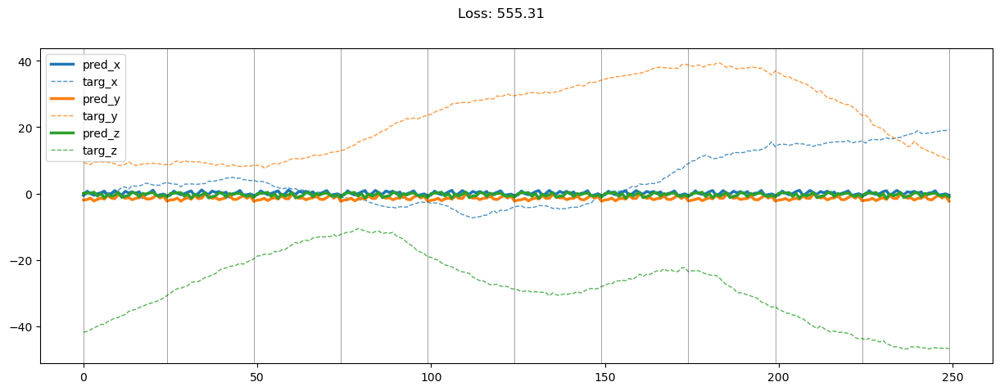

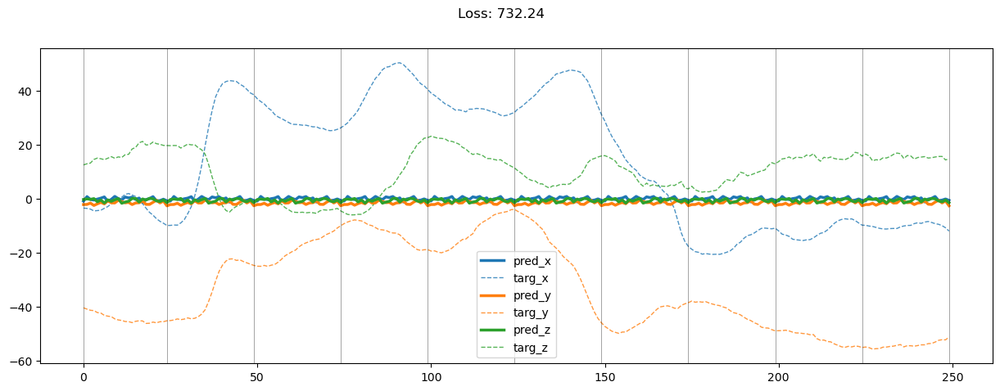

00000: train total loss:  642.846, pred loss:  642.846, valid total loss:  670.921, pred loss:  670.921


100%|██████████| 6/6 [00:00<00:00, 21.10it/s]


00001: train total loss:  625.264, pred loss:  625.264, valid total loss:  656.872, pred loss:  656.872


100%|██████████| 6/6 [00:00<00:00, 21.21it/s]


00002: train total loss:  617.053, pred loss:  617.053, valid total loss:  643.984, pred loss:  643.984


100%|██████████| 6/6 [00:00<00:00, 21.21it/s]


00003: train total loss:  605.970, pred loss:  605.970, valid total loss:  633.330, pred loss:  633.330


100%|██████████| 6/6 [00:00<00:00, 21.20it/s]


00004: train total loss:  583.955, pred loss:  583.955, valid total loss:  623.057, pred loss:  623.057


100%|██████████| 6/6 [00:00<00:00, 21.23it/s]


00005: train total loss:  577.891, pred loss:  577.891, valid total loss:  610.453, pred loss:  610.453


100%|██████████| 6/6 [00:00<00:00, 21.24it/s]


00006: train total loss:  555.225, pred loss:  555.225, valid total loss:  592.374, pred loss:  592.374


100%|██████████| 6/6 [00:00<00:00, 21.20it/s]


00007: train total loss:  543.048, pred loss:  543.048, valid total loss:  583.555, pred loss:  583.555


100%|██████████| 6/6 [00:00<00:00, 21.23it/s]


00008: train total loss:  519.490, pred loss:  519.490, valid total loss:  569.285, pred loss:  569.285


100%|██████████| 6/6 [00:00<00:00, 21.02it/s]


00009: train total loss:  502.420, pred loss:  502.420, valid total loss:  541.855, pred loss:  541.855


100%|██████████| 6/6 [00:00<00:00, 21.19it/s]


00010: train total loss:  482.983, pred loss:  482.983, valid total loss:  530.475, pred loss:  530.475


100%|██████████| 6/6 [00:00<00:00, 21.18it/s]


00011: train total loss:  459.926, pred loss:  459.926, valid total loss:  501.366, pred loss:  501.366


100%|██████████| 6/6 [00:00<00:00, 21.18it/s]


00012: train total loss:  435.912, pred loss:  435.912, valid total loss:  491.020, pred loss:  491.020


100%|██████████| 6/6 [00:00<00:00, 21.19it/s]


00013: train total loss:  413.150, pred loss:  413.150, valid total loss:  476.558, pred loss:  476.558


100%|██████████| 6/6 [00:00<00:00, 21.16it/s]


00014: train total loss:  391.229, pred loss:  391.229, valid total loss:  471.730, pred loss:  471.730


100%|██████████| 6/6 [00:00<00:00, 21.01it/s]


00015: train total loss:  370.851, pred loss:  370.851, valid total loss:  437.792, pred loss:  437.792


100%|██████████| 6/6 [00:00<00:00, 21.16it/s]


00016: train total loss:  351.707, pred loss:  351.707, valid total loss:  417.568, pred loss:  417.568


100%|██████████| 6/6 [00:00<00:00, 19.66it/s]


00017: train total loss:  329.953, pred loss:  329.953, valid total loss:  420.099, pred loss:  420.099


100%|██████████| 6/6 [00:00<00:00, 20.04it/s]


00018: train total loss:  312.514, pred loss:  312.514, valid total loss:  392.715, pred loss:  392.715


100%|██████████| 6/6 [00:00<00:00, 21.19it/s]


00019: train total loss:  296.548, pred loss:  296.548, valid total loss:  391.050, pred loss:  391.050


100%|██████████| 6/6 [00:00<00:00, 21.12it/s]


00020: train total loss:  277.038, pred loss:  277.038, valid total loss:  379.790, pred loss:  379.790


100%|██████████| 6/6 [00:00<00:00, 21.17it/s]


00021: train total loss:  262.725, pred loss:  262.725, valid total loss:  359.659, pred loss:  359.659


100%|██████████| 6/6 [00:00<00:00, 21.17it/s]


00022: train total loss:  249.575, pred loss:  249.575, valid total loss:  371.603, pred loss:  371.603


100%|██████████| 6/6 [00:00<00:00, 21.18it/s]


00023: train total loss:  235.972, pred loss:  235.972, valid total loss:  330.073, pred loss:  330.073


100%|██████████| 6/6 [00:00<00:00, 21.17it/s]


00024: train total loss:  222.797, pred loss:  222.797, valid total loss:  338.825, pred loss:  338.825


100%|██████████| 6/6 [00:00<00:00, 21.16it/s]


00025: train total loss:  214.314, pred loss:  214.314, valid total loss:  342.834, pred loss:  342.834


100%|██████████| 6/6 [00:00<00:00, 20.21it/s]


00026: train total loss:  201.070, pred loss:  201.070, valid total loss:  341.644, pred loss:  341.644


100%|██████████| 6/6 [00:00<00:00, 21.11it/s]


00027: train total loss:  189.892, pred loss:  189.892, valid total loss:  273.202, pred loss:  273.202


100%|██████████| 6/6 [00:00<00:00, 21.10it/s]


00028: train total loss:  178.453, pred loss:  178.453, valid total loss:  336.020, pred loss:  336.020


100%|██████████| 6/6 [00:00<00:00, 21.09it/s]


00029: train total loss:  167.481, pred loss:  167.481, valid total loss:  302.083, pred loss:  302.083


100%|██████████| 6/6 [00:00<00:00, 19.71it/s]


00030: train total loss:  158.643, pred loss:  158.643, valid total loss:  280.894, pred loss:  280.894


100%|██████████| 6/6 [00:00<00:00, 19.10it/s]


00031: train total loss:  148.615, pred loss:  148.615, valid total loss:  314.954, pred loss:  314.954


100%|██████████| 6/6 [00:00<00:00, 18.00it/s]


00032: train total loss:  139.899, pred loss:  139.899, valid total loss:  258.395, pred loss:  258.395


100%|██████████| 6/6 [00:00<00:00, 18.04it/s]


00033: train total loss:  130.248, pred loss:  130.248, valid total loss:  275.558, pred loss:  275.558


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


00034: train total loss:  124.811, pred loss:  124.811, valid total loss:  222.610, pred loss:  222.610


100%|██████████| 6/6 [00:00<00:00, 21.10it/s]


00035: train total loss:  118.966, pred loss:  118.966, valid total loss:  271.172, pred loss:  271.172


100%|██████████| 6/6 [00:00<00:00, 21.03it/s]


00036: train total loss:  111.836, pred loss:  111.836, valid total loss:  227.563, pred loss:  227.563


100%|██████████| 6/6 [00:00<00:00, 20.95it/s]


00037: train total loss:  106.651, pred loss:  106.651, valid total loss:  243.960, pred loss:  243.960


100%|██████████| 6/6 [00:00<00:00, 21.07it/s]


00038: train total loss:  105.193, pred loss:  105.193, valid total loss:  210.297, pred loss:  210.297


100%|██████████| 6/6 [00:00<00:00, 21.01it/s]


00039: train total loss:  106.091, pred loss:  106.091, valid total loss:  289.791, pred loss:  289.791


100%|██████████| 6/6 [00:00<00:00, 21.08it/s]


00040: train total loss:  101.344, pred loss:  101.344, valid total loss:  267.078, pred loss:  267.078


100%|██████████| 6/6 [00:00<00:00, 21.13it/s]


00041: train total loss:  93.180, pred loss:  93.180, valid total loss:  272.720, pred loss:  272.720


100%|██████████| 6/6 [00:00<00:00, 21.07it/s]


00042: train total loss:  88.206, pred loss:  88.206, valid total loss:  237.435, pred loss:  237.435


100%|██████████| 6/6 [00:00<00:00, 21.14it/s]


00043: train total loss:  84.699, pred loss:  84.699, valid total loss:  264.854, pred loss:  264.854


100%|██████████| 6/6 [00:00<00:00, 21.15it/s]


00044: train total loss:  78.873, pred loss:  78.873, valid total loss:  270.261, pred loss:  270.261


100%|██████████| 6/6 [00:00<00:00, 21.15it/s]


00045: train total loss:  76.058, pred loss:  76.058, valid total loss:  267.210, pred loss:  267.210


100%|██████████| 6/6 [00:00<00:00, 21.16it/s]


00046: train total loss:  72.796, pred loss:  72.796, valid total loss:  250.594, pred loss:  250.594


100%|██████████| 6/6 [00:00<00:00, 21.15it/s]


00047: train total loss:  68.630, pred loss:  68.630, valid total loss:  242.547, pred loss:  242.547


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


00048: train total loss:  65.660, pred loss:  65.660, valid total loss:  229.773, pred loss:  229.773


100%|██████████| 6/6 [00:00<00:00, 21.13it/s]


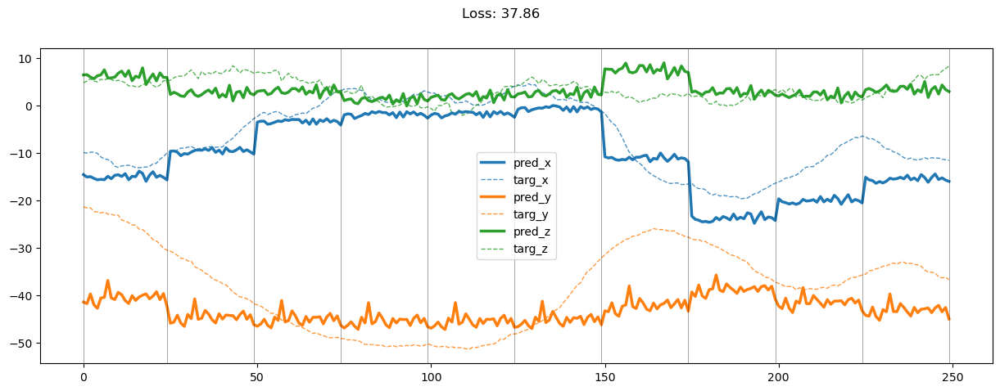

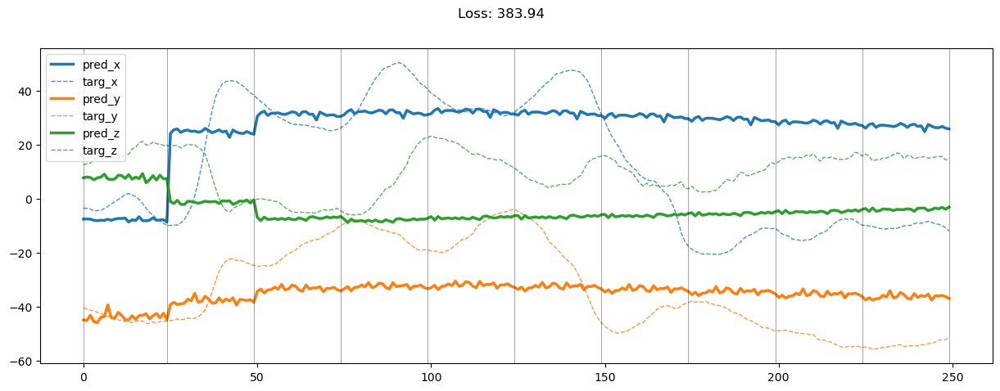

00049: train total loss:  63.037, pred loss:  63.037, valid total loss:  212.965, pred loss:  212.965


100%|██████████| 6/6 [00:00<00:00, 20.99it/s]


00050: train total loss:  61.582, pred loss:  61.582, valid total loss:  219.258, pred loss:  219.258


100%|██████████| 6/6 [00:00<00:00, 21.11it/s]


00051: train total loss:  59.983, pred loss:  59.983, valid total loss:  213.303, pred loss:  213.303


100%|██████████| 6/6 [00:00<00:00, 21.07it/s]


00052: train total loss:  58.329, pred loss:  58.329, valid total loss:  206.201, pred loss:  206.201


100%|██████████| 6/6 [00:00<00:00, 21.05it/s]


00053: train total loss:  57.536, pred loss:  57.536, valid total loss:  204.816, pred loss:  204.816


100%|██████████| 6/6 [00:00<00:00, 21.07it/s]


00054: train total loss:  58.426, pred loss:  58.426, valid total loss:  228.812, pred loss:  228.812


100%|██████████| 6/6 [00:00<00:00, 21.04it/s]


00055: train total loss:  58.174, pred loss:  58.174, valid total loss:  199.542, pred loss:  199.542


100%|██████████| 6/6 [00:00<00:00, 17.69it/s]


00056: train total loss:  56.605, pred loss:  56.605, valid total loss:  194.739, pred loss:  194.739


100%|██████████| 6/6 [00:00<00:00, 21.00it/s]


00057: train total loss:  56.057, pred loss:  56.057, valid total loss:  208.930, pred loss:  208.930


100%|██████████| 6/6 [00:00<00:00, 20.89it/s]


00058: train total loss:  53.311, pred loss:  53.311, valid total loss:  202.041, pred loss:  202.041


100%|██████████| 6/6 [00:00<00:00, 21.04it/s]


00059: train total loss:  51.140, pred loss:  51.140, valid total loss:  161.205, pred loss:  161.205


100%|██████████| 6/6 [00:00<00:00, 21.02it/s]


00060: train total loss:  49.818, pred loss:  49.818, valid total loss:  182.292, pred loss:  182.292


100%|██████████| 6/6 [00:00<00:00, 21.03it/s]


00061: train total loss:  48.332, pred loss:  48.332, valid total loss:  171.165, pred loss:  171.165


100%|██████████| 6/6 [00:00<00:00, 21.04it/s]


00062: train total loss:  47.862, pred loss:  47.862, valid total loss:  177.377, pred loss:  177.377


100%|██████████| 6/6 [00:00<00:00, 21.02it/s]


00063: train total loss:  46.723, pred loss:  46.723, valid total loss:  179.978, pred loss:  179.978


100%|██████████| 6/6 [00:00<00:00, 21.02it/s]


00064: train total loss:  45.714, pred loss:  45.714, valid total loss:  195.413, pred loss:  195.413


100%|██████████| 6/6 [00:00<00:00, 21.04it/s]


00065: train total loss:  45.129, pred loss:  45.129, valid total loss:  221.763, pred loss:  221.763


100%|██████████| 6/6 [00:00<00:00, 21.02it/s]


00066: train total loss:  45.335, pred loss:  45.335, valid total loss:  192.433, pred loss:  192.433


100%|██████████| 6/6 [00:00<00:00, 21.04it/s]


00067: train total loss:  44.733, pred loss:  44.733, valid total loss:  169.783, pred loss:  169.783


100%|██████████| 6/6 [00:00<00:00, 21.05it/s]


00068: train total loss:  42.539, pred loss:  42.539, valid total loss:  173.831, pred loss:  173.831


100%|██████████| 6/6 [00:00<00:00, 20.88it/s]


00069: train total loss:  41.280, pred loss:  41.280, valid total loss:  164.672, pred loss:  164.672


100%|██████████| 6/6 [00:00<00:00, 21.03it/s]


00070: train total loss:  41.085, pred loss:  41.085, valid total loss:  172.391, pred loss:  172.391


100%|██████████| 6/6 [00:00<00:00, 21.04it/s]


00071: train total loss:  40.689, pred loss:  40.689, valid total loss:  175.342, pred loss:  175.342


100%|██████████| 6/6 [00:00<00:00, 21.05it/s]


00072: train total loss:  39.453, pred loss:  39.453, valid total loss:  184.559, pred loss:  184.559


100%|██████████| 6/6 [00:00<00:00, 20.50it/s]


00073: train total loss:  38.388, pred loss:  38.388, valid total loss:  152.363, pred loss:  152.363


100%|██████████| 6/6 [00:00<00:00, 21.00it/s]


00074: train total loss:  37.837, pred loss:  37.837, valid total loss:  165.176, pred loss:  165.176


100%|██████████| 6/6 [00:00<00:00, 20.87it/s]


00075: train total loss:  38.283, pred loss:  38.283, valid total loss:  160.751, pred loss:  160.751


100%|██████████| 6/6 [00:00<00:00, 21.00it/s]


00076: train total loss:  37.111, pred loss:  37.111, valid total loss:  169.413, pred loss:  169.413


100%|██████████| 6/6 [00:00<00:00, 20.99it/s]


00077: train total loss:  35.679, pred loss:  35.679, valid total loss:  179.693, pred loss:  179.693


100%|██████████| 6/6 [00:00<00:00, 20.97it/s]


00078: train total loss:  35.622, pred loss:  35.622, valid total loss:  174.391, pred loss:  174.391


100%|██████████| 6/6 [00:00<00:00, 20.94it/s]


00079: train total loss:  34.569, pred loss:  34.569, valid total loss:  157.684, pred loss:  157.684


100%|██████████| 6/6 [00:00<00:00, 20.92it/s]


00080: train total loss:  34.230, pred loss:  34.230, valid total loss:  169.775, pred loss:  169.775


100%|██████████| 6/6 [00:00<00:00, 20.98it/s]


00081: train total loss:  34.572, pred loss:  34.572, valid total loss:  165.559, pred loss:  165.559


100%|██████████| 6/6 [00:00<00:00, 20.97it/s]


00082: train total loss:  34.390, pred loss:  34.390, valid total loss:  164.307, pred loss:  164.307


100%|██████████| 6/6 [00:00<00:00, 21.00it/s]


00083: train total loss:  34.747, pred loss:  34.747, valid total loss:  179.883, pred loss:  179.883


100%|██████████| 6/6 [00:00<00:00, 20.03it/s]


00084: train total loss:  34.488, pred loss:  34.488, valid total loss:  169.866, pred loss:  169.866


100%|██████████| 6/6 [00:00<00:00, 20.93it/s]


00085: train total loss:  33.242, pred loss:  33.242, valid total loss:  163.463, pred loss:  163.463


100%|██████████| 6/6 [00:00<00:00, 20.24it/s]


00086: train total loss:  33.627, pred loss:  33.627, valid total loss:  186.983, pred loss:  186.983


100%|██████████| 6/6 [00:00<00:00, 20.94it/s]


00087: train total loss:  33.196, pred loss:  33.196, valid total loss:  176.993, pred loss:  176.993


100%|██████████| 6/6 [00:00<00:00, 20.03it/s]


00088: train total loss:  32.631, pred loss:  32.631, valid total loss:  174.575, pred loss:  174.575


100%|██████████| 6/6 [00:00<00:00, 19.54it/s]


00089: train total loss:  33.103, pred loss:  33.103, valid total loss:  158.088, pred loss:  158.088


100%|██████████| 6/6 [00:00<00:00, 20.92it/s]


00090: train total loss:  32.355, pred loss:  32.355, valid total loss:  175.789, pred loss:  175.789


100%|██████████| 6/6 [00:00<00:00, 20.52it/s]


00091: train total loss:  32.357, pred loss:  32.357, valid total loss:  171.497, pred loss:  171.497


100%|██████████| 6/6 [00:00<00:00, 20.94it/s]


00092: train total loss:  31.881, pred loss:  31.881, valid total loss:  170.453, pred loss:  170.453


100%|██████████| 6/6 [00:00<00:00, 20.95it/s]


00093: train total loss:  31.986, pred loss:  31.986, valid total loss:  164.785, pred loss:  164.785


100%|██████████| 6/6 [00:00<00:00, 20.90it/s]


00094: train total loss:  31.684, pred loss:  31.684, valid total loss:  162.505, pred loss:  162.505


100%|██████████| 6/6 [00:00<00:00, 20.94it/s]


00095: train total loss:  30.868, pred loss:  30.868, valid total loss:  156.542, pred loss:  156.542


100%|██████████| 6/6 [00:00<00:00, 20.95it/s]


00096: train total loss:  30.925, pred loss:  30.925, valid total loss:  162.888, pred loss:  162.888


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00097: train total loss:  31.017, pred loss:  31.017, valid total loss:  159.674, pred loss:  159.674


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


00098: train total loss:  30.758, pred loss:  30.758, valid total loss:  158.352, pred loss:  158.352


100%|██████████| 6/6 [00:00<00:00, 20.85it/s]


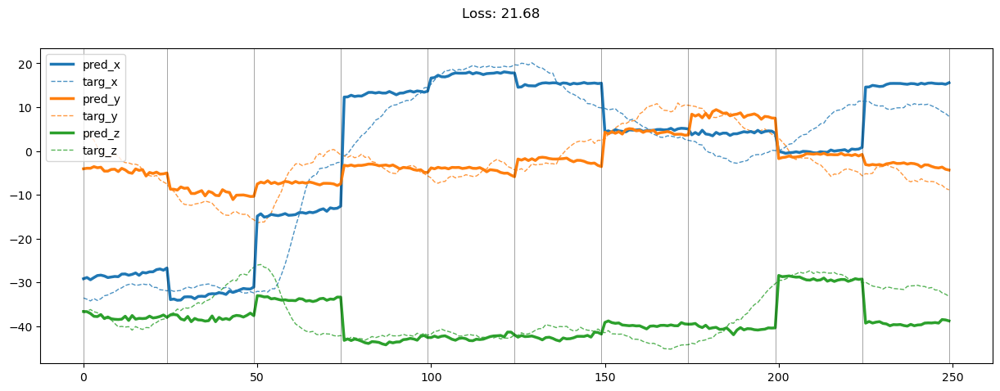

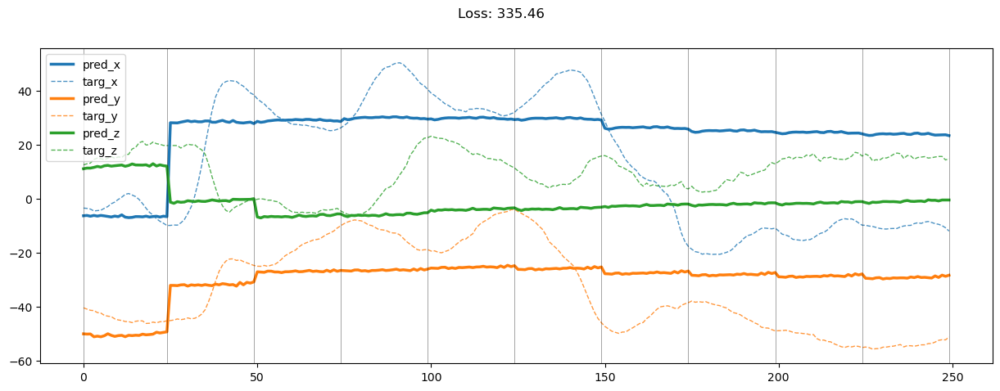

00099: train total loss:  32.822, pred loss:  32.822, valid total loss:  164.643, pred loss:  164.643


100%|██████████| 6/6 [00:00<00:00, 18.23it/s]


00100: train total loss:  32.615, pred loss:  32.615, valid total loss:  188.321, pred loss:  188.321


100%|██████████| 6/6 [00:00<00:00, 18.32it/s]


00101: train total loss:  32.353, pred loss:  32.353, valid total loss:  160.412, pred loss:  160.412


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


00102: train total loss:  31.521, pred loss:  31.521, valid total loss:  152.847, pred loss:  152.847


100%|██████████| 6/6 [00:00<00:00, 18.97it/s]


00103: train total loss:  30.786, pred loss:  30.786, valid total loss:  156.981, pred loss:  156.981


100%|██████████| 6/6 [00:00<00:00, 17.91it/s]


00104: train total loss:  30.083, pred loss:  30.083, valid total loss:  154.871, pred loss:  154.871


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00105: train total loss:  28.943, pred loss:  28.943, valid total loss:  153.878, pred loss:  153.878


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


00106: train total loss:  28.829, pred loss:  28.829, valid total loss:  150.262, pred loss:  150.262


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


00107: train total loss:  28.361, pred loss:  28.361, valid total loss:  148.745, pred loss:  148.745


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00108: train total loss:  27.682, pred loss:  27.682, valid total loss:  145.430, pred loss:  145.430


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


00109: train total loss:  27.210, pred loss:  27.210, valid total loss:  130.307, pred loss:  130.307


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00110: train total loss:  27.445, pred loss:  27.445, valid total loss:  139.993, pred loss:  139.993


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


00111: train total loss:  27.909, pred loss:  27.909, valid total loss:  144.600, pred loss:  144.600


100%|██████████| 6/6 [00:00<00:00, 20.52it/s]


00112: train total loss:  28.315, pred loss:  28.315, valid total loss:  135.449, pred loss:  135.449


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


00113: train total loss:  28.574, pred loss:  28.574, valid total loss:  142.671, pred loss:  142.671


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


00114: train total loss:  27.490, pred loss:  27.490, valid total loss:  170.324, pred loss:  170.324


100%|██████████| 6/6 [00:00<00:00, 20.90it/s]


00115: train total loss:  27.413, pred loss:  27.413, valid total loss:  143.343, pred loss:  143.343


100%|██████████| 6/6 [00:00<00:00, 20.90it/s]


00116: train total loss:  27.396, pred loss:  27.396, valid total loss:  140.639, pred loss:  140.639


100%|██████████| 6/6 [00:00<00:00, 20.90it/s]


00117: train total loss:  27.042, pred loss:  27.042, valid total loss:  149.496, pred loss:  149.496


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00118: train total loss:  27.477, pred loss:  27.477, valid total loss:  138.104, pred loss:  138.104


100%|██████████| 6/6 [00:00<00:00, 20.88it/s]


00119: train total loss:  26.360, pred loss:  26.360, valid total loss:  137.945, pred loss:  137.945


100%|██████████| 6/6 [00:00<00:00, 20.89it/s]


00120: train total loss:  25.731, pred loss:  25.731, valid total loss:  133.055, pred loss:  133.055


100%|██████████| 6/6 [00:00<00:00, 20.90it/s]


00121: train total loss:  25.340, pred loss:  25.340, valid total loss:  137.572, pred loss:  137.572


100%|██████████| 6/6 [00:00<00:00, 20.88it/s]


00122: train total loss:  25.141, pred loss:  25.141, valid total loss:  131.981, pred loss:  131.981


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


00123: train total loss:  25.340, pred loss:  25.340, valid total loss:  132.698, pred loss:  132.698


100%|██████████| 6/6 [00:00<00:00, 20.87it/s]


00124: train total loss:  25.611, pred loss:  25.611, valid total loss:  136.575, pred loss:  136.575


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


00125: train total loss:  25.267, pred loss:  25.267, valid total loss:  141.460, pred loss:  141.460


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


00126: train total loss:  24.892, pred loss:  24.892, valid total loss:  152.260, pred loss:  152.260


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


00127: train total loss:  24.939, pred loss:  24.939, valid total loss:  143.218, pred loss:  143.218


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


00128: train total loss:  24.974, pred loss:  24.974, valid total loss:  147.456, pred loss:  147.456


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


00129: train total loss:  24.703, pred loss:  24.703, valid total loss:  155.005, pred loss:  155.005


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


00130: train total loss:  24.793, pred loss:  24.793, valid total loss:  139.038, pred loss:  139.038


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


00131: train total loss:  24.765, pred loss:  24.765, valid total loss:  123.132, pred loss:  123.132


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


00132: train total loss:  24.638, pred loss:  24.638, valid total loss:  140.249, pred loss:  140.249


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00133: train total loss:  24.833, pred loss:  24.833, valid total loss:  138.372, pred loss:  138.372


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00134: train total loss:  24.317, pred loss:  24.317, valid total loss:  142.183, pred loss:  142.183


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00135: train total loss:  24.679, pred loss:  24.679, valid total loss:  147.478, pred loss:  147.478


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


00136: train total loss:  24.127, pred loss:  24.127, valid total loss:  152.733, pred loss:  152.733


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00137: train total loss:  24.387, pred loss:  24.387, valid total loss:  148.851, pred loss:  148.851


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


00138: train total loss:  24.151, pred loss:  24.151, valid total loss:  134.453, pred loss:  134.453


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


00139: train total loss:  23.995, pred loss:  23.995, valid total loss:  125.423, pred loss:  125.423


100%|██████████| 6/6 [00:00<00:00, 20.34it/s]


00140: train total loss:  23.661, pred loss:  23.661, valid total loss:  134.389, pred loss:  134.389


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00141: train total loss:  23.203, pred loss:  23.203, valid total loss:  157.766, pred loss:  157.766


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00142: train total loss:  23.087, pred loss:  23.087, valid total loss:  136.956, pred loss:  136.956


100%|██████████| 6/6 [00:00<00:00, 20.55it/s]


00143: train total loss:  22.422, pred loss:  22.422, valid total loss:  135.064, pred loss:  135.064


100%|██████████| 6/6 [00:00<00:00, 20.55it/s]


00144: train total loss:  22.678, pred loss:  22.678, valid total loss:  131.004, pred loss:  131.004


100%|██████████| 6/6 [00:00<00:00, 19.98it/s]


00145: train total loss:  22.459, pred loss:  22.459, valid total loss:  146.550, pred loss:  146.550


100%|██████████| 6/6 [00:00<00:00, 20.22it/s]


00146: train total loss:  22.892, pred loss:  22.892, valid total loss:  136.073, pred loss:  136.073


100%|██████████| 6/6 [00:00<00:00, 18.08it/s]


00147: train total loss:  23.085, pred loss:  23.085, valid total loss:  128.737, pred loss:  128.737


100%|██████████| 6/6 [00:00<00:00, 17.89it/s]


00148: train total loss:  22.729, pred loss:  22.729, valid total loss:  147.081, pred loss:  147.081


100%|██████████| 6/6 [00:00<00:00, 17.91it/s]


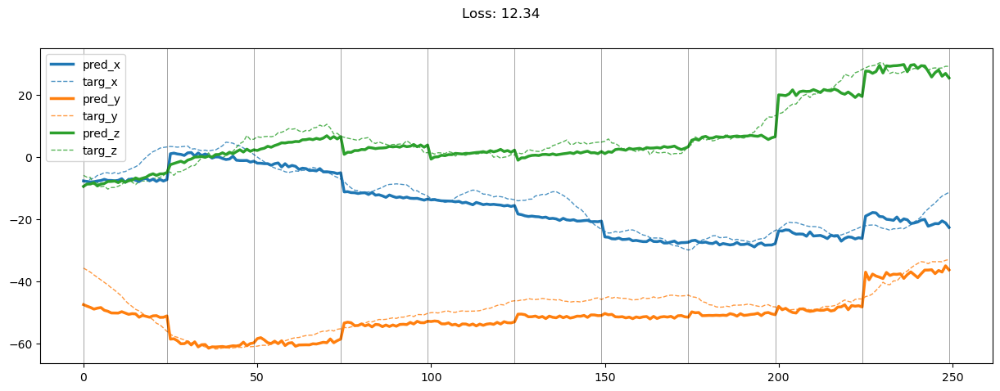

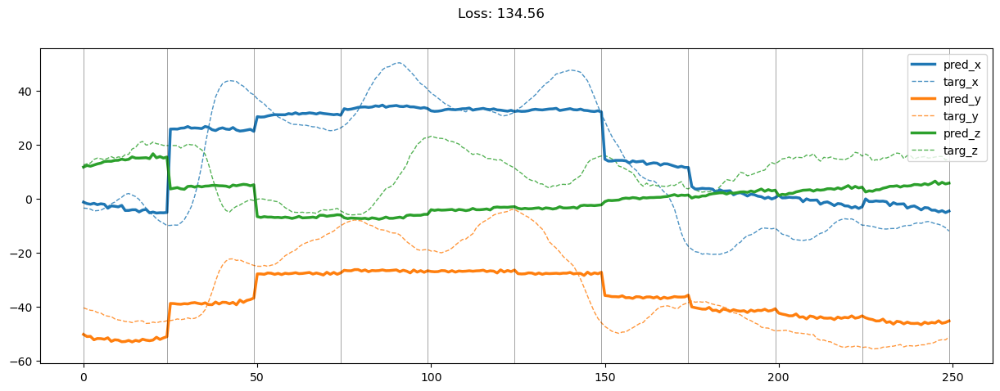

00149: train total loss:  22.503, pred loss:  22.503, valid total loss:  134.507, pred loss:  134.507


100%|██████████| 6/6 [00:00<00:00, 19.48it/s]


00150: train total loss:  22.479, pred loss:  22.479, valid total loss:  133.922, pred loss:  133.922


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


00151: train total loss:  22.075, pred loss:  22.075, valid total loss:  122.054, pred loss:  122.054


100%|██████████| 6/6 [00:00<00:00, 20.48it/s]


00152: train total loss:  22.192, pred loss:  22.192, valid total loss:  140.545, pred loss:  140.545


100%|██████████| 6/6 [00:00<00:00, 20.39it/s]


00153: train total loss:  21.868, pred loss:  21.868, valid total loss:  140.267, pred loss:  140.267


100%|██████████| 6/6 [00:00<00:00, 20.26it/s]


00154: train total loss:  21.569, pred loss:  21.569, valid total loss:  138.716, pred loss:  138.716


100%|██████████| 6/6 [00:00<00:00, 19.53it/s]


00155: train total loss:  21.855, pred loss:  21.855, valid total loss:  139.578, pred loss:  139.578


100%|██████████| 6/6 [00:00<00:00, 20.27it/s]


00156: train total loss:  21.761, pred loss:  21.761, valid total loss:  138.124, pred loss:  138.124


100%|██████████| 6/6 [00:00<00:00, 19.97it/s]


00157: train total loss:  21.598, pred loss:  21.598, valid total loss:  141.971, pred loss:  141.971


100%|██████████| 6/6 [00:00<00:00, 20.04it/s]


00158: train total loss:  21.143, pred loss:  21.143, valid total loss:  127.814, pred loss:  127.814


100%|██████████| 6/6 [00:00<00:00, 19.99it/s]


00159: train total loss:  21.788, pred loss:  21.788, valid total loss:  117.008, pred loss:  117.008


100%|██████████| 6/6 [00:00<00:00, 20.09it/s]


00160: train total loss:  21.441, pred loss:  21.441, valid total loss:  125.308, pred loss:  125.308


100%|██████████| 6/6 [00:00<00:00, 20.44it/s]


00161: train total loss:  21.220, pred loss:  21.220, valid total loss:  127.108, pred loss:  127.108


100%|██████████| 6/6 [00:00<00:00, 20.58it/s]


00162: train total loss:  21.029, pred loss:  21.029, valid total loss:  131.626, pred loss:  131.626


100%|██████████| 6/6 [00:00<00:00, 18.02it/s]


00163: train total loss:  21.040, pred loss:  21.040, valid total loss:  125.923, pred loss:  125.923


100%|██████████| 6/6 [00:00<00:00, 19.18it/s]


00164: train total loss:  20.449, pred loss:  20.449, valid total loss:  126.460, pred loss:  126.460


100%|██████████| 6/6 [00:00<00:00, 20.09it/s]


00165: train total loss:  20.543, pred loss:  20.543, valid total loss:  123.843, pred loss:  123.843


100%|██████████| 6/6 [00:00<00:00, 20.27it/s]


00166: train total loss:  20.012, pred loss:  20.012, valid total loss:  123.161, pred loss:  123.161


100%|██████████| 6/6 [00:00<00:00, 20.34it/s]


00167: train total loss:  20.828, pred loss:  20.828, valid total loss:  127.218, pred loss:  127.218


100%|██████████| 6/6 [00:00<00:00, 19.67it/s]


00168: train total loss:  20.109, pred loss:  20.109, valid total loss:  119.817, pred loss:  119.817


100%|██████████| 6/6 [00:00<00:00, 17.72it/s]


00169: train total loss:  19.619, pred loss:  19.619, valid total loss:  115.699, pred loss:  115.699


100%|██████████| 6/6 [00:00<00:00, 20.08it/s]


00170: train total loss:  19.577, pred loss:  19.577, valid total loss:  118.437, pred loss:  118.437


100%|██████████| 6/6 [00:00<00:00, 19.48it/s]


00171: train total loss:  19.294, pred loss:  19.294, valid total loss:  114.549, pred loss:  114.549


100%|██████████| 6/6 [00:00<00:00, 19.98it/s]


00172: train total loss:  19.605, pred loss:  19.605, valid total loss:  120.923, pred loss:  120.923


100%|██████████| 6/6 [00:00<00:00, 19.99it/s]


00173: train total loss:  19.216, pred loss:  19.216, valid total loss:  121.210, pred loss:  121.210


100%|██████████| 6/6 [00:00<00:00, 20.00it/s]


00174: train total loss:  19.251, pred loss:  19.251, valid total loss:  119.725, pred loss:  119.725


100%|██████████| 6/6 [00:00<00:00, 20.31it/s]


00175: train total loss:  19.009, pred loss:  19.009, valid total loss:  120.645, pred loss:  120.645


100%|██████████| 6/6 [00:00<00:00, 19.90it/s]


00176: train total loss:  19.009, pred loss:  19.009, valid total loss:  116.568, pred loss:  116.568


100%|██████████| 6/6 [00:00<00:00, 20.00it/s]


00177: train total loss:  19.385, pred loss:  19.385, valid total loss:  121.151, pred loss:  121.151


100%|██████████| 6/6 [00:00<00:00, 19.96it/s]


00178: train total loss:  19.103, pred loss:  19.103, valid total loss:  113.914, pred loss:  113.914


100%|██████████| 6/6 [00:00<00:00, 20.06it/s]


00179: train total loss:  19.016, pred loss:  19.016, valid total loss:  118.771, pred loss:  118.771


100%|██████████| 6/6 [00:00<00:00, 19.59it/s]


00180: train total loss:  19.194, pred loss:  19.194, valid total loss:  125.488, pred loss:  125.488


100%|██████████| 6/6 [00:00<00:00, 19.29it/s]


00181: train total loss:  19.007, pred loss:  19.007, valid total loss:  113.259, pred loss:  113.259


100%|██████████| 6/6 [00:00<00:00, 20.24it/s]


00182: train total loss:  18.894, pred loss:  18.894, valid total loss:  119.836, pred loss:  119.836


100%|██████████| 6/6 [00:00<00:00, 18.23it/s]


00183: train total loss:  19.101, pred loss:  19.101, valid total loss:  120.363, pred loss:  120.363


100%|██████████| 6/6 [00:00<00:00, 20.51it/s]


00184: train total loss:  19.340, pred loss:  19.340, valid total loss:  117.276, pred loss:  117.276


100%|██████████| 6/6 [00:00<00:00, 19.50it/s]


00185: train total loss:  18.503, pred loss:  18.503, valid total loss:  132.948, pred loss:  132.948


100%|██████████| 6/6 [00:00<00:00, 20.32it/s]


00186: train total loss:  18.109, pred loss:  18.109, valid total loss:  125.254, pred loss:  125.254


100%|██████████| 6/6 [00:00<00:00, 19.86it/s]


00187: train total loss:  17.737, pred loss:  17.737, valid total loss:  120.669, pred loss:  120.669


100%|██████████| 6/6 [00:00<00:00, 18.25it/s]


00188: train total loss:  17.768, pred loss:  17.768, valid total loss:  118.368, pred loss:  118.368


100%|██████████| 6/6 [00:00<00:00, 19.88it/s]


00189: train total loss:  17.384, pred loss:  17.384, valid total loss:  121.627, pred loss:  121.627


100%|██████████| 6/6 [00:00<00:00, 19.97it/s]


00190: train total loss:  17.561, pred loss:  17.561, valid total loss:  115.736, pred loss:  115.736


100%|██████████| 6/6 [00:00<00:00, 20.39it/s]


00191: train total loss:  17.280, pred loss:  17.280, valid total loss:  125.310, pred loss:  125.310


100%|██████████| 6/6 [00:00<00:00, 20.28it/s]


00192: train total loss:  17.305, pred loss:  17.305, valid total loss:  125.714, pred loss:  125.714


100%|██████████| 6/6 [00:00<00:00, 20.01it/s]


00193: train total loss:  17.312, pred loss:  17.312, valid total loss:  123.753, pred loss:  123.753


100%|██████████| 6/6 [00:00<00:00, 20.34it/s]


00194: train total loss:  16.840, pred loss:  16.840, valid total loss:  132.461, pred loss:  132.461


100%|██████████| 6/6 [00:00<00:00, 20.47it/s]


00195: train total loss:  16.628, pred loss:  16.628, valid total loss:  122.606, pred loss:  122.606


100%|██████████| 6/6 [00:00<00:00, 19.93it/s]


00196: train total loss:  16.554, pred loss:  16.554, valid total loss:  135.419, pred loss:  135.419


100%|██████████| 6/6 [00:00<00:00, 20.31it/s]


00197: train total loss:  16.673, pred loss:  16.673, valid total loss:  125.910, pred loss:  125.910


100%|██████████| 6/6 [00:00<00:00, 20.31it/s]


00198: train total loss:  16.400, pred loss:  16.400, valid total loss:  126.501, pred loss:  126.501


100%|██████████| 6/6 [00:00<00:00, 20.27it/s]


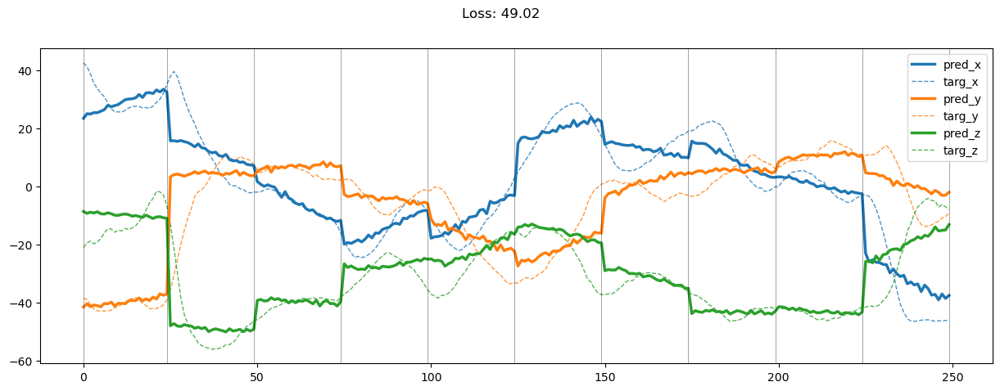

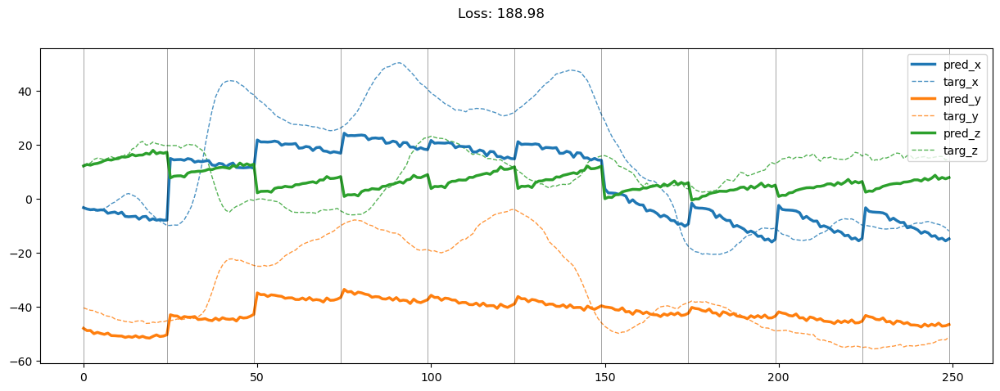

00199: train total loss:  16.142, pred loss:  16.142, valid total loss:  116.987, pred loss:  116.987


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


00200: train total loss:  15.769, pred loss:  15.769, valid total loss:  125.348, pred loss:  125.348


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00201: train total loss:  15.524, pred loss:  15.524, valid total loss:  120.735, pred loss:  120.735


100%|██████████| 6/6 [00:00<00:00, 20.48it/s]


00202: train total loss:  15.485, pred loss:  15.485, valid total loss:  118.119, pred loss:  118.119


100%|██████████| 6/6 [00:00<00:00, 20.52it/s]


00203: train total loss:  15.954, pred loss:  15.954, valid total loss:  120.909, pred loss:  120.909


100%|██████████| 6/6 [00:00<00:00, 19.82it/s]


00204: train total loss:  15.753, pred loss:  15.753, valid total loss:  131.209, pred loss:  131.209


100%|██████████| 6/6 [00:00<00:00, 20.25it/s]


00205: train total loss:  15.610, pred loss:  15.610, valid total loss:  119.200, pred loss:  119.200


100%|██████████| 6/6 [00:00<00:00, 20.19it/s]


00206: train total loss:  16.004, pred loss:  16.004, valid total loss:  122.573, pred loss:  122.573


100%|██████████| 6/6 [00:00<00:00, 17.62it/s]


00207: train total loss:  16.048, pred loss:  16.048, valid total loss:  115.687, pred loss:  115.687


100%|██████████| 6/6 [00:00<00:00, 18.27it/s]


00208: train total loss:  15.459, pred loss:  15.459, valid total loss:  121.233, pred loss:  121.233


100%|██████████| 6/6 [00:00<00:00, 20.31it/s]


00209: train total loss:  15.636, pred loss:  15.636, valid total loss:  117.999, pred loss:  117.999


100%|██████████| 6/6 [00:00<00:00, 20.13it/s]


00210: train total loss:  15.566, pred loss:  15.566, valid total loss:  115.217, pred loss:  115.217


100%|██████████| 6/6 [00:00<00:00, 20.47it/s]


00211: train total loss:  15.549, pred loss:  15.549, valid total loss:  116.701, pred loss:  116.701


100%|██████████| 6/6 [00:00<00:00, 19.68it/s]


00212: train total loss:  15.688, pred loss:  15.688, valid total loss:  127.405, pred loss:  127.405


100%|██████████| 6/6 [00:00<00:00, 20.29it/s]


00213: train total loss:  14.806, pred loss:  14.806, valid total loss:  122.604, pred loss:  122.604


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


00214: train total loss:  14.768, pred loss:  14.768, valid total loss:  123.356, pred loss:  123.356


100%|██████████| 6/6 [00:00<00:00, 20.36it/s]


00215: train total loss:  14.936, pred loss:  14.936, valid total loss:  131.444, pred loss:  131.444


100%|██████████| 6/6 [00:00<00:00, 20.49it/s]


00216: train total loss:  15.102, pred loss:  15.102, valid total loss:  122.695, pred loss:  122.695


100%|██████████| 6/6 [00:00<00:00, 20.41it/s]


00217: train total loss:  14.382, pred loss:  14.382, valid total loss:  123.796, pred loss:  123.796


100%|██████████| 6/6 [00:00<00:00, 19.57it/s]


00218: train total loss:  14.268, pred loss:  14.268, valid total loss:  127.232, pred loss:  127.232


100%|██████████| 6/6 [00:00<00:00, 20.24it/s]


00219: train total loss:  14.279, pred loss:  14.279, valid total loss:  123.369, pred loss:  123.369


100%|██████████| 6/6 [00:00<00:00, 20.29it/s]


00220: train total loss:  13.876, pred loss:  13.876, valid total loss:  124.853, pred loss:  124.853


100%|██████████| 6/6 [00:00<00:00, 20.37it/s]


00221: train total loss:  14.130, pred loss:  14.130, valid total loss:  116.033, pred loss:  116.033


100%|██████████| 6/6 [00:00<00:00, 20.48it/s]


00222: train total loss:  13.530, pred loss:  13.530, valid total loss:  123.271, pred loss:  123.271


100%|██████████| 6/6 [00:00<00:00, 20.31it/s]


00223: train total loss:  13.940, pred loss:  13.940, valid total loss:  134.282, pred loss:  134.282


100%|██████████| 6/6 [00:00<00:00, 19.39it/s]


00224: train total loss:  13.915, pred loss:  13.915, valid total loss:  124.041, pred loss:  124.041


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


00225: train total loss:  13.362, pred loss:  13.362, valid total loss:  114.637, pred loss:  114.637


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


00226: train total loss:  13.352, pred loss:  13.352, valid total loss:  119.528, pred loss:  119.528


100%|██████████| 6/6 [00:00<00:00, 20.53it/s]


00227: train total loss:  13.174, pred loss:  13.174, valid total loss:  121.618, pred loss:  121.618


100%|██████████| 6/6 [00:00<00:00, 19.35it/s]


00228: train total loss:  13.018, pred loss:  13.018, valid total loss:  116.668, pred loss:  116.668


100%|██████████| 6/6 [00:00<00:00, 19.82it/s]


00229: train total loss:  13.020, pred loss:  13.020, valid total loss:  137.309, pred loss:  137.309


100%|██████████| 6/6 [00:00<00:00, 20.34it/s]


00230: train total loss:  12.650, pred loss:  12.650, valid total loss:  124.387, pred loss:  124.387


100%|██████████| 6/6 [00:00<00:00, 20.58it/s]


00231: train total loss:  12.806, pred loss:  12.806, valid total loss:  122.622, pred loss:  122.622


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


00232: train total loss:  12.863, pred loss:  12.863, valid total loss:  120.453, pred loss:  120.453


100%|██████████| 6/6 [00:00<00:00, 20.27it/s]


00233: train total loss:  12.911, pred loss:  12.911, valid total loss:  127.097, pred loss:  127.097


100%|██████████| 6/6 [00:00<00:00, 19.44it/s]


00234: train total loss:  12.483, pred loss:  12.483, valid total loss:  125.863, pred loss:  125.863


100%|██████████| 6/6 [00:00<00:00, 19.45it/s]


00235: train total loss:  12.672, pred loss:  12.672, valid total loss:  119.398, pred loss:  119.398


100%|██████████| 6/6 [00:00<00:00, 20.54it/s]


00236: train total loss:  12.201, pred loss:  12.201, valid total loss:  123.307, pred loss:  123.307


100%|██████████| 6/6 [00:00<00:00, 19.52it/s]


00237: train total loss:  12.061, pred loss:  12.061, valid total loss:  117.388, pred loss:  117.388


100%|██████████| 6/6 [00:00<00:00, 19.37it/s]


00238: train total loss:  12.039, pred loss:  12.039, valid total loss:  117.980, pred loss:  117.980


100%|██████████| 6/6 [00:00<00:00, 20.56it/s]


00239: train total loss:  11.926, pred loss:  11.926, valid total loss:  122.595, pred loss:  122.595


100%|██████████| 6/6 [00:00<00:00, 19.56it/s]


00240: train total loss:  11.966, pred loss:  11.966, valid total loss:  117.361, pred loss:  117.361


100%|██████████| 6/6 [00:00<00:00, 17.79it/s]


00241: train total loss:  11.797, pred loss:  11.797, valid total loss:  119.120, pred loss:  119.120


100%|██████████| 6/6 [00:00<00:00, 20.08it/s]


00242: train total loss:  11.880, pred loss:  11.880, valid total loss:  120.471, pred loss:  120.471


100%|██████████| 6/6 [00:00<00:00, 20.50it/s]


00243: train total loss:  11.595, pred loss:  11.595, valid total loss:  120.219, pred loss:  120.219


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


00244: train total loss:  11.580, pred loss:  11.580, valid total loss:  119.952, pred loss:  119.952


100%|██████████| 6/6 [00:00<00:00, 20.58it/s]


00245: train total loss:  11.404, pred loss:  11.404, valid total loss:  118.817, pred loss:  118.817


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00246: train total loss:  11.115, pred loss:  11.115, valid total loss:  128.128, pred loss:  128.128


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00247: train total loss:  11.071, pred loss:  11.071, valid total loss:  127.257, pred loss:  127.257


100%|██████████| 6/6 [00:00<00:00, 19.56it/s]


00248: train total loss:  11.359, pred loss:  11.359, valid total loss:  120.241, pred loss:  120.241


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


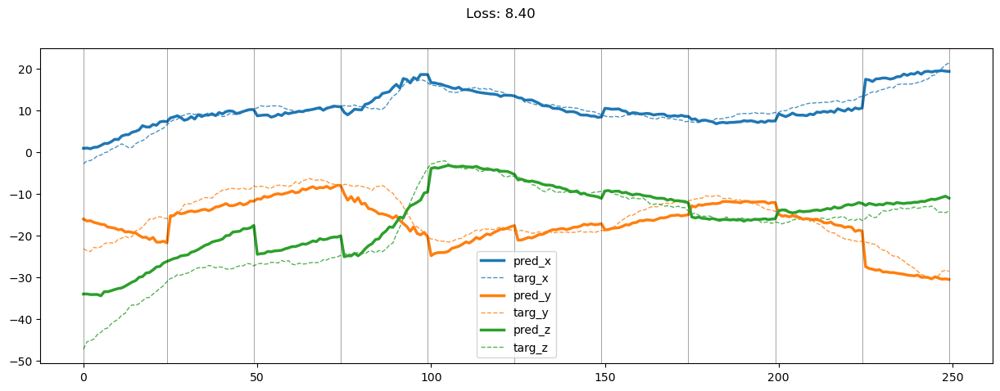

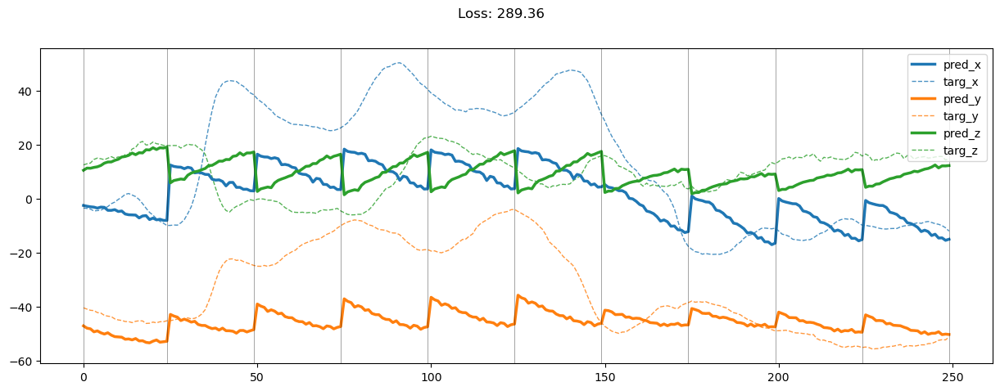

00249: train total loss:  11.188, pred loss:  11.188, valid total loss:  126.358, pred loss:  126.358


100%|██████████| 6/6 [00:00<00:00, 20.15it/s]


00250: train total loss:  11.308, pred loss:  11.308, valid total loss:  116.857, pred loss:  116.857


100%|██████████| 6/6 [00:00<00:00, 20.53it/s]


00251: train total loss:  11.285, pred loss:  11.285, valid total loss:  115.980, pred loss:  115.980


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


00252: train total loss:  11.109, pred loss:  11.109, valid total loss:  122.331, pred loss:  122.331


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00253: train total loss:  11.067, pred loss:  11.067, valid total loss:  123.900, pred loss:  123.900


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


00254: train total loss:  11.309, pred loss:  11.309, valid total loss:  120.111, pred loss:  120.111


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


00255: train total loss:  11.026, pred loss:  11.026, valid total loss:  126.595, pred loss:  126.595


100%|██████████| 6/6 [00:00<00:00, 20.36it/s]


00256: train total loss:  11.005, pred loss:  11.005, valid total loss:  122.787, pred loss:  122.787


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


00257: train total loss:  10.938, pred loss:  10.938, valid total loss:  129.293, pred loss:  129.293


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


00258: train total loss:  10.722, pred loss:  10.722, valid total loss:  121.293, pred loss:  121.293


100%|██████████| 6/6 [00:00<00:00, 20.55it/s]


00259: train total loss:  10.665, pred loss:  10.665, valid total loss:  123.725, pred loss:  123.725


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


00260: train total loss:  10.689, pred loss:  10.689, valid total loss:  131.433, pred loss:  131.433


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


00261: train total loss:  10.639, pred loss:  10.639, valid total loss:  119.880, pred loss:  119.880


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


00262: train total loss:  10.426, pred loss:  10.426, valid total loss:  115.125, pred loss:  115.125


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00263: train total loss:  10.091, pred loss:  10.091, valid total loss:  117.412, pred loss:  117.412


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00264: train total loss:  10.092, pred loss:  10.092, valid total loss:  124.310, pred loss:  124.310


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


00265: train total loss:  10.054, pred loss:  10.054, valid total loss:  128.863, pred loss:  128.863


100%|██████████| 6/6 [00:00<00:00, 20.43it/s]


00266: train total loss:  10.188, pred loss:  10.188, valid total loss:  120.854, pred loss:  120.854


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


00267: train total loss:  9.781, pred loss:  9.781, valid total loss:  123.921, pred loss:  123.921


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00268: train total loss:  9.645, pred loss:  9.645, valid total loss:  122.488, pred loss:  122.488


100%|██████████| 6/6 [00:00<00:00, 19.59it/s]


00269: train total loss:  9.691, pred loss:  9.691, valid total loss:  116.351, pred loss:  116.351


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00270: train total loss:  9.630, pred loss:  9.630, valid total loss:  120.156, pred loss:  120.156


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00271: train total loss:  9.818, pred loss:  9.818, valid total loss:  127.806, pred loss:  127.806


100%|██████████| 6/6 [00:00<00:00, 20.46it/s]


00272: train total loss:  9.595, pred loss:  9.595, valid total loss:  124.134, pred loss:  124.134


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00273: train total loss:  9.414, pred loss:  9.414, valid total loss:  124.351, pred loss:  124.351


100%|██████████| 6/6 [00:00<00:00, 20.48it/s]


00274: train total loss:  9.494, pred loss:  9.494, valid total loss:  123.531, pred loss:  123.531


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


00275: train total loss:  9.530, pred loss:  9.530, valid total loss:  121.009, pred loss:  121.009


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


00276: train total loss:  9.396, pred loss:  9.396, valid total loss:  128.102, pred loss:  128.102


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00277: train total loss:  9.734, pred loss:  9.734, valid total loss:  123.739, pred loss:  123.739


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


00278: train total loss:  9.879, pred loss:  9.879, valid total loss:  124.587, pred loss:  124.587


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


00279: train total loss:  9.904, pred loss:  9.904, valid total loss:  117.655, pred loss:  117.655


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


00280: train total loss:  9.752, pred loss:  9.752, valid total loss:  121.656, pred loss:  121.656


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00281: train total loss:  9.589, pred loss:  9.589, valid total loss:  120.533, pred loss:  120.533


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


00282: train total loss:  9.385, pred loss:  9.385, valid total loss:  124.806, pred loss:  124.806


100%|██████████| 6/6 [00:00<00:00, 20.23it/s]


00283: train total loss:  9.346, pred loss:  9.346, valid total loss:  120.499, pred loss:  120.499


100%|██████████| 6/6 [00:00<00:00, 19.20it/s]


00284: train total loss:  9.573, pred loss:  9.573, valid total loss:  123.663, pred loss:  123.663


100%|██████████| 6/6 [00:00<00:00, 20.39it/s]


00285: train total loss:  9.292, pred loss:  9.292, valid total loss:  113.891, pred loss:  113.891


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00286: train total loss:  9.616, pred loss:  9.616, valid total loss:  122.270, pred loss:  122.270


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00287: train total loss:  9.406, pred loss:  9.406, valid total loss:  129.944, pred loss:  129.944


100%|██████████| 6/6 [00:00<00:00, 20.49it/s]


00288: train total loss:  9.211, pred loss:  9.211, valid total loss:  121.494, pred loss:  121.494


100%|██████████| 6/6 [00:00<00:00, 20.53it/s]


00289: train total loss:  9.095, pred loss:  9.095, valid total loss:  119.692, pred loss:  119.692


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


00290: train total loss:  9.074, pred loss:  9.074, valid total loss:  127.918, pred loss:  127.918


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


00291: train total loss:  9.028, pred loss:  9.028, valid total loss:  122.480, pred loss:  122.480


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


00292: train total loss:  8.837, pred loss:  8.837, valid total loss:  118.514, pred loss:  118.514


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


00293: train total loss:  8.742, pred loss:  8.742, valid total loss:  118.938, pred loss:  118.938


100%|██████████| 6/6 [00:00<00:00, 19.14it/s]


00294: train total loss:  8.837, pred loss:  8.837, valid total loss:  123.729, pred loss:  123.729


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


00295: train total loss:  8.548, pred loss:  8.548, valid total loss:  119.968, pred loss:  119.968


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00296: train total loss:  8.454, pred loss:  8.454, valid total loss:  114.072, pred loss:  114.072


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00297: train total loss:  8.871, pred loss:  8.871, valid total loss:  116.922, pred loss:  116.922


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


00298: train total loss:  8.437, pred loss:  8.437, valid total loss:  115.073, pred loss:  115.073


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


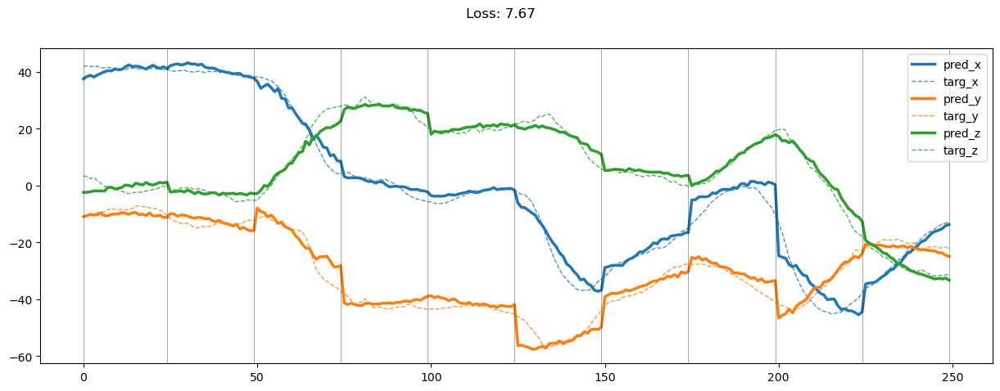

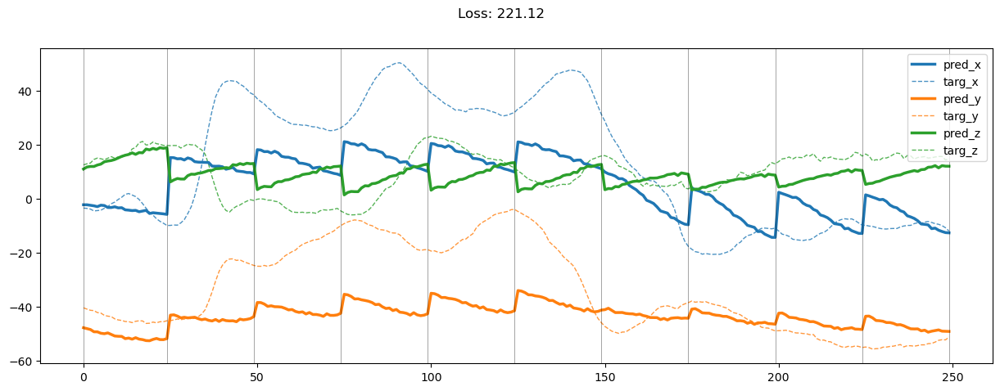

00299: train total loss:  8.710, pred loss:  8.710, valid total loss:  116.890, pred loss:  116.890


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00300: train total loss:  8.558, pred loss:  8.558, valid total loss:  121.105, pred loss:  121.105


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00301: train total loss:  8.532, pred loss:  8.532, valid total loss:  120.320, pred loss:  120.320


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


00302: train total loss:  8.602, pred loss:  8.602, valid total loss:  119.404, pred loss:  119.404


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


00303: train total loss:  8.416, pred loss:  8.416, valid total loss:  122.496, pred loss:  122.496


100%|██████████| 6/6 [00:00<00:00, 20.36it/s]


00304: train total loss:  8.225, pred loss:  8.225, valid total loss:  120.966, pred loss:  120.966


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


00305: train total loss:  8.224, pred loss:  8.224, valid total loss:  118.075, pred loss:  118.075


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00306: train total loss:  8.170, pred loss:  8.170, valid total loss:  117.444, pred loss:  117.444


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


00307: train total loss:  8.124, pred loss:  8.124, valid total loss:  116.262, pred loss:  116.262


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00308: train total loss:  8.375, pred loss:  8.375, valid total loss:  118.129, pred loss:  118.129


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


00309: train total loss:  8.212, pred loss:  8.212, valid total loss:  117.983, pred loss:  117.983


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00310: train total loss:  8.182, pred loss:  8.182, valid total loss:  123.410, pred loss:  123.410


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


00311: train total loss:  8.151, pred loss:  8.151, valid total loss:  123.360, pred loss:  123.360


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


00312: train total loss:  7.883, pred loss:  7.883, valid total loss:  114.333, pred loss:  114.333


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00313: train total loss:  7.935, pred loss:  7.935, valid total loss:  113.931, pred loss:  113.931


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00314: train total loss:  8.004, pred loss:  8.004, valid total loss:  117.391, pred loss:  117.391


100%|██████████| 6/6 [00:00<00:00, 20.30it/s]


00315: train total loss:  7.725, pred loss:  7.725, valid total loss:  119.193, pred loss:  119.193


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


00316: train total loss:  7.633, pred loss:  7.633, valid total loss:  121.129, pred loss:  121.129


100%|██████████| 6/6 [00:00<00:00, 20.54it/s]


00317: train total loss:  7.801, pred loss:  7.801, valid total loss:  115.178, pred loss:  115.178


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00318: train total loss:  7.620, pred loss:  7.620, valid total loss:  111.604, pred loss:  111.604


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


00319: train total loss:  7.999, pred loss:  7.999, valid total loss:  119.382, pred loss:  119.382


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00320: train total loss:  7.739, pred loss:  7.739, valid total loss:  119.525, pred loss:  119.525


100%|██████████| 6/6 [00:00<00:00, 20.33it/s]


00321: train total loss:  7.655, pred loss:  7.655, valid total loss:  118.345, pred loss:  118.345


100%|██████████| 6/6 [00:00<00:00, 20.33it/s]


00322: train total loss:  7.773, pred loss:  7.773, valid total loss:  126.461, pred loss:  126.461


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


00323: train total loss:  7.733, pred loss:  7.733, valid total loss:  115.805, pred loss:  115.805


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


00324: train total loss:  7.643, pred loss:  7.643, valid total loss:  114.897, pred loss:  114.897


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00325: train total loss:  7.557, pred loss:  7.557, valid total loss:  116.377, pred loss:  116.377


100%|██████████| 6/6 [00:00<00:00, 20.40it/s]


00326: train total loss:  7.644, pred loss:  7.644, valid total loss:  114.724, pred loss:  114.724


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


00327: train total loss:  7.448, pred loss:  7.448, valid total loss:  115.592, pred loss:  115.592


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


00328: train total loss:  7.432, pred loss:  7.432, valid total loss:  119.553, pred loss:  119.553


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


00329: train total loss:  7.542, pred loss:  7.542, valid total loss:  122.006, pred loss:  122.006


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


00330: train total loss:  7.337, pred loss:  7.337, valid total loss:  119.435, pred loss:  119.435


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


00331: train total loss:  7.531, pred loss:  7.531, valid total loss:  121.313, pred loss:  121.313


100%|██████████| 6/6 [00:00<00:00, 20.35it/s]


00332: train total loss:  7.549, pred loss:  7.549, valid total loss:  114.006, pred loss:  114.006


100%|██████████| 6/6 [00:00<00:00, 20.33it/s]


00333: train total loss:  7.599, pred loss:  7.599, valid total loss:  117.427, pred loss:  117.427


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00334: train total loss:  7.617, pred loss:  7.617, valid total loss:  120.961, pred loss:  120.961


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


00335: train total loss:  7.545, pred loss:  7.545, valid total loss:  115.423, pred loss:  115.423


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


00336: train total loss:  7.286, pred loss:  7.286, valid total loss:  123.099, pred loss:  123.099


100%|██████████| 6/6 [00:00<00:00, 20.48it/s]


00337: train total loss:  7.309, pred loss:  7.309, valid total loss:  115.634, pred loss:  115.634


100%|██████████| 6/6 [00:00<00:00, 19.79it/s]


00338: train total loss:  7.342, pred loss:  7.342, valid total loss:  113.602, pred loss:  113.602


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


00339: train total loss:  7.391, pred loss:  7.391, valid total loss:  114.983, pred loss:  114.983


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


00340: train total loss:  7.229, pred loss:  7.229, valid total loss:  123.940, pred loss:  123.940


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


00341: train total loss:  7.219, pred loss:  7.219, valid total loss:  117.251, pred loss:  117.251


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


00342: train total loss:  7.183, pred loss:  7.183, valid total loss:  119.291, pred loss:  119.291


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00343: train total loss:  7.047, pred loss:  7.047, valid total loss:  116.265, pred loss:  116.265


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


00344: train total loss:  7.066, pred loss:  7.066, valid total loss:  122.618, pred loss:  122.618


100%|██████████| 6/6 [00:00<00:00, 19.64it/s]


00345: train total loss:  7.245, pred loss:  7.245, valid total loss:  121.969, pred loss:  121.969


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


00346: train total loss:  7.247, pred loss:  7.247, valid total loss:  112.013, pred loss:  112.013


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


00347: train total loss:  7.109, pred loss:  7.109, valid total loss:  116.738, pred loss:  116.738


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00348: train total loss:  7.224, pred loss:  7.224, valid total loss:  120.608, pred loss:  120.608


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


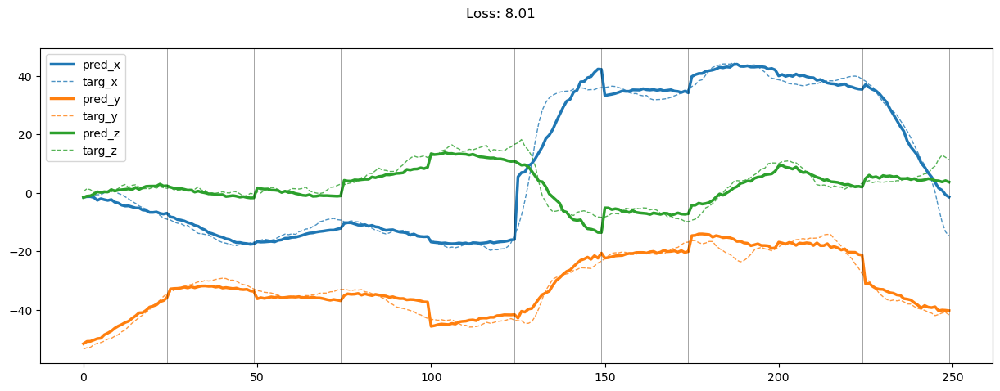

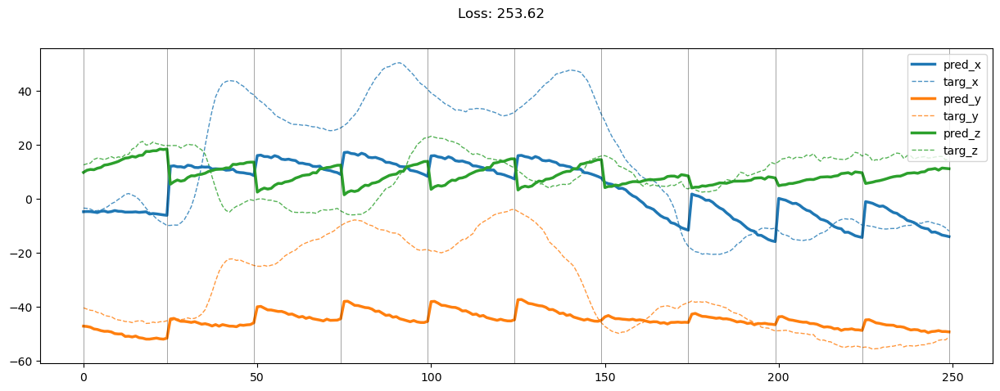

00349: train total loss:  7.072, pred loss:  7.072, valid total loss:  115.426, pred loss:  115.426


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


00350: train total loss:  6.956, pred loss:  6.956, valid total loss:  118.495, pred loss:  118.495


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


00351: train total loss:  6.914, pred loss:  6.914, valid total loss:  119.981, pred loss:  119.981


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


00352: train total loss:  6.987, pred loss:  6.987, valid total loss:  116.500, pred loss:  116.500


100%|██████████| 6/6 [00:00<00:00, 20.28it/s]


00353: train total loss:  7.032, pred loss:  7.032, valid total loss:  116.796, pred loss:  116.796


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


00354: train total loss:  7.296, pred loss:  7.296, valid total loss:  116.770, pred loss:  116.770


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00355: train total loss:  7.071, pred loss:  7.071, valid total loss:  113.940, pred loss:  113.940


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


00356: train total loss:  7.025, pred loss:  7.025, valid total loss:  109.256, pred loss:  109.256


100%|██████████| 6/6 [00:00<00:00, 20.00it/s]


00357: train total loss:  6.922, pred loss:  6.922, valid total loss:  115.141, pred loss:  115.141


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00358: train total loss:  6.843, pred loss:  6.843, valid total loss:  113.399, pred loss:  113.399


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


00359: train total loss:  6.866, pred loss:  6.866, valid total loss:  110.648, pred loss:  110.648


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00360: train total loss:  6.904, pred loss:  6.904, valid total loss:  119.838, pred loss:  119.838


100%|██████████| 6/6 [00:00<00:00, 19.95it/s]


00361: train total loss:  6.906, pred loss:  6.906, valid total loss:  115.584, pred loss:  115.584


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


00362: train total loss:  6.977, pred loss:  6.977, valid total loss:  112.104, pred loss:  112.104


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00363: train total loss:  6.810, pred loss:  6.810, valid total loss:  113.357, pred loss:  113.357


100%|██████████| 6/6 [00:00<00:00, 20.38it/s]


00364: train total loss:  6.739, pred loss:  6.739, valid total loss:  112.940, pred loss:  112.940


100%|██████████| 6/6 [00:00<00:00, 20.44it/s]


00365: train total loss:  6.599, pred loss:  6.599, valid total loss:  114.621, pred loss:  114.621


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00366: train total loss:  6.449, pred loss:  6.449, valid total loss:  116.816, pred loss:  116.816


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00367: train total loss:  6.495, pred loss:  6.495, valid total loss:  114.595, pred loss:  114.595


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00368: train total loss:  6.466, pred loss:  6.466, valid total loss:  115.979, pred loss:  115.979


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00369: train total loss:  6.711, pred loss:  6.711, valid total loss:  113.654, pred loss:  113.654


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


00370: train total loss:  6.638, pred loss:  6.638, valid total loss:  115.706, pred loss:  115.706


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00371: train total loss:  6.631, pred loss:  6.631, valid total loss:  121.189, pred loss:  121.189


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


00372: train total loss:  6.776, pred loss:  6.776, valid total loss:  123.089, pred loss:  123.089


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00373: train total loss:  6.590, pred loss:  6.590, valid total loss:  116.743, pred loss:  116.743


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00374: train total loss:  6.554, pred loss:  6.554, valid total loss:  121.510, pred loss:  121.510


100%|██████████| 6/6 [00:00<00:00, 20.38it/s]


00375: train total loss:  6.434, pred loss:  6.434, valid total loss:  117.594, pred loss:  117.594


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


00376: train total loss:  6.528, pred loss:  6.528, valid total loss:  114.149, pred loss:  114.149


100%|██████████| 6/6 [00:00<00:00, 20.01it/s]


00377: train total loss:  6.419, pred loss:  6.419, valid total loss:  115.763, pred loss:  115.763


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


00378: train total loss:  6.324, pred loss:  6.324, valid total loss:  120.252, pred loss:  120.252


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


00379: train total loss:  6.598, pred loss:  6.598, valid total loss:  118.963, pred loss:  118.963


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


00380: train total loss:  6.609, pred loss:  6.609, valid total loss:  117.533, pred loss:  117.533


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


00381: train total loss:  6.449, pred loss:  6.449, valid total loss:  125.096, pred loss:  125.096


100%|██████████| 6/6 [00:00<00:00, 20.51it/s]


00382: train total loss:  6.438, pred loss:  6.438, valid total loss:  120.824, pred loss:  120.824


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


00383: train total loss:  6.202, pred loss:  6.202, valid total loss:  122.550, pred loss:  122.550


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00384: train total loss:  6.491, pred loss:  6.491, valid total loss:  117.724, pred loss:  117.724


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


00385: train total loss:  6.466, pred loss:  6.466, valid total loss:  111.826, pred loss:  111.826


100%|██████████| 6/6 [00:00<00:00, 20.34it/s]


00386: train total loss:  6.358, pred loss:  6.358, valid total loss:  117.099, pred loss:  117.099


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00387: train total loss:  6.466, pred loss:  6.466, valid total loss:  114.664, pred loss:  114.664


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


00388: train total loss:  6.258, pred loss:  6.258, valid total loss:  119.818, pred loss:  119.818


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


00389: train total loss:  6.240, pred loss:  6.240, valid total loss:  118.173, pred loss:  118.173


100%|██████████| 6/6 [00:00<00:00, 19.57it/s]


00390: train total loss:  6.282, pred loss:  6.282, valid total loss:  117.377, pred loss:  117.377


100%|██████████| 6/6 [00:00<00:00, 19.49it/s]


00391: train total loss:  6.374, pred loss:  6.374, valid total loss:  118.215, pred loss:  118.215


100%|██████████| 6/6 [00:00<00:00, 20.00it/s]


00392: train total loss:  6.452, pred loss:  6.452, valid total loss:  121.369, pred loss:  121.369


100%|██████████| 6/6 [00:00<00:00, 19.66it/s]


00393: train total loss:  6.458, pred loss:  6.458, valid total loss:  115.183, pred loss:  115.183


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


00394: train total loss:  6.273, pred loss:  6.273, valid total loss:  118.634, pred loss:  118.634


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


00395: train total loss:  6.069, pred loss:  6.069, valid total loss:  116.119, pred loss:  116.119


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


00396: train total loss:  6.108, pred loss:  6.108, valid total loss:  117.133, pred loss:  117.133


100%|██████████| 6/6 [00:00<00:00, 20.55it/s]


00397: train total loss:  6.040, pred loss:  6.040, valid total loss:  117.724, pred loss:  117.724


100%|██████████| 6/6 [00:00<00:00, 20.00it/s]


00398: train total loss:  5.763, pred loss:  5.763, valid total loss:  119.352, pred loss:  119.352


100%|██████████| 6/6 [00:00<00:00, 19.64it/s]


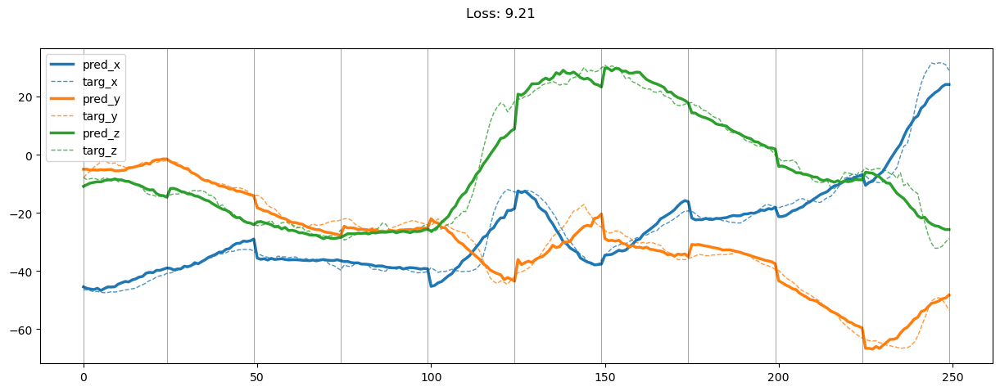

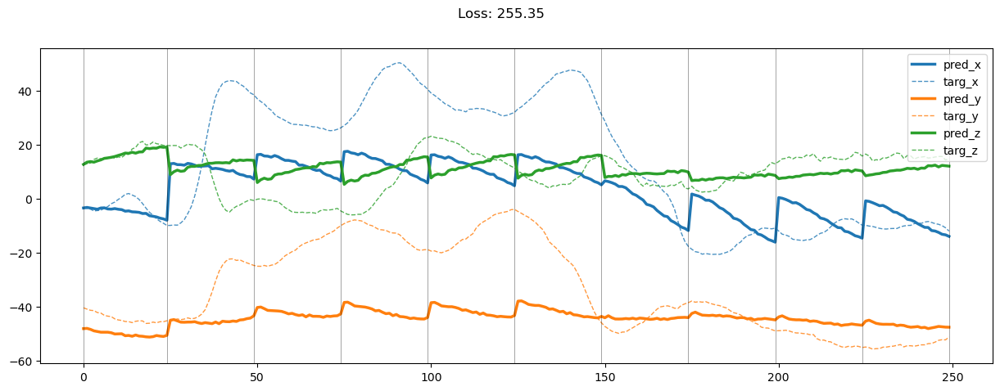

00399: train total loss:  5.899, pred loss:  5.899, valid total loss:  122.949, pred loss:  122.949


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


00400: train total loss:  6.025, pred loss:  6.025, valid total loss:  109.881, pred loss:  109.881


100%|██████████| 6/6 [00:00<00:00, 20.42it/s]


00401: train total loss:  5.802, pred loss:  5.802, valid total loss:  117.215, pred loss:  117.215


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


00402: train total loss:  6.042, pred loss:  6.042, valid total loss:  120.326, pred loss:  120.326


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


00403: train total loss:  6.025, pred loss:  6.025, valid total loss:  119.839, pred loss:  119.839


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


00404: train total loss:  5.901, pred loss:  5.901, valid total loss:  114.531, pred loss:  114.531


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


00405: train total loss:  6.165, pred loss:  6.165, valid total loss:  114.906, pred loss:  114.906


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


00406: train total loss:  5.999, pred loss:  5.999, valid total loss:  118.722, pred loss:  118.722


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


00407: train total loss:  6.174, pred loss:  6.174, valid total loss:  124.809, pred loss:  124.809


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


00408: train total loss:  6.196, pred loss:  6.196, valid total loss:  118.748, pred loss:  118.748


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


00409: train total loss:  6.164, pred loss:  6.164, valid total loss:  120.627, pred loss:  120.627


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


00410: train total loss:  6.052, pred loss:  6.052, valid total loss:  116.743, pred loss:  116.743


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


00411: train total loss:  6.045, pred loss:  6.045, valid total loss:  116.038, pred loss:  116.038


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00412: train total loss:  6.058, pred loss:  6.058, valid total loss:  120.981, pred loss:  120.981


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


00413: train total loss:  6.011, pred loss:  6.011, valid total loss:  122.285, pred loss:  122.285


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


00414: train total loss:  5.999, pred loss:  5.999, valid total loss:  125.258, pred loss:  125.258


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00415: train total loss:  6.032, pred loss:  6.032, valid total loss:  118.941, pred loss:  118.941


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


00416: train total loss:  6.195, pred loss:  6.195, valid total loss:  118.133, pred loss:  118.133


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00417: train total loss:  5.841, pred loss:  5.841, valid total loss:  116.577, pred loss:  116.577


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


00418: train total loss:  5.855, pred loss:  5.855, valid total loss:  123.120, pred loss:  123.120


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


00419: train total loss:  5.820, pred loss:  5.820, valid total loss:  120.765, pred loss:  120.765


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


00420: train total loss:  5.764, pred loss:  5.764, valid total loss:  117.282, pred loss:  117.282


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00421: train total loss:  5.812, pred loss:  5.812, valid total loss:  121.916, pred loss:  121.916


100%|██████████| 6/6 [00:00<00:00, 20.39it/s]


00422: train total loss:  5.624, pred loss:  5.624, valid total loss:  121.757, pred loss:  121.757


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00423: train total loss:  5.774, pred loss:  5.774, valid total loss:  120.198, pred loss:  120.198


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


00424: train total loss:  5.737, pred loss:  5.737, valid total loss:  121.521, pred loss:  121.521


100%|██████████| 6/6 [00:00<00:00, 19.72it/s]


00425: train total loss:  5.865, pred loss:  5.865, valid total loss:  123.285, pred loss:  123.285


100%|██████████| 6/6 [00:00<00:00, 19.16it/s]


00426: train total loss:  5.767, pred loss:  5.767, valid total loss:  119.637, pred loss:  119.637


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


00427: train total loss:  5.720, pred loss:  5.720, valid total loss:  121.110, pred loss:  121.110


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00428: train total loss:  5.670, pred loss:  5.670, valid total loss:  128.570, pred loss:  128.570


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


00429: train total loss:  5.518, pred loss:  5.518, valid total loss:  126.026, pred loss:  126.026


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


00430: train total loss:  5.505, pred loss:  5.505, valid total loss:  123.605, pred loss:  123.605


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00431: train total loss:  5.445, pred loss:  5.445, valid total loss:  114.455, pred loss:  114.455


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00432: train total loss:  5.333, pred loss:  5.333, valid total loss:  118.421, pred loss:  118.421


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


00433: train total loss:  5.653, pred loss:  5.653, valid total loss:  114.176, pred loss:  114.176


100%|██████████| 6/6 [00:00<00:00, 20.52it/s]


00434: train total loss:  5.587, pred loss:  5.587, valid total loss:  120.090, pred loss:  120.090


100%|██████████| 6/6 [00:00<00:00, 17.82it/s]


00435: train total loss:  5.746, pred loss:  5.746, valid total loss:  126.899, pred loss:  126.899


100%|██████████| 6/6 [00:00<00:00, 17.91it/s]


00436: train total loss:  5.767, pred loss:  5.767, valid total loss:  127.489, pred loss:  127.489


100%|██████████| 6/6 [00:00<00:00, 19.61it/s]


00437: train total loss:  5.688, pred loss:  5.688, valid total loss:  121.462, pred loss:  121.462


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00438: train total loss:  5.410, pred loss:  5.410, valid total loss:  112.796, pred loss:  112.796


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


00439: train total loss:  5.520, pred loss:  5.520, valid total loss:  113.382, pred loss:  113.382


100%|██████████| 6/6 [00:00<00:00, 20.33it/s]


00440: train total loss:  5.495, pred loss:  5.495, valid total loss:  123.468, pred loss:  123.468


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


00441: train total loss:  5.362, pred loss:  5.362, valid total loss:  122.075, pred loss:  122.075


100%|██████████| 6/6 [00:00<00:00, 20.35it/s]


00442: train total loss:  5.334, pred loss:  5.334, valid total loss:  124.077, pred loss:  124.077


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


00443: train total loss:  5.162, pred loss:  5.162, valid total loss:  125.967, pred loss:  125.967


100%|██████████| 6/6 [00:00<00:00, 20.48it/s]


00444: train total loss:  5.286, pred loss:  5.286, valid total loss:  120.021, pred loss:  120.021


100%|██████████| 6/6 [00:00<00:00, 20.45it/s]


00445: train total loss:  5.215, pred loss:  5.215, valid total loss:  118.645, pred loss:  118.645


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00446: train total loss:  5.218, pred loss:  5.218, valid total loss:  120.608, pred loss:  120.608


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00447: train total loss:  5.272, pred loss:  5.272, valid total loss:  124.734, pred loss:  124.734


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00448: train total loss:  5.337, pred loss:  5.337, valid total loss:  123.727, pred loss:  123.727


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


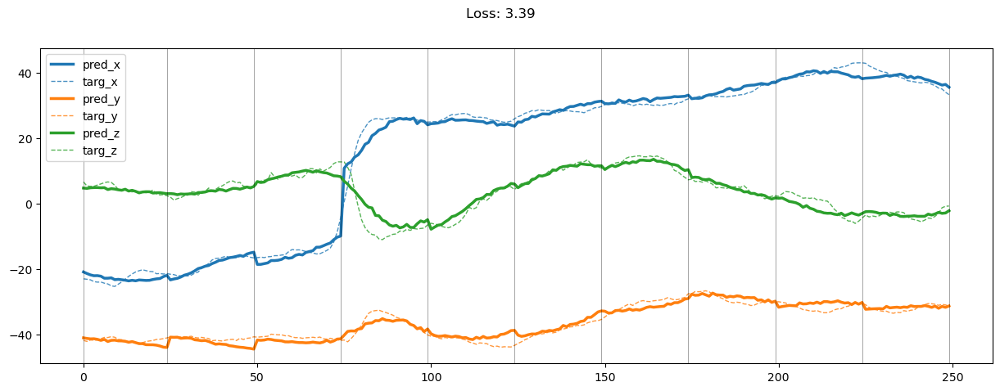

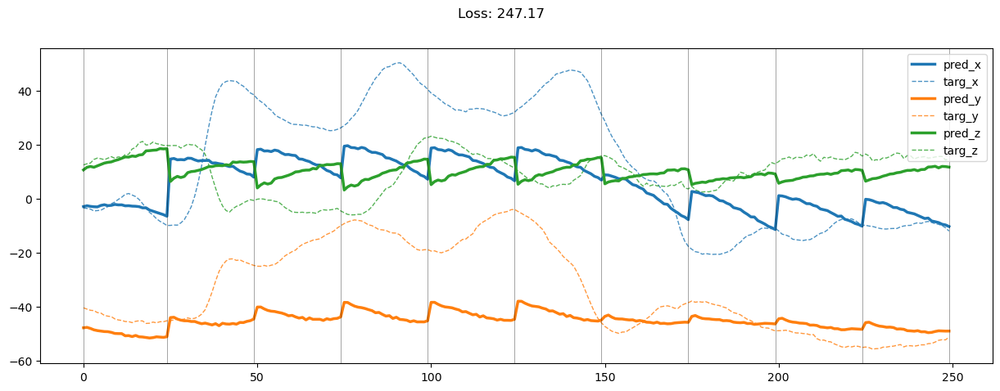

00449: train total loss:  5.474, pred loss:  5.474, valid total loss:  118.707, pred loss:  118.707


100%|██████████| 6/6 [00:00<00:00, 20.32it/s]


00450: train total loss:  5.218, pred loss:  5.218, valid total loss:  124.246, pred loss:  124.246


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


00451: train total loss:  5.040, pred loss:  5.040, valid total loss:  120.831, pred loss:  120.831


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00452: train total loss:  5.181, pred loss:  5.181, valid total loss:  121.831, pred loss:  121.831


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00453: train total loss:  5.105, pred loss:  5.105, valid total loss:  120.864, pred loss:  120.864


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00454: train total loss:  5.006, pred loss:  5.006, valid total loss:  124.688, pred loss:  124.688


100%|██████████| 6/6 [00:00<00:00, 20.15it/s]


00455: train total loss:  5.154, pred loss:  5.154, valid total loss:  121.732, pred loss:  121.732


100%|██████████| 6/6 [00:00<00:00, 19.42it/s]


00456: train total loss:  5.000, pred loss:  5.000, valid total loss:  117.395, pred loss:  117.395


100%|██████████| 6/6 [00:00<00:00, 19.40it/s]


00457: train total loss:  4.964, pred loss:  4.964, valid total loss:  125.262, pred loss:  125.262


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00458: train total loss:  5.033, pred loss:  5.033, valid total loss:  119.197, pred loss:  119.197


100%|██████████| 6/6 [00:00<00:00, 20.49it/s]


00459: train total loss:  5.073, pred loss:  5.073, valid total loss:  123.684, pred loss:  123.684


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


00460: train total loss:  4.915, pred loss:  4.915, valid total loss:  123.645, pred loss:  123.645


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00461: train total loss:  5.100, pred loss:  5.100, valid total loss:  128.048, pred loss:  128.048


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


00462: train total loss:  4.836, pred loss:  4.836, valid total loss:  119.692, pred loss:  119.692


100%|██████████| 6/6 [00:00<00:00, 19.52it/s]


00463: train total loss:  4.775, pred loss:  4.775, valid total loss:  119.805, pred loss:  119.805


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00464: train total loss:  5.140, pred loss:  5.140, valid total loss:  120.243, pred loss:  120.243


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00465: train total loss:  5.040, pred loss:  5.040, valid total loss:  125.282, pred loss:  125.282


100%|██████████| 6/6 [00:00<00:00, 20.52it/s]


00466: train total loss:  5.061, pred loss:  5.061, valid total loss:  121.518, pred loss:  121.518


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00467: train total loss:  4.992, pred loss:  4.992, valid total loss:  119.087, pred loss:  119.087


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00468: train total loss:  4.860, pred loss:  4.860, valid total loss:  124.098, pred loss:  124.098


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


00469: train total loss:  5.127, pred loss:  5.127, valid total loss:  131.602, pred loss:  131.602


100%|██████████| 6/6 [00:00<00:00, 19.32it/s]


00470: train total loss:  4.805, pred loss:  4.805, valid total loss:  119.492, pred loss:  119.492


100%|██████████| 6/6 [00:00<00:00, 20.34it/s]


00471: train total loss:  4.924, pred loss:  4.924, valid total loss:  125.545, pred loss:  125.545


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


00472: train total loss:  4.885, pred loss:  4.885, valid total loss:  126.888, pred loss:  126.888


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00473: train total loss:  4.757, pred loss:  4.757, valid total loss:  124.426, pred loss:  124.426


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


00474: train total loss:  4.823, pred loss:  4.823, valid total loss:  120.418, pred loss:  120.418


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00475: train total loss:  4.722, pred loss:  4.722, valid total loss:  124.910, pred loss:  124.910


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


00476: train total loss:  4.862, pred loss:  4.862, valid total loss:  121.566, pred loss:  121.566


100%|██████████| 6/6 [00:00<00:00, 19.38it/s]


00477: train total loss:  4.810, pred loss:  4.810, valid total loss:  120.794, pred loss:  120.794


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00478: train total loss:  4.755, pred loss:  4.755, valid total loss:  121.169, pred loss:  121.169


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


00479: train total loss:  4.769, pred loss:  4.769, valid total loss:  123.573, pred loss:  123.573


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


00480: train total loss:  4.677, pred loss:  4.677, valid total loss:  118.913, pred loss:  118.913


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


00481: train total loss:  4.741, pred loss:  4.741, valid total loss:  122.110, pred loss:  122.110


100%|██████████| 6/6 [00:00<00:00, 20.49it/s]


00482: train total loss:  4.619, pred loss:  4.619, valid total loss:  125.214, pred loss:  125.214


100%|██████████| 6/6 [00:00<00:00, 17.56it/s]


00483: train total loss:  4.719, pred loss:  4.719, valid total loss:  127.220, pred loss:  127.220


100%|██████████| 6/6 [00:00<00:00, 20.10it/s]


00484: train total loss:  4.779, pred loss:  4.779, valid total loss:  126.943, pred loss:  126.943


100%|██████████| 6/6 [00:00<00:00, 17.58it/s]


00485: train total loss:  4.584, pred loss:  4.584, valid total loss:  119.615, pred loss:  119.615


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


00486: train total loss:  4.763, pred loss:  4.763, valid total loss:  121.499, pred loss:  121.499


100%|██████████| 6/6 [00:00<00:00, 19.99it/s]


00487: train total loss:  4.711, pred loss:  4.711, valid total loss:  120.388, pred loss:  120.388


100%|██████████| 6/6 [00:00<00:00, 19.79it/s]


00488: train total loss:  4.644, pred loss:  4.644, valid total loss:  123.342, pred loss:  123.342


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


00489: train total loss:  4.588, pred loss:  4.588, valid total loss:  117.686, pred loss:  117.686


100%|██████████| 6/6 [00:00<00:00, 20.58it/s]


00490: train total loss:  4.458, pred loss:  4.458, valid total loss:  121.241, pred loss:  121.241


100%|██████████| 6/6 [00:00<00:00, 18.40it/s]


00491: train total loss:  4.555, pred loss:  4.555, valid total loss:  118.283, pred loss:  118.283


100%|██████████| 6/6 [00:00<00:00, 20.03it/s]


00492: train total loss:  4.421, pred loss:  4.421, valid total loss:  115.509, pred loss:  115.509


100%|██████████| 6/6 [00:00<00:00, 20.22it/s]


00493: train total loss:  4.575, pred loss:  4.575, valid total loss:  116.060, pred loss:  116.060


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00494: train total loss:  4.490, pred loss:  4.490, valid total loss:  119.426, pred loss:  119.426


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


00495: train total loss:  4.592, pred loss:  4.592, valid total loss:  117.098, pred loss:  117.098


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


00496: train total loss:  4.498, pred loss:  4.498, valid total loss:  121.274, pred loss:  121.274


100%|██████████| 6/6 [00:00<00:00, 20.54it/s]


00497: train total loss:  4.436, pred loss:  4.436, valid total loss:  118.779, pred loss:  118.779


100%|██████████| 6/6 [00:00<00:00, 20.22it/s]


00498: train total loss:  4.540, pred loss:  4.540, valid total loss:  117.055, pred loss:  117.055


100%|██████████| 6/6 [00:00<00:00, 20.48it/s]


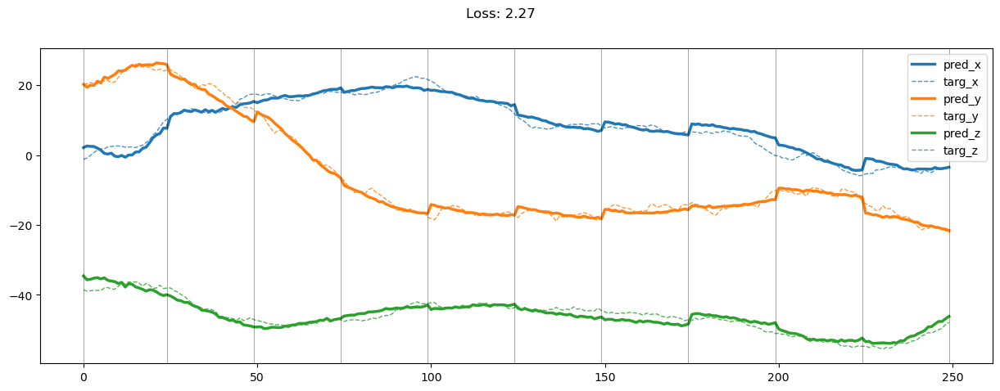

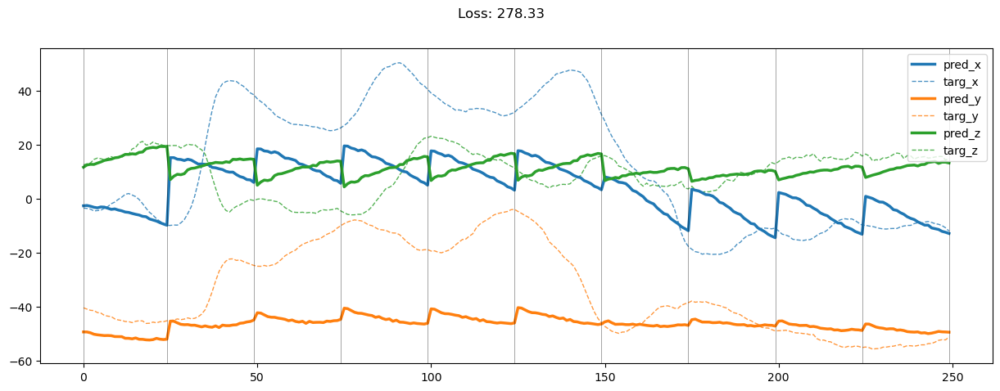

00499: train total loss:  4.526, pred loss:  4.526, valid total loss:  117.903, pred loss:  117.903


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00500: train total loss:  4.516, pred loss:  4.516, valid total loss:  116.636, pred loss:  116.636


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


00501: train total loss:  4.360, pred loss:  4.360, valid total loss:  119.051, pred loss:  119.051


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


00502: train total loss:  4.383, pred loss:  4.383, valid total loss:  121.183, pred loss:  121.183


100%|██████████| 6/6 [00:00<00:00, 20.53it/s]


00503: train total loss:  4.361, pred loss:  4.361, valid total loss:  121.573, pred loss:  121.573


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


00504: train total loss:  4.403, pred loss:  4.403, valid total loss:  118.628, pred loss:  118.628


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00505: train total loss:  4.203, pred loss:  4.203, valid total loss:  116.290, pred loss:  116.290


100%|██████████| 6/6 [00:00<00:00, 18.16it/s]


00506: train total loss:  4.327, pred loss:  4.327, valid total loss:  121.470, pred loss:  121.470


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


00507: train total loss:  4.313, pred loss:  4.313, valid total loss:  120.482, pred loss:  120.482


100%|██████████| 6/6 [00:00<00:00, 20.44it/s]


00508: train total loss:  4.223, pred loss:  4.223, valid total loss:  124.404, pred loss:  124.404


100%|██████████| 6/6 [00:00<00:00, 19.76it/s]


00509: train total loss:  4.524, pred loss:  4.524, valid total loss:  119.926, pred loss:  119.926


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


00510: train total loss:  4.651, pred loss:  4.651, valid total loss:  116.344, pred loss:  116.344


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


00511: train total loss:  4.531, pred loss:  4.531, valid total loss:  119.725, pred loss:  119.725


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00512: train total loss:  4.539, pred loss:  4.539, valid total loss:  119.285, pred loss:  119.285


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


00513: train total loss:  4.573, pred loss:  4.573, valid total loss:  125.478, pred loss:  125.478


100%|██████████| 6/6 [00:00<00:00, 20.08it/s]


00514: train total loss:  4.494, pred loss:  4.494, valid total loss:  122.705, pred loss:  122.705


100%|██████████| 6/6 [00:00<00:00, 20.09it/s]


00515: train total loss:  4.276, pred loss:  4.276, valid total loss:  118.485, pred loss:  118.485


100%|██████████| 6/6 [00:00<00:00, 20.15it/s]


00516: train total loss:  4.502, pred loss:  4.502, valid total loss:  117.624, pred loss:  117.624


100%|██████████| 6/6 [00:00<00:00, 20.14it/s]


00517: train total loss:  4.585, pred loss:  4.585, valid total loss:  120.586, pred loss:  120.586


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00518: train total loss:  4.463, pred loss:  4.463, valid total loss:  123.711, pred loss:  123.711


100%|██████████| 6/6 [00:00<00:00, 19.74it/s]


00519: train total loss:  4.375, pred loss:  4.375, valid total loss:  122.204, pred loss:  122.204


100%|██████████| 6/6 [00:00<00:00, 19.18it/s]


00520: train total loss:  4.456, pred loss:  4.456, valid total loss:  119.256, pred loss:  119.256


100%|██████████| 6/6 [00:00<00:00, 19.84it/s]


00521: train total loss:  4.415, pred loss:  4.415, valid total loss:  118.229, pred loss:  118.229


100%|██████████| 6/6 [00:00<00:00, 19.32it/s]


00522: train total loss:  4.380, pred loss:  4.380, valid total loss:  119.777, pred loss:  119.777


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


00523: train total loss:  4.597, pred loss:  4.597, valid total loss:  122.499, pred loss:  122.499


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


00524: train total loss:  4.532, pred loss:  4.532, valid total loss:  117.373, pred loss:  117.373


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00525: train total loss:  4.429, pred loss:  4.429, valid total loss:  119.546, pred loss:  119.546


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


00526: train total loss:  4.318, pred loss:  4.318, valid total loss:  119.365, pred loss:  119.365


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00527: train total loss:  4.293, pred loss:  4.293, valid total loss:  121.120, pred loss:  121.120


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00528: train total loss:  4.176, pred loss:  4.176, valid total loss:  115.660, pred loss:  115.660


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


00529: train total loss:  4.094, pred loss:  4.094, valid total loss:  115.584, pred loss:  115.584


100%|██████████| 6/6 [00:00<00:00, 20.20it/s]


00530: train total loss:  4.179, pred loss:  4.179, valid total loss:  116.697, pred loss:  116.697


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


00531: train total loss:  4.090, pred loss:  4.090, valid total loss:  117.834, pred loss:  117.834


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00532: train total loss:  4.086, pred loss:  4.086, valid total loss:  121.544, pred loss:  121.544


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00533: train total loss:  3.996, pred loss:  3.996, valid total loss:  122.537, pred loss:  122.537


100%|██████████| 6/6 [00:00<00:00, 20.56it/s]


00534: train total loss:  3.988, pred loss:  3.988, valid total loss:  122.092, pred loss:  122.092


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


00535: train total loss:  3.911, pred loss:  3.911, valid total loss:  120.614, pred loss:  120.614


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


00536: train total loss:  3.854, pred loss:  3.854, valid total loss:  120.180, pred loss:  120.180


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00537: train total loss:  3.922, pred loss:  3.922, valid total loss:  120.538, pred loss:  120.538


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


00538: train total loss:  3.930, pred loss:  3.930, valid total loss:  119.300, pred loss:  119.300


100%|██████████| 6/6 [00:00<00:00, 20.56it/s]


00539: train total loss:  3.809, pred loss:  3.809, valid total loss:  121.526, pred loss:  121.526


100%|██████████| 6/6 [00:00<00:00, 19.49it/s]


00540: train total loss:  3.932, pred loss:  3.932, valid total loss:  123.309, pred loss:  123.309


100%|██████████| 6/6 [00:00<00:00, 19.71it/s]


00541: train total loss:  4.009, pred loss:  4.009, valid total loss:  123.656, pred loss:  123.656


100%|██████████| 6/6 [00:00<00:00, 20.53it/s]


00542: train total loss:  3.999, pred loss:  3.999, valid total loss:  119.822, pred loss:  119.822


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00543: train total loss:  3.888, pred loss:  3.888, valid total loss:  122.153, pred loss:  122.153


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


00544: train total loss:  3.920, pred loss:  3.920, valid total loss:  122.159, pred loss:  122.159


100%|██████████| 6/6 [00:00<00:00, 20.51it/s]


00545: train total loss:  3.963, pred loss:  3.963, valid total loss:  118.972, pred loss:  118.972


100%|██████████| 6/6 [00:00<00:00, 20.26it/s]


00546: train total loss:  4.004, pred loss:  4.004, valid total loss:  126.382, pred loss:  126.382


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


00547: train total loss:  4.003, pred loss:  4.003, valid total loss:  118.833, pred loss:  118.833


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


00548: train total loss:  3.958, pred loss:  3.958, valid total loss:  119.008, pred loss:  119.008


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


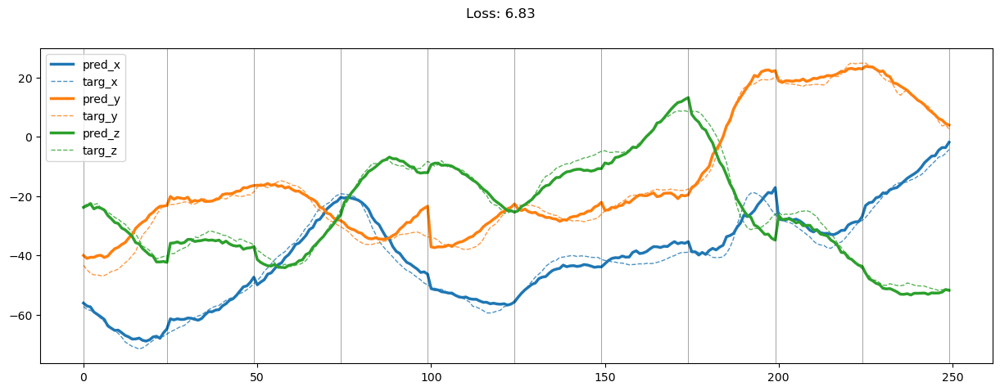

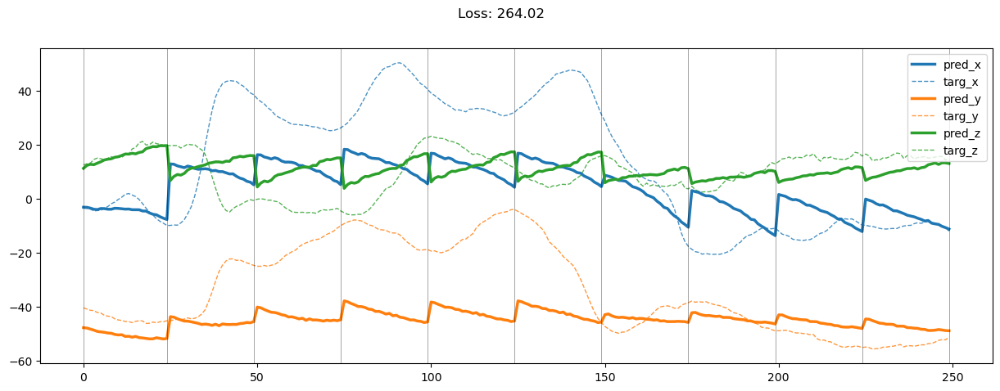

00549: train total loss:  3.811, pred loss:  3.811, valid total loss:  119.722, pred loss:  119.722


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00550: train total loss:  3.965, pred loss:  3.965, valid total loss:  119.279, pred loss:  119.279


100%|██████████| 6/6 [00:00<00:00, 19.75it/s]


00551: train total loss:  3.892, pred loss:  3.892, valid total loss:  122.670, pred loss:  122.670


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


00552: train total loss:  3.796, pred loss:  3.796, valid total loss:  125.893, pred loss:  125.893


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


00553: train total loss:  3.804, pred loss:  3.804, valid total loss:  123.110, pred loss:  123.110


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00554: train total loss:  3.800, pred loss:  3.800, valid total loss:  118.520, pred loss:  118.520


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


00555: train total loss:  3.784, pred loss:  3.784, valid total loss:  117.870, pred loss:  117.870


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


00556: train total loss:  3.668, pred loss:  3.668, valid total loss:  117.536, pred loss:  117.536


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


00557: train total loss:  3.832, pred loss:  3.832, valid total loss:  120.932, pred loss:  120.932


100%|██████████| 6/6 [00:00<00:00, 20.00it/s]


00558: train total loss:  3.743, pred loss:  3.743, valid total loss:  121.095, pred loss:  121.095


100%|██████████| 6/6 [00:00<00:00, 20.43it/s]


00559: train total loss:  3.682, pred loss:  3.682, valid total loss:  122.039, pred loss:  122.039


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00560: train total loss:  3.723, pred loss:  3.723, valid total loss:  120.292, pred loss:  120.292


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00561: train total loss:  3.844, pred loss:  3.844, valid total loss:  118.639, pred loss:  118.639


100%|██████████| 6/6 [00:00<00:00, 20.36it/s]


00562: train total loss:  3.783, pred loss:  3.783, valid total loss:  120.403, pred loss:  120.403


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


00563: train total loss:  3.999, pred loss:  3.999, valid total loss:  122.268, pred loss:  122.268


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


00564: train total loss:  4.028, pred loss:  4.028, valid total loss:  119.751, pred loss:  119.751


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00565: train total loss:  3.877, pred loss:  3.877, valid total loss:  115.005, pred loss:  115.005


100%|██████████| 6/6 [00:00<00:00, 20.33it/s]


00566: train total loss:  3.912, pred loss:  3.912, valid total loss:  125.504, pred loss:  125.504


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


00567: train total loss:  3.978, pred loss:  3.978, valid total loss:  123.815, pred loss:  123.815


100%|██████████| 6/6 [00:00<00:00, 19.75it/s]


00568: train total loss:  3.848, pred loss:  3.848, valid total loss:  121.530, pred loss:  121.530


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


00569: train total loss:  3.847, pred loss:  3.847, valid total loss:  122.062, pred loss:  122.062


100%|██████████| 6/6 [00:00<00:00, 20.05it/s]


00570: train total loss:  3.968, pred loss:  3.968, valid total loss:  118.313, pred loss:  118.313


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00571: train total loss:  3.857, pred loss:  3.857, valid total loss:  122.568, pred loss:  122.568


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


00572: train total loss:  3.785, pred loss:  3.785, valid total loss:  119.364, pred loss:  119.364


100%|██████████| 6/6 [00:00<00:00, 20.10it/s]


00573: train total loss:  3.699, pred loss:  3.699, valid total loss:  117.903, pred loss:  117.903


100%|██████████| 6/6 [00:00<00:00, 20.37it/s]


00574: train total loss:  3.731, pred loss:  3.731, valid total loss:  116.041, pred loss:  116.041


100%|██████████| 6/6 [00:00<00:00, 20.52it/s]


00575: train total loss:  3.777, pred loss:  3.777, valid total loss:  116.750, pred loss:  116.750


100%|██████████| 6/6 [00:00<00:00, 20.28it/s]


00576: train total loss:  3.750, pred loss:  3.750, valid total loss:  120.696, pred loss:  120.696


100%|██████████| 6/6 [00:00<00:00, 20.42it/s]


00577: train total loss:  3.693, pred loss:  3.693, valid total loss:  122.966, pred loss:  122.966


100%|██████████| 6/6 [00:00<00:00, 20.37it/s]


00578: train total loss:  3.625, pred loss:  3.625, valid total loss:  120.393, pred loss:  120.393


100%|██████████| 6/6 [00:00<00:00, 20.48it/s]


00579: train total loss:  3.689, pred loss:  3.689, valid total loss:  118.851, pred loss:  118.851


100%|██████████| 6/6 [00:00<00:00, 20.58it/s]


00580: train total loss:  3.606, pred loss:  3.606, valid total loss:  121.133, pred loss:  121.133


100%|██████████| 6/6 [00:00<00:00, 20.49it/s]


00581: train total loss:  3.597, pred loss:  3.597, valid total loss:  121.798, pred loss:  121.798


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


00582: train total loss:  3.442, pred loss:  3.442, valid total loss:  115.494, pred loss:  115.494


100%|██████████| 6/6 [00:00<00:00, 20.58it/s]


00583: train total loss:  3.530, pred loss:  3.530, valid total loss:  117.705, pred loss:  117.705


100%|██████████| 6/6 [00:00<00:00, 20.51it/s]


00584: train total loss:  3.455, pred loss:  3.455, valid total loss:  119.862, pred loss:  119.862


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


00585: train total loss:  3.493, pred loss:  3.493, valid total loss:  121.013, pred loss:  121.013


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


00586: train total loss:  3.413, pred loss:  3.413, valid total loss:  118.302, pred loss:  118.302


100%|██████████| 6/6 [00:00<00:00, 20.39it/s]


00587: train total loss:  3.428, pred loss:  3.428, valid total loss:  118.193, pred loss:  118.193


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


00588: train total loss:  3.431, pred loss:  3.431, valid total loss:  113.532, pred loss:  113.532


100%|██████████| 6/6 [00:00<00:00, 20.53it/s]


00589: train total loss:  3.523, pred loss:  3.523, valid total loss:  117.851, pred loss:  117.851


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


00590: train total loss:  3.676, pred loss:  3.676, valid total loss:  119.823, pred loss:  119.823


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


00591: train total loss:  3.676, pred loss:  3.676, valid total loss:  118.983, pred loss:  118.983


100%|██████████| 6/6 [00:00<00:00, 20.52it/s]


00592: train total loss:  3.729, pred loss:  3.729, valid total loss:  122.475, pred loss:  122.475


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


00593: train total loss:  3.796, pred loss:  3.796, valid total loss:  122.246, pred loss:  122.246


100%|██████████| 6/6 [00:00<00:00, 19.85it/s]


00594: train total loss:  3.615, pred loss:  3.615, valid total loss:  115.003, pred loss:  115.003


100%|██████████| 6/6 [00:00<00:00, 20.03it/s]


00595: train total loss:  3.590, pred loss:  3.590, valid total loss:  118.730, pred loss:  118.730


100%|██████████| 6/6 [00:00<00:00, 20.50it/s]


00596: train total loss:  3.599, pred loss:  3.599, valid total loss:  116.798, pred loss:  116.798


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


00597: train total loss:  3.466, pred loss:  3.466, valid total loss:  119.418, pred loss:  119.418


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00598: train total loss:  3.450, pred loss:  3.450, valid total loss:  121.174, pred loss:  121.174


100%|██████████| 6/6 [00:00<00:00, 20.43it/s]


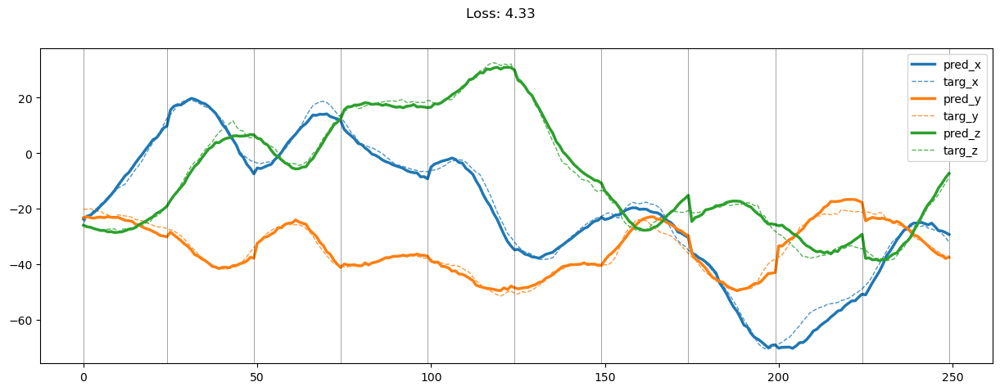

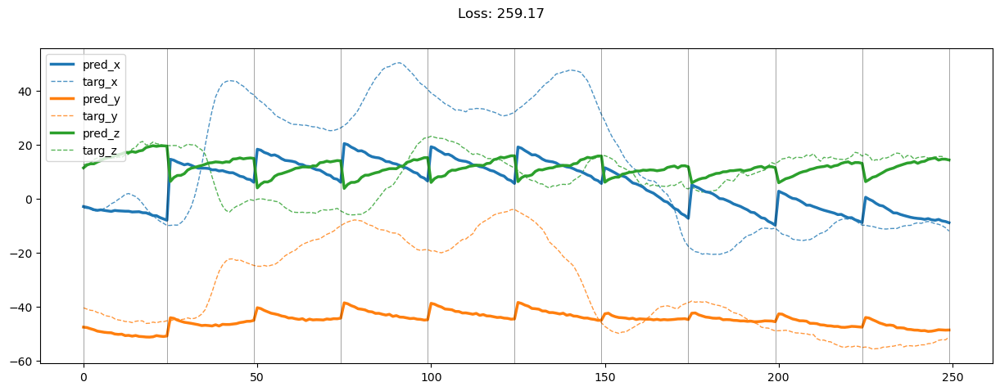

00599: train total loss:  3.374, pred loss:  3.374, valid total loss:  120.600, pred loss:  120.600


100%|██████████| 6/6 [00:00<00:00, 20.09it/s]


00600: train total loss:  3.413, pred loss:  3.413, valid total loss:  121.318, pred loss:  121.318


100%|██████████| 6/6 [00:00<00:00, 20.06it/s]


00601: train total loss:  3.384, pred loss:  3.384, valid total loss:  120.381, pred loss:  120.381


100%|██████████| 6/6 [00:00<00:00, 20.11it/s]


00602: train total loss:  3.454, pred loss:  3.454, valid total loss:  119.706, pred loss:  119.706


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


00603: train total loss:  3.451, pred loss:  3.451, valid total loss:  123.108, pred loss:  123.108


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


00604: train total loss:  3.515, pred loss:  3.515, valid total loss:  121.727, pred loss:  121.727


100%|██████████| 6/6 [00:00<00:00, 19.69it/s]


00605: train total loss:  3.393, pred loss:  3.393, valid total loss:  123.649, pred loss:  123.649


100%|██████████| 6/6 [00:00<00:00, 19.37it/s]


00606: train total loss:  3.485, pred loss:  3.485, valid total loss:  125.287, pred loss:  125.287


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


00607: train total loss:  3.527, pred loss:  3.527, valid total loss:  123.375, pred loss:  123.375


100%|██████████| 6/6 [00:00<00:00, 20.38it/s]


00608: train total loss:  3.404, pred loss:  3.404, valid total loss:  123.537, pred loss:  123.537


100%|██████████| 6/6 [00:00<00:00, 19.60it/s]


00609: train total loss:  3.390, pred loss:  3.390, valid total loss:  119.154, pred loss:  119.154


100%|██████████| 6/6 [00:00<00:00, 20.48it/s]


00610: train total loss:  3.389, pred loss:  3.389, valid total loss:  118.591, pred loss:  118.591


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


00611: train total loss:  3.333, pred loss:  3.333, valid total loss:  123.950, pred loss:  123.950


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


00612: train total loss:  3.530, pred loss:  3.530, valid total loss:  126.165, pred loss:  126.165


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


00613: train total loss:  3.521, pred loss:  3.521, valid total loss:  114.862, pred loss:  114.862


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


00614: train total loss:  3.552, pred loss:  3.552, valid total loss:  118.549, pred loss:  118.549


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


00615: train total loss:  3.500, pred loss:  3.500, valid total loss:  119.937, pred loss:  119.937


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


00616: train total loss:  3.619, pred loss:  3.619, valid total loss:  120.099, pred loss:  120.099


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00617: train total loss:  3.681, pred loss:  3.681, valid total loss:  123.408, pred loss:  123.408


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


00618: train total loss:  3.470, pred loss:  3.470, valid total loss:  121.260, pred loss:  121.260


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


00619: train total loss:  3.468, pred loss:  3.468, valid total loss:  120.345, pred loss:  120.345


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00620: train total loss:  3.409, pred loss:  3.409, valid total loss:  118.240, pred loss:  118.240


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


00621: train total loss:  3.381, pred loss:  3.381, valid total loss:  120.518, pred loss:  120.518


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


00622: train total loss:  3.291, pred loss:  3.291, valid total loss:  129.454, pred loss:  129.454


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


00623: train total loss:  3.410, pred loss:  3.410, valid total loss:  119.596, pred loss:  119.596


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


00624: train total loss:  3.324, pred loss:  3.324, valid total loss:  117.053, pred loss:  117.053


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00625: train total loss:  3.254, pred loss:  3.254, valid total loss:  116.611, pred loss:  116.611


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00626: train total loss:  3.264, pred loss:  3.264, valid total loss:  125.155, pred loss:  125.155


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


00627: train total loss:  3.196, pred loss:  3.196, valid total loss:  118.839, pred loss:  118.839


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


00628: train total loss:  3.279, pred loss:  3.279, valid total loss:  121.141, pred loss:  121.141


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


00629: train total loss:  3.363, pred loss:  3.363, valid total loss:  114.242, pred loss:  114.242


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


00630: train total loss:  3.291, pred loss:  3.291, valid total loss:  118.376, pred loss:  118.376


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


00631: train total loss:  3.194, pred loss:  3.194, valid total loss:  125.320, pred loss:  125.320


100%|██████████| 6/6 [00:00<00:00, 20.55it/s]


00632: train total loss:  3.227, pred loss:  3.227, valid total loss:  116.223, pred loss:  116.223


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


00633: train total loss:  3.111, pred loss:  3.111, valid total loss:  113.009, pred loss:  113.009


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00634: train total loss:  3.128, pred loss:  3.128, valid total loss:  120.177, pred loss:  120.177


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


00635: train total loss:  3.130, pred loss:  3.130, valid total loss:  124.908, pred loss:  124.908


100%|██████████| 6/6 [00:00<00:00, 20.58it/s]


00636: train total loss:  3.260, pred loss:  3.260, valid total loss:  121.445, pred loss:  121.445


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


00637: train total loss:  3.185, pred loss:  3.185, valid total loss:  124.636, pred loss:  124.636


100%|██████████| 6/6 [00:00<00:00, 20.43it/s]


00638: train total loss:  3.256, pred loss:  3.256, valid total loss:  124.328, pred loss:  124.328


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00639: train total loss:  3.195, pred loss:  3.195, valid total loss:  118.738, pred loss:  118.738


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


00640: train total loss:  3.154, pred loss:  3.154, valid total loss:  117.748, pred loss:  117.748


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


00641: train total loss:  3.093, pred loss:  3.093, valid total loss:  122.147, pred loss:  122.147


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


00642: train total loss:  3.123, pred loss:  3.123, valid total loss:  122.171, pred loss:  122.171


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00643: train total loss:  3.180, pred loss:  3.180, valid total loss:  123.128, pred loss:  123.128


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


00644: train total loss:  3.063, pred loss:  3.063, valid total loss:  121.417, pred loss:  121.417


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


00645: train total loss:  3.125, pred loss:  3.125, valid total loss:  122.749, pred loss:  122.749


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00646: train total loss:  3.053, pred loss:  3.053, valid total loss:  120.129, pred loss:  120.129


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


00647: train total loss:  2.965, pred loss:  2.965, valid total loss:  118.346, pred loss:  118.346


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00648: train total loss:  2.965, pred loss:  2.965, valid total loss:  121.714, pred loss:  121.714


100%|██████████| 6/6 [00:00<00:00, 20.52it/s]


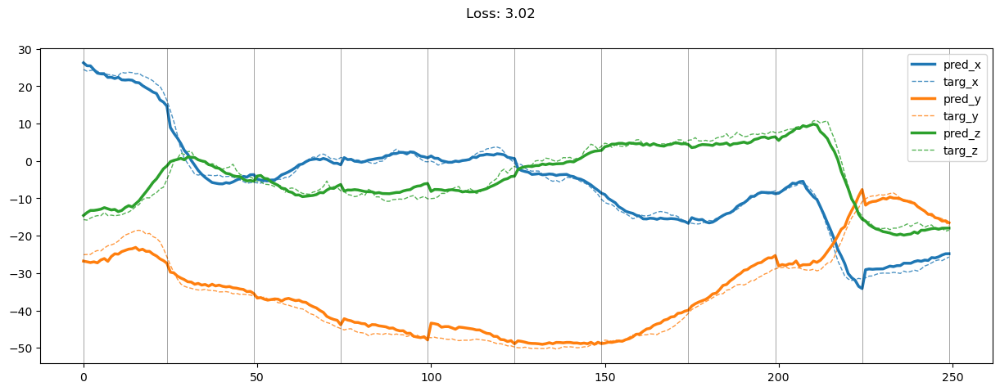

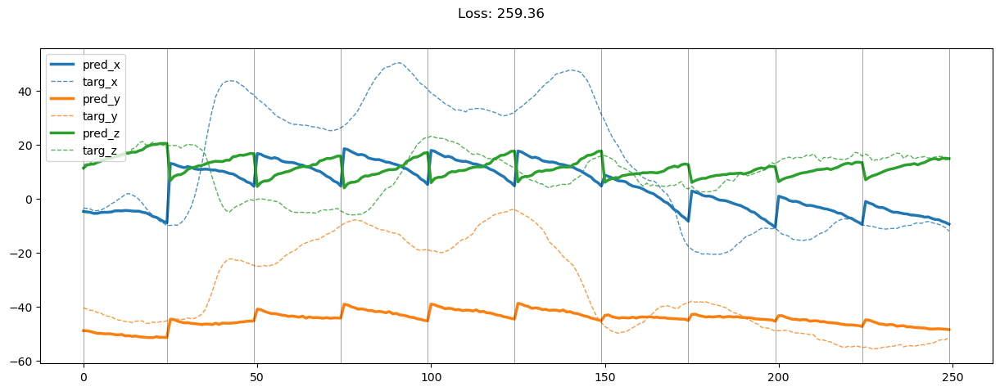

00649: train total loss:  3.005, pred loss:  3.005, valid total loss:  119.617, pred loss:  119.617


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


00650: train total loss:  2.945, pred loss:  2.945, valid total loss:  123.135, pred loss:  123.135


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


00651: train total loss:  3.021, pred loss:  3.021, valid total loss:  127.384, pred loss:  127.384


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


00652: train total loss:  3.231, pred loss:  3.231, valid total loss:  124.940, pred loss:  124.940


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00653: train total loss:  3.048, pred loss:  3.048, valid total loss:  122.655, pred loss:  122.655


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


00654: train total loss:  3.130, pred loss:  3.130, valid total loss:  121.024, pred loss:  121.024


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


00655: train total loss:  3.020, pred loss:  3.020, valid total loss:  118.991, pred loss:  118.991


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00656: train total loss:  3.100, pred loss:  3.100, valid total loss:  122.892, pred loss:  122.892


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


00657: train total loss:  3.248, pred loss:  3.248, valid total loss:  121.389, pred loss:  121.389


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00658: train total loss:  3.041, pred loss:  3.041, valid total loss:  117.543, pred loss:  117.543


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


00659: train total loss:  3.142, pred loss:  3.142, valid total loss:  118.249, pred loss:  118.249


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


00660: train total loss:  3.143, pred loss:  3.143, valid total loss:  123.640, pred loss:  123.640


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00661: train total loss:  3.217, pred loss:  3.217, valid total loss:  118.082, pred loss:  118.082


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00662: train total loss:  3.155, pred loss:  3.155, valid total loss:  120.003, pred loss:  120.003


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


00663: train total loss:  3.032, pred loss:  3.032, valid total loss:  121.495, pred loss:  121.495


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


00664: train total loss:  3.073, pred loss:  3.073, valid total loss:  118.867, pred loss:  118.867


100%|██████████| 6/6 [00:00<00:00, 20.33it/s]


00665: train total loss:  3.042, pred loss:  3.042, valid total loss:  121.140, pred loss:  121.140


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


00666: train total loss:  3.056, pred loss:  3.056, valid total loss:  121.356, pred loss:  121.356


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


00667: train total loss:  2.942, pred loss:  2.942, valid total loss:  116.638, pred loss:  116.638


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


00668: train total loss:  3.099, pred loss:  3.099, valid total loss:  118.058, pred loss:  118.058


100%|██████████| 6/6 [00:00<00:00, 20.03it/s]


00669: train total loss:  3.069, pred loss:  3.069, valid total loss:  121.087, pred loss:  121.087


100%|██████████| 6/6 [00:00<00:00, 20.16it/s]


00670: train total loss:  2.923, pred loss:  2.923, valid total loss:  121.022, pred loss:  121.022


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


00671: train total loss:  2.974, pred loss:  2.974, valid total loss:  121.263, pred loss:  121.263


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00672: train total loss:  2.940, pred loss:  2.940, valid total loss:  122.410, pred loss:  122.410


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00673: train total loss:  2.995, pred loss:  2.995, valid total loss:  124.071, pred loss:  124.071


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


00674: train total loss:  2.968, pred loss:  2.968, valid total loss:  122.521, pred loss:  122.521


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


00675: train total loss:  2.898, pred loss:  2.898, valid total loss:  119.150, pred loss:  119.150


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


00676: train total loss:  2.847, pred loss:  2.847, valid total loss:  123.110, pred loss:  123.110


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00677: train total loss:  3.027, pred loss:  3.027, valid total loss:  125.899, pred loss:  125.899


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


00678: train total loss:  2.912, pred loss:  2.912, valid total loss:  121.903, pred loss:  121.903


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


00679: train total loss:  2.969, pred loss:  2.969, valid total loss:  119.700, pred loss:  119.700


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


00680: train total loss:  3.050, pred loss:  3.050, valid total loss:  118.095, pred loss:  118.095


100%|██████████| 6/6 [00:00<00:00, 20.26it/s]


00681: train total loss:  3.050, pred loss:  3.050, valid total loss:  120.676, pred loss:  120.676


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


00682: train total loss:  3.004, pred loss:  3.004, valid total loss:  121.953, pred loss:  121.953


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


00683: train total loss:  2.984, pred loss:  2.984, valid total loss:  124.297, pred loss:  124.297


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


00684: train total loss:  2.978, pred loss:  2.978, valid total loss:  127.370, pred loss:  127.370


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00685: train total loss:  2.928, pred loss:  2.928, valid total loss:  122.805, pred loss:  122.805


100%|██████████| 6/6 [00:00<00:00, 19.34it/s]


00686: train total loss:  2.995, pred loss:  2.995, valid total loss:  126.673, pred loss:  126.673


100%|██████████| 6/6 [00:00<00:00, 20.11it/s]


00687: train total loss:  2.991, pred loss:  2.991, valid total loss:  121.250, pred loss:  121.250


100%|██████████| 6/6 [00:00<00:00, 17.77it/s]


00688: train total loss:  2.827, pred loss:  2.827, valid total loss:  120.294, pred loss:  120.294


100%|██████████| 6/6 [00:00<00:00, 17.88it/s]


00689: train total loss:  2.836, pred loss:  2.836, valid total loss:  119.421, pred loss:  119.421


100%|██████████| 6/6 [00:00<00:00, 17.97it/s]


00690: train total loss:  2.894, pred loss:  2.894, valid total loss:  127.752, pred loss:  127.752


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00691: train total loss:  2.842, pred loss:  2.842, valid total loss:  121.370, pred loss:  121.370


100%|██████████| 6/6 [00:00<00:00, 20.46it/s]


00692: train total loss:  2.973, pred loss:  2.973, valid total loss:  121.669, pred loss:  121.669


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00693: train total loss:  2.923, pred loss:  2.923, valid total loss:  120.699, pred loss:  120.699


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


00694: train total loss:  3.010, pred loss:  3.010, valid total loss:  120.417, pred loss:  120.417


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


00695: train total loss:  3.058, pred loss:  3.058, valid total loss:  122.490, pred loss:  122.490


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


00696: train total loss:  2.923, pred loss:  2.923, valid total loss:  125.941, pred loss:  125.941


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


00697: train total loss:  3.014, pred loss:  3.014, valid total loss:  130.316, pred loss:  130.316


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


00698: train total loss:  3.010, pred loss:  3.010, valid total loss:  123.442, pred loss:  123.442


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


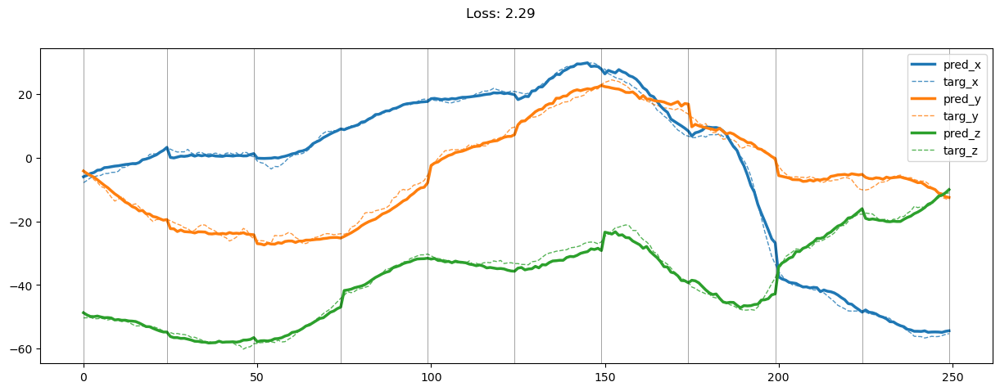

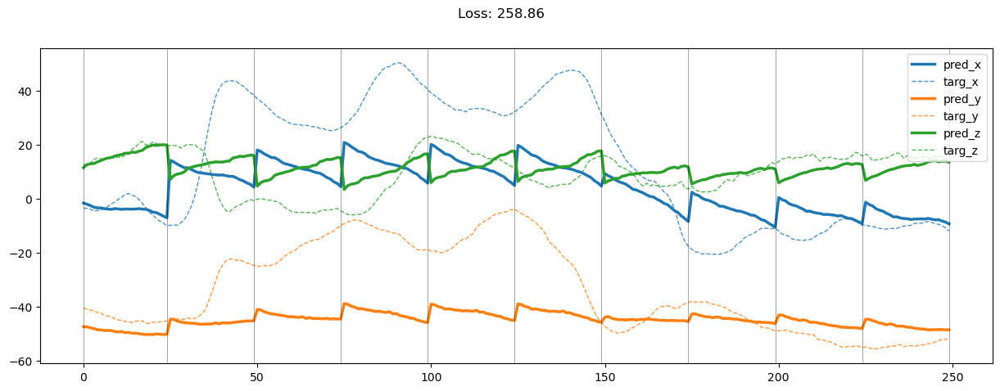

00699: train total loss:  3.071, pred loss:  3.071, valid total loss:  120.210, pred loss:  120.210


100%|██████████| 6/6 [00:00<00:00, 18.13it/s]


00700: train total loss:  3.063, pred loss:  3.063, valid total loss:  121.272, pred loss:  121.272


100%|██████████| 6/6 [00:00<00:00, 17.93it/s]


00701: train total loss:  2.960, pred loss:  2.960, valid total loss:  124.297, pred loss:  124.297


100%|██████████| 6/6 [00:00<00:00, 19.79it/s]


00702: train total loss:  2.908, pred loss:  2.908, valid total loss:  123.001, pred loss:  123.001


100%|██████████| 6/6 [00:00<00:00, 20.46it/s]


00703: train total loss:  2.838, pred loss:  2.838, valid total loss:  127.054, pred loss:  127.054


100%|██████████| 6/6 [00:00<00:00, 20.54it/s]


00704: train total loss:  2.887, pred loss:  2.887, valid total loss:  132.653, pred loss:  132.653


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


00705: train total loss:  2.749, pred loss:  2.749, valid total loss:  127.576, pred loss:  127.576


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00706: train total loss:  2.815, pred loss:  2.815, valid total loss:  125.630, pred loss:  125.630


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


00707: train total loss:  2.792, pred loss:  2.792, valid total loss:  121.357, pred loss:  121.357


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00708: train total loss:  2.842, pred loss:  2.842, valid total loss:  122.492, pred loss:  122.492


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


00709: train total loss:  2.819, pred loss:  2.819, valid total loss:  124.488, pred loss:  124.488


100%|██████████| 6/6 [00:00<00:00, 20.38it/s]


00710: train total loss:  2.813, pred loss:  2.813, valid total loss:  122.936, pred loss:  122.936


100%|██████████| 6/6 [00:00<00:00, 19.99it/s]


00711: train total loss:  2.867, pred loss:  2.867, valid total loss:  118.273, pred loss:  118.273


100%|██████████| 6/6 [00:00<00:00, 20.02it/s]


00712: train total loss:  2.888, pred loss:  2.888, valid total loss:  118.479, pred loss:  118.479


100%|██████████| 6/6 [00:00<00:00, 20.55it/s]


00713: train total loss:  2.845, pred loss:  2.845, valid total loss:  121.373, pred loss:  121.373


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00714: train total loss:  2.832, pred loss:  2.832, valid total loss:  124.283, pred loss:  124.283


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


00715: train total loss:  2.759, pred loss:  2.759, valid total loss:  123.369, pred loss:  123.369


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00716: train total loss:  2.919, pred loss:  2.919, valid total loss:  123.599, pred loss:  123.599


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


00717: train total loss:  2.867, pred loss:  2.867, valid total loss:  116.759, pred loss:  116.759


100%|██████████| 6/6 [00:00<00:00, 20.23it/s]


00718: train total loss:  2.779, pred loss:  2.779, valid total loss:  119.780, pred loss:  119.780


100%|██████████| 6/6 [00:00<00:00, 20.24it/s]


00719: train total loss:  2.759, pred loss:  2.759, valid total loss:  122.894, pred loss:  122.894


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00720: train total loss:  2.773, pred loss:  2.773, valid total loss:  129.949, pred loss:  129.949


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


00721: train total loss:  2.721, pred loss:  2.721, valid total loss:  124.367, pred loss:  124.367


100%|██████████| 6/6 [00:00<00:00, 19.76it/s]


00722: train total loss:  2.651, pred loss:  2.651, valid total loss:  124.560, pred loss:  124.560


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


00723: train total loss:  2.687, pred loss:  2.687, valid total loss:  122.261, pred loss:  122.261


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00724: train total loss:  2.654, pred loss:  2.654, valid total loss:  122.386, pred loss:  122.386


100%|██████████| 6/6 [00:00<00:00, 20.48it/s]


00725: train total loss:  2.636, pred loss:  2.636, valid total loss:  125.902, pred loss:  125.902


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


00726: train total loss:  2.653, pred loss:  2.653, valid total loss:  125.547, pred loss:  125.547


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


00727: train total loss:  2.669, pred loss:  2.669, valid total loss:  121.989, pred loss:  121.989


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


00728: train total loss:  2.654, pred loss:  2.654, valid total loss:  123.250, pred loss:  123.250


100%|██████████| 6/6 [00:00<00:00, 20.40it/s]


00729: train total loss:  2.740, pred loss:  2.740, valid total loss:  125.891, pred loss:  125.891


100%|██████████| 6/6 [00:00<00:00, 19.58it/s]


00730: train total loss:  2.788, pred loss:  2.788, valid total loss:  125.597, pred loss:  125.597


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


00731: train total loss:  2.685, pred loss:  2.685, valid total loss:  120.659, pred loss:  120.659


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


00732: train total loss:  2.664, pred loss:  2.664, valid total loss:  117.851, pred loss:  117.851


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


00733: train total loss:  2.674, pred loss:  2.674, valid total loss:  121.857, pred loss:  121.857


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


00734: train total loss:  2.672, pred loss:  2.672, valid total loss:  123.468, pred loss:  123.468


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00735: train total loss:  2.708, pred loss:  2.708, valid total loss:  124.816, pred loss:  124.816


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


00736: train total loss:  2.645, pred loss:  2.645, valid total loss:  122.830, pred loss:  122.830


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


00737: train total loss:  2.673, pred loss:  2.673, valid total loss:  121.927, pred loss:  121.927


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


00738: train total loss:  2.606, pred loss:  2.606, valid total loss:  122.286, pred loss:  122.286


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


00739: train total loss:  2.784, pred loss:  2.784, valid total loss:  124.589, pred loss:  124.589


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


00740: train total loss:  2.664, pred loss:  2.664, valid total loss:  124.477, pred loss:  124.477


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


00741: train total loss:  2.590, pred loss:  2.590, valid total loss:  127.397, pred loss:  127.397


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


00742: train total loss:  2.687, pred loss:  2.687, valid total loss:  121.297, pred loss:  121.297


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00743: train total loss:  2.703, pred loss:  2.703, valid total loss:  123.654, pred loss:  123.654


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


00744: train total loss:  2.713, pred loss:  2.713, valid total loss:  122.994, pred loss:  122.994


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


00745: train total loss:  2.631, pred loss:  2.631, valid total loss:  117.946, pred loss:  117.946


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


00746: train total loss:  2.701, pred loss:  2.701, valid total loss:  124.852, pred loss:  124.852


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


00747: train total loss:  2.648, pred loss:  2.648, valid total loss:  126.196, pred loss:  126.196


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00748: train total loss:  2.717, pred loss:  2.717, valid total loss:  128.313, pred loss:  128.313


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


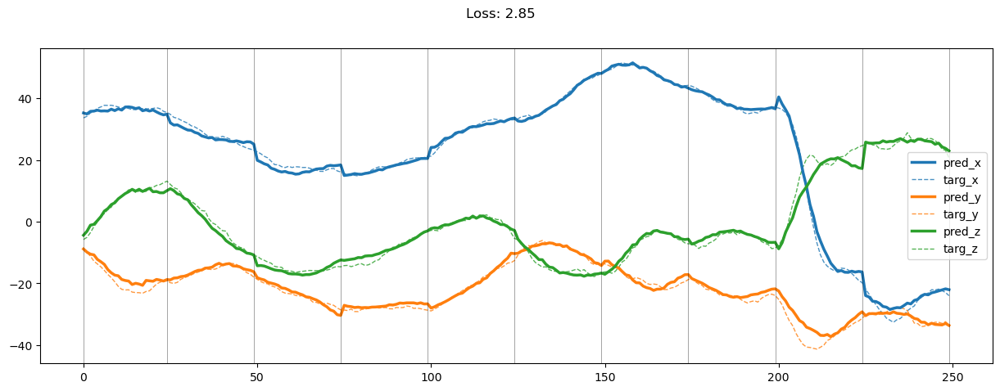

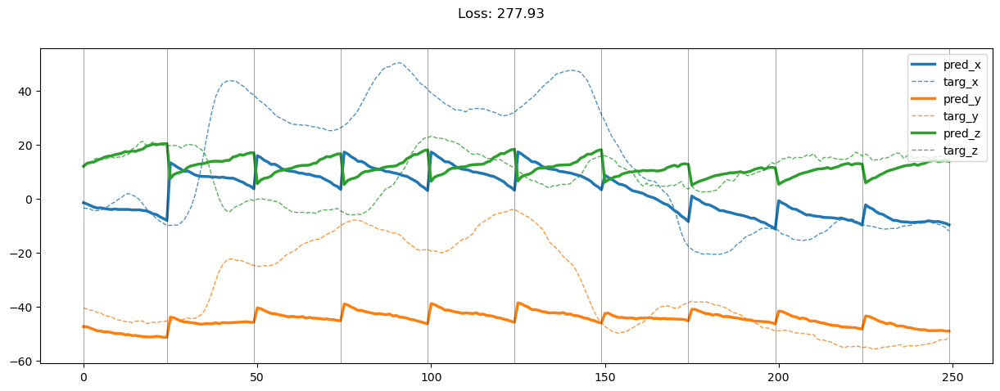

00749: train total loss:  2.688, pred loss:  2.688, valid total loss:  123.822, pred loss:  123.822


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


00750: train total loss:  2.695, pred loss:  2.695, valid total loss:  123.401, pred loss:  123.401


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


00751: train total loss:  2.775, pred loss:  2.775, valid total loss:  123.972, pred loss:  123.972


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


00752: train total loss:  2.784, pred loss:  2.784, valid total loss:  122.117, pred loss:  122.117


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


00753: train total loss:  2.504, pred loss:  2.504, valid total loss:  126.363, pred loss:  126.363


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


00754: train total loss:  2.689, pred loss:  2.689, valid total loss:  116.747, pred loss:  116.747


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


00755: train total loss:  2.626, pred loss:  2.626, valid total loss:  121.482, pred loss:  121.482


100%|██████████| 6/6 [00:00<00:00, 20.56it/s]


00756: train total loss:  2.640, pred loss:  2.640, valid total loss:  121.680, pred loss:  121.680


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


00757: train total loss:  2.601, pred loss:  2.601, valid total loss:  122.678, pred loss:  122.678


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


00758: train total loss:  2.565, pred loss:  2.565, valid total loss:  121.495, pred loss:  121.495


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


00759: train total loss:  2.516, pred loss:  2.516, valid total loss:  128.540, pred loss:  128.540


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


00760: train total loss:  2.630, pred loss:  2.630, valid total loss:  121.392, pred loss:  121.392


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00761: train total loss:  2.571, pred loss:  2.571, valid total loss:  118.590, pred loss:  118.590


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00762: train total loss:  2.541, pred loss:  2.541, valid total loss:  119.995, pred loss:  119.995


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


00763: train total loss:  2.612, pred loss:  2.612, valid total loss:  119.767, pred loss:  119.767


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


00764: train total loss:  2.483, pred loss:  2.483, valid total loss:  122.110, pred loss:  122.110


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


00765: train total loss:  2.547, pred loss:  2.547, valid total loss:  125.067, pred loss:  125.067


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00766: train total loss:  2.535, pred loss:  2.535, valid total loss:  124.439, pred loss:  124.439


100%|██████████| 6/6 [00:00<00:00, 20.53it/s]


00767: train total loss:  2.441, pred loss:  2.441, valid total loss:  122.325, pred loss:  122.325


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00768: train total loss:  2.666, pred loss:  2.666, valid total loss:  122.044, pred loss:  122.044


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00769: train total loss:  2.704, pred loss:  2.704, valid total loss:  123.512, pred loss:  123.512


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


00770: train total loss:  2.558, pred loss:  2.558, valid total loss:  121.970, pred loss:  121.970


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00771: train total loss:  2.559, pred loss:  2.559, valid total loss:  122.578, pred loss:  122.578


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


00772: train total loss:  2.731, pred loss:  2.731, valid total loss:  121.376, pred loss:  121.376


100%|██████████| 6/6 [00:00<00:00, 18.59it/s]


00773: train total loss:  2.586, pred loss:  2.586, valid total loss:  123.629, pred loss:  123.629


100%|██████████| 6/6 [00:00<00:00, 18.27it/s]


00774: train total loss:  2.643, pred loss:  2.643, valid total loss:  132.287, pred loss:  132.287


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00775: train total loss:  2.580, pred loss:  2.580, valid total loss:  132.275, pred loss:  132.275


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


00776: train total loss:  2.503, pred loss:  2.503, valid total loss:  120.549, pred loss:  120.549


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00777: train total loss:  2.478, pred loss:  2.478, valid total loss:  121.805, pred loss:  121.805


100%|██████████| 6/6 [00:00<00:00, 20.56it/s]


00778: train total loss:  2.570, pred loss:  2.570, valid total loss:  124.484, pred loss:  124.484


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


00779: train total loss:  2.508, pred loss:  2.508, valid total loss:  127.331, pred loss:  127.331


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00780: train total loss:  2.445, pred loss:  2.445, valid total loss:  124.722, pred loss:  124.722


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


00781: train total loss:  2.450, pred loss:  2.450, valid total loss:  123.703, pred loss:  123.703


100%|██████████| 6/6 [00:00<00:00, 20.56it/s]


00782: train total loss:  2.408, pred loss:  2.408, valid total loss:  124.419, pred loss:  124.419


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00783: train total loss:  2.404, pred loss:  2.404, valid total loss:  121.145, pred loss:  121.145


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00784: train total loss:  2.416, pred loss:  2.416, valid total loss:  124.399, pred loss:  124.399


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


00785: train total loss:  2.413, pred loss:  2.413, valid total loss:  123.535, pred loss:  123.535


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


00786: train total loss:  2.420, pred loss:  2.420, valid total loss:  124.047, pred loss:  124.047


100%|██████████| 6/6 [00:00<00:00, 20.25it/s]


00787: train total loss:  2.490, pred loss:  2.490, valid total loss:  127.113, pred loss:  127.113


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00788: train total loss:  2.472, pred loss:  2.472, valid total loss:  129.884, pred loss:  129.884


100%|██████████| 6/6 [00:00<00:00, 19.98it/s]


00789: train total loss:  2.435, pred loss:  2.435, valid total loss:  124.444, pred loss:  124.444


100%|██████████| 6/6 [00:00<00:00, 20.58it/s]


00790: train total loss:  2.520, pred loss:  2.520, valid total loss:  123.861, pred loss:  123.861


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


00791: train total loss:  2.477, pred loss:  2.477, valid total loss:  130.688, pred loss:  130.688


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


00792: train total loss:  2.544, pred loss:  2.544, valid total loss:  125.634, pred loss:  125.634


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


00793: train total loss:  2.599, pred loss:  2.599, valid total loss:  127.967, pred loss:  127.967


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


00794: train total loss:  2.546, pred loss:  2.546, valid total loss:  124.473, pred loss:  124.473


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


00795: train total loss:  2.574, pred loss:  2.574, valid total loss:  125.465, pred loss:  125.465


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


00796: train total loss:  2.527, pred loss:  2.527, valid total loss:  125.291, pred loss:  125.291


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


00797: train total loss:  2.595, pred loss:  2.595, valid total loss:  129.525, pred loss:  129.525


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00798: train total loss:  2.576, pred loss:  2.576, valid total loss:  130.223, pred loss:  130.223


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


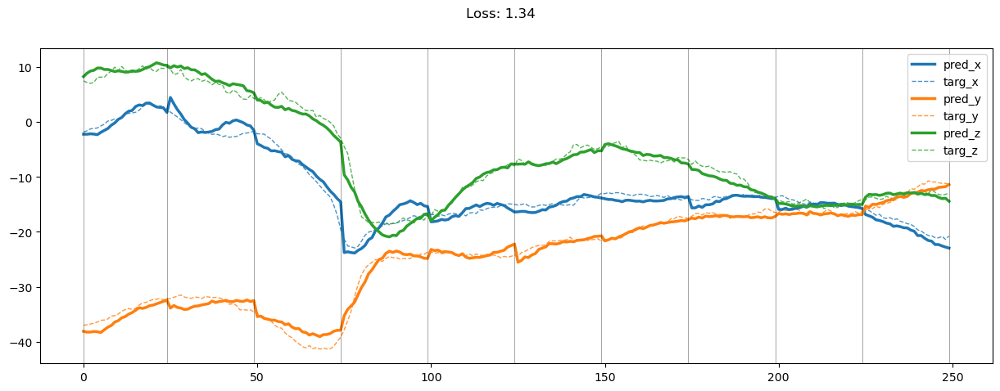

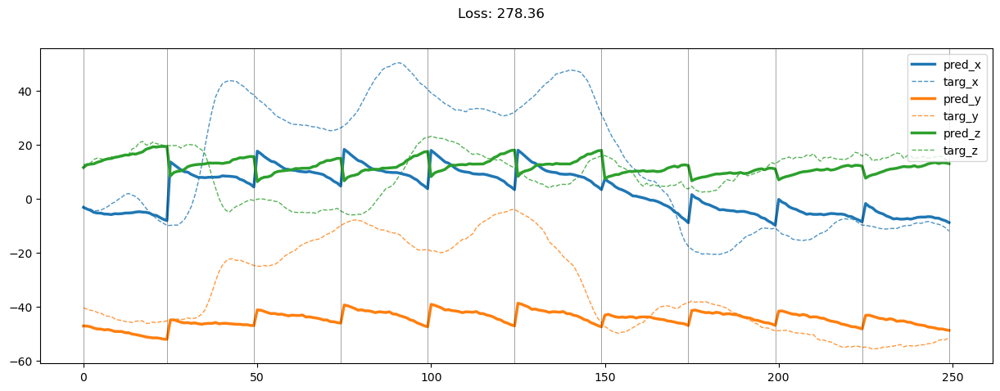

00799: train total loss:  2.509, pred loss:  2.509, valid total loss:  126.160, pred loss:  126.160


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


00800: train total loss:  2.598, pred loss:  2.598, valid total loss:  124.340, pred loss:  124.340


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00801: train total loss:  2.579, pred loss:  2.579, valid total loss:  124.966, pred loss:  124.966


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00802: train total loss:  2.515, pred loss:  2.515, valid total loss:  123.029, pred loss:  123.029


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


00803: train total loss:  2.441, pred loss:  2.441, valid total loss:  126.920, pred loss:  126.920


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00804: train total loss:  2.491, pred loss:  2.491, valid total loss:  123.497, pred loss:  123.497


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


00805: train total loss:  2.545, pred loss:  2.545, valid total loss:  121.837, pred loss:  121.837


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00806: train total loss:  2.415, pred loss:  2.415, valid total loss:  125.825, pred loss:  125.825


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


00807: train total loss:  2.484, pred loss:  2.484, valid total loss:  131.847, pred loss:  131.847


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


00808: train total loss:  2.602, pred loss:  2.602, valid total loss:  131.715, pred loss:  131.715


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


00809: train total loss:  2.382, pred loss:  2.382, valid total loss:  127.388, pred loss:  127.388


100%|██████████| 6/6 [00:00<00:00, 20.54it/s]


00810: train total loss:  2.405, pred loss:  2.405, valid total loss:  132.537, pred loss:  132.537


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00811: train total loss:  2.379, pred loss:  2.379, valid total loss:  128.507, pred loss:  128.507


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00812: train total loss:  2.450, pred loss:  2.450, valid total loss:  127.368, pred loss:  127.368


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


00813: train total loss:  2.392, pred loss:  2.392, valid total loss:  124.540, pred loss:  124.540


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


00814: train total loss:  2.381, pred loss:  2.381, valid total loss:  124.111, pred loss:  124.111


100%|██████████| 6/6 [00:00<00:00, 18.57it/s]


00815: train total loss:  2.426, pred loss:  2.426, valid total loss:  127.489, pred loss:  127.489


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00816: train total loss:  2.375, pred loss:  2.375, valid total loss:  131.017, pred loss:  131.017


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


00817: train total loss:  2.366, pred loss:  2.366, valid total loss:  124.390, pred loss:  124.390


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00818: train total loss:  2.474, pred loss:  2.474, valid total loss:  123.469, pred loss:  123.469


100%|██████████| 6/6 [00:00<00:00, 20.58it/s]


00819: train total loss:  2.444, pred loss:  2.444, valid total loss:  124.419, pred loss:  124.419


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00820: train total loss:  2.497, pred loss:  2.497, valid total loss:  124.493, pred loss:  124.493


100%|██████████| 6/6 [00:00<00:00, 20.56it/s]


00821: train total loss:  2.593, pred loss:  2.593, valid total loss:  128.991, pred loss:  128.991


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


00822: train total loss:  2.480, pred loss:  2.480, valid total loss:  122.618, pred loss:  122.618


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


00823: train total loss:  2.454, pred loss:  2.454, valid total loss:  126.330, pred loss:  126.330


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00824: train total loss:  2.414, pred loss:  2.414, valid total loss:  124.532, pred loss:  124.532


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


00825: train total loss:  2.478, pred loss:  2.478, valid total loss:  126.373, pred loss:  126.373


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00826: train total loss:  2.471, pred loss:  2.471, valid total loss:  122.548, pred loss:  122.548


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


00827: train total loss:  2.455, pred loss:  2.455, valid total loss:  124.280, pred loss:  124.280


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


00828: train total loss:  2.512, pred loss:  2.512, valid total loss:  118.957, pred loss:  118.957


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


00829: train total loss:  2.527, pred loss:  2.527, valid total loss:  117.999, pred loss:  117.999


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


00830: train total loss:  2.456, pred loss:  2.456, valid total loss:  118.548, pred loss:  118.548


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


00831: train total loss:  2.580, pred loss:  2.580, valid total loss:  127.553, pred loss:  127.553


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


00832: train total loss:  2.518, pred loss:  2.518, valid total loss:  126.981, pred loss:  126.981


100%|██████████| 6/6 [00:00<00:00, 19.43it/s]


00833: train total loss:  2.599, pred loss:  2.599, valid total loss:  125.846, pred loss:  125.846


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


00834: train total loss:  2.522, pred loss:  2.522, valid total loss:  126.540, pred loss:  126.540


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


00835: train total loss:  2.524, pred loss:  2.524, valid total loss:  125.820, pred loss:  125.820


100%|██████████| 6/6 [00:00<00:00, 20.56it/s]


00836: train total loss:  2.444, pred loss:  2.444, valid total loss:  124.532, pred loss:  124.532


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


00837: train total loss:  2.429, pred loss:  2.429, valid total loss:  123.325, pred loss:  123.325


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


00838: train total loss:  2.351, pred loss:  2.351, valid total loss:  123.149, pred loss:  123.149


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


00839: train total loss:  2.352, pred loss:  2.352, valid total loss:  122.558, pred loss:  122.558


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


00840: train total loss:  2.401, pred loss:  2.401, valid total loss:  125.380, pred loss:  125.380


100%|██████████| 6/6 [00:00<00:00, 20.42it/s]


00841: train total loss:  2.424, pred loss:  2.424, valid total loss:  124.904, pred loss:  124.904


100%|██████████| 6/6 [00:00<00:00, 20.28it/s]


00842: train total loss:  2.423, pred loss:  2.423, valid total loss:  128.069, pred loss:  128.069


100%|██████████| 6/6 [00:00<00:00, 20.10it/s]


00843: train total loss:  2.326, pred loss:  2.326, valid total loss:  128.160, pred loss:  128.160


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00844: train total loss:  2.212, pred loss:  2.212, valid total loss:  123.817, pred loss:  123.817


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00845: train total loss:  2.299, pred loss:  2.299, valid total loss:  118.736, pred loss:  118.736


100%|██████████| 6/6 [00:00<00:00, 20.04it/s]


00846: train total loss:  2.328, pred loss:  2.328, valid total loss:  123.936, pred loss:  123.936


100%|██████████| 6/6 [00:00<00:00, 20.04it/s]


00847: train total loss:  2.235, pred loss:  2.235, valid total loss:  124.632, pred loss:  124.632


100%|██████████| 6/6 [00:00<00:00, 20.33it/s]


00848: train total loss:  2.172, pred loss:  2.172, valid total loss:  121.127, pred loss:  121.127


100%|██████████| 6/6 [00:00<00:00, 20.31it/s]


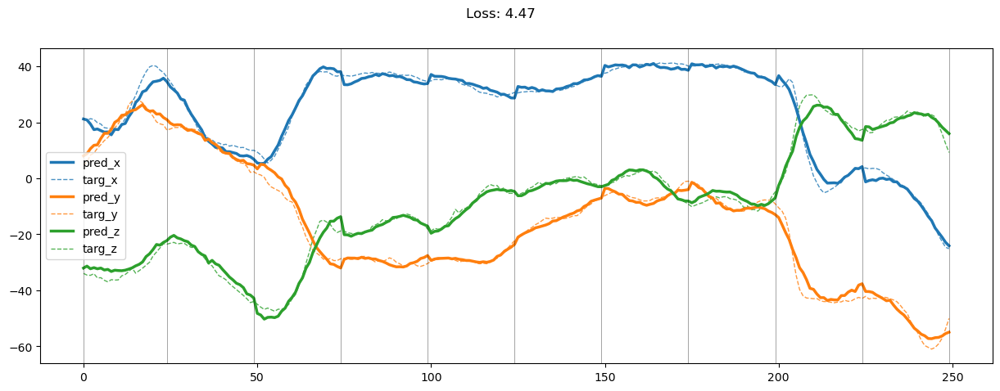

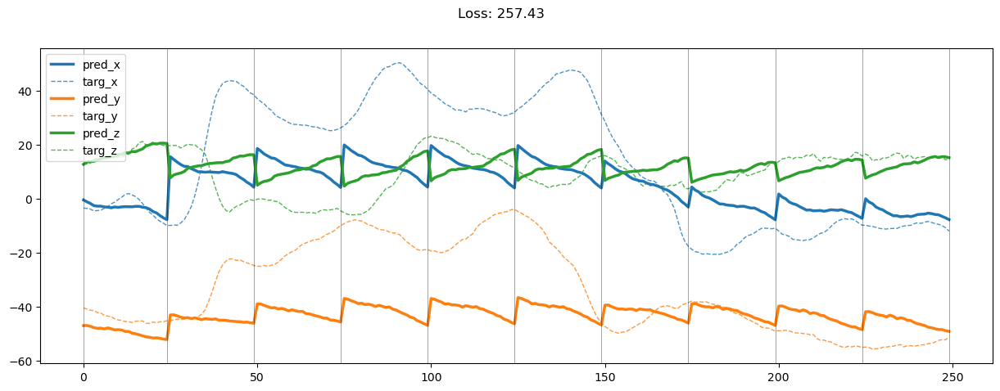

00849: train total loss:  2.231, pred loss:  2.231, valid total loss:  123.234, pred loss:  123.234


100%|██████████| 6/6 [00:00<00:00, 18.43it/s]


00850: train total loss:  2.261, pred loss:  2.261, valid total loss:  127.587, pred loss:  127.587


100%|██████████| 6/6 [00:00<00:00, 19.99it/s]


00851: train total loss:  2.282, pred loss:  2.282, valid total loss:  131.238, pred loss:  131.238


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


00852: train total loss:  2.302, pred loss:  2.302, valid total loss:  121.789, pred loss:  121.789


100%|██████████| 6/6 [00:00<00:00, 20.52it/s]


00853: train total loss:  2.276, pred loss:  2.276, valid total loss:  125.648, pred loss:  125.648


100%|██████████| 6/6 [00:00<00:00, 19.93it/s]


00854: train total loss:  2.242, pred loss:  2.242, valid total loss:  128.307, pred loss:  128.307


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00855: train total loss:  2.233, pred loss:  2.233, valid total loss:  132.608, pred loss:  132.608


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


00856: train total loss:  2.274, pred loss:  2.274, valid total loss:  126.168, pred loss:  126.168


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


00857: train total loss:  2.256, pred loss:  2.256, valid total loss:  126.587, pred loss:  126.587


100%|██████████| 6/6 [00:00<00:00, 20.43it/s]


00858: train total loss:  2.237, pred loss:  2.237, valid total loss:  123.262, pred loss:  123.262


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00859: train total loss:  2.201, pred loss:  2.201, valid total loss:  127.359, pred loss:  127.359


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


00860: train total loss:  2.156, pred loss:  2.156, valid total loss:  127.461, pred loss:  127.461


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


00861: train total loss:  2.111, pred loss:  2.111, valid total loss:  125.299, pred loss:  125.299


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


00862: train total loss:  2.099, pred loss:  2.099, valid total loss:  124.614, pred loss:  124.614


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00863: train total loss:  2.226, pred loss:  2.226, valid total loss:  126.533, pred loss:  126.533


100%|██████████| 6/6 [00:00<00:00, 20.51it/s]


00864: train total loss:  2.222, pred loss:  2.222, valid total loss:  124.045, pred loss:  124.045


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


00865: train total loss:  2.160, pred loss:  2.160, valid total loss:  127.443, pred loss:  127.443


100%|██████████| 6/6 [00:00<00:00, 20.46it/s]


00866: train total loss:  2.153, pred loss:  2.153, valid total loss:  127.921, pred loss:  127.921


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


00867: train total loss:  2.178, pred loss:  2.178, valid total loss:  131.665, pred loss:  131.665


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


00868: train total loss:  2.127, pred loss:  2.127, valid total loss:  128.463, pred loss:  128.463


100%|██████████| 6/6 [00:00<00:00, 20.50it/s]


00869: train total loss:  2.152, pred loss:  2.152, valid total loss:  127.967, pred loss:  127.967


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


00870: train total loss:  2.102, pred loss:  2.102, valid total loss:  129.679, pred loss:  129.679


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


00871: train total loss:  2.132, pred loss:  2.132, valid total loss:  127.609, pred loss:  127.609


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


00872: train total loss:  2.173, pred loss:  2.173, valid total loss:  122.517, pred loss:  122.517


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


00873: train total loss:  2.120, pred loss:  2.120, valid total loss:  128.346, pred loss:  128.346


100%|██████████| 6/6 [00:00<00:00, 20.56it/s]


00874: train total loss:  2.170, pred loss:  2.170, valid total loss:  121.610, pred loss:  121.610


100%|██████████| 6/6 [00:00<00:00, 19.71it/s]


00875: train total loss:  2.152, pred loss:  2.152, valid total loss:  121.310, pred loss:  121.310


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


00876: train total loss:  2.207, pred loss:  2.207, valid total loss:  130.351, pred loss:  130.351


100%|██████████| 6/6 [00:00<00:00, 20.44it/s]


00877: train total loss:  2.128, pred loss:  2.128, valid total loss:  135.654, pred loss:  135.654


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00878: train total loss:  2.183, pred loss:  2.183, valid total loss:  130.991, pred loss:  130.991


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


00879: train total loss:  2.164, pred loss:  2.164, valid total loss:  127.321, pred loss:  127.321


100%|██████████| 6/6 [00:00<00:00, 20.55it/s]


00880: train total loss:  2.300, pred loss:  2.300, valid total loss:  130.865, pred loss:  130.865


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


00881: train total loss:  2.198, pred loss:  2.198, valid total loss:  129.048, pred loss:  129.048


100%|██████████| 6/6 [00:00<00:00, 17.96it/s]


00882: train total loss:  2.213, pred loss:  2.213, valid total loss:  131.512, pred loss:  131.512


100%|██████████| 6/6 [00:00<00:00, 17.99it/s]


00883: train total loss:  2.350, pred loss:  2.350, valid total loss:  134.671, pred loss:  134.671


100%|██████████| 6/6 [00:00<00:00, 18.00it/s]


00884: train total loss:  2.434, pred loss:  2.434, valid total loss:  134.037, pred loss:  134.037


100%|██████████| 6/6 [00:00<00:00, 18.51it/s]


00885: train total loss:  2.407, pred loss:  2.407, valid total loss:  128.063, pred loss:  128.063


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00886: train total loss:  2.343, pred loss:  2.343, valid total loss:  130.348, pred loss:  130.348


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00887: train total loss:  2.303, pred loss:  2.303, valid total loss:  122.206, pred loss:  122.206


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


00888: train total loss:  2.199, pred loss:  2.199, valid total loss:  123.725, pred loss:  123.725


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


00889: train total loss:  2.188, pred loss:  2.188, valid total loss:  127.049, pred loss:  127.049


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


00890: train total loss:  2.199, pred loss:  2.199, valid total loss:  126.489, pred loss:  126.489


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


00891: train total loss:  2.134, pred loss:  2.134, valid total loss:  126.677, pred loss:  126.677


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00892: train total loss:  2.238, pred loss:  2.238, valid total loss:  127.758, pred loss:  127.758


100%|██████████| 6/6 [00:00<00:00, 20.39it/s]


00893: train total loss:  2.245, pred loss:  2.245, valid total loss:  130.663, pred loss:  130.663


100%|██████████| 6/6 [00:00<00:00, 19.42it/s]


00894: train total loss:  2.281, pred loss:  2.281, valid total loss:  132.071, pred loss:  132.071


100%|██████████| 6/6 [00:00<00:00, 17.60it/s]


00895: train total loss:  2.335, pred loss:  2.335, valid total loss:  126.592, pred loss:  126.592


100%|██████████| 6/6 [00:00<00:00, 20.49it/s]


00896: train total loss:  2.202, pred loss:  2.202, valid total loss:  121.135, pred loss:  121.135


100%|██████████| 6/6 [00:00<00:00, 19.37it/s]


00897: train total loss:  2.199, pred loss:  2.199, valid total loss:  127.202, pred loss:  127.202


100%|██████████| 6/6 [00:00<00:00, 17.60it/s]


00898: train total loss:  2.108, pred loss:  2.108, valid total loss:  123.015, pred loss:  123.015


100%|██████████| 6/6 [00:00<00:00, 19.46it/s]


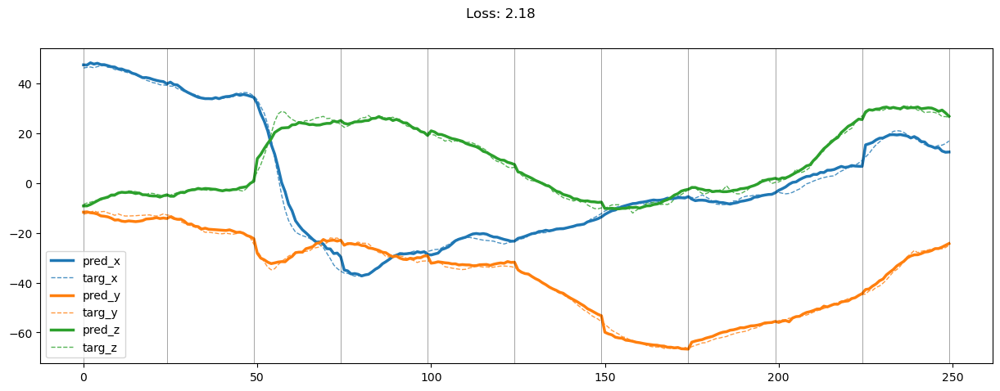

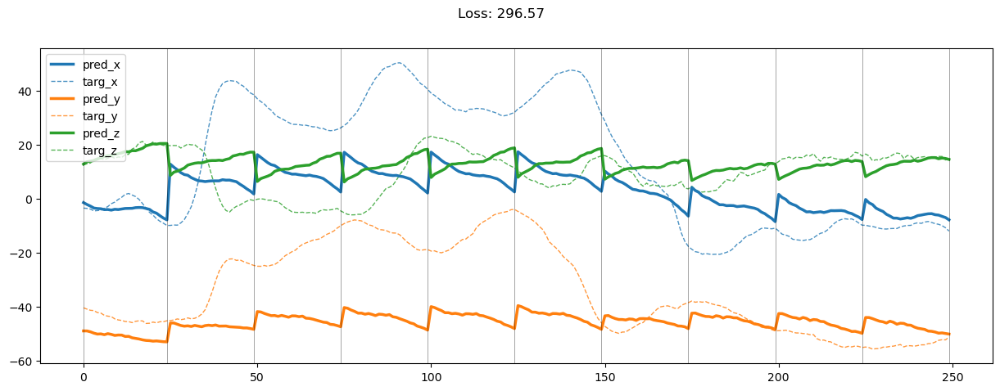

00899: train total loss:  2.051, pred loss:  2.051, valid total loss:  126.591, pred loss:  126.591


100%|██████████| 6/6 [00:00<00:00, 19.98it/s]


00900: train total loss:  2.078, pred loss:  2.078, valid total loss:  125.564, pred loss:  125.564


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00901: train total loss:  2.083, pred loss:  2.083, valid total loss:  125.849, pred loss:  125.849


100%|██████████| 6/6 [00:00<00:00, 20.43it/s]


00902: train total loss:  2.078, pred loss:  2.078, valid total loss:  129.519, pred loss:  129.519


100%|██████████| 6/6 [00:00<00:00, 20.53it/s]


00903: train total loss:  2.176, pred loss:  2.176, valid total loss:  130.967, pred loss:  130.967


100%|██████████| 6/6 [00:00<00:00, 20.55it/s]


00904: train total loss:  2.109, pred loss:  2.109, valid total loss:  133.590, pred loss:  133.590


100%|██████████| 6/6 [00:00<00:00, 20.51it/s]


00905: train total loss:  2.107, pred loss:  2.107, valid total loss:  131.630, pred loss:  131.630


100%|██████████| 6/6 [00:00<00:00, 20.48it/s]


00906: train total loss:  2.078, pred loss:  2.078, valid total loss:  121.837, pred loss:  121.837


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


00907: train total loss:  2.074, pred loss:  2.074, valid total loss:  124.960, pred loss:  124.960


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


00908: train total loss:  2.149, pred loss:  2.149, valid total loss:  124.897, pred loss:  124.897


100%|██████████| 6/6 [00:00<00:00, 19.22it/s]


00909: train total loss:  2.082, pred loss:  2.082, valid total loss:  123.179, pred loss:  123.179


100%|██████████| 6/6 [00:00<00:00, 19.03it/s]


00910: train total loss:  2.135, pred loss:  2.135, valid total loss:  132.296, pred loss:  132.296


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


00911: train total loss:  2.152, pred loss:  2.152, valid total loss:  132.323, pred loss:  132.323


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


00912: train total loss:  2.150, pred loss:  2.150, valid total loss:  127.276, pred loss:  127.276


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


00913: train total loss:  2.112, pred loss:  2.112, valid total loss:  125.558, pred loss:  125.558


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00914: train total loss:  2.130, pred loss:  2.130, valid total loss:  126.786, pred loss:  126.786


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00915: train total loss:  2.131, pred loss:  2.131, valid total loss:  125.136, pred loss:  125.136


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


00916: train total loss:  2.133, pred loss:  2.133, valid total loss:  127.797, pred loss:  127.797


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


00917: train total loss:  2.063, pred loss:  2.063, valid total loss:  130.511, pred loss:  130.511


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00918: train total loss:  2.059, pred loss:  2.059, valid total loss:  125.726, pred loss:  125.726


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


00919: train total loss:  2.055, pred loss:  2.055, valid total loss:  122.738, pred loss:  122.738


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


00920: train total loss:  2.076, pred loss:  2.076, valid total loss:  126.436, pred loss:  126.436


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


00921: train total loss:  2.019, pred loss:  2.019, valid total loss:  126.941, pred loss:  126.941


100%|██████████| 6/6 [00:00<00:00, 20.07it/s]


00922: train total loss:  2.032, pred loss:  2.032, valid total loss:  125.816, pred loss:  125.816


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


00923: train total loss:  2.049, pred loss:  2.049, valid total loss:  120.871, pred loss:  120.871


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


00924: train total loss:  2.060, pred loss:  2.060, valid total loss:  122.522, pred loss:  122.522


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00925: train total loss:  2.036, pred loss:  2.036, valid total loss:  128.476, pred loss:  128.476


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00926: train total loss:  1.997, pred loss:  1.997, valid total loss:  127.727, pred loss:  127.727


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


00927: train total loss:  1.975, pred loss:  1.975, valid total loss:  129.065, pred loss:  129.065


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


00928: train total loss:  1.989, pred loss:  1.989, valid total loss:  133.707, pred loss:  133.707


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


00929: train total loss:  1.884, pred loss:  1.884, valid total loss:  128.838, pred loss:  128.838


100%|██████████| 6/6 [00:00<00:00, 20.40it/s]


00930: train total loss:  2.000, pred loss:  2.000, valid total loss:  128.752, pred loss:  128.752


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00931: train total loss:  1.912, pred loss:  1.912, valid total loss:  126.723, pred loss:  126.723


100%|██████████| 6/6 [00:00<00:00, 19.59it/s]


00932: train total loss:  1.903, pred loss:  1.903, valid total loss:  126.392, pred loss:  126.392


100%|██████████| 6/6 [00:00<00:00, 20.47it/s]


00933: train total loss:  1.951, pred loss:  1.951, valid total loss:  128.109, pred loss:  128.109


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


00934: train total loss:  1.934, pred loss:  1.934, valid total loss:  129.782, pred loss:  129.782


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


00935: train total loss:  1.904, pred loss:  1.904, valid total loss:  126.674, pred loss:  126.674


100%|██████████| 6/6 [00:00<00:00, 18.28it/s]


00936: train total loss:  1.936, pred loss:  1.936, valid total loss:  126.370, pred loss:  126.370


100%|██████████| 6/6 [00:00<00:00, 18.54it/s]


00937: train total loss:  1.993, pred loss:  1.993, valid total loss:  129.945, pred loss:  129.945


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


00938: train total loss:  1.977, pred loss:  1.977, valid total loss:  131.091, pred loss:  131.091


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00939: train total loss:  1.923, pred loss:  1.923, valid total loss:  126.976, pred loss:  126.976


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00940: train total loss:  1.953, pred loss:  1.953, valid total loss:  128.185, pred loss:  128.185


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00941: train total loss:  1.978, pred loss:  1.978, valid total loss:  123.615, pred loss:  123.615


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00942: train total loss:  2.185, pred loss:  2.185, valid total loss:  124.852, pred loss:  124.852


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00943: train total loss:  2.164, pred loss:  2.164, valid total loss:  130.134, pred loss:  130.134


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


00944: train total loss:  2.158, pred loss:  2.158, valid total loss:  129.573, pred loss:  129.573


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


00945: train total loss:  2.146, pred loss:  2.146, valid total loss:  124.837, pred loss:  124.837


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00946: train total loss:  2.085, pred loss:  2.085, valid total loss:  124.308, pred loss:  124.308


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


00947: train total loss:  2.001, pred loss:  2.001, valid total loss:  124.312, pred loss:  124.312


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00948: train total loss:  1.986, pred loss:  1.986, valid total loss:  125.375, pred loss:  125.375


100%|██████████| 6/6 [00:00<00:00, 19.60it/s]


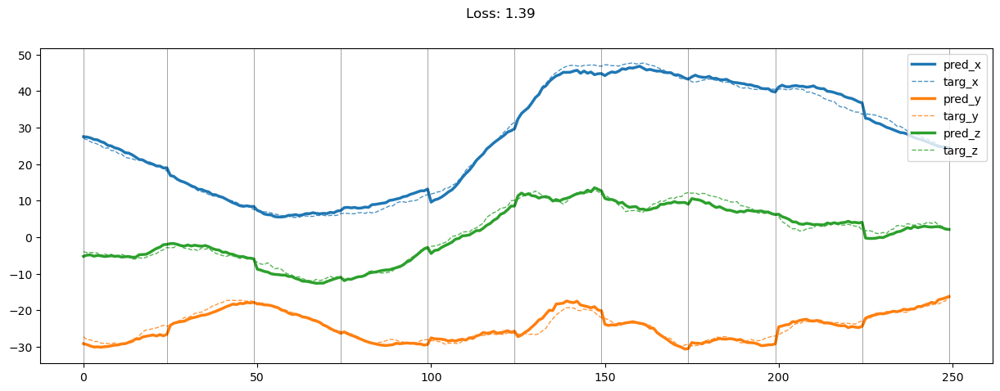

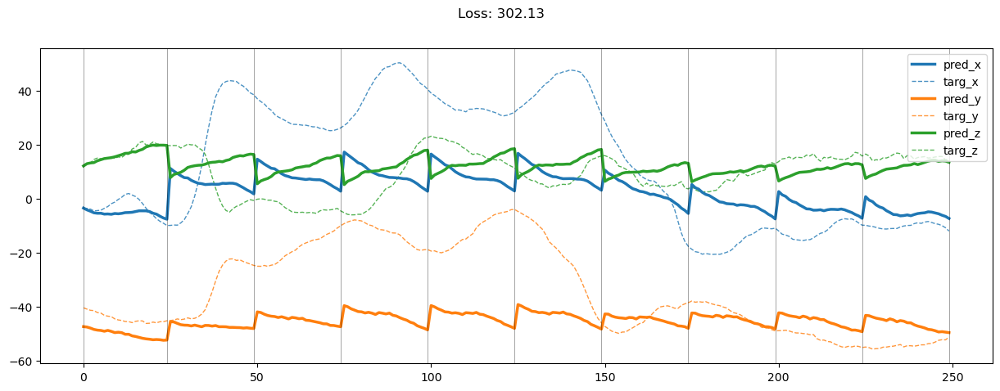

00949: train total loss:  1.960, pred loss:  1.960, valid total loss:  126.753, pred loss:  126.753


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


00950: train total loss:  1.897, pred loss:  1.897, valid total loss:  124.569, pred loss:  124.569


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


00951: train total loss:  1.929, pred loss:  1.929, valid total loss:  127.177, pred loss:  127.177


100%|██████████| 6/6 [00:00<00:00, 18.61it/s]


00952: train total loss:  1.968, pred loss:  1.968, valid total loss:  124.709, pred loss:  124.709


100%|██████████| 6/6 [00:00<00:00, 17.94it/s]


00953: train total loss:  1.931, pred loss:  1.931, valid total loss:  129.350, pred loss:  129.350


100%|██████████| 6/6 [00:00<00:00, 17.78it/s]


00954: train total loss:  1.944, pred loss:  1.944, valid total loss:  128.694, pred loss:  128.694


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


00955: train total loss:  1.892, pred loss:  1.892, valid total loss:  128.810, pred loss:  128.810


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


00956: train total loss:  1.900, pred loss:  1.900, valid total loss:  125.489, pred loss:  125.489


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


00957: train total loss:  1.933, pred loss:  1.933, valid total loss:  125.628, pred loss:  125.628


100%|██████████| 6/6 [00:00<00:00, 20.02it/s]


00958: train total loss:  2.006, pred loss:  2.006, valid total loss:  128.689, pred loss:  128.689


100%|██████████| 6/6 [00:00<00:00, 20.58it/s]


00959: train total loss:  1.951, pred loss:  1.951, valid total loss:  126.329, pred loss:  126.329


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


00960: train total loss:  1.982, pred loss:  1.982, valid total loss:  126.394, pred loss:  126.394


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00961: train total loss:  1.983, pred loss:  1.983, valid total loss:  122.634, pred loss:  122.634


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


00962: train total loss:  1.990, pred loss:  1.990, valid total loss:  126.379, pred loss:  126.379


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


00963: train total loss:  1.987, pred loss:  1.987, valid total loss:  120.154, pred loss:  120.154


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


00964: train total loss:  2.028, pred loss:  2.028, valid total loss:  121.145, pred loss:  121.145


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


00965: train total loss:  2.022, pred loss:  2.022, valid total loss:  120.126, pred loss:  120.126


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


00966: train total loss:  2.063, pred loss:  2.063, valid total loss:  123.384, pred loss:  123.384


100%|██████████| 6/6 [00:00<00:00, 18.73it/s]


00967: train total loss:  1.856, pred loss:  1.856, valid total loss:  126.523, pred loss:  126.523


100%|██████████| 6/6 [00:00<00:00, 19.63it/s]


00968: train total loss:  1.906, pred loss:  1.906, valid total loss:  128.420, pred loss:  128.420


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


00969: train total loss:  1.882, pred loss:  1.882, valid total loss:  124.497, pred loss:  124.497


100%|██████████| 6/6 [00:00<00:00, 20.32it/s]


00970: train total loss:  1.857, pred loss:  1.857, valid total loss:  124.195, pred loss:  124.195


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00971: train total loss:  1.923, pred loss:  1.923, valid total loss:  118.644, pred loss:  118.644


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


00972: train total loss:  1.874, pred loss:  1.874, valid total loss:  123.153, pred loss:  123.153


100%|██████████| 6/6 [00:00<00:00, 18.74it/s]


00973: train total loss:  1.957, pred loss:  1.957, valid total loss:  129.927, pred loss:  129.927


100%|██████████| 6/6 [00:00<00:00, 20.58it/s]


00974: train total loss:  1.918, pred loss:  1.918, valid total loss:  126.844, pred loss:  126.844


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


00975: train total loss:  1.890, pred loss:  1.890, valid total loss:  122.961, pred loss:  122.961


100%|██████████| 6/6 [00:00<00:00, 19.68it/s]


00976: train total loss:  1.912, pred loss:  1.912, valid total loss:  125.400, pred loss:  125.400


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00977: train total loss:  1.924, pred loss:  1.924, valid total loss:  126.016, pred loss:  126.016


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


00978: train total loss:  1.969, pred loss:  1.969, valid total loss:  124.846, pred loss:  124.846


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


00979: train total loss:  1.999, pred loss:  1.999, valid total loss:  126.722, pred loss:  126.722


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


00980: train total loss:  1.945, pred loss:  1.945, valid total loss:  123.416, pred loss:  123.416


100%|██████████| 6/6 [00:00<00:00, 20.50it/s]


00981: train total loss:  1.981, pred loss:  1.981, valid total loss:  124.863, pred loss:  124.863


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


00982: train total loss:  1.891, pred loss:  1.891, valid total loss:  122.802, pred loss:  122.802


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


00983: train total loss:  1.870, pred loss:  1.870, valid total loss:  125.655, pred loss:  125.655


100%|██████████| 6/6 [00:00<00:00, 20.35it/s]


00984: train total loss:  1.878, pred loss:  1.878, valid total loss:  127.320, pred loss:  127.320


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


00985: train total loss:  1.798, pred loss:  1.798, valid total loss:  126.422, pred loss:  126.422


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00986: train total loss:  1.835, pred loss:  1.835, valid total loss:  120.192, pred loss:  120.192


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00987: train total loss:  1.777, pred loss:  1.777, valid total loss:  121.270, pred loss:  121.270


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


00988: train total loss:  1.777, pred loss:  1.777, valid total loss:  127.307, pred loss:  127.307


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


00989: train total loss:  1.817, pred loss:  1.817, valid total loss:  127.454, pred loss:  127.454


100%|██████████| 6/6 [00:00<00:00, 20.49it/s]


00990: train total loss:  1.854, pred loss:  1.854, valid total loss:  127.615, pred loss:  127.615


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00991: train total loss:  1.843, pred loss:  1.843, valid total loss:  133.125, pred loss:  133.125


100%|██████████| 6/6 [00:00<00:00, 20.53it/s]


00992: train total loss:  1.804, pred loss:  1.804, valid total loss:  131.106, pred loss:  131.106


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00993: train total loss:  1.837, pred loss:  1.837, valid total loss:  131.418, pred loss:  131.418


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


00994: train total loss:  1.782, pred loss:  1.782, valid total loss:  130.046, pred loss:  130.046


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00995: train total loss:  1.777, pred loss:  1.777, valid total loss:  128.937, pred loss:  128.937


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


00996: train total loss:  1.731, pred loss:  1.731, valid total loss:  128.238, pred loss:  128.238


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


00997: train total loss:  1.736, pred loss:  1.736, valid total loss:  131.266, pred loss:  131.266


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00998: train total loss:  1.831, pred loss:  1.831, valid total loss:  135.313, pred loss:  135.313


100%|██████████| 6/6 [00:00<00:00, 20.00it/s]


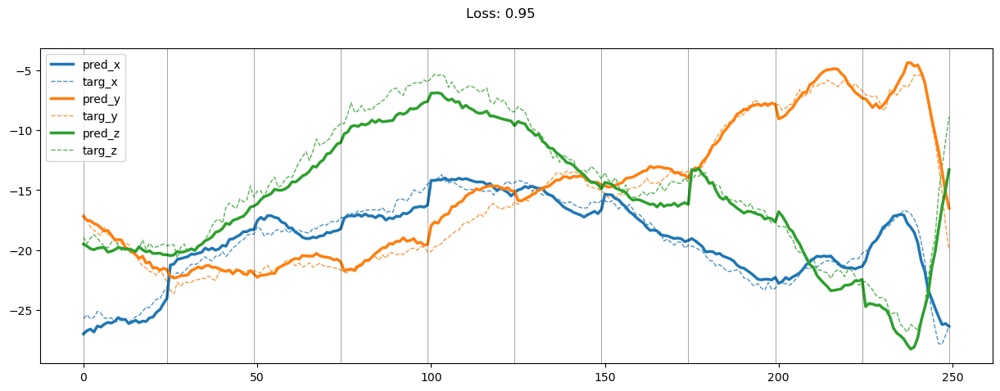

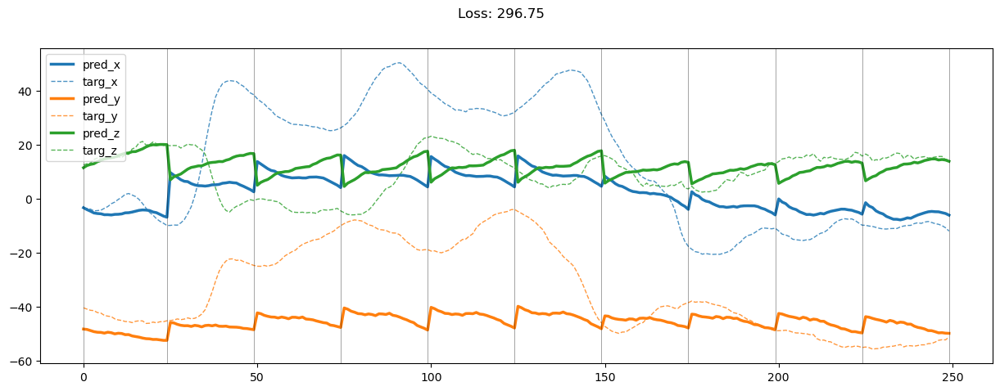

00999: train total loss:  1.792, pred loss:  1.792, valid total loss:  135.077, pred loss:  135.077


100%|██████████| 6/6 [00:00<00:00, 20.51it/s]


01000: train total loss:  1.848, pred loss:  1.848, valid total loss:  128.727, pred loss:  128.727


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01001: train total loss:  1.818, pred loss:  1.818, valid total loss:  126.523, pred loss:  126.523


100%|██████████| 6/6 [00:00<00:00, 20.58it/s]


01002: train total loss:  1.777, pred loss:  1.777, valid total loss:  130.123, pred loss:  130.123


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


01003: train total loss:  1.760, pred loss:  1.760, valid total loss:  131.316, pred loss:  131.316


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


01004: train total loss:  1.820, pred loss:  1.820, valid total loss:  129.304, pred loss:  129.304


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01005: train total loss:  1.826, pred loss:  1.826, valid total loss:  128.941, pred loss:  128.941


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


01006: train total loss:  1.796, pred loss:  1.796, valid total loss:  126.516, pred loss:  126.516


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01007: train total loss:  1.767, pred loss:  1.767, valid total loss:  129.658, pred loss:  129.658


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


01008: train total loss:  1.704, pred loss:  1.704, valid total loss:  126.450, pred loss:  126.450


100%|██████████| 6/6 [00:00<00:00, 20.49it/s]


01009: train total loss:  1.744, pred loss:  1.744, valid total loss:  125.972, pred loss:  125.972


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01010: train total loss:  1.730, pred loss:  1.730, valid total loss:  125.827, pred loss:  125.827


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01011: train total loss:  1.802, pred loss:  1.802, valid total loss:  127.103, pred loss:  127.103


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01012: train total loss:  1.705, pred loss:  1.705, valid total loss:  124.733, pred loss:  124.733


100%|██████████| 6/6 [00:00<00:00, 19.55it/s]


01013: train total loss:  1.699, pred loss:  1.699, valid total loss:  129.170, pred loss:  129.170


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01014: train total loss:  1.714, pred loss:  1.714, valid total loss:  128.747, pred loss:  128.747


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01015: train total loss:  1.700, pred loss:  1.700, valid total loss:  127.046, pred loss:  127.046


100%|██████████| 6/6 [00:00<00:00, 20.49it/s]


01016: train total loss:  1.724, pred loss:  1.724, valid total loss:  125.876, pred loss:  125.876


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01017: train total loss:  1.676, pred loss:  1.676, valid total loss:  131.060, pred loss:  131.060


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


01018: train total loss:  1.707, pred loss:  1.707, valid total loss:  126.386, pred loss:  126.386


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01019: train total loss:  1.718, pred loss:  1.718, valid total loss:  126.494, pred loss:  126.494


100%|██████████| 6/6 [00:00<00:00, 20.56it/s]


01020: train total loss:  1.796, pred loss:  1.796, valid total loss:  127.263, pred loss:  127.263


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01021: train total loss:  1.855, pred loss:  1.855, valid total loss:  133.681, pred loss:  133.681


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01022: train total loss:  1.773, pred loss:  1.773, valid total loss:  131.292, pred loss:  131.292


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01023: train total loss:  1.753, pred loss:  1.753, valid total loss:  129.098, pred loss:  129.098


100%|██████████| 6/6 [00:00<00:00, 20.12it/s]


01024: train total loss:  1.788, pred loss:  1.788, valid total loss:  130.273, pred loss:  130.273


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01025: train total loss:  1.756, pred loss:  1.756, valid total loss:  127.459, pred loss:  127.459


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01026: train total loss:  1.771, pred loss:  1.771, valid total loss:  125.507, pred loss:  125.507


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01027: train total loss:  1.715, pred loss:  1.715, valid total loss:  125.800, pred loss:  125.800


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


01028: train total loss:  1.726, pred loss:  1.726, valid total loss:  124.636, pred loss:  124.636


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01029: train total loss:  1.709, pred loss:  1.709, valid total loss:  126.683, pred loss:  126.683


100%|██████████| 6/6 [00:00<00:00, 20.58it/s]


01030: train total loss:  1.681, pred loss:  1.681, valid total loss:  127.881, pred loss:  127.881


100%|██████████| 6/6 [00:00<00:00, 20.51it/s]


01031: train total loss:  1.657, pred loss:  1.657, valid total loss:  127.444, pred loss:  127.444


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01032: train total loss:  1.680, pred loss:  1.680, valid total loss:  129.111, pred loss:  129.111


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01033: train total loss:  1.696, pred loss:  1.696, valid total loss:  129.119, pred loss:  129.119


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01034: train total loss:  1.730, pred loss:  1.730, valid total loss:  127.046, pred loss:  127.046


100%|██████████| 6/6 [00:00<00:00, 20.51it/s]


01035: train total loss:  1.658, pred loss:  1.658, valid total loss:  129.690, pred loss:  129.690


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01036: train total loss:  1.761, pred loss:  1.761, valid total loss:  133.340, pred loss:  133.340


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01037: train total loss:  1.745, pred loss:  1.745, valid total loss:  133.267, pred loss:  133.267


100%|██████████| 6/6 [00:00<00:00, 20.35it/s]


01038: train total loss:  1.780, pred loss:  1.780, valid total loss:  133.094, pred loss:  133.094


100%|██████████| 6/6 [00:00<00:00, 19.65it/s]


01039: train total loss:  1.827, pred loss:  1.827, valid total loss:  130.029, pred loss:  130.029


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01040: train total loss:  1.864, pred loss:  1.864, valid total loss:  127.222, pred loss:  127.222


100%|██████████| 6/6 [00:00<00:00, 18.69it/s]


01041: train total loss:  1.830, pred loss:  1.830, valid total loss:  122.283, pred loss:  122.283


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01042: train total loss:  1.814, pred loss:  1.814, valid total loss:  124.262, pred loss:  124.262


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01043: train total loss:  1.760, pred loss:  1.760, valid total loss:  127.130, pred loss:  127.130


100%|██████████| 6/6 [00:00<00:00, 20.31it/s]


01044: train total loss:  1.742, pred loss:  1.742, valid total loss:  131.446, pred loss:  131.446


100%|██████████| 6/6 [00:00<00:00, 17.99it/s]


01045: train total loss:  1.660, pred loss:  1.660, valid total loss:  131.130, pred loss:  131.130


100%|██████████| 6/6 [00:00<00:00, 20.55it/s]


01046: train total loss:  1.701, pred loss:  1.701, valid total loss:  131.641, pred loss:  131.641


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01047: train total loss:  1.802, pred loss:  1.802, valid total loss:  132.267, pred loss:  132.267


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01048: train total loss:  1.769, pred loss:  1.769, valid total loss:  127.018, pred loss:  127.018


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


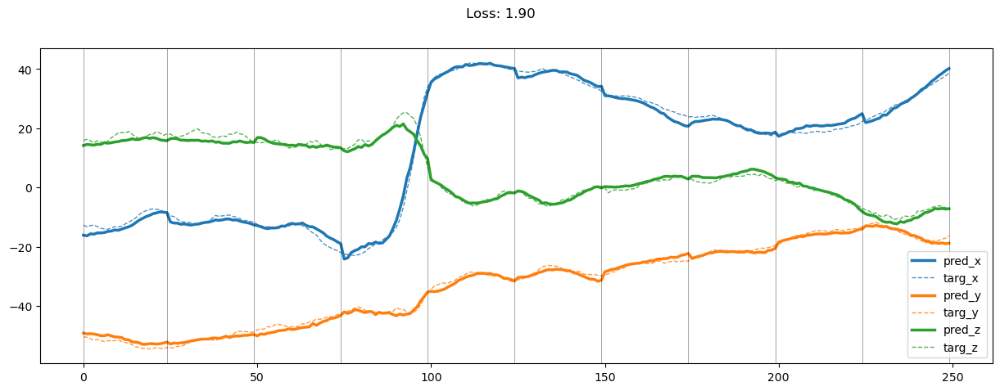

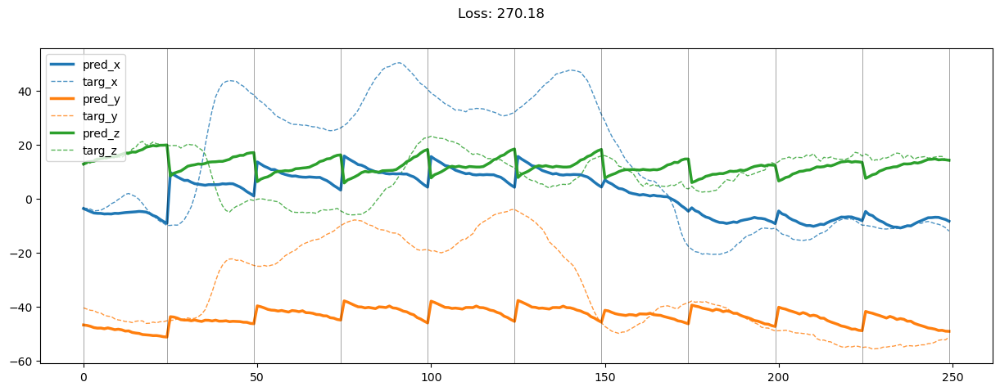

01049: train total loss:  1.732, pred loss:  1.732, valid total loss:  134.388, pred loss:  134.388


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01050: train total loss:  1.758, pred loss:  1.758, valid total loss:  133.335, pred loss:  133.335


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


01051: train total loss:  1.762, pred loss:  1.762, valid total loss:  129.189, pred loss:  129.189


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01052: train total loss:  1.720, pred loss:  1.720, valid total loss:  128.880, pred loss:  128.880


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01053: train total loss:  1.714, pred loss:  1.714, valid total loss:  129.354, pred loss:  129.354


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01054: train total loss:  1.696, pred loss:  1.696, valid total loss:  128.467, pred loss:  128.467


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


01055: train total loss:  1.629, pred loss:  1.629, valid total loss:  125.699, pred loss:  125.699


100%|██████████| 6/6 [00:00<00:00, 20.41it/s]


01056: train total loss:  1.650, pred loss:  1.650, valid total loss:  126.624, pred loss:  126.624


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01057: train total loss:  1.632, pred loss:  1.632, valid total loss:  126.877, pred loss:  126.877


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01058: train total loss:  1.684, pred loss:  1.684, valid total loss:  128.014, pred loss:  128.014


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01059: train total loss:  1.709, pred loss:  1.709, valid total loss:  127.947, pred loss:  127.947


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


01060: train total loss:  1.767, pred loss:  1.767, valid total loss:  126.675, pred loss:  126.675


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01061: train total loss:  1.690, pred loss:  1.690, valid total loss:  121.114, pred loss:  121.114


100%|██████████| 6/6 [00:00<00:00, 18.53it/s]


01062: train total loss:  1.696, pred loss:  1.696, valid total loss:  123.268, pred loss:  123.268


100%|██████████| 6/6 [00:00<00:00, 17.61it/s]


01063: train total loss:  1.773, pred loss:  1.773, valid total loss:  128.289, pred loss:  128.289


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01064: train total loss:  1.673, pred loss:  1.673, valid total loss:  126.728, pred loss:  126.728


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01065: train total loss:  1.720, pred loss:  1.720, valid total loss:  126.556, pred loss:  126.556


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01066: train total loss:  1.736, pred loss:  1.736, valid total loss:  124.791, pred loss:  124.791


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01067: train total loss:  1.688, pred loss:  1.688, valid total loss:  123.312, pred loss:  123.312


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01068: train total loss:  1.723, pred loss:  1.723, valid total loss:  119.817, pred loss:  119.817


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01069: train total loss:  1.829, pred loss:  1.829, valid total loss:  125.714, pred loss:  125.714


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01070: train total loss:  1.725, pred loss:  1.725, valid total loss:  126.614, pred loss:  126.614


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01071: train total loss:  1.730, pred loss:  1.730, valid total loss:  126.326, pred loss:  126.326


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01072: train total loss:  1.754, pred loss:  1.754, valid total loss:  121.249, pred loss:  121.249


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01073: train total loss:  1.676, pred loss:  1.676, valid total loss:  124.469, pred loss:  124.469


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01074: train total loss:  1.716, pred loss:  1.716, valid total loss:  125.589, pred loss:  125.589


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


01075: train total loss:  1.688, pred loss:  1.688, valid total loss:  129.960, pred loss:  129.960


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01076: train total loss:  1.617, pred loss:  1.617, valid total loss:  131.387, pred loss:  131.387


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01077: train total loss:  1.704, pred loss:  1.704, valid total loss:  128.500, pred loss:  128.500


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01078: train total loss:  1.632, pred loss:  1.632, valid total loss:  120.833, pred loss:  120.833


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01079: train total loss:  1.651, pred loss:  1.651, valid total loss:  128.096, pred loss:  128.096


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01080: train total loss:  1.693, pred loss:  1.693, valid total loss:  127.580, pred loss:  127.580


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01081: train total loss:  1.707, pred loss:  1.707, valid total loss:  127.882, pred loss:  127.882


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01082: train total loss:  1.740, pred loss:  1.740, valid total loss:  127.828, pred loss:  127.828


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01083: train total loss:  1.662, pred loss:  1.662, valid total loss:  125.715, pred loss:  125.715


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01084: train total loss:  1.632, pred loss:  1.632, valid total loss:  126.686, pred loss:  126.686


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01085: train total loss:  1.655, pred loss:  1.655, valid total loss:  129.881, pred loss:  129.881


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01086: train total loss:  1.629, pred loss:  1.629, valid total loss:  123.943, pred loss:  123.943


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01087: train total loss:  1.674, pred loss:  1.674, valid total loss:  127.436, pred loss:  127.436


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01088: train total loss:  1.675, pred loss:  1.675, valid total loss:  123.487, pred loss:  123.487


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01089: train total loss:  1.672, pred loss:  1.672, valid total loss:  125.637, pred loss:  125.637


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01090: train total loss:  1.583, pred loss:  1.583, valid total loss:  123.229, pred loss:  123.229


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01091: train total loss:  1.630, pred loss:  1.630, valid total loss:  123.946, pred loss:  123.946


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01092: train total loss:  1.730, pred loss:  1.730, valid total loss:  135.891, pred loss:  135.891


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01093: train total loss:  1.632, pred loss:  1.632, valid total loss:  133.435, pred loss:  133.435


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01094: train total loss:  1.619, pred loss:  1.619, valid total loss:  125.966, pred loss:  125.966


100%|██████████| 6/6 [00:00<00:00, 20.16it/s]


01095: train total loss:  1.590, pred loss:  1.590, valid total loss:  126.347, pred loss:  126.347


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01096: train total loss:  1.609, pred loss:  1.609, valid total loss:  128.138, pred loss:  128.138


100%|██████████| 6/6 [00:00<00:00, 20.07it/s]


01097: train total loss:  1.599, pred loss:  1.599, valid total loss:  126.388, pred loss:  126.388


100%|██████████| 6/6 [00:00<00:00, 20.06it/s]


01098: train total loss:  1.582, pred loss:  1.582, valid total loss:  127.429, pred loss:  127.429


100%|██████████| 6/6 [00:00<00:00, 19.44it/s]


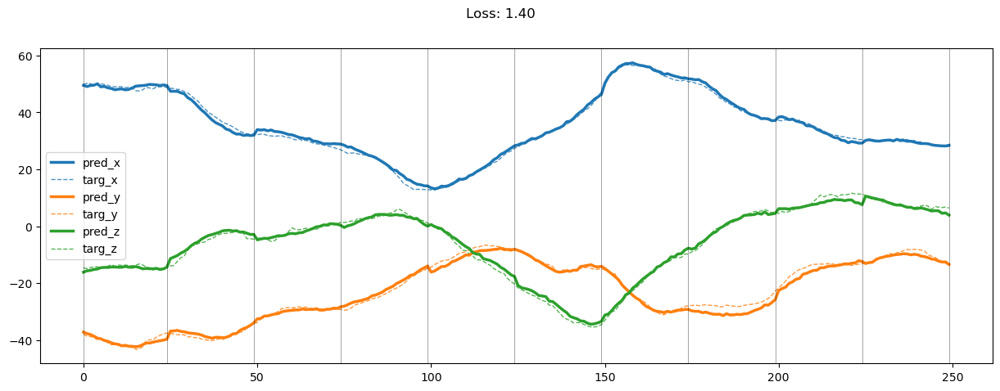

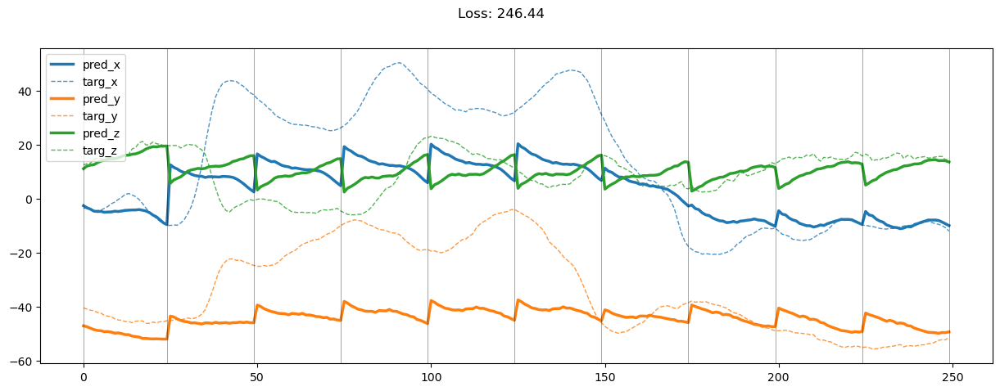

01099: train total loss:  1.643, pred loss:  1.643, valid total loss:  131.562, pred loss:  131.562


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


01100: train total loss:  1.631, pred loss:  1.631, valid total loss:  132.526, pred loss:  132.526


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01101: train total loss:  1.636, pred loss:  1.636, valid total loss:  125.320, pred loss:  125.320


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


01102: train total loss:  1.691, pred loss:  1.691, valid total loss:  122.640, pred loss:  122.640


100%|██████████| 6/6 [00:00<00:00, 19.27it/s]


01103: train total loss:  1.672, pred loss:  1.672, valid total loss:  130.450, pred loss:  130.450


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


01104: train total loss:  1.672, pred loss:  1.672, valid total loss:  123.832, pred loss:  123.832


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01105: train total loss:  1.721, pred loss:  1.721, valid total loss:  124.933, pred loss:  124.933


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01106: train total loss:  1.735, pred loss:  1.735, valid total loss:  126.748, pred loss:  126.748


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01107: train total loss:  1.675, pred loss:  1.675, valid total loss:  125.856, pred loss:  125.856


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01108: train total loss:  1.689, pred loss:  1.689, valid total loss:  129.395, pred loss:  129.395


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01109: train total loss:  1.725, pred loss:  1.725, valid total loss:  126.838, pred loss:  126.838


100%|██████████| 6/6 [00:00<00:00, 20.43it/s]


01110: train total loss:  1.711, pred loss:  1.711, valid total loss:  130.962, pred loss:  130.962


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01111: train total loss:  1.701, pred loss:  1.701, valid total loss:  129.160, pred loss:  129.160


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01112: train total loss:  1.666, pred loss:  1.666, valid total loss:  128.856, pred loss:  128.856


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


01113: train total loss:  1.632, pred loss:  1.632, valid total loss:  126.374, pred loss:  126.374


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01114: train total loss:  1.731, pred loss:  1.731, valid total loss:  122.940, pred loss:  122.940


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01115: train total loss:  1.688, pred loss:  1.688, valid total loss:  122.091, pred loss:  122.091


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01116: train total loss:  1.626, pred loss:  1.626, valid total loss:  128.210, pred loss:  128.210


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01117: train total loss:  1.710, pred loss:  1.710, valid total loss:  133.182, pred loss:  133.182


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01118: train total loss:  1.621, pred loss:  1.621, valid total loss:  126.991, pred loss:  126.991


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01119: train total loss:  1.641, pred loss:  1.641, valid total loss:  126.572, pred loss:  126.572


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01120: train total loss:  1.600, pred loss:  1.600, valid total loss:  122.646, pred loss:  122.646


100%|██████████| 6/6 [00:00<00:00, 20.44it/s]


01121: train total loss:  1.531, pred loss:  1.531, valid total loss:  121.902, pred loss:  121.902


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01122: train total loss:  1.532, pred loss:  1.532, valid total loss:  124.351, pred loss:  124.351


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01123: train total loss:  1.582, pred loss:  1.582, valid total loss:  124.737, pred loss:  124.737


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01124: train total loss:  1.587, pred loss:  1.587, valid total loss:  124.304, pred loss:  124.304


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01125: train total loss:  1.632, pred loss:  1.632, valid total loss:  125.840, pred loss:  125.840


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01126: train total loss:  1.635, pred loss:  1.635, valid total loss:  127.833, pred loss:  127.833


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


01127: train total loss:  1.598, pred loss:  1.598, valid total loss:  129.423, pred loss:  129.423


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01128: train total loss:  1.589, pred loss:  1.589, valid total loss:  130.978, pred loss:  130.978


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01129: train total loss:  1.573, pred loss:  1.573, valid total loss:  121.740, pred loss:  121.740


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01130: train total loss:  1.622, pred loss:  1.622, valid total loss:  123.634, pred loss:  123.634


100%|██████████| 6/6 [00:00<00:00, 20.32it/s]


01131: train total loss:  1.648, pred loss:  1.648, valid total loss:  126.327, pred loss:  126.327


100%|██████████| 6/6 [00:00<00:00, 18.62it/s]


01132: train total loss:  1.599, pred loss:  1.599, valid total loss:  127.950, pred loss:  127.950


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01133: train total loss:  1.583, pred loss:  1.583, valid total loss:  128.267, pred loss:  128.267


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01134: train total loss:  1.598, pred loss:  1.598, valid total loss:  125.320, pred loss:  125.320


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01135: train total loss:  1.555, pred loss:  1.555, valid total loss:  127.948, pred loss:  127.948


100%|██████████| 6/6 [00:00<00:00, 20.05it/s]


01136: train total loss:  1.568, pred loss:  1.568, valid total loss:  126.165, pred loss:  126.165


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01137: train total loss:  1.580, pred loss:  1.580, valid total loss:  127.275, pred loss:  127.275


100%|██████████| 6/6 [00:00<00:00, 20.50it/s]


01138: train total loss:  1.483, pred loss:  1.483, valid total loss:  126.001, pred loss:  126.001


100%|██████████| 6/6 [00:00<00:00, 19.70it/s]


01139: train total loss:  1.506, pred loss:  1.506, valid total loss:  124.633, pred loss:  124.633


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01140: train total loss:  1.552, pred loss:  1.552, valid total loss:  122.691, pred loss:  122.691


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01141: train total loss:  1.589, pred loss:  1.589, valid total loss:  128.207, pred loss:  128.207


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01142: train total loss:  1.498, pred loss:  1.498, valid total loss:  126.081, pred loss:  126.081


100%|██████████| 6/6 [00:00<00:00, 20.41it/s]


01143: train total loss:  1.562, pred loss:  1.562, valid total loss:  126.232, pred loss:  126.232


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01144: train total loss:  1.500, pred loss:  1.500, valid total loss:  124.881, pred loss:  124.881


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01145: train total loss:  1.471, pred loss:  1.471, valid total loss:  127.393, pred loss:  127.393


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01146: train total loss:  1.479, pred loss:  1.479, valid total loss:  125.376, pred loss:  125.376


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01147: train total loss:  1.521, pred loss:  1.521, valid total loss:  124.881, pred loss:  124.881


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


01148: train total loss:  1.501, pred loss:  1.501, valid total loss:  124.062, pred loss:  124.062


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


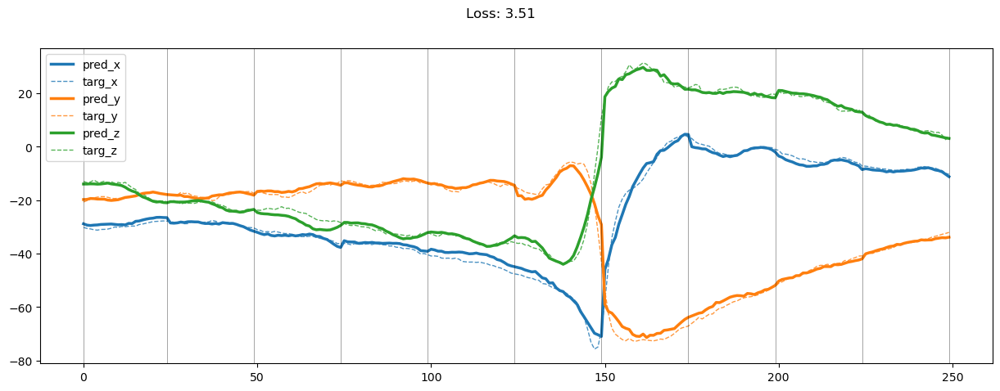

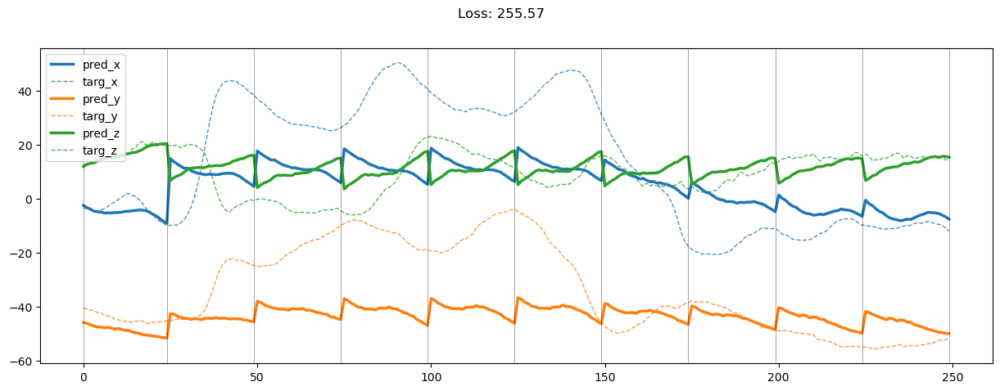

01149: train total loss:  1.487, pred loss:  1.487, valid total loss:  128.683, pred loss:  128.683


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01150: train total loss:  1.572, pred loss:  1.572, valid total loss:  121.600, pred loss:  121.600


100%|██████████| 6/6 [00:00<00:00, 19.57it/s]


01151: train total loss:  1.504, pred loss:  1.504, valid total loss:  123.086, pred loss:  123.086


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


01152: train total loss:  1.575, pred loss:  1.575, valid total loss:  125.437, pred loss:  125.437


100%|██████████| 6/6 [00:00<00:00, 20.41it/s]


01153: train total loss:  1.562, pred loss:  1.562, valid total loss:  125.162, pred loss:  125.162


100%|██████████| 6/6 [00:00<00:00, 19.44it/s]


01154: train total loss:  1.549, pred loss:  1.549, valid total loss:  128.170, pred loss:  128.170


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


01155: train total loss:  1.577, pred loss:  1.577, valid total loss:  127.229, pred loss:  127.229


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


01156: train total loss:  1.531, pred loss:  1.531, valid total loss:  128.291, pred loss:  128.291


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


01157: train total loss:  1.560, pred loss:  1.560, valid total loss:  130.165, pred loss:  130.165


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01158: train total loss:  1.523, pred loss:  1.523, valid total loss:  127.488, pred loss:  127.488


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01159: train total loss:  1.545, pred loss:  1.545, valid total loss:  124.798, pred loss:  124.798


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01160: train total loss:  1.527, pred loss:  1.527, valid total loss:  127.683, pred loss:  127.683


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01161: train total loss:  1.537, pred loss:  1.537, valid total loss:  123.561, pred loss:  123.561


100%|██████████| 6/6 [00:00<00:00, 20.03it/s]


01162: train total loss:  1.576, pred loss:  1.576, valid total loss:  125.655, pred loss:  125.655


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01163: train total loss:  1.565, pred loss:  1.565, valid total loss:  129.233, pred loss:  129.233


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01164: train total loss:  1.567, pred loss:  1.567, valid total loss:  127.690, pred loss:  127.690


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01165: train total loss:  1.548, pred loss:  1.548, valid total loss:  123.160, pred loss:  123.160


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01166: train total loss:  1.544, pred loss:  1.544, valid total loss:  121.170, pred loss:  121.170


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01167: train total loss:  1.539, pred loss:  1.539, valid total loss:  119.026, pred loss:  119.026


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01168: train total loss:  1.576, pred loss:  1.576, valid total loss:  120.028, pred loss:  120.028


100%|██████████| 6/6 [00:00<00:00, 20.85it/s]


01169: train total loss:  1.614, pred loss:  1.614, valid total loss:  127.263, pred loss:  127.263


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01170: train total loss:  1.569, pred loss:  1.569, valid total loss:  129.418, pred loss:  129.418


100%|██████████| 6/6 [00:00<00:00, 20.85it/s]


01171: train total loss:  1.766, pred loss:  1.766, valid total loss:  122.548, pred loss:  122.548


100%|██████████| 6/6 [00:00<00:00, 20.87it/s]


01172: train total loss:  1.681, pred loss:  1.681, valid total loss:  125.438, pred loss:  125.438


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01173: train total loss:  1.659, pred loss:  1.659, valid total loss:  128.951, pred loss:  128.951


100%|██████████| 6/6 [00:00<00:00, 17.88it/s]


01174: train total loss:  1.616, pred loss:  1.616, valid total loss:  126.188, pred loss:  126.188


100%|██████████| 6/6 [00:00<00:00, 20.44it/s]


01175: train total loss:  1.538, pred loss:  1.538, valid total loss:  122.170, pred loss:  122.170


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01176: train total loss:  1.490, pred loss:  1.490, valid total loss:  122.197, pred loss:  122.197


100%|██████████| 6/6 [00:00<00:00, 17.89it/s]


01177: train total loss:  1.467, pred loss:  1.467, valid total loss:  125.462, pred loss:  125.462


100%|██████████| 6/6 [00:00<00:00, 17.82it/s]


01178: train total loss:  1.493, pred loss:  1.493, valid total loss:  128.181, pred loss:  128.181


100%|██████████| 6/6 [00:00<00:00, 18.72it/s]


01179: train total loss:  1.456, pred loss:  1.456, valid total loss:  127.121, pred loss:  127.121


100%|██████████| 6/6 [00:00<00:00, 19.62it/s]


01180: train total loss:  1.452, pred loss:  1.452, valid total loss:  123.944, pred loss:  123.944


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01181: train total loss:  1.466, pred loss:  1.466, valid total loss:  122.870, pred loss:  122.870


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01182: train total loss:  1.478, pred loss:  1.478, valid total loss:  125.948, pred loss:  125.948


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01183: train total loss:  1.471, pred loss:  1.471, valid total loss:  124.411, pred loss:  124.411


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


01184: train total loss:  1.452, pred loss:  1.452, valid total loss:  120.319, pred loss:  120.319


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


01185: train total loss:  1.507, pred loss:  1.507, valid total loss:  127.340, pred loss:  127.340


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01186: train total loss:  1.541, pred loss:  1.541, valid total loss:  128.541, pred loss:  128.541


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


01187: train total loss:  1.632, pred loss:  1.632, valid total loss:  125.168, pred loss:  125.168


100%|██████████| 6/6 [00:00<00:00, 20.85it/s]


01188: train total loss:  1.550, pred loss:  1.550, valid total loss:  124.221, pred loss:  124.221


100%|██████████| 6/6 [00:00<00:00, 20.85it/s]


01189: train total loss:  1.587, pred loss:  1.587, valid total loss:  127.604, pred loss:  127.604


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


01190: train total loss:  1.484, pred loss:  1.484, valid total loss:  130.833, pred loss:  130.833


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


01191: train total loss:  1.584, pred loss:  1.584, valid total loss:  127.232, pred loss:  127.232


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


01192: train total loss:  1.506, pred loss:  1.506, valid total loss:  125.970, pred loss:  125.970


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


01193: train total loss:  1.485, pred loss:  1.485, valid total loss:  129.923, pred loss:  129.923


100%|██████████| 6/6 [00:00<00:00, 20.85it/s]


01194: train total loss:  1.470, pred loss:  1.470, valid total loss:  127.257, pred loss:  127.257


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


01195: train total loss:  1.567, pred loss:  1.567, valid total loss:  125.465, pred loss:  125.465


100%|██████████| 6/6 [00:00<00:00, 20.85it/s]


01196: train total loss:  1.430, pred loss:  1.430, valid total loss:  128.617, pred loss:  128.617


100%|██████████| 6/6 [00:00<00:00, 20.55it/s]


01197: train total loss:  1.434, pred loss:  1.434, valid total loss:  127.055, pred loss:  127.055


100%|██████████| 6/6 [00:00<00:00, 20.85it/s]


01198: train total loss:  1.486, pred loss:  1.486, valid total loss:  132.085, pred loss:  132.085


100%|██████████| 6/6 [00:00<00:00, 20.85it/s]


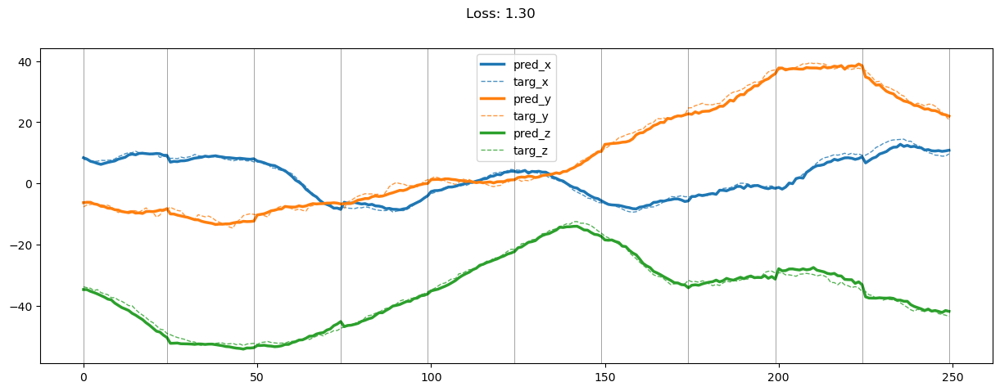

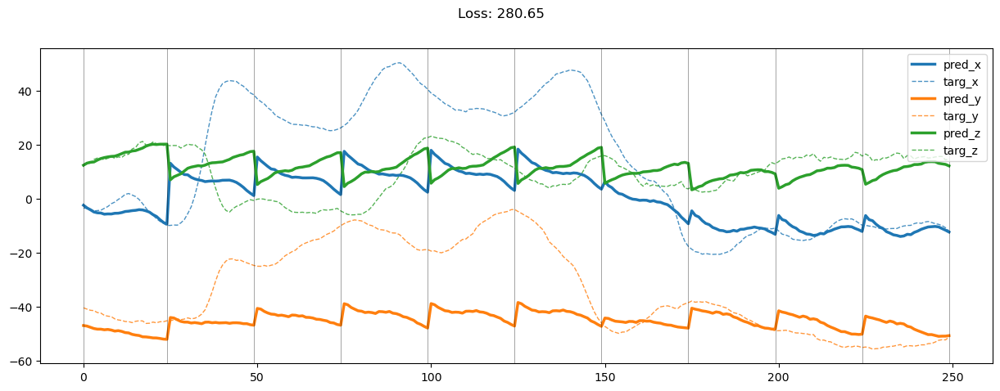

01199: train total loss:  1.497, pred loss:  1.497, valid total loss:  131.580, pred loss:  131.580


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01200: train total loss:  1.471, pred loss:  1.471, valid total loss:  128.624, pred loss:  128.624


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


01201: train total loss:  1.463, pred loss:  1.463, valid total loss:  128.014, pred loss:  128.014


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01202: train total loss:  1.467, pred loss:  1.467, valid total loss:  127.652, pred loss:  127.652


100%|██████████| 6/6 [00:00<00:00, 20.85it/s]


01203: train total loss:  1.475, pred loss:  1.475, valid total loss:  126.777, pred loss:  126.777


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01204: train total loss:  1.510, pred loss:  1.510, valid total loss:  121.796, pred loss:  121.796


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01205: train total loss:  1.453, pred loss:  1.453, valid total loss:  125.142, pred loss:  125.142


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01206: train total loss:  1.531, pred loss:  1.531, valid total loss:  124.051, pred loss:  124.051


100%|██████████| 6/6 [00:00<00:00, 20.58it/s]


01207: train total loss:  1.443, pred loss:  1.443, valid total loss:  123.808, pred loss:  123.808


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01208: train total loss:  1.440, pred loss:  1.440, valid total loss:  123.936, pred loss:  123.936


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01209: train total loss:  1.388, pred loss:  1.388, valid total loss:  129.639, pred loss:  129.639


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01210: train total loss:  1.405, pred loss:  1.405, valid total loss:  128.022, pred loss:  128.022


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01211: train total loss:  1.400, pred loss:  1.400, valid total loss:  128.087, pred loss:  128.087


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01212: train total loss:  1.375, pred loss:  1.375, valid total loss:  127.269, pred loss:  127.269


100%|██████████| 6/6 [00:00<00:00, 20.24it/s]


01213: train total loss:  1.409, pred loss:  1.409, valid total loss:  125.926, pred loss:  125.926


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01214: train total loss:  1.387, pred loss:  1.387, valid total loss:  122.368, pred loss:  122.368


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01215: train total loss:  1.430, pred loss:  1.430, valid total loss:  126.084, pred loss:  126.084


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01216: train total loss:  1.407, pred loss:  1.407, valid total loss:  131.017, pred loss:  131.017


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01217: train total loss:  1.435, pred loss:  1.435, valid total loss:  126.034, pred loss:  126.034


100%|██████████| 6/6 [00:00<00:00, 20.21it/s]


01218: train total loss:  1.416, pred loss:  1.416, valid total loss:  122.362, pred loss:  122.362


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01219: train total loss:  1.408, pred loss:  1.408, valid total loss:  119.384, pred loss:  119.384


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01220: train total loss:  1.452, pred loss:  1.452, valid total loss:  122.767, pred loss:  122.767


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01221: train total loss:  1.401, pred loss:  1.401, valid total loss:  128.222, pred loss:  128.222


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01222: train total loss:  1.382, pred loss:  1.382, valid total loss:  127.035, pred loss:  127.035


100%|██████████| 6/6 [00:00<00:00, 20.34it/s]


01223: train total loss:  1.416, pred loss:  1.416, valid total loss:  126.252, pred loss:  126.252


100%|██████████| 6/6 [00:00<00:00, 20.39it/s]


01224: train total loss:  1.404, pred loss:  1.404, valid total loss:  126.055, pred loss:  126.055


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01225: train total loss:  1.389, pred loss:  1.389, valid total loss:  124.714, pred loss:  124.714


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01226: train total loss:  1.428, pred loss:  1.428, valid total loss:  123.866, pred loss:  123.866


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01227: train total loss:  1.415, pred loss:  1.415, valid total loss:  127.382, pred loss:  127.382


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01228: train total loss:  1.360, pred loss:  1.360, valid total loss:  124.276, pred loss:  124.276


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01229: train total loss:  1.377, pred loss:  1.377, valid total loss:  129.682, pred loss:  129.682


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01230: train total loss:  1.396, pred loss:  1.396, valid total loss:  128.098, pred loss:  128.098


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01231: train total loss:  1.371, pred loss:  1.371, valid total loss:  126.113, pred loss:  126.113


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01232: train total loss:  1.398, pred loss:  1.398, valid total loss:  122.345, pred loss:  122.345


100%|██████████| 6/6 [00:00<00:00, 19.78it/s]


01233: train total loss:  1.387, pred loss:  1.387, valid total loss:  125.169, pred loss:  125.169


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01234: train total loss:  1.358, pred loss:  1.358, valid total loss:  123.444, pred loss:  123.444


100%|██████████| 6/6 [00:00<00:00, 20.46it/s]


01235: train total loss:  1.369, pred loss:  1.369, valid total loss:  128.892, pred loss:  128.892


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01236: train total loss:  1.371, pred loss:  1.371, valid total loss:  125.821, pred loss:  125.821


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01237: train total loss:  1.374, pred loss:  1.374, valid total loss:  130.692, pred loss:  130.692


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01238: train total loss:  1.342, pred loss:  1.342, valid total loss:  129.105, pred loss:  129.105


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01239: train total loss:  1.383, pred loss:  1.383, valid total loss:  128.170, pred loss:  128.170


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01240: train total loss:  1.376, pred loss:  1.376, valid total loss:  127.399, pred loss:  127.399


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01241: train total loss:  1.343, pred loss:  1.343, valid total loss:  128.063, pred loss:  128.063


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01242: train total loss:  1.329, pred loss:  1.329, valid total loss:  130.488, pred loss:  130.488


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01243: train total loss:  1.323, pred loss:  1.323, valid total loss:  129.415, pred loss:  129.415


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


01244: train total loss:  1.298, pred loss:  1.298, valid total loss:  128.814, pred loss:  128.814


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01245: train total loss:  1.330, pred loss:  1.330, valid total loss:  124.528, pred loss:  124.528


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01246: train total loss:  1.403, pred loss:  1.403, valid total loss:  130.445, pred loss:  130.445


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


01247: train total loss:  1.397, pred loss:  1.397, valid total loss:  135.170, pred loss:  135.170


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01248: train total loss:  1.368, pred loss:  1.368, valid total loss:  132.671, pred loss:  132.671


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


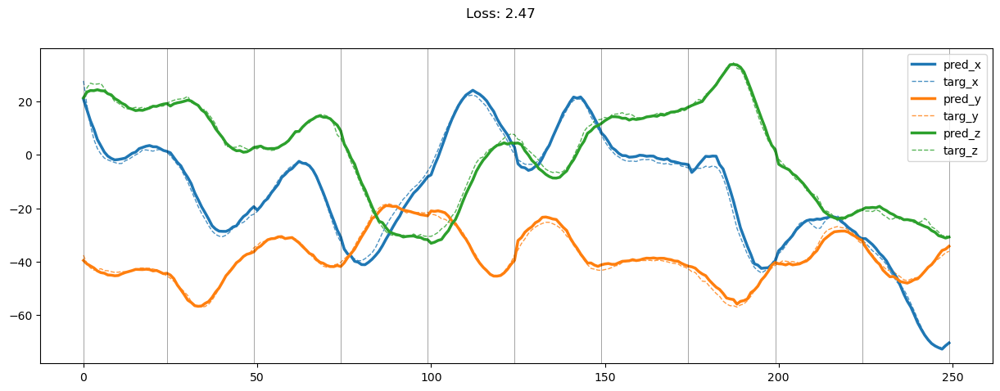

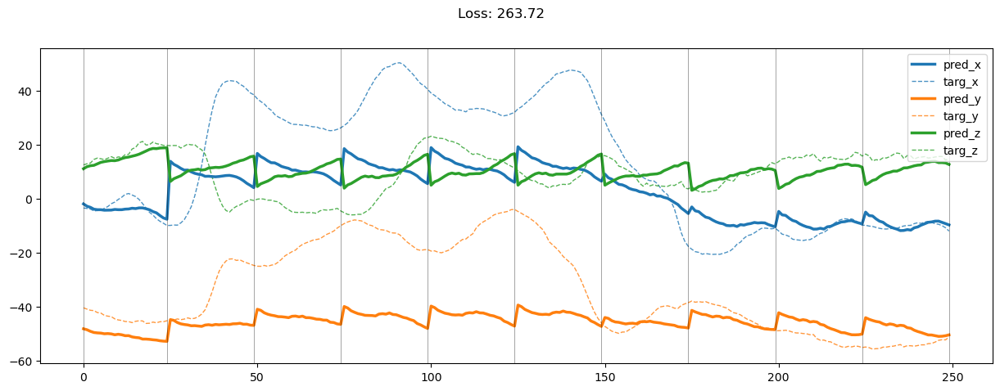

01249: train total loss:  1.411, pred loss:  1.411, valid total loss:  130.568, pred loss:  130.568


100%|██████████| 6/6 [00:00<00:00, 20.53it/s]


01250: train total loss:  1.375, pred loss:  1.375, valid total loss:  128.830, pred loss:  128.830


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01251: train total loss:  1.285, pred loss:  1.285, valid total loss:  127.252, pred loss:  127.252


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


01252: train total loss:  1.310, pred loss:  1.310, valid total loss:  130.733, pred loss:  130.733


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01253: train total loss:  1.291, pred loss:  1.291, valid total loss:  132.020, pred loss:  132.020


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01254: train total loss:  1.255, pred loss:  1.255, valid total loss:  132.181, pred loss:  132.181


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01255: train total loss:  1.287, pred loss:  1.287, valid total loss:  132.968, pred loss:  132.968


100%|██████████| 6/6 [00:00<00:00, 20.13it/s]


01256: train total loss:  1.284, pred loss:  1.284, valid total loss:  133.160, pred loss:  133.160


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01257: train total loss:  1.285, pred loss:  1.285, valid total loss:  133.439, pred loss:  133.439


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01258: train total loss:  1.360, pred loss:  1.360, valid total loss:  132.029, pred loss:  132.029


100%|██████████| 6/6 [00:00<00:00, 19.62it/s]


01259: train total loss:  1.289, pred loss:  1.289, valid total loss:  135.610, pred loss:  135.610


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01260: train total loss:  1.342, pred loss:  1.342, valid total loss:  138.944, pred loss:  138.944


100%|██████████| 6/6 [00:00<00:00, 19.70it/s]


01261: train total loss:  1.335, pred loss:  1.335, valid total loss:  136.019, pred loss:  136.019


100%|██████████| 6/6 [00:00<00:00, 20.58it/s]


01262: train total loss:  1.361, pred loss:  1.361, valid total loss:  130.796, pred loss:  130.796


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01263: train total loss:  1.322, pred loss:  1.322, valid total loss:  137.488, pred loss:  137.488


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


01264: train total loss:  1.313, pred loss:  1.313, valid total loss:  136.120, pred loss:  136.120


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01265: train total loss:  1.345, pred loss:  1.345, valid total loss:  136.842, pred loss:  136.842


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01266: train total loss:  1.352, pred loss:  1.352, valid total loss:  131.228, pred loss:  131.228


100%|██████████| 6/6 [00:00<00:00, 19.77it/s]


01267: train total loss:  1.282, pred loss:  1.282, valid total loss:  133.118, pred loss:  133.118


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


01268: train total loss:  1.241, pred loss:  1.241, valid total loss:  132.427, pred loss:  132.427


100%|██████████| 6/6 [00:00<00:00, 19.96it/s]


01269: train total loss:  1.305, pred loss:  1.305, valid total loss:  134.657, pred loss:  134.657


100%|██████████| 6/6 [00:00<00:00, 19.91it/s]


01270: train total loss:  1.316, pred loss:  1.316, valid total loss:  133.640, pred loss:  133.640


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01271: train total loss:  1.304, pred loss:  1.304, valid total loss:  133.154, pred loss:  133.154


100%|██████████| 6/6 [00:00<00:00, 20.56it/s]


01272: train total loss:  1.372, pred loss:  1.372, valid total loss:  132.319, pred loss:  132.319


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01273: train total loss:  1.355, pred loss:  1.355, valid total loss:  129.140, pred loss:  129.140


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01274: train total loss:  1.335, pred loss:  1.335, valid total loss:  130.299, pred loss:  130.299


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01275: train total loss:  1.325, pred loss:  1.325, valid total loss:  135.632, pred loss:  135.632


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01276: train total loss:  1.313, pred loss:  1.313, valid total loss:  133.169, pred loss:  133.169


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01277: train total loss:  1.331, pred loss:  1.331, valid total loss:  129.411, pred loss:  129.411


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01278: train total loss:  1.365, pred loss:  1.365, valid total loss:  126.111, pred loss:  126.111


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01279: train total loss:  1.340, pred loss:  1.340, valid total loss:  126.948, pred loss:  126.948


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01280: train total loss:  1.292, pred loss:  1.292, valid total loss:  131.662, pred loss:  131.662


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01281: train total loss:  1.232, pred loss:  1.232, valid total loss:  134.429, pred loss:  134.429


100%|██████████| 6/6 [00:00<00:00, 19.60it/s]


01282: train total loss:  1.326, pred loss:  1.326, valid total loss:  131.351, pred loss:  131.351


100%|██████████| 6/6 [00:00<00:00, 20.50it/s]


01283: train total loss:  1.329, pred loss:  1.329, valid total loss:  122.147, pred loss:  122.147


100%|██████████| 6/6 [00:00<00:00, 20.56it/s]


01284: train total loss:  1.316, pred loss:  1.316, valid total loss:  125.848, pred loss:  125.848


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


01285: train total loss:  1.309, pred loss:  1.309, valid total loss:  133.960, pred loss:  133.960


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


01286: train total loss:  1.379, pred loss:  1.379, valid total loss:  135.444, pred loss:  135.444


100%|██████████| 6/6 [00:00<00:00, 19.04it/s]


01287: train total loss:  1.386, pred loss:  1.386, valid total loss:  129.855, pred loss:  129.855


100%|██████████| 6/6 [00:00<00:00, 20.33it/s]


01288: train total loss:  1.429, pred loss:  1.429, valid total loss:  134.395, pred loss:  134.395


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


01289: train total loss:  1.377, pred loss:  1.377, valid total loss:  129.751, pred loss:  129.751


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01290: train total loss:  1.343, pred loss:  1.343, valid total loss:  119.773, pred loss:  119.773


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01291: train total loss:  1.354, pred loss:  1.354, valid total loss:  125.143, pred loss:  125.143


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01292: train total loss:  1.319, pred loss:  1.319, valid total loss:  131.575, pred loss:  131.575


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01293: train total loss:  1.297, pred loss:  1.297, valid total loss:  131.460, pred loss:  131.460


100%|██████████| 6/6 [00:00<00:00, 20.46it/s]


01294: train total loss:  1.367, pred loss:  1.367, valid total loss:  131.106, pred loss:  131.106


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01295: train total loss:  1.329, pred loss:  1.329, valid total loss:  135.566, pred loss:  135.566


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


01296: train total loss:  1.373, pred loss:  1.373, valid total loss:  133.093, pred loss:  133.093


100%|██████████| 6/6 [00:00<00:00, 20.26it/s]


01297: train total loss:  1.411, pred loss:  1.411, valid total loss:  130.429, pred loss:  130.429


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01298: train total loss:  1.434, pred loss:  1.434, valid total loss:  126.349, pred loss:  126.349


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


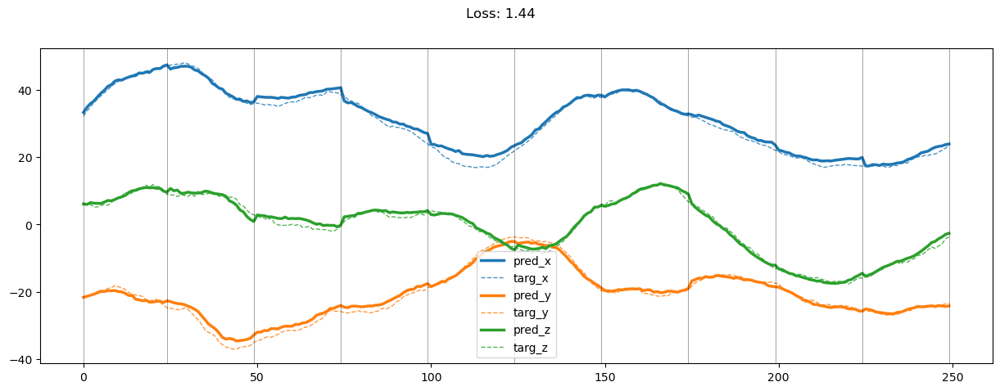

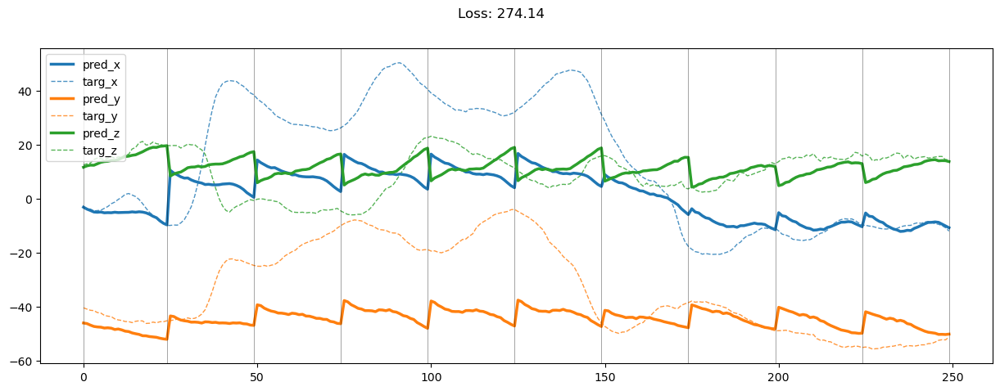

01299: train total loss:  1.431, pred loss:  1.431, valid total loss:  123.444, pred loss:  123.444


100%|██████████| 6/6 [00:00<00:00, 19.34it/s]


01300: train total loss:  1.489, pred loss:  1.489, valid total loss:  129.143, pred loss:  129.143


100%|██████████| 6/6 [00:00<00:00, 20.06it/s]


01301: train total loss:  1.514, pred loss:  1.514, valid total loss:  132.853, pred loss:  132.853


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01302: train total loss:  1.491, pred loss:  1.491, valid total loss:  133.503, pred loss:  133.503


100%|██████████| 6/6 [00:00<00:00, 19.03it/s]


01303: train total loss:  1.438, pred loss:  1.438, valid total loss:  129.112, pred loss:  129.112


100%|██████████| 6/6 [00:00<00:00, 19.03it/s]


01304: train total loss:  1.410, pred loss:  1.410, valid total loss:  125.412, pred loss:  125.412


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01305: train total loss:  1.384, pred loss:  1.384, valid total loss:  130.534, pred loss:  130.534


100%|██████████| 6/6 [00:00<00:00, 19.94it/s]


01306: train total loss:  1.353, pred loss:  1.353, valid total loss:  132.128, pred loss:  132.128


100%|██████████| 6/6 [00:00<00:00, 18.49it/s]


01307: train total loss:  1.432, pred loss:  1.432, valid total loss:  130.800, pred loss:  130.800


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01308: train total loss:  1.435, pred loss:  1.435, valid total loss:  135.746, pred loss:  135.746


100%|██████████| 6/6 [00:00<00:00, 19.79it/s]


01309: train total loss:  1.512, pred loss:  1.512, valid total loss:  139.092, pred loss:  139.092


100%|██████████| 6/6 [00:00<00:00, 19.45it/s]


01310: train total loss:  1.562, pred loss:  1.562, valid total loss:  138.724, pred loss:  138.724


100%|██████████| 6/6 [00:00<00:00, 19.42it/s]


01311: train total loss:  1.489, pred loss:  1.489, valid total loss:  136.658, pred loss:  136.658


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01312: train total loss:  1.478, pred loss:  1.478, valid total loss:  131.037, pred loss:  131.037


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01313: train total loss:  1.505, pred loss:  1.505, valid total loss:  133.170, pred loss:  133.170


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01314: train total loss:  1.506, pred loss:  1.506, valid total loss:  137.889, pred loss:  137.889


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01315: train total loss:  1.534, pred loss:  1.534, valid total loss:  139.513, pred loss:  139.513


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


01316: train total loss:  1.551, pred loss:  1.551, valid total loss:  137.530, pred loss:  137.530


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01317: train total loss:  1.547, pred loss:  1.547, valid total loss:  134.328, pred loss:  134.328


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01318: train total loss:  1.503, pred loss:  1.503, valid total loss:  135.749, pred loss:  135.749


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01319: train total loss:  1.430, pred loss:  1.430, valid total loss:  139.703, pred loss:  139.703


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01320: train total loss:  1.395, pred loss:  1.395, valid total loss:  134.632, pred loss:  134.632


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01321: train total loss:  1.392, pred loss:  1.392, valid total loss:  136.024, pred loss:  136.024


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01322: train total loss:  1.380, pred loss:  1.380, valid total loss:  133.483, pred loss:  133.483


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01323: train total loss:  1.342, pred loss:  1.342, valid total loss:  127.746, pred loss:  127.746


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01324: train total loss:  1.363, pred loss:  1.363, valid total loss:  128.161, pred loss:  128.161


100%|██████████| 6/6 [00:00<00:00, 20.48it/s]


01325: train total loss:  1.310, pred loss:  1.310, valid total loss:  129.310, pred loss:  129.310


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01326: train total loss:  1.264, pred loss:  1.264, valid total loss:  138.781, pred loss:  138.781


100%|██████████| 6/6 [00:00<00:00, 18.69it/s]


01327: train total loss:  1.243, pred loss:  1.243, valid total loss:  138.525, pred loss:  138.525


100%|██████████| 6/6 [00:00<00:00, 17.89it/s]


01328: train total loss:  1.216, pred loss:  1.216, valid total loss:  141.791, pred loss:  141.791


100%|██████████| 6/6 [00:00<00:00, 17.95it/s]


01329: train total loss:  1.260, pred loss:  1.260, valid total loss:  138.210, pred loss:  138.210


100%|██████████| 6/6 [00:00<00:00, 18.91it/s]


01330: train total loss:  1.256, pred loss:  1.256, valid total loss:  141.900, pred loss:  141.900


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


01331: train total loss:  1.240, pred loss:  1.240, valid total loss:  140.353, pred loss:  140.353


100%|██████████| 6/6 [00:00<00:00, 18.84it/s]


01332: train total loss:  1.254, pred loss:  1.254, valid total loss:  140.671, pred loss:  140.671


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01333: train total loss:  1.276, pred loss:  1.276, valid total loss:  132.101, pred loss:  132.101


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01334: train total loss:  1.247, pred loss:  1.247, valid total loss:  136.518, pred loss:  136.518


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01335: train total loss:  1.240, pred loss:  1.240, valid total loss:  129.601, pred loss:  129.601


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01336: train total loss:  1.262, pred loss:  1.262, valid total loss:  132.257, pred loss:  132.257


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01337: train total loss:  1.240, pred loss:  1.240, valid total loss:  135.945, pred loss:  135.945


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01338: train total loss:  1.211, pred loss:  1.211, valid total loss:  133.660, pred loss:  133.660


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01339: train total loss:  1.278, pred loss:  1.278, valid total loss:  129.076, pred loss:  129.076


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01340: train total loss:  1.211, pred loss:  1.211, valid total loss:  138.891, pred loss:  138.891


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01341: train total loss:  1.230, pred loss:  1.230, valid total loss:  135.169, pred loss:  135.169


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01342: train total loss:  1.220, pred loss:  1.220, valid total loss:  131.672, pred loss:  131.672


100%|██████████| 6/6 [00:00<00:00, 19.42it/s]


01343: train total loss:  1.229, pred loss:  1.229, valid total loss:  131.402, pred loss:  131.402


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01344: train total loss:  1.201, pred loss:  1.201, valid total loss:  138.258, pred loss:  138.258


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01345: train total loss:  1.188, pred loss:  1.188, valid total loss:  136.066, pred loss:  136.066


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01346: train total loss:  1.176, pred loss:  1.176, valid total loss:  135.073, pred loss:  135.073


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


01347: train total loss:  1.182, pred loss:  1.182, valid total loss:  131.997, pred loss:  131.997


100%|██████████| 6/6 [00:00<00:00, 19.41it/s]


01348: train total loss:  1.189, pred loss:  1.189, valid total loss:  129.422, pred loss:  129.422


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


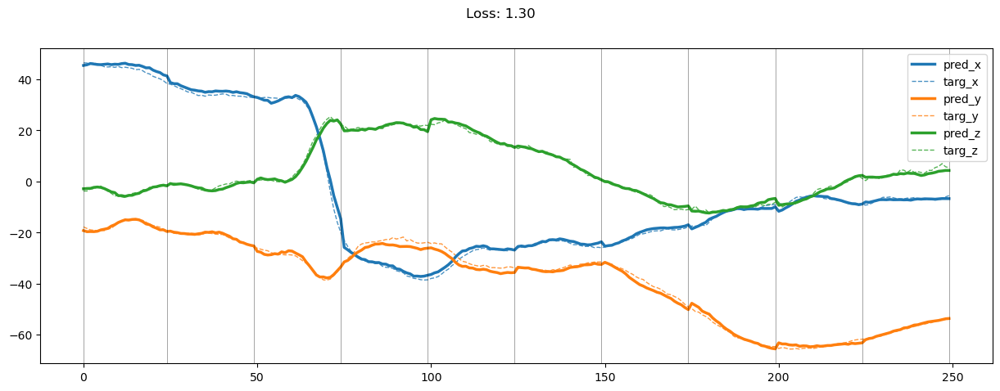

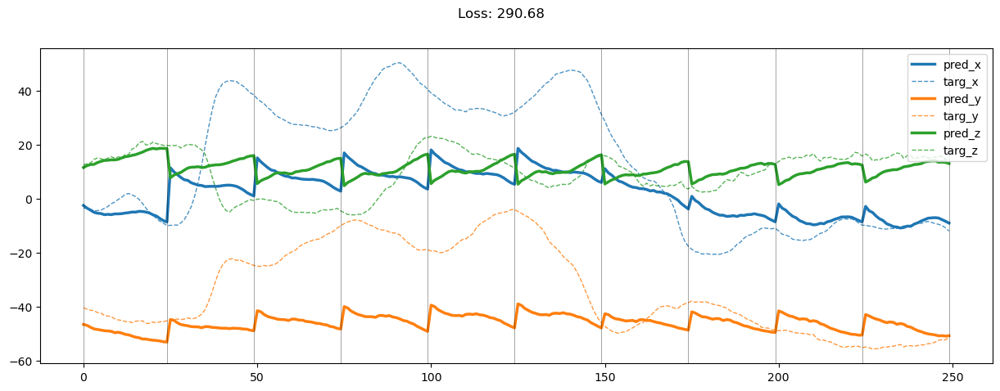

01349: train total loss:  1.189, pred loss:  1.189, valid total loss:  129.146, pred loss:  129.146


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


01350: train total loss:  1.215, pred loss:  1.215, valid total loss:  133.353, pred loss:  133.353


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01351: train total loss:  1.177, pred loss:  1.177, valid total loss:  132.127, pred loss:  132.127


100%|██████████| 6/6 [00:00<00:00, 19.33it/s]


01352: train total loss:  1.211, pred loss:  1.211, valid total loss:  135.439, pred loss:  135.439


100%|██████████| 6/6 [00:00<00:00, 17.72it/s]


01353: train total loss:  1.202, pred loss:  1.202, valid total loss:  133.993, pred loss:  133.993


100%|██████████| 6/6 [00:00<00:00, 17.82it/s]


01354: train total loss:  1.233, pred loss:  1.233, valid total loss:  135.263, pred loss:  135.263


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


01355: train total loss:  1.198, pred loss:  1.198, valid total loss:  131.886, pred loss:  131.886


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01356: train total loss:  1.244, pred loss:  1.244, valid total loss:  133.926, pred loss:  133.926


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01357: train total loss:  1.255, pred loss:  1.255, valid total loss:  140.099, pred loss:  140.099


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01358: train total loss:  1.238, pred loss:  1.238, valid total loss:  139.804, pred loss:  139.804


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01359: train total loss:  1.270, pred loss:  1.270, valid total loss:  138.165, pred loss:  138.165


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01360: train total loss:  1.244, pred loss:  1.244, valid total loss:  133.687, pred loss:  133.687


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01361: train total loss:  1.353, pred loss:  1.353, valid total loss:  136.676, pred loss:  136.676


100%|██████████| 6/6 [00:00<00:00, 20.14it/s]


01362: train total loss:  1.285, pred loss:  1.285, valid total loss:  136.549, pred loss:  136.549


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01363: train total loss:  1.247, pred loss:  1.247, valid total loss:  131.748, pred loss:  131.748


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01364: train total loss:  1.210, pred loss:  1.210, valid total loss:  134.693, pred loss:  134.693


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01365: train total loss:  1.196, pred loss:  1.196, valid total loss:  143.073, pred loss:  143.073


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01366: train total loss:  1.209, pred loss:  1.209, valid total loss:  140.080, pred loss:  140.080


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01367: train total loss:  1.219, pred loss:  1.219, valid total loss:  139.171, pred loss:  139.171


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01368: train total loss:  1.189, pred loss:  1.189, valid total loss:  133.723, pred loss:  133.723


100%|██████████| 6/6 [00:00<00:00, 20.53it/s]


01369: train total loss:  1.214, pred loss:  1.214, valid total loss:  129.332, pred loss:  129.332


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01370: train total loss:  1.199, pred loss:  1.199, valid total loss:  130.001, pred loss:  130.001


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01371: train total loss:  1.188, pred loss:  1.188, valid total loss:  132.331, pred loss:  132.331


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01372: train total loss:  1.222, pred loss:  1.222, valid total loss:  133.433, pred loss:  133.433


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01373: train total loss:  1.153, pred loss:  1.153, valid total loss:  136.209, pred loss:  136.209


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01374: train total loss:  1.347, pred loss:  1.347, valid total loss:  131.532, pred loss:  131.532


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01375: train total loss:  1.463, pred loss:  1.463, valid total loss:  137.300, pred loss:  137.300


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01376: train total loss:  1.361, pred loss:  1.361, valid total loss:  135.421, pred loss:  135.421


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01377: train total loss:  1.416, pred loss:  1.416, valid total loss:  130.968, pred loss:  130.968


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01378: train total loss:  1.407, pred loss:  1.407, valid total loss:  130.417, pred loss:  130.417


100%|██████████| 6/6 [00:00<00:00, 20.54it/s]


01379: train total loss:  1.446, pred loss:  1.446, valid total loss:  135.719, pred loss:  135.719


100%|██████████| 6/6 [00:00<00:00, 20.52it/s]


01380: train total loss:  1.298, pred loss:  1.298, valid total loss:  130.633, pred loss:  130.633


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01381: train total loss:  1.308, pred loss:  1.308, valid total loss:  133.850, pred loss:  133.850


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01382: train total loss:  1.286, pred loss:  1.286, valid total loss:  129.048, pred loss:  129.048


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


01383: train total loss:  1.230, pred loss:  1.230, valid total loss:  131.972, pred loss:  131.972


100%|██████████| 6/6 [00:00<00:00, 20.58it/s]


01384: train total loss:  1.282, pred loss:  1.282, valid total loss:  140.889, pred loss:  140.889


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01385: train total loss:  1.237, pred loss:  1.237, valid total loss:  135.813, pred loss:  135.813


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01386: train total loss:  1.248, pred loss:  1.248, valid total loss:  133.980, pred loss:  133.980


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01387: train total loss:  1.290, pred loss:  1.290, valid total loss:  124.958, pred loss:  124.958


100%|██████████| 6/6 [00:00<00:00, 20.54it/s]


01388: train total loss:  1.263, pred loss:  1.263, valid total loss:  129.308, pred loss:  129.308


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01389: train total loss:  1.260, pred loss:  1.260, valid total loss:  135.090, pred loss:  135.090


100%|██████████| 6/6 [00:00<00:00, 20.26it/s]


01390: train total loss:  1.248, pred loss:  1.248, valid total loss:  131.912, pred loss:  131.912


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01391: train total loss:  1.255, pred loss:  1.255, valid total loss:  130.985, pred loss:  130.985


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


01392: train total loss:  1.196, pred loss:  1.196, valid total loss:  131.138, pred loss:  131.138


100%|██████████| 6/6 [00:00<00:00, 20.55it/s]


01393: train total loss:  1.183, pred loss:  1.183, valid total loss:  132.774, pred loss:  132.774


100%|██████████| 6/6 [00:00<00:00, 20.02it/s]


01394: train total loss:  1.236, pred loss:  1.236, valid total loss:  132.051, pred loss:  132.051


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01395: train total loss:  1.171, pred loss:  1.171, valid total loss:  130.573, pred loss:  130.573


100%|██████████| 6/6 [00:00<00:00, 20.23it/s]


01396: train total loss:  1.226, pred loss:  1.226, valid total loss:  128.408, pred loss:  128.408


100%|██████████| 6/6 [00:00<00:00, 19.91it/s]


01397: train total loss:  1.202, pred loss:  1.202, valid total loss:  128.511, pred loss:  128.511


100%|██████████| 6/6 [00:00<00:00, 20.42it/s]


01398: train total loss:  1.214, pred loss:  1.214, valid total loss:  130.168, pred loss:  130.168


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


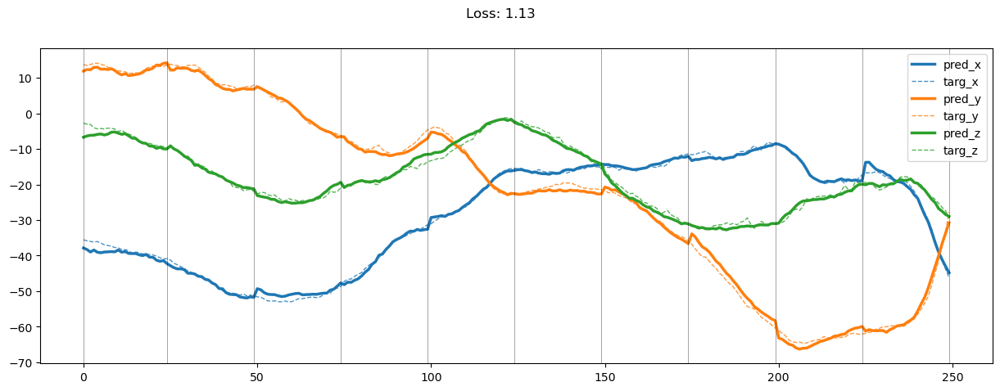

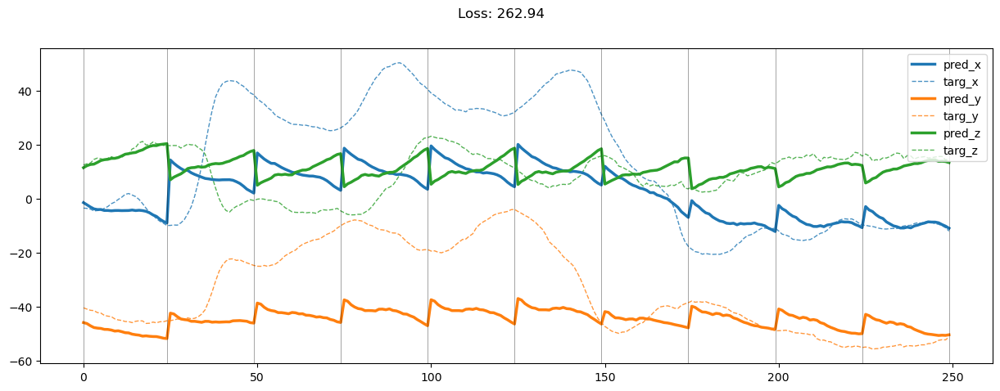

01399: train total loss:  1.238, pred loss:  1.238, valid total loss:  128.681, pred loss:  128.681


100%|██████████| 6/6 [00:00<00:00, 20.40it/s]


01400: train total loss:  1.229, pred loss:  1.229, valid total loss:  135.168, pred loss:  135.168


100%|██████████| 6/6 [00:00<00:00, 20.06it/s]


01401: train total loss:  1.249, pred loss:  1.249, valid total loss:  133.598, pred loss:  133.598


100%|██████████| 6/6 [00:00<00:00, 20.00it/s]


01402: train total loss:  1.262, pred loss:  1.262, valid total loss:  132.070, pred loss:  132.070


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01403: train total loss:  1.282, pred loss:  1.282, valid total loss:  136.228, pred loss:  136.228


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


01404: train total loss:  1.267, pred loss:  1.267, valid total loss:  132.239, pred loss:  132.239


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01405: train total loss:  1.284, pred loss:  1.284, valid total loss:  129.565, pred loss:  129.565


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01406: train total loss:  1.255, pred loss:  1.255, valid total loss:  128.687, pred loss:  128.687


100%|██████████| 6/6 [00:00<00:00, 20.44it/s]


01407: train total loss:  1.273, pred loss:  1.273, valid total loss:  125.240, pred loss:  125.240


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01408: train total loss:  1.216, pred loss:  1.216, valid total loss:  122.951, pred loss:  122.951


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01409: train total loss:  1.215, pred loss:  1.215, valid total loss:  127.220, pred loss:  127.220


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


01410: train total loss:  1.182, pred loss:  1.182, valid total loss:  126.785, pred loss:  126.785


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


01411: train total loss:  1.199, pred loss:  1.199, valid total loss:  128.677, pred loss:  128.677


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01412: train total loss:  1.209, pred loss:  1.209, valid total loss:  130.980, pred loss:  130.980


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01413: train total loss:  1.220, pred loss:  1.220, valid total loss:  131.791, pred loss:  131.791


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01414: train total loss:  1.230, pred loss:  1.230, valid total loss:  131.043, pred loss:  131.043


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01415: train total loss:  1.197, pred loss:  1.197, valid total loss:  134.610, pred loss:  134.610


100%|██████████| 6/6 [00:00<00:00, 20.45it/s]


01416: train total loss:  1.154, pred loss:  1.154, valid total loss:  135.820, pred loss:  135.820


100%|██████████| 6/6 [00:00<00:00, 20.16it/s]


01417: train total loss:  1.174, pred loss:  1.174, valid total loss:  130.803, pred loss:  130.803


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01418: train total loss:  1.168, pred loss:  1.168, valid total loss:  132.513, pred loss:  132.513


100%|██████████| 6/6 [00:00<00:00, 20.41it/s]


01419: train total loss:  1.132, pred loss:  1.132, valid total loss:  133.992, pred loss:  133.992


100%|██████████| 6/6 [00:00<00:00, 19.98it/s]


01420: train total loss:  1.139, pred loss:  1.139, valid total loss:  136.815, pred loss:  136.815


100%|██████████| 6/6 [00:00<00:00, 20.52it/s]


01421: train total loss:  1.213, pred loss:  1.213, valid total loss:  138.484, pred loss:  138.484


100%|██████████| 6/6 [00:00<00:00, 20.42it/s]


01422: train total loss:  1.189, pred loss:  1.189, valid total loss:  138.863, pred loss:  138.863


100%|██████████| 6/6 [00:00<00:00, 20.44it/s]


01423: train total loss:  1.180, pred loss:  1.180, valid total loss:  131.468, pred loss:  131.468


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01424: train total loss:  1.195, pred loss:  1.195, valid total loss:  125.716, pred loss:  125.716


100%|██████████| 6/6 [00:00<00:00, 20.55it/s]


01425: train total loss:  1.160, pred loss:  1.160, valid total loss:  129.462, pred loss:  129.462


100%|██████████| 6/6 [00:00<00:00, 20.52it/s]


01426: train total loss:  1.170, pred loss:  1.170, valid total loss:  133.390, pred loss:  133.390


100%|██████████| 6/6 [00:00<00:00, 20.44it/s]


01427: train total loss:  1.146, pred loss:  1.146, valid total loss:  130.613, pred loss:  130.613


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


01428: train total loss:  1.177, pred loss:  1.177, valid total loss:  131.359, pred loss:  131.359


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01429: train total loss:  1.170, pred loss:  1.170, valid total loss:  128.443, pred loss:  128.443


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01430: train total loss:  1.164, pred loss:  1.164, valid total loss:  127.204, pred loss:  127.204


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


01431: train total loss:  1.147, pred loss:  1.147, valid total loss:  127.661, pred loss:  127.661


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01432: train total loss:  1.169, pred loss:  1.169, valid total loss:  132.227, pred loss:  132.227


100%|██████████| 6/6 [00:00<00:00, 19.07it/s]


01433: train total loss:  1.151, pred loss:  1.151, valid total loss:  131.389, pred loss:  131.389


100%|██████████| 6/6 [00:00<00:00, 20.49it/s]


01434: train total loss:  1.128, pred loss:  1.128, valid total loss:  132.029, pred loss:  132.029


100%|██████████| 6/6 [00:00<00:00, 20.34it/s]


01435: train total loss:  1.153, pred loss:  1.153, valid total loss:  129.204, pred loss:  129.204


100%|██████████| 6/6 [00:00<00:00, 19.51it/s]


01436: train total loss:  1.131, pred loss:  1.131, valid total loss:  129.405, pred loss:  129.405


100%|██████████| 6/6 [00:00<00:00, 19.04it/s]


01437: train total loss:  1.139, pred loss:  1.139, valid total loss:  129.006, pred loss:  129.006


100%|██████████| 6/6 [00:00<00:00, 19.94it/s]


01438: train total loss:  1.141, pred loss:  1.141, valid total loss:  132.911, pred loss:  132.911


100%|██████████| 6/6 [00:00<00:00, 20.50it/s]


01439: train total loss:  1.131, pred loss:  1.131, valid total loss:  131.714, pred loss:  131.714


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


01440: train total loss:  1.125, pred loss:  1.125, valid total loss:  130.990, pred loss:  130.990


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


01441: train total loss:  1.110, pred loss:  1.110, valid total loss:  130.143, pred loss:  130.143


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01442: train total loss:  1.115, pred loss:  1.115, valid total loss:  133.190, pred loss:  133.190


100%|██████████| 6/6 [00:00<00:00, 20.27it/s]


01443: train total loss:  1.187, pred loss:  1.187, valid total loss:  133.724, pred loss:  133.724


100%|██████████| 6/6 [00:00<00:00, 20.54it/s]


01444: train total loss:  1.230, pred loss:  1.230, valid total loss:  129.316, pred loss:  129.316


100%|██████████| 6/6 [00:00<00:00, 20.03it/s]


01445: train total loss:  1.159, pred loss:  1.159, valid total loss:  126.452, pred loss:  126.452


100%|██████████| 6/6 [00:00<00:00, 20.05it/s]


01446: train total loss:  1.172, pred loss:  1.172, valid total loss:  125.783, pred loss:  125.783


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


01447: train total loss:  1.079, pred loss:  1.079, valid total loss:  125.099, pred loss:  125.099


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01448: train total loss:  1.081, pred loss:  1.081, valid total loss:  126.388, pred loss:  126.388


100%|██████████| 6/6 [00:00<00:00, 20.12it/s]


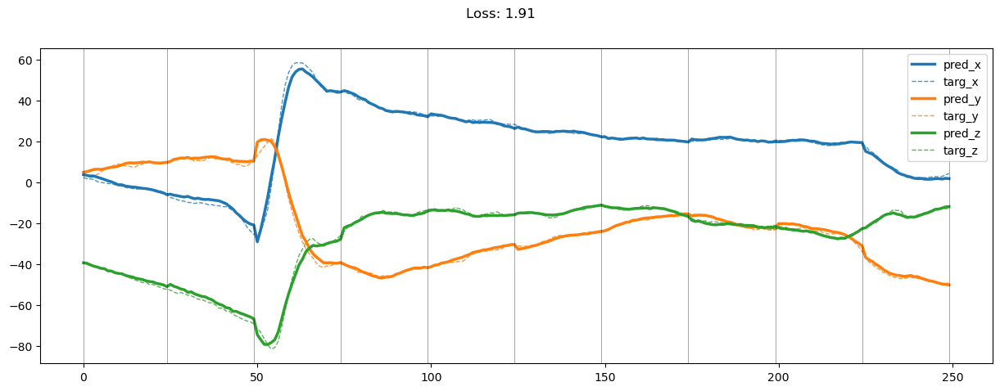

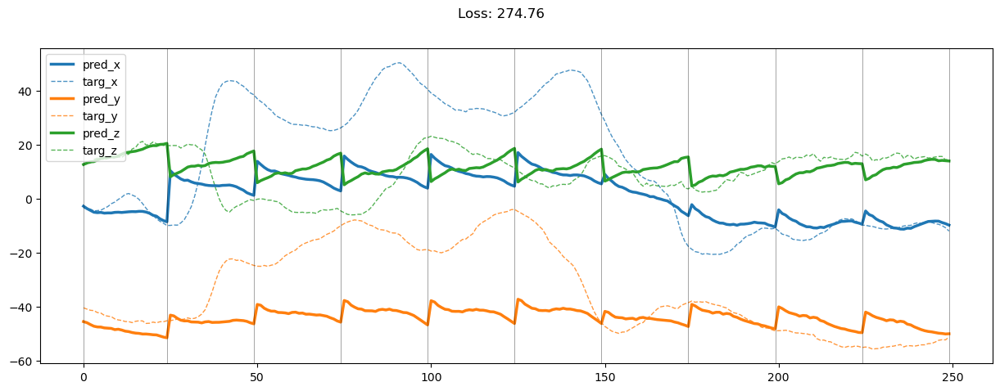

01449: train total loss:  1.081, pred loss:  1.081, valid total loss:  130.368, pred loss:  130.368


100%|██████████| 6/6 [00:00<00:00, 18.45it/s]


01450: train total loss:  1.126, pred loss:  1.126, valid total loss:  128.599, pred loss:  128.599


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01451: train total loss:  1.154, pred loss:  1.154, valid total loss:  130.404, pred loss:  130.404


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01452: train total loss:  1.089, pred loss:  1.089, valid total loss:  135.001, pred loss:  135.001


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01453: train total loss:  1.072, pred loss:  1.072, valid total loss:  130.076, pred loss:  130.076


100%|██████████| 6/6 [00:00<00:00, 20.43it/s]


01454: train total loss:  1.099, pred loss:  1.099, valid total loss:  131.993, pred loss:  131.993


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01455: train total loss:  1.124, pred loss:  1.124, valid total loss:  125.637, pred loss:  125.637


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01456: train total loss:  1.159, pred loss:  1.159, valid total loss:  120.462, pred loss:  120.462


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01457: train total loss:  1.127, pred loss:  1.127, valid total loss:  122.181, pred loss:  122.181


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01458: train total loss:  1.169, pred loss:  1.169, valid total loss:  125.493, pred loss:  125.493


100%|██████████| 6/6 [00:00<00:00, 20.01it/s]


01459: train total loss:  1.132, pred loss:  1.132, valid total loss:  128.189, pred loss:  128.189


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01460: train total loss:  1.121, pred loss:  1.121, valid total loss:  123.977, pred loss:  123.977


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01461: train total loss:  1.145, pred loss:  1.145, valid total loss:  122.491, pred loss:  122.491


100%|██████████| 6/6 [00:00<00:00, 20.21it/s]


01462: train total loss:  1.172, pred loss:  1.172, valid total loss:  127.482, pred loss:  127.482


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


01463: train total loss:  1.193, pred loss:  1.193, valid total loss:  125.828, pred loss:  125.828


100%|██████████| 6/6 [00:00<00:00, 20.52it/s]


01464: train total loss:  1.197, pred loss:  1.197, valid total loss:  122.725, pred loss:  122.725


100%|██████████| 6/6 [00:00<00:00, 20.44it/s]


01465: train total loss:  1.169, pred loss:  1.169, valid total loss:  120.317, pred loss:  120.317


100%|██████████| 6/6 [00:00<00:00, 19.87it/s]


01466: train total loss:  1.163, pred loss:  1.163, valid total loss:  124.735, pred loss:  124.735


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01467: train total loss:  1.150, pred loss:  1.150, valid total loss:  122.824, pred loss:  122.824


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


01468: train total loss:  1.144, pred loss:  1.144, valid total loss:  123.322, pred loss:  123.322


100%|██████████| 6/6 [00:00<00:00, 19.22it/s]


01469: train total loss:  1.141, pred loss:  1.141, valid total loss:  116.655, pred loss:  116.655


100%|██████████| 6/6 [00:00<00:00, 20.39it/s]


01470: train total loss:  1.121, pred loss:  1.121, valid total loss:  116.735, pred loss:  116.735


100%|██████████| 6/6 [00:00<00:00, 20.49it/s]


01471: train total loss:  1.078, pred loss:  1.078, valid total loss:  119.353, pred loss:  119.353


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01472: train total loss:  1.105, pred loss:  1.105, valid total loss:  117.736, pred loss:  117.736


100%|██████████| 6/6 [00:00<00:00, 20.55it/s]


01473: train total loss:  1.135, pred loss:  1.135, valid total loss:  117.944, pred loss:  117.944


100%|██████████| 6/6 [00:00<00:00, 20.54it/s]


01474: train total loss:  1.126, pred loss:  1.126, valid total loss:  120.349, pred loss:  120.349


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01475: train total loss:  1.139, pred loss:  1.139, valid total loss:  121.981, pred loss:  121.981


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01476: train total loss:  1.112, pred loss:  1.112, valid total loss:  124.636, pred loss:  124.636


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01477: train total loss:  1.227, pred loss:  1.227, valid total loss:  120.706, pred loss:  120.706


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01478: train total loss:  1.172, pred loss:  1.172, valid total loss:  121.497, pred loss:  121.497


100%|██████████| 6/6 [00:00<00:00, 20.12it/s]


01479: train total loss:  1.183, pred loss:  1.183, valid total loss:  121.849, pred loss:  121.849


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01480: train total loss:  1.177, pred loss:  1.177, valid total loss:  127.424, pred loss:  127.424


100%|██████████| 6/6 [00:00<00:00, 20.42it/s]


01481: train total loss:  1.174, pred loss:  1.174, valid total loss:  125.687, pred loss:  125.687


100%|██████████| 6/6 [00:00<00:00, 20.52it/s]


01482: train total loss:  1.135, pred loss:  1.135, valid total loss:  120.516, pred loss:  120.516


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01483: train total loss:  1.135, pred loss:  1.135, valid total loss:  125.654, pred loss:  125.654


100%|██████████| 6/6 [00:00<00:00, 20.30it/s]


01484: train total loss:  1.141, pred loss:  1.141, valid total loss:  125.037, pred loss:  125.037


100%|██████████| 6/6 [00:00<00:00, 20.48it/s]


01485: train total loss:  1.091, pred loss:  1.091, valid total loss:  125.325, pred loss:  125.325


100%|██████████| 6/6 [00:00<00:00, 20.47it/s]


01486: train total loss:  1.121, pred loss:  1.121, valid total loss:  123.882, pred loss:  123.882


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01487: train total loss:  1.072, pred loss:  1.072, valid total loss:  123.404, pred loss:  123.404


100%|██████████| 6/6 [00:00<00:00, 20.54it/s]


01488: train total loss:  1.080, pred loss:  1.080, valid total loss:  123.576, pred loss:  123.576


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01489: train total loss:  1.108, pred loss:  1.108, valid total loss:  122.879, pred loss:  122.879


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01490: train total loss:  1.089, pred loss:  1.089, valid total loss:  126.322, pred loss:  126.322


100%|██████████| 6/6 [00:00<00:00, 20.40it/s]


01491: train total loss:  1.067, pred loss:  1.067, valid total loss:  125.002, pred loss:  125.002


100%|██████████| 6/6 [00:00<00:00, 20.25it/s]


01492: train total loss:  1.071, pred loss:  1.071, valid total loss:  126.854, pred loss:  126.854


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01493: train total loss:  1.121, pred loss:  1.121, valid total loss:  124.194, pred loss:  124.194


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01494: train total loss:  1.052, pred loss:  1.052, valid total loss:  127.897, pred loss:  127.897


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


01495: train total loss:  1.046, pred loss:  1.046, valid total loss:  122.501, pred loss:  122.501


100%|██████████| 6/6 [00:00<00:00, 20.52it/s]


01496: train total loss:  1.066, pred loss:  1.066, valid total loss:  125.960, pred loss:  125.960


100%|██████████| 6/6 [00:00<00:00, 20.48it/s]


01497: train total loss:  1.086, pred loss:  1.086, valid total loss:  126.476, pred loss:  126.476


100%|██████████| 6/6 [00:00<00:00, 20.52it/s]


01498: train total loss:  1.115, pred loss:  1.115, valid total loss:  127.645, pred loss:  127.645


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


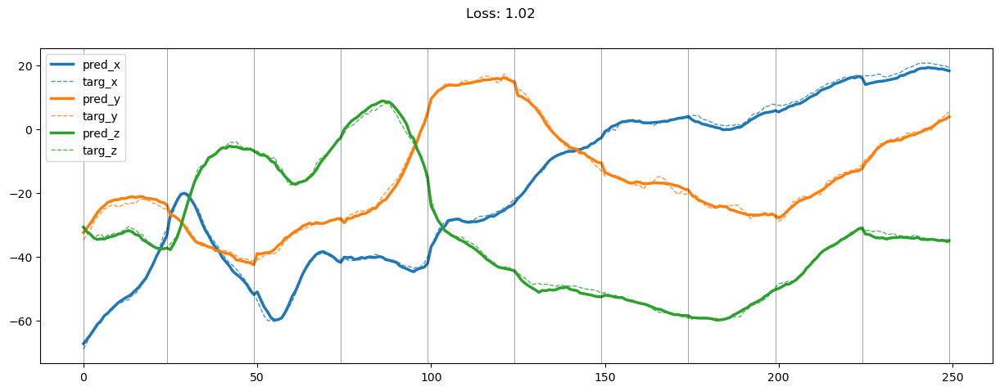

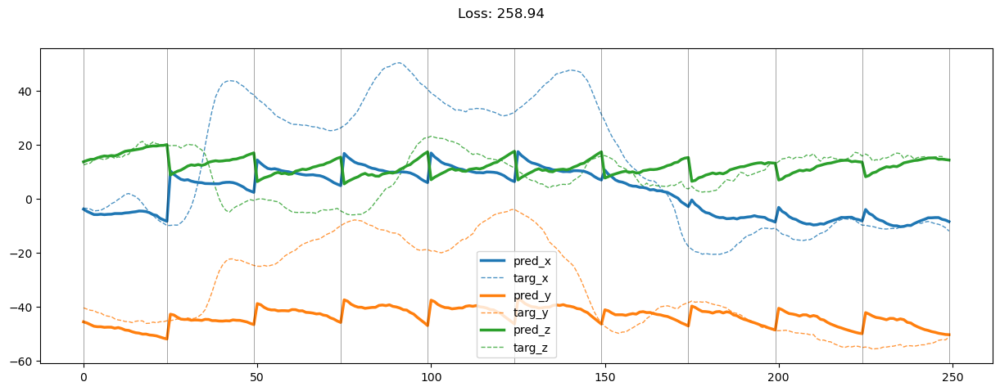

01499: train total loss:  1.117, pred loss:  1.117, valid total loss:  126.443, pred loss:  126.443


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


01500: train total loss:  1.084, pred loss:  1.084, valid total loss:  121.061, pred loss:  121.061


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01501: train total loss:  1.107, pred loss:  1.107, valid total loss:  122.734, pred loss:  122.734


100%|██████████| 6/6 [00:00<00:00, 20.56it/s]


01502: train total loss:  1.113, pred loss:  1.113, valid total loss:  123.585, pred loss:  123.585


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01503: train total loss:  1.122, pred loss:  1.122, valid total loss:  128.058, pred loss:  128.058


100%|██████████| 6/6 [00:00<00:00, 20.41it/s]


01504: train total loss:  1.078, pred loss:  1.078, valid total loss:  123.076, pred loss:  123.076


100%|██████████| 6/6 [00:00<00:00, 20.39it/s]


01505: train total loss:  1.102, pred loss:  1.102, valid total loss:  128.506, pred loss:  128.506


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01506: train total loss:  1.129, pred loss:  1.129, valid total loss:  127.476, pred loss:  127.476


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01507: train total loss:  1.071, pred loss:  1.071, valid total loss:  122.504, pred loss:  122.504


100%|██████████| 6/6 [00:00<00:00, 18.50it/s]


01508: train total loss:  1.099, pred loss:  1.099, valid total loss:  124.221, pred loss:  124.221


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01509: train total loss:  1.088, pred loss:  1.088, valid total loss:  126.395, pred loss:  126.395


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01510: train total loss:  1.075, pred loss:  1.075, valid total loss:  126.994, pred loss:  126.994


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


01511: train total loss:  1.057, pred loss:  1.057, valid total loss:  129.760, pred loss:  129.760


100%|██████████| 6/6 [00:00<00:00, 20.58it/s]


01512: train total loss:  1.071, pred loss:  1.071, valid total loss:  130.968, pred loss:  130.968


100%|██████████| 6/6 [00:00<00:00, 20.37it/s]


01513: train total loss:  1.063, pred loss:  1.063, valid total loss:  127.984, pred loss:  127.984


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01514: train total loss:  1.158, pred loss:  1.158, valid total loss:  128.673, pred loss:  128.673


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01515: train total loss:  1.064, pred loss:  1.064, valid total loss:  129.851, pred loss:  129.851


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01516: train total loss:  1.095, pred loss:  1.095, valid total loss:  127.512, pred loss:  127.512


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


01517: train total loss:  1.148, pred loss:  1.148, valid total loss:  129.878, pred loss:  129.878


100%|██████████| 6/6 [00:00<00:00, 19.95it/s]


01518: train total loss:  1.106, pred loss:  1.106, valid total loss:  130.807, pred loss:  130.807


100%|██████████| 6/6 [00:00<00:00, 18.51it/s]


01519: train total loss:  1.080, pred loss:  1.080, valid total loss:  131.666, pred loss:  131.666


100%|██████████| 6/6 [00:00<00:00, 17.83it/s]


01520: train total loss:  1.085, pred loss:  1.085, valid total loss:  127.904, pred loss:  127.904


100%|██████████| 6/6 [00:00<00:00, 20.28it/s]


01521: train total loss:  1.099, pred loss:  1.099, valid total loss:  126.644, pred loss:  126.644


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01522: train total loss:  1.122, pred loss:  1.122, valid total loss:  129.379, pred loss:  129.379


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01523: train total loss:  1.093, pred loss:  1.093, valid total loss:  124.208, pred loss:  124.208


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01524: train total loss:  1.113, pred loss:  1.113, valid total loss:  131.299, pred loss:  131.299


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01525: train total loss:  1.099, pred loss:  1.099, valid total loss:  130.735, pred loss:  130.735


100%|██████████| 6/6 [00:00<00:00, 20.58it/s]


01526: train total loss:  1.125, pred loss:  1.125, valid total loss:  128.591, pred loss:  128.591


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01527: train total loss:  1.082, pred loss:  1.082, valid total loss:  130.231, pred loss:  130.231


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01528: train total loss:  1.092, pred loss:  1.092, valid total loss:  129.868, pred loss:  129.868


100%|██████████| 6/6 [00:00<00:00, 20.56it/s]


01529: train total loss:  1.090, pred loss:  1.090, valid total loss:  127.532, pred loss:  127.532


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01530: train total loss:  1.094, pred loss:  1.094, valid total loss:  120.742, pred loss:  120.742


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01531: train total loss:  1.102, pred loss:  1.102, valid total loss:  123.461, pred loss:  123.461


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01532: train total loss:  1.082, pred loss:  1.082, valid total loss:  125.207, pred loss:  125.207


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01533: train total loss:  1.048, pred loss:  1.048, valid total loss:  126.113, pred loss:  126.113


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01534: train total loss:  1.046, pred loss:  1.046, valid total loss:  124.756, pred loss:  124.756


100%|██████████| 6/6 [00:00<00:00, 19.67it/s]


01535: train total loss:  1.019, pred loss:  1.019, valid total loss:  124.215, pred loss:  124.215


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01536: train total loss:  1.050, pred loss:  1.050, valid total loss:  125.880, pred loss:  125.880


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


01537: train total loss:  1.016, pred loss:  1.016, valid total loss:  125.545, pred loss:  125.545


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01538: train total loss:  1.008, pred loss:  1.008, valid total loss:  121.953, pred loss:  121.953


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01539: train total loss:  1.028, pred loss:  1.028, valid total loss:  123.059, pred loss:  123.059


100%|██████████| 6/6 [00:00<00:00, 20.49it/s]


01540: train total loss:  1.034, pred loss:  1.034, valid total loss:  121.954, pred loss:  121.954


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


01541: train total loss:  1.015, pred loss:  1.015, valid total loss:  119.053, pred loss:  119.053


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01542: train total loss:  1.030, pred loss:  1.030, valid total loss:  123.984, pred loss:  123.984


100%|██████████| 6/6 [00:00<00:00, 19.54it/s]


01543: train total loss:  1.135, pred loss:  1.135, valid total loss:  124.454, pred loss:  124.454


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01544: train total loss:  1.128, pred loss:  1.128, valid total loss:  130.744, pred loss:  130.744


100%|██████████| 6/6 [00:00<00:00, 20.21it/s]


01545: train total loss:  1.125, pred loss:  1.125, valid total loss:  119.342, pred loss:  119.342


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01546: train total loss:  1.066, pred loss:  1.066, valid total loss:  125.580, pred loss:  125.580


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01547: train total loss:  1.141, pred loss:  1.141, valid total loss:  128.750, pred loss:  128.750


100%|██████████| 6/6 [00:00<00:00, 20.01it/s]


01548: train total loss:  1.463, pred loss:  1.463, valid total loss:  129.594, pred loss:  129.594


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


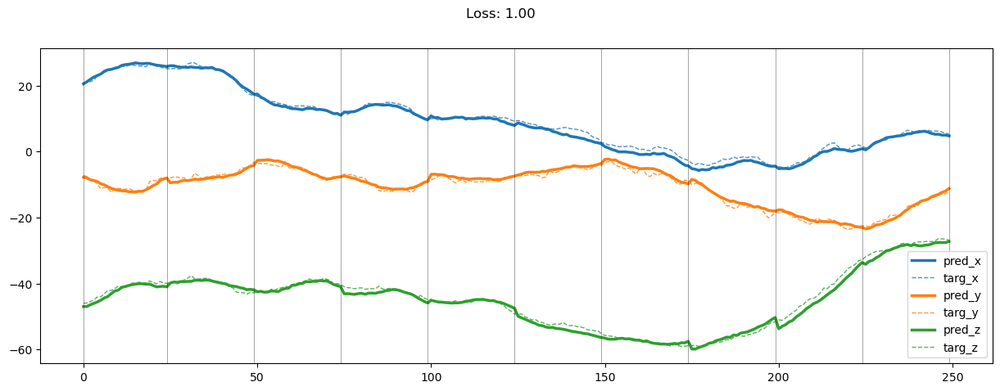

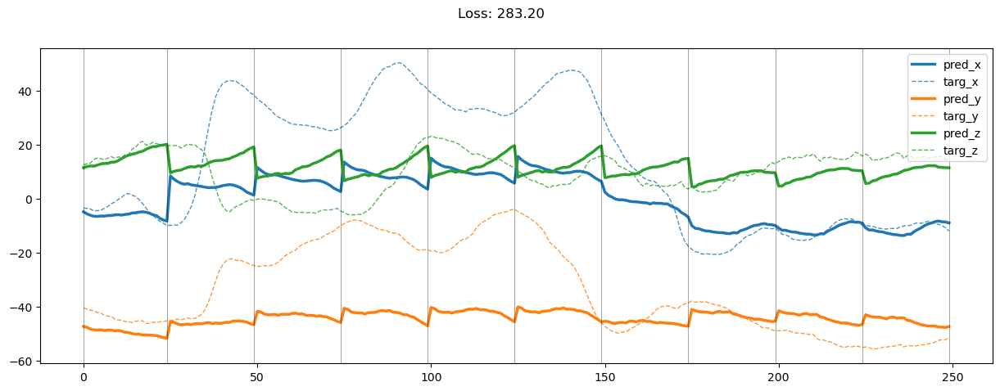

01549: train total loss:  1.388, pred loss:  1.388, valid total loss:  137.400, pred loss:  137.400


100%|██████████| 6/6 [00:00<00:00, 19.93it/s]


01550: train total loss:  1.562, pred loss:  1.562, valid total loss:  142.198, pred loss:  142.198


100%|██████████| 6/6 [00:00<00:00, 20.35it/s]


01551: train total loss:  1.528, pred loss:  1.528, valid total loss:  137.259, pred loss:  137.259


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01552: train total loss:  1.660, pred loss:  1.660, valid total loss:  146.707, pred loss:  146.707


100%|██████████| 6/6 [00:00<00:00, 17.88it/s]


01553: train total loss:  1.672, pred loss:  1.672, valid total loss:  146.781, pred loss:  146.781


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01554: train total loss:  1.592, pred loss:  1.592, valid total loss:  147.592, pred loss:  147.592


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01555: train total loss:  1.559, pred loss:  1.559, valid total loss:  145.126, pred loss:  145.126


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01556: train total loss:  1.417, pred loss:  1.417, valid total loss:  147.144, pred loss:  147.144


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01557: train total loss:  1.360, pred loss:  1.360, valid total loss:  149.112, pred loss:  149.112


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01558: train total loss:  1.332, pred loss:  1.332, valid total loss:  140.931, pred loss:  140.931


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


01559: train total loss:  1.265, pred loss:  1.265, valid total loss:  136.866, pred loss:  136.866


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01560: train total loss:  1.276, pred loss:  1.276, valid total loss:  134.548, pred loss:  134.548


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01561: train total loss:  1.192, pred loss:  1.192, valid total loss:  142.360, pred loss:  142.360


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01562: train total loss:  1.174, pred loss:  1.174, valid total loss:  139.459, pred loss:  139.459


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01563: train total loss:  1.165, pred loss:  1.165, valid total loss:  138.317, pred loss:  138.317


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01564: train total loss:  1.128, pred loss:  1.128, valid total loss:  141.266, pred loss:  141.266


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01565: train total loss:  1.182, pred loss:  1.182, valid total loss:  130.672, pred loss:  130.672


100%|██████████| 6/6 [00:00<00:00, 19.47it/s]


01566: train total loss:  1.180, pred loss:  1.180, valid total loss:  125.919, pred loss:  125.919


100%|██████████| 6/6 [00:00<00:00, 17.76it/s]


01567: train total loss:  1.522, pred loss:  1.522, valid total loss:  145.900, pred loss:  145.900


100%|██████████| 6/6 [00:00<00:00, 17.53it/s]


01568: train total loss:  2.314, pred loss:  2.314, valid total loss:  159.899, pred loss:  159.899


100%|██████████| 6/6 [00:00<00:00, 19.49it/s]


01569: train total loss:  2.345, pred loss:  2.345, valid total loss:  140.095, pred loss:  140.095


100%|██████████| 6/6 [00:00<00:00, 19.87it/s]


01570: train total loss:  2.309, pred loss:  2.309, valid total loss:  138.499, pred loss:  138.499


100%|██████████| 6/6 [00:00<00:00, 20.03it/s]


01571: train total loss:  2.592, pred loss:  2.592, valid total loss:  166.433, pred loss:  166.433


100%|██████████| 6/6 [00:00<00:00, 19.99it/s]


01572: train total loss:  5.717, pred loss:  5.717, valid total loss:  197.183, pred loss:  197.183


100%|██████████| 6/6 [00:00<00:00, 20.05it/s]


01573: train total loss:  11.615, pred loss:  11.615, valid total loss:  226.589, pred loss:  226.589


100%|██████████| 6/6 [00:00<00:00, 19.55it/s]


01574: train total loss:  15.268, pred loss:  15.268, valid total loss:  190.580, pred loss:  190.580


100%|██████████| 6/6 [00:00<00:00, 17.90it/s]


01575: train total loss:  17.313, pred loss:  17.313, valid total loss:  186.557, pred loss:  186.557


100%|██████████| 6/6 [00:00<00:00, 18.04it/s]


01576: train total loss:  25.729, pred loss:  25.729, valid total loss:  294.731, pred loss:  294.731


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01577: train total loss:  30.910, pred loss:  30.910, valid total loss:  142.148, pred loss:  142.148


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


01578: train total loss:  27.503, pred loss:  27.503, valid total loss:  251.801, pred loss:  251.801


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01579: train total loss:  20.813, pred loss:  20.813, valid total loss:  128.612, pred loss:  128.612


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01580: train total loss:  21.030, pred loss:  21.030, valid total loss:  339.744, pred loss:  339.744


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01581: train total loss:  18.365, pred loss:  18.365, valid total loss:  186.362, pred loss:  186.362


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


01582: train total loss:  15.175, pred loss:  15.175, valid total loss:  156.511, pred loss:  156.511


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01583: train total loss:  12.379, pred loss:  12.379, valid total loss:  182.094, pred loss:  182.094


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01584: train total loss:  10.995, pred loss:  10.995, valid total loss:  188.959, pred loss:  188.959


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


01585: train total loss:  11.356, pred loss:  11.356, valid total loss:  143.147, pred loss:  143.147


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01586: train total loss:  9.814, pred loss:  9.814, valid total loss:  184.217, pred loss:  184.217


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01587: train total loss:  8.460, pred loss:  8.460, valid total loss:  182.665, pred loss:  182.665


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01588: train total loss:  6.728, pred loss:  6.728, valid total loss:  153.991, pred loss:  153.991


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01589: train total loss:  6.029, pred loss:  6.029, valid total loss:  147.428, pred loss:  147.428


100%|██████████| 6/6 [00:00<00:00, 20.13it/s]


01590: train total loss:  5.039, pred loss:  5.039, valid total loss:  137.136, pred loss:  137.136


100%|██████████| 6/6 [00:00<00:00, 17.59it/s]


01591: train total loss:  4.633, pred loss:  4.633, valid total loss:  141.032, pred loss:  141.032


100%|██████████| 6/6 [00:00<00:00, 19.24it/s]


01592: train total loss:  4.016, pred loss:  4.016, valid total loss:  141.092, pred loss:  141.092


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


01593: train total loss:  3.856, pred loss:  3.856, valid total loss:  136.491, pred loss:  136.491


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01594: train total loss:  3.434, pred loss:  3.434, valid total loss:  131.088, pred loss:  131.088


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01595: train total loss:  3.249, pred loss:  3.249, valid total loss:  128.115, pred loss:  128.115


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01596: train total loss:  3.113, pred loss:  3.113, valid total loss:  133.498, pred loss:  133.498


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01597: train total loss:  3.147, pred loss:  3.147, valid total loss:  137.853, pred loss:  137.853


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01598: train total loss:  3.025, pred loss:  3.025, valid total loss:  132.192, pred loss:  132.192


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


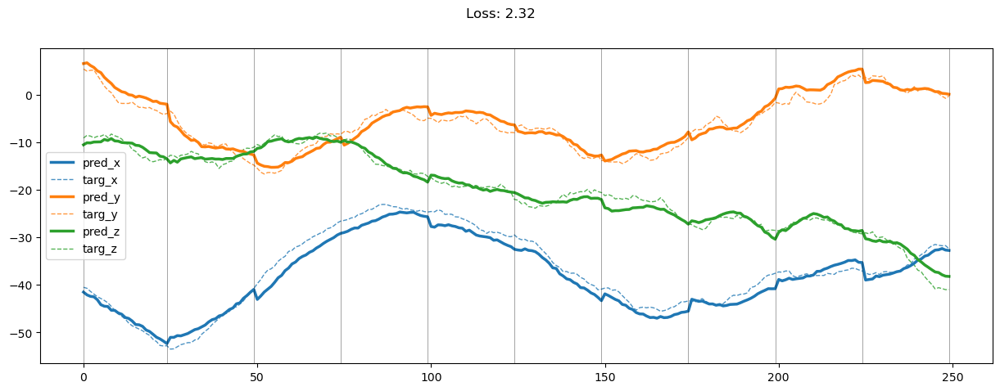

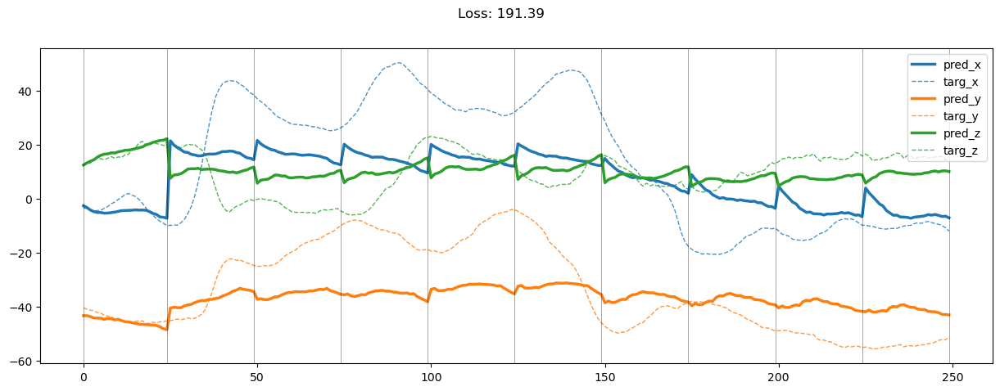

01599: train total loss:  2.842, pred loss:  2.842, valid total loss:  130.083, pred loss:  130.083


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01600: train total loss:  2.642, pred loss:  2.642, valid total loss:  128.661, pred loss:  128.661


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01601: train total loss:  2.503, pred loss:  2.503, valid total loss:  129.356, pred loss:  129.356


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01602: train total loss:  2.406, pred loss:  2.406, valid total loss:  129.394, pred loss:  129.394


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01603: train total loss:  2.329, pred loss:  2.329, valid total loss:  127.441, pred loss:  127.441


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01604: train total loss:  2.276, pred loss:  2.276, valid total loss:  124.698, pred loss:  124.698


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01605: train total loss:  2.209, pred loss:  2.209, valid total loss:  124.417, pred loss:  124.417


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01606: train total loss:  2.195, pred loss:  2.195, valid total loss:  125.197, pred loss:  125.197


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01607: train total loss:  2.117, pred loss:  2.117, valid total loss:  125.433, pred loss:  125.433


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


01608: train total loss:  2.141, pred loss:  2.141, valid total loss:  124.968, pred loss:  124.968


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01609: train total loss:  2.102, pred loss:  2.102, valid total loss:  123.358, pred loss:  123.358


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01610: train total loss:  2.025, pred loss:  2.025, valid total loss:  123.438, pred loss:  123.438


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01611: train total loss:  2.032, pred loss:  2.032, valid total loss:  121.523, pred loss:  121.523


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01612: train total loss:  1.966, pred loss:  1.966, valid total loss:  122.974, pred loss:  122.974


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01613: train total loss:  1.965, pred loss:  1.965, valid total loss:  120.051, pred loss:  120.051


100%|██████████| 6/6 [00:00<00:00, 20.54it/s]


01614: train total loss:  1.896, pred loss:  1.896, valid total loss:  123.101, pred loss:  123.101


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


01615: train total loss:  1.811, pred loss:  1.811, valid total loss:  123.615, pred loss:  123.615


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01616: train total loss:  1.827, pred loss:  1.827, valid total loss:  124.208, pred loss:  124.208


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01617: train total loss:  1.806, pred loss:  1.806, valid total loss:  125.842, pred loss:  125.842


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01618: train total loss:  1.760, pred loss:  1.760, valid total loss:  127.072, pred loss:  127.072


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01619: train total loss:  1.782, pred loss:  1.782, valid total loss:  125.725, pred loss:  125.725


100%|██████████| 6/6 [00:00<00:00, 19.16it/s]


01620: train total loss:  1.788, pred loss:  1.788, valid total loss:  124.269, pred loss:  124.269


100%|██████████| 6/6 [00:00<00:00, 18.68it/s]


01621: train total loss:  1.744, pred loss:  1.744, valid total loss:  124.237, pred loss:  124.237


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01622: train total loss:  1.696, pred loss:  1.696, valid total loss:  124.001, pred loss:  124.001


100%|██████████| 6/6 [00:00<00:00, 20.39it/s]


01623: train total loss:  1.716, pred loss:  1.716, valid total loss:  123.185, pred loss:  123.185


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01624: train total loss:  1.717, pred loss:  1.717, valid total loss:  125.573, pred loss:  125.573


100%|██████████| 6/6 [00:00<00:00, 20.55it/s]


01625: train total loss:  1.682, pred loss:  1.682, valid total loss:  124.060, pred loss:  124.060


100%|██████████| 6/6 [00:00<00:00, 19.75it/s]


01626: train total loss:  1.664, pred loss:  1.664, valid total loss:  126.195, pred loss:  126.195


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01627: train total loss:  1.660, pred loss:  1.660, valid total loss:  124.612, pred loss:  124.612


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01628: train total loss:  1.635, pred loss:  1.635, valid total loss:  124.769, pred loss:  124.769


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01629: train total loss:  1.643, pred loss:  1.643, valid total loss:  127.307, pred loss:  127.307


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01630: train total loss:  1.606, pred loss:  1.606, valid total loss:  126.054, pred loss:  126.054


100%|██████████| 6/6 [00:00<00:00, 19.15it/s]


01631: train total loss:  1.605, pred loss:  1.605, valid total loss:  126.341, pred loss:  126.341


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01632: train total loss:  1.578, pred loss:  1.578, valid total loss:  124.405, pred loss:  124.405


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01633: train total loss:  1.612, pred loss:  1.612, valid total loss:  124.376, pred loss:  124.376


100%|██████████| 6/6 [00:00<00:00, 19.80it/s]


01634: train total loss:  1.589, pred loss:  1.589, valid total loss:  124.966, pred loss:  124.966


100%|██████████| 6/6 [00:00<00:00, 17.83it/s]


01635: train total loss:  1.563, pred loss:  1.563, valid total loss:  124.672, pred loss:  124.672


100%|██████████| 6/6 [00:00<00:00, 20.53it/s]


01636: train total loss:  1.530, pred loss:  1.530, valid total loss:  123.424, pred loss:  123.424


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


01637: train total loss:  1.484, pred loss:  1.484, valid total loss:  123.371, pred loss:  123.371


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01638: train total loss:  1.506, pred loss:  1.506, valid total loss:  124.973, pred loss:  124.973


100%|██████████| 6/6 [00:00<00:00, 18.38it/s]


01639: train total loss:  1.539, pred loss:  1.539, valid total loss:  124.983, pred loss:  124.983


100%|██████████| 6/6 [00:00<00:00, 20.56it/s]


01640: train total loss:  1.513, pred loss:  1.513, valid total loss:  125.897, pred loss:  125.897


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


01641: train total loss:  1.488, pred loss:  1.488, valid total loss:  127.273, pred loss:  127.273


100%|██████████| 6/6 [00:00<00:00, 19.82it/s]


01642: train total loss:  1.542, pred loss:  1.542, valid total loss:  127.931, pred loss:  127.931


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01643: train total loss:  1.539, pred loss:  1.539, valid total loss:  126.162, pred loss:  126.162


100%|██████████| 6/6 [00:00<00:00, 18.39it/s]


01644: train total loss:  1.487, pred loss:  1.487, valid total loss:  126.786, pred loss:  126.786


100%|██████████| 6/6 [00:00<00:00, 17.92it/s]


01645: train total loss:  1.473, pred loss:  1.473, valid total loss:  125.205, pred loss:  125.205


100%|██████████| 6/6 [00:00<00:00, 17.84it/s]


01646: train total loss:  1.481, pred loss:  1.481, valid total loss:  125.512, pred loss:  125.512


100%|██████████| 6/6 [00:00<00:00, 17.84it/s]


01647: train total loss:  1.483, pred loss:  1.483, valid total loss:  125.165, pred loss:  125.165


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01648: train total loss:  1.421, pred loss:  1.421, valid total loss:  124.803, pred loss:  124.803


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


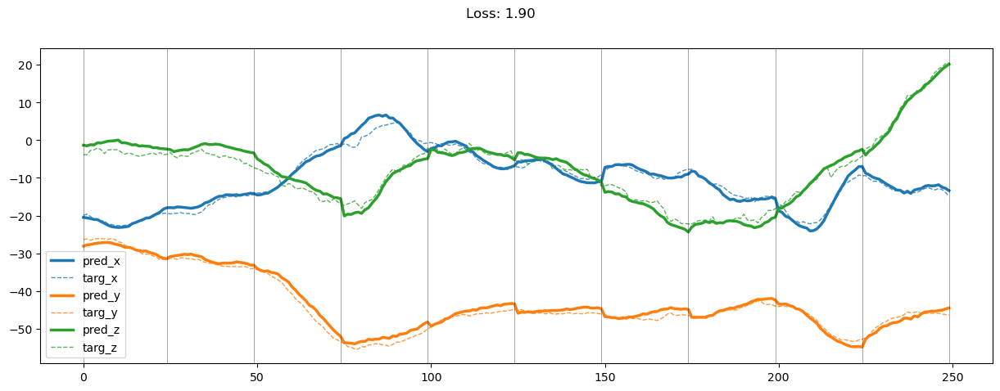

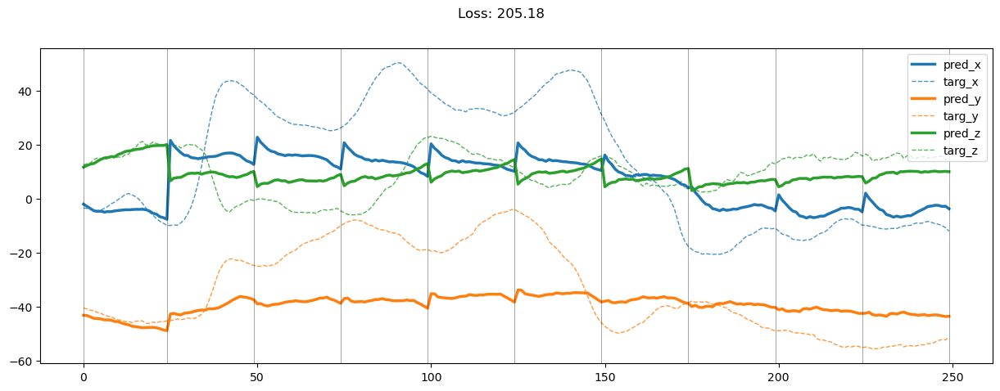

01649: train total loss:  1.429, pred loss:  1.429, valid total loss:  125.696, pred loss:  125.696


100%|██████████| 6/6 [00:00<00:00, 20.41it/s]


01650: train total loss:  1.435, pred loss:  1.435, valid total loss:  129.451, pred loss:  129.451


100%|██████████| 6/6 [00:00<00:00, 18.22it/s]


01651: train total loss:  1.449, pred loss:  1.449, valid total loss:  127.932, pred loss:  127.932


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01652: train total loss:  1.395, pred loss:  1.395, valid total loss:  128.260, pred loss:  128.260


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01653: train total loss:  1.357, pred loss:  1.357, valid total loss:  127.857, pred loss:  127.857


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01654: train total loss:  1.370, pred loss:  1.370, valid total loss:  125.105, pred loss:  125.105


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01655: train total loss:  1.385, pred loss:  1.385, valid total loss:  126.048, pred loss:  126.048


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


01656: train total loss:  1.350, pred loss:  1.350, valid total loss:  125.774, pred loss:  125.774


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01657: train total loss:  1.357, pred loss:  1.357, valid total loss:  123.623, pred loss:  123.623


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01658: train total loss:  1.375, pred loss:  1.375, valid total loss:  123.369, pred loss:  123.369


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01659: train total loss:  1.342, pred loss:  1.342, valid total loss:  125.177, pred loss:  125.177


100%|██████████| 6/6 [00:00<00:00, 18.71it/s]


01660: train total loss:  1.349, pred loss:  1.349, valid total loss:  124.116, pred loss:  124.116


100%|██████████| 6/6 [00:00<00:00, 20.32it/s]


01661: train total loss:  1.350, pred loss:  1.350, valid total loss:  123.409, pred loss:  123.409


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01662: train total loss:  1.346, pred loss:  1.346, valid total loss:  125.264, pred loss:  125.264


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01663: train total loss:  1.333, pred loss:  1.333, valid total loss:  124.339, pred loss:  124.339


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01664: train total loss:  1.367, pred loss:  1.367, valid total loss:  124.361, pred loss:  124.361


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01665: train total loss:  1.340, pred loss:  1.340, valid total loss:  125.086, pred loss:  125.086


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01666: train total loss:  1.315, pred loss:  1.315, valid total loss:  124.790, pred loss:  124.790


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01667: train total loss:  1.291, pred loss:  1.291, valid total loss:  126.846, pred loss:  126.846


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01668: train total loss:  1.326, pred loss:  1.326, valid total loss:  124.641, pred loss:  124.641


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01669: train total loss:  1.295, pred loss:  1.295, valid total loss:  124.797, pred loss:  124.797


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01670: train total loss:  1.283, pred loss:  1.283, valid total loss:  124.913, pred loss:  124.913


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


01671: train total loss:  1.296, pred loss:  1.296, valid total loss:  127.368, pred loss:  127.368


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


01672: train total loss:  1.291, pred loss:  1.291, valid total loss:  126.490, pred loss:  126.490


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01673: train total loss:  1.262, pred loss:  1.262, valid total loss:  124.861, pred loss:  124.861


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01674: train total loss:  1.255, pred loss:  1.255, valid total loss:  125.711, pred loss:  125.711


100%|██████████| 6/6 [00:00<00:00, 17.91it/s]


01675: train total loss:  1.259, pred loss:  1.259, valid total loss:  126.797, pred loss:  126.797


100%|██████████| 6/6 [00:00<00:00, 17.80it/s]


01676: train total loss:  1.259, pred loss:  1.259, valid total loss:  124.562, pred loss:  124.562


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01677: train total loss:  1.321, pred loss:  1.321, valid total loss:  126.072, pred loss:  126.072


100%|██████████| 6/6 [00:00<00:00, 20.30it/s]


01678: train total loss:  1.271, pred loss:  1.271, valid total loss:  124.917, pred loss:  124.917


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


01679: train total loss:  1.269, pred loss:  1.269, valid total loss:  122.780, pred loss:  122.780


100%|██████████| 6/6 [00:00<00:00, 20.13it/s]


01680: train total loss:  1.295, pred loss:  1.295, valid total loss:  127.389, pred loss:  127.389


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01681: train total loss:  1.287, pred loss:  1.287, valid total loss:  125.738, pred loss:  125.738


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01682: train total loss:  1.281, pred loss:  1.281, valid total loss:  125.180, pred loss:  125.180


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


01683: train total loss:  1.244, pred loss:  1.244, valid total loss:  125.254, pred loss:  125.254


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01684: train total loss:  1.254, pred loss:  1.254, valid total loss:  125.586, pred loss:  125.586


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


01685: train total loss:  1.202, pred loss:  1.202, valid total loss:  124.823, pred loss:  124.823


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01686: train total loss:  1.223, pred loss:  1.223, valid total loss:  126.002, pred loss:  126.002


100%|██████████| 6/6 [00:00<00:00, 20.58it/s]


01687: train total loss:  1.228, pred loss:  1.228, valid total loss:  125.574, pred loss:  125.574


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01688: train total loss:  1.204, pred loss:  1.204, valid total loss:  126.752, pred loss:  126.752


100%|██████████| 6/6 [00:00<00:00, 20.50it/s]


01689: train total loss:  1.209, pred loss:  1.209, valid total loss:  125.136, pred loss:  125.136


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01690: train total loss:  1.250, pred loss:  1.250, valid total loss:  126.456, pred loss:  126.456


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01691: train total loss:  1.255, pred loss:  1.255, valid total loss:  126.467, pred loss:  126.467


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01692: train total loss:  1.234, pred loss:  1.234, valid total loss:  127.019, pred loss:  127.019


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01693: train total loss:  1.208, pred loss:  1.208, valid total loss:  128.894, pred loss:  128.894


100%|██████████| 6/6 [00:00<00:00, 20.56it/s]


01694: train total loss:  1.229, pred loss:  1.229, valid total loss:  127.318, pred loss:  127.318


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01695: train total loss:  1.204, pred loss:  1.204, valid total loss:  128.649, pred loss:  128.649


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01696: train total loss:  1.183, pred loss:  1.183, valid total loss:  127.422, pred loss:  127.422


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01697: train total loss:  1.183, pred loss:  1.183, valid total loss:  127.212, pred loss:  127.212


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01698: train total loss:  1.214, pred loss:  1.214, valid total loss:  125.667, pred loss:  125.667


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


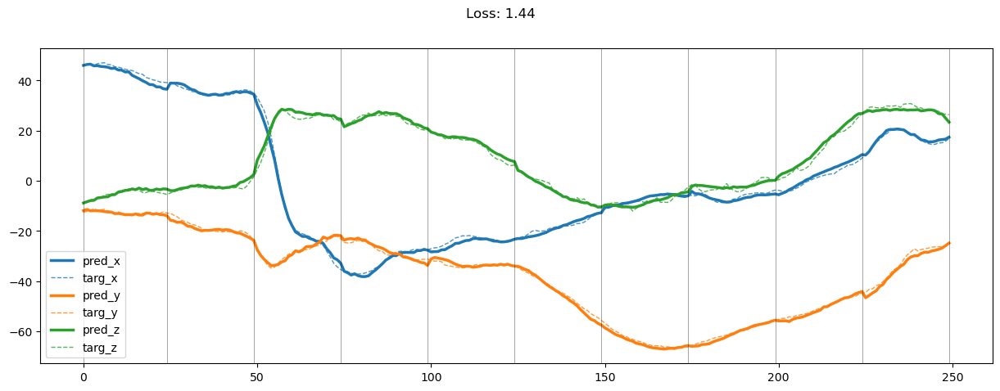

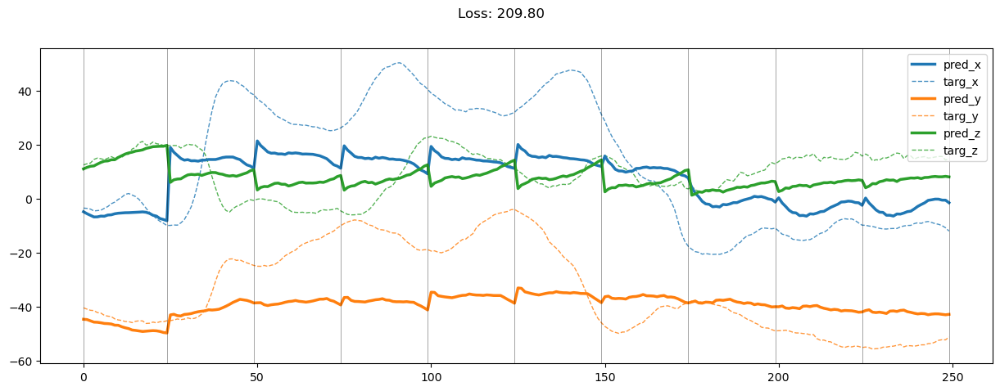

01699: train total loss:  1.213, pred loss:  1.213, valid total loss:  128.197, pred loss:  128.197


100%|██████████| 6/6 [00:00<00:00, 19.59it/s]


01700: train total loss:  1.205, pred loss:  1.205, valid total loss:  128.769, pred loss:  128.769


100%|██████████| 6/6 [00:00<00:00, 20.06it/s]


01701: train total loss:  1.177, pred loss:  1.177, valid total loss:  127.889, pred loss:  127.889


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01702: train total loss:  1.166, pred loss:  1.166, valid total loss:  126.563, pred loss:  126.563


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01703: train total loss:  1.162, pred loss:  1.162, valid total loss:  125.126, pred loss:  125.126


100%|██████████| 6/6 [00:00<00:00, 20.46it/s]


01704: train total loss:  1.179, pred loss:  1.179, valid total loss:  125.970, pred loss:  125.970


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01705: train total loss:  1.166, pred loss:  1.166, valid total loss:  126.270, pred loss:  126.270


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01706: train total loss:  1.182, pred loss:  1.182, valid total loss:  125.557, pred loss:  125.557


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01707: train total loss:  1.146, pred loss:  1.146, valid total loss:  126.271, pred loss:  126.271


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01708: train total loss:  1.163, pred loss:  1.163, valid total loss:  126.475, pred loss:  126.475


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01709: train total loss:  1.154, pred loss:  1.154, valid total loss:  127.439, pred loss:  127.439


100%|██████████| 6/6 [00:00<00:00, 20.13it/s]


01710: train total loss:  1.150, pred loss:  1.150, valid total loss:  125.444, pred loss:  125.444


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01711: train total loss:  1.156, pred loss:  1.156, valid total loss:  123.847, pred loss:  123.847


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01712: train total loss:  1.142, pred loss:  1.142, valid total loss:  127.004, pred loss:  127.004


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01713: train total loss:  1.164, pred loss:  1.164, valid total loss:  126.052, pred loss:  126.052


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01714: train total loss:  1.158, pred loss:  1.158, valid total loss:  124.959, pred loss:  124.959


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01715: train total loss:  1.123, pred loss:  1.123, valid total loss:  125.933, pred loss:  125.933


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01716: train total loss:  1.155, pred loss:  1.155, valid total loss:  125.054, pred loss:  125.054


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01717: train total loss:  1.130, pred loss:  1.130, valid total loss:  127.162, pred loss:  127.162


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01718: train total loss:  1.127, pred loss:  1.127, valid total loss:  125.870, pred loss:  125.870


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01719: train total loss:  1.146, pred loss:  1.146, valid total loss:  126.380, pred loss:  126.380


100%|██████████| 6/6 [00:00<00:00, 19.87it/s]


01720: train total loss:  1.107, pred loss:  1.107, valid total loss:  124.579, pred loss:  124.579


100%|██████████| 6/6 [00:00<00:00, 20.58it/s]


01721: train total loss:  1.114, pred loss:  1.114, valid total loss:  125.397, pred loss:  125.397


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01722: train total loss:  1.147, pred loss:  1.147, valid total loss:  126.088, pred loss:  126.088


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01723: train total loss:  1.121, pred loss:  1.121, valid total loss:  125.526, pred loss:  125.526


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01724: train total loss:  1.133, pred loss:  1.133, valid total loss:  125.588, pred loss:  125.588


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01725: train total loss:  1.128, pred loss:  1.128, valid total loss:  126.656, pred loss:  126.656


100%|██████████| 6/6 [00:00<00:00, 19.93it/s]


01726: train total loss:  1.127, pred loss:  1.127, valid total loss:  124.764, pred loss:  124.764


100%|██████████| 6/6 [00:00<00:00, 20.36it/s]


01727: train total loss:  1.124, pred loss:  1.124, valid total loss:  128.917, pred loss:  128.917


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01728: train total loss:  1.150, pred loss:  1.150, valid total loss:  127.652, pred loss:  127.652


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01729: train total loss:  1.117, pred loss:  1.117, valid total loss:  126.413, pred loss:  126.413


100%|██████████| 6/6 [00:00<00:00, 20.58it/s]


01730: train total loss:  1.118, pred loss:  1.118, valid total loss:  124.692, pred loss:  124.692


100%|██████████| 6/6 [00:00<00:00, 20.51it/s]


01731: train total loss:  1.111, pred loss:  1.111, valid total loss:  125.374, pred loss:  125.374


100%|██████████| 6/6 [00:00<00:00, 20.20it/s]


01732: train total loss:  1.087, pred loss:  1.087, valid total loss:  125.693, pred loss:  125.693


100%|██████████| 6/6 [00:00<00:00, 20.42it/s]


01733: train total loss:  1.097, pred loss:  1.097, valid total loss:  125.257, pred loss:  125.257


100%|██████████| 6/6 [00:00<00:00, 20.47it/s]


01734: train total loss:  1.102, pred loss:  1.102, valid total loss:  124.896, pred loss:  124.896


100%|██████████| 6/6 [00:00<00:00, 20.39it/s]


01735: train total loss:  1.110, pred loss:  1.110, valid total loss:  126.433, pred loss:  126.433


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01736: train total loss:  1.103, pred loss:  1.103, valid total loss:  126.373, pred loss:  126.373


100%|██████████| 6/6 [00:00<00:00, 20.53it/s]


01737: train total loss:  1.097, pred loss:  1.097, valid total loss:  125.613, pred loss:  125.613


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01738: train total loss:  1.082, pred loss:  1.082, valid total loss:  126.528, pred loss:  126.528


100%|██████████| 6/6 [00:00<00:00, 17.90it/s]


01739: train total loss:  1.120, pred loss:  1.120, valid total loss:  126.704, pred loss:  126.704


100%|██████████| 6/6 [00:00<00:00, 17.76it/s]


01740: train total loss:  1.107, pred loss:  1.107, valid total loss:  125.990, pred loss:  125.990


100%|██████████| 6/6 [00:00<00:00, 20.40it/s]


01741: train total loss:  1.096, pred loss:  1.096, valid total loss:  127.336, pred loss:  127.336


100%|██████████| 6/6 [00:00<00:00, 19.47it/s]


01742: train total loss:  1.068, pred loss:  1.068, valid total loss:  125.738, pred loss:  125.738


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


01743: train total loss:  1.054, pred loss:  1.054, valid total loss:  125.027, pred loss:  125.027


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01744: train total loss:  1.099, pred loss:  1.099, valid total loss:  129.199, pred loss:  129.199


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01745: train total loss:  1.086, pred loss:  1.086, valid total loss:  124.977, pred loss:  124.977


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01746: train total loss:  1.076, pred loss:  1.076, valid total loss:  125.024, pred loss:  125.024


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01747: train total loss:  1.072, pred loss:  1.072, valid total loss:  126.280, pred loss:  126.280


100%|██████████| 6/6 [00:00<00:00, 20.48it/s]


01748: train total loss:  1.051, pred loss:  1.051, valid total loss:  127.908, pred loss:  127.908


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


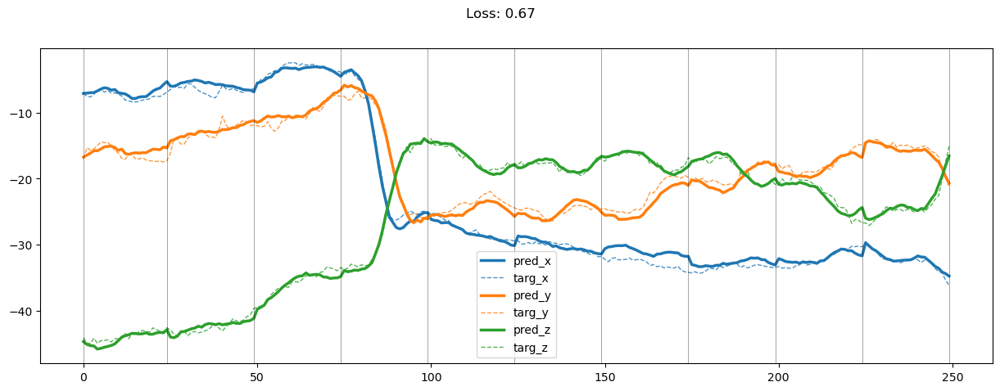

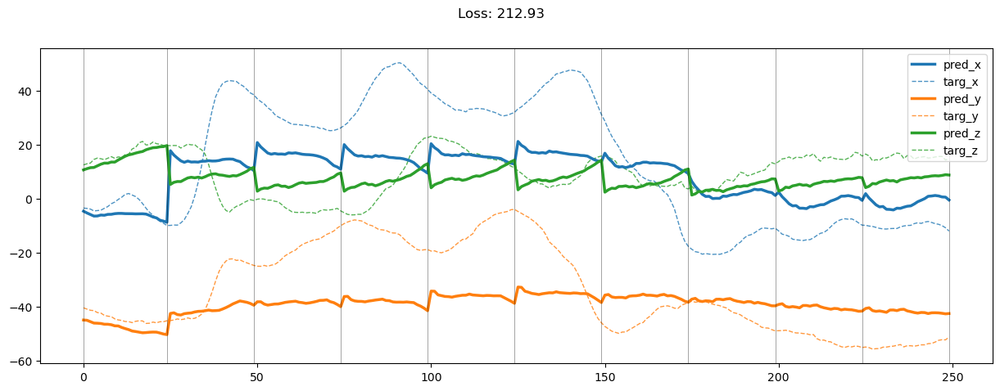

01749: train total loss:  1.058, pred loss:  1.058, valid total loss:  126.969, pred loss:  126.969


100%|██████████| 6/6 [00:00<00:00, 20.56it/s]


01750: train total loss:  1.045, pred loss:  1.045, valid total loss:  125.478, pred loss:  125.478


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01751: train total loss:  1.061, pred loss:  1.061, valid total loss:  126.712, pred loss:  126.712


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01752: train total loss:  1.059, pred loss:  1.059, valid total loss:  127.135, pred loss:  127.135


100%|██████████| 6/6 [00:00<00:00, 20.49it/s]


01753: train total loss:  1.069, pred loss:  1.069, valid total loss:  125.408, pred loss:  125.408


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


01754: train total loss:  1.073, pred loss:  1.073, valid total loss:  126.669, pred loss:  126.669


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


01755: train total loss:  1.043, pred loss:  1.043, valid total loss:  128.702, pred loss:  128.702


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01756: train total loss:  1.067, pred loss:  1.067, valid total loss:  128.250, pred loss:  128.250


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01757: train total loss:  1.033, pred loss:  1.033, valid total loss:  128.738, pred loss:  128.738


100%|██████████| 6/6 [00:00<00:00, 20.23it/s]


01758: train total loss:  1.054, pred loss:  1.054, valid total loss:  128.360, pred loss:  128.360


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


01759: train total loss:  1.043, pred loss:  1.043, valid total loss:  127.362, pred loss:  127.362


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


01760: train total loss:  1.021, pred loss:  1.021, valid total loss:  128.422, pred loss:  128.422


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


01761: train total loss:  1.031, pred loss:  1.031, valid total loss:  127.795, pred loss:  127.795


100%|██████████| 6/6 [00:00<00:00, 20.86it/s]


01762: train total loss:  1.035, pred loss:  1.035, valid total loss:  128.759, pred loss:  128.759


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


01763: train total loss:  1.032, pred loss:  1.032, valid total loss:  129.145, pred loss:  129.145


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01764: train total loss:  1.025, pred loss:  1.025, valid total loss:  126.845, pred loss:  126.845


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


01765: train total loss:  1.038, pred loss:  1.038, valid total loss:  127.362, pred loss:  127.362


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


01766: train total loss:  1.049, pred loss:  1.049, valid total loss:  125.660, pred loss:  125.660


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01767: train total loss:  1.036, pred loss:  1.036, valid total loss:  125.379, pred loss:  125.379


100%|██████████| 6/6 [00:00<00:00, 18.37it/s]


01768: train total loss:  1.036, pred loss:  1.036, valid total loss:  124.695, pred loss:  124.695


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


01769: train total loss:  1.042, pred loss:  1.042, valid total loss:  125.686, pred loss:  125.686


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


01770: train total loss:  1.039, pred loss:  1.039, valid total loss:  126.013, pred loss:  126.013


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01771: train total loss:  1.028, pred loss:  1.028, valid total loss:  126.193, pred loss:  126.193


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


01772: train total loss:  1.012, pred loss:  1.012, valid total loss:  125.573, pred loss:  125.573


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


01773: train total loss:  1.026, pred loss:  1.026, valid total loss:  123.660, pred loss:  123.660


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01774: train total loss:  1.047, pred loss:  1.047, valid total loss:  124.543, pred loss:  124.543


100%|██████████| 6/6 [00:00<00:00, 20.36it/s]


01775: train total loss:  1.048, pred loss:  1.048, valid total loss:  124.660, pred loss:  124.660


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


01776: train total loss:  1.022, pred loss:  1.022, valid total loss:  126.912, pred loss:  126.912


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


01777: train total loss:  1.004, pred loss:  1.004, valid total loss:  126.371, pred loss:  126.371


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


01778: train total loss:  1.041, pred loss:  1.041, valid total loss:  128.973, pred loss:  128.973


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


01779: train total loss:  1.029, pred loss:  1.029, valid total loss:  128.660, pred loss:  128.660


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


01780: train total loss:  1.049, pred loss:  1.049, valid total loss:  127.826, pred loss:  127.826


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01781: train total loss:  0.998, pred loss:  0.998, valid total loss:  128.255, pred loss:  128.255


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01782: train total loss:  1.019, pred loss:  1.019, valid total loss:  126.588, pred loss:  126.588


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01783: train total loss:  0.995, pred loss:  0.995, valid total loss:  125.036, pred loss:  125.036


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


01784: train total loss:  1.007, pred loss:  1.007, valid total loss:  125.191, pred loss:  125.191


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01785: train total loss:  0.978, pred loss:  0.978, valid total loss:  124.906, pred loss:  124.906


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


01786: train total loss:  1.006, pred loss:  1.006, valid total loss:  126.344, pred loss:  126.344


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01787: train total loss:  1.018, pred loss:  1.018, valid total loss:  125.556, pred loss:  125.556


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01788: train total loss:  1.011, pred loss:  1.011, valid total loss:  126.133, pred loss:  126.133


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


01789: train total loss:  1.005, pred loss:  1.005, valid total loss:  127.153, pred loss:  127.153


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01790: train total loss:  0.997, pred loss:  0.997, valid total loss:  127.013, pred loss:  127.013


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


01791: train total loss:  1.008, pred loss:  1.008, valid total loss:  127.965, pred loss:  127.965


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01792: train total loss:  1.020, pred loss:  1.020, valid total loss:  127.395, pred loss:  127.395


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


01793: train total loss:  0.996, pred loss:  0.996, valid total loss:  126.268, pred loss:  126.268


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01794: train total loss:  0.983, pred loss:  0.983, valid total loss:  131.599, pred loss:  131.599


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


01795: train total loss:  0.991, pred loss:  0.991, valid total loss:  130.821, pred loss:  130.821


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01796: train total loss:  1.009, pred loss:  1.009, valid total loss:  131.147, pred loss:  131.147


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


01797: train total loss:  0.989, pred loss:  0.989, valid total loss:  131.494, pred loss:  131.494


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01798: train total loss:  0.995, pred loss:  0.995, valid total loss:  129.571, pred loss:  129.571


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


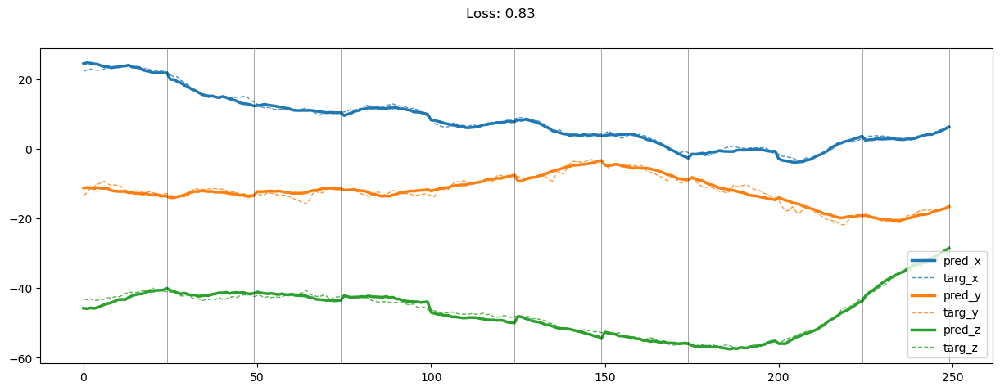

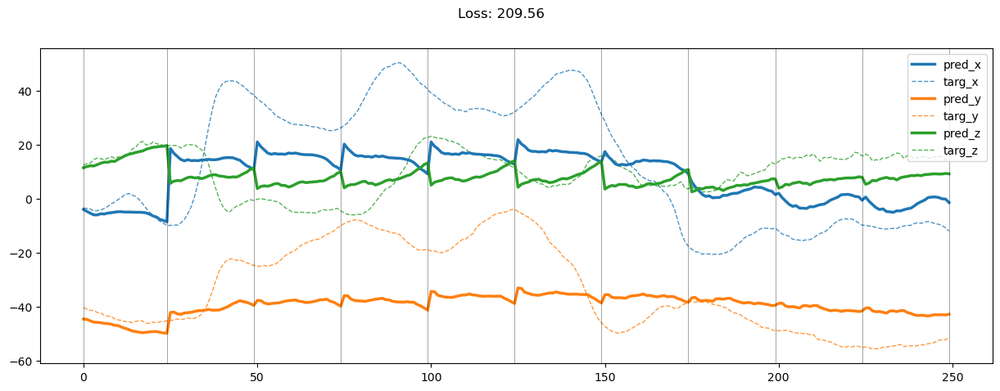

01799: train total loss:  0.984, pred loss:  0.984, valid total loss:  132.565, pred loss:  132.565


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01800: train total loss:  1.013, pred loss:  1.013, valid total loss:  133.319, pred loss:  133.319


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01801: train total loss:  0.988, pred loss:  0.988, valid total loss:  128.946, pred loss:  128.946


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01802: train total loss:  0.979, pred loss:  0.979, valid total loss:  131.734, pred loss:  131.734


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01803: train total loss:  0.964, pred loss:  0.964, valid total loss:  130.995, pred loss:  130.995


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01804: train total loss:  0.993, pred loss:  0.993, valid total loss:  128.457, pred loss:  128.457


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01805: train total loss:  0.944, pred loss:  0.944, valid total loss:  129.157, pred loss:  129.157


100%|██████████| 6/6 [00:00<00:00, 20.24it/s]


01806: train total loss:  0.975, pred loss:  0.975, valid total loss:  130.385, pred loss:  130.385


100%|██████████| 6/6 [00:00<00:00, 20.56it/s]


01807: train total loss:  0.972, pred loss:  0.972, valid total loss:  128.433, pred loss:  128.433


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01808: train total loss:  0.952, pred loss:  0.952, valid total loss:  128.773, pred loss:  128.773


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01809: train total loss:  0.977, pred loss:  0.977, valid total loss:  128.409, pred loss:  128.409


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01810: train total loss:  0.974, pred loss:  0.974, valid total loss:  128.120, pred loss:  128.120


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01811: train total loss:  0.981, pred loss:  0.981, valid total loss:  128.102, pred loss:  128.102


100%|██████████| 6/6 [00:00<00:00, 19.51it/s]


01812: train total loss:  0.973, pred loss:  0.973, valid total loss:  129.836, pred loss:  129.836


100%|██████████| 6/6 [00:00<00:00, 19.58it/s]


01813: train total loss:  0.959, pred loss:  0.959, valid total loss:  130.140, pred loss:  130.140


100%|██████████| 6/6 [00:00<00:00, 20.12it/s]


01814: train total loss:  0.969, pred loss:  0.969, valid total loss:  130.314, pred loss:  130.314


100%|██████████| 6/6 [00:00<00:00, 20.13it/s]


01815: train total loss:  0.973, pred loss:  0.973, valid total loss:  131.205, pred loss:  131.205


100%|██████████| 6/6 [00:00<00:00, 20.11it/s]


01816: train total loss:  0.966, pred loss:  0.966, valid total loss:  132.378, pred loss:  132.378


100%|██████████| 6/6 [00:00<00:00, 20.13it/s]


01817: train total loss:  0.947, pred loss:  0.947, valid total loss:  130.266, pred loss:  130.266


100%|██████████| 6/6 [00:00<00:00, 18.64it/s]


01818: train total loss:  0.969, pred loss:  0.969, valid total loss:  131.615, pred loss:  131.615


100%|██████████| 6/6 [00:00<00:00, 20.45it/s]


01819: train total loss:  0.977, pred loss:  0.977, valid total loss:  130.172, pred loss:  130.172


100%|██████████| 6/6 [00:00<00:00, 20.58it/s]


01820: train total loss:  0.972, pred loss:  0.972, valid total loss:  129.994, pred loss:  129.994


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


01821: train total loss:  0.958, pred loss:  0.958, valid total loss:  132.268, pred loss:  132.268


100%|██████████| 6/6 [00:00<00:00, 19.56it/s]


01822: train total loss:  0.946, pred loss:  0.946, valid total loss:  130.471, pred loss:  130.471


100%|██████████| 6/6 [00:00<00:00, 17.84it/s]


01823: train total loss:  0.975, pred loss:  0.975, valid total loss:  130.115, pred loss:  130.115


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01824: train total loss:  0.965, pred loss:  0.965, valid total loss:  130.100, pred loss:  130.100


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01825: train total loss:  0.966, pred loss:  0.966, valid total loss:  128.626, pred loss:  128.626


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01826: train total loss:  0.957, pred loss:  0.957, valid total loss:  129.629, pred loss:  129.629


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01827: train total loss:  0.958, pred loss:  0.958, valid total loss:  130.567, pred loss:  130.567


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01828: train total loss:  0.968, pred loss:  0.968, valid total loss:  131.887, pred loss:  131.887


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


01829: train total loss:  0.969, pred loss:  0.969, valid total loss:  131.408, pred loss:  131.408


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01830: train total loss:  0.977, pred loss:  0.977, valid total loss:  132.255, pred loss:  132.255


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01831: train total loss:  0.968, pred loss:  0.968, valid total loss:  130.386, pred loss:  130.386


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01832: train total loss:  0.934, pred loss:  0.934, valid total loss:  129.532, pred loss:  129.532


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01833: train total loss:  0.929, pred loss:  0.929, valid total loss:  129.963, pred loss:  129.963


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01834: train total loss:  0.923, pred loss:  0.923, valid total loss:  128.959, pred loss:  128.959


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01835: train total loss:  0.969, pred loss:  0.969, valid total loss:  129.460, pred loss:  129.460


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01836: train total loss:  0.963, pred loss:  0.963, valid total loss:  128.808, pred loss:  128.808


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01837: train total loss:  0.942, pred loss:  0.942, valid total loss:  127.971, pred loss:  127.971


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01838: train total loss:  0.932, pred loss:  0.932, valid total loss:  128.539, pred loss:  128.539


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01839: train total loss:  0.943, pred loss:  0.943, valid total loss:  129.745, pred loss:  129.745


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


01840: train total loss:  0.943, pred loss:  0.943, valid total loss:  130.377, pred loss:  130.377


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01841: train total loss:  0.963, pred loss:  0.963, valid total loss:  130.109, pred loss:  130.109


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01842: train total loss:  0.936, pred loss:  0.936, valid total loss:  131.636, pred loss:  131.636


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


01843: train total loss:  0.956, pred loss:  0.956, valid total loss:  130.772, pred loss:  130.772


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01844: train total loss:  0.937, pred loss:  0.937, valid total loss:  129.012, pred loss:  129.012


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01845: train total loss:  0.944, pred loss:  0.944, valid total loss:  129.815, pred loss:  129.815


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01846: train total loss:  0.937, pred loss:  0.937, valid total loss:  130.871, pred loss:  130.871


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01847: train total loss:  0.931, pred loss:  0.931, valid total loss:  129.100, pred loss:  129.100


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01848: train total loss:  0.945, pred loss:  0.945, valid total loss:  129.433, pred loss:  129.433


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


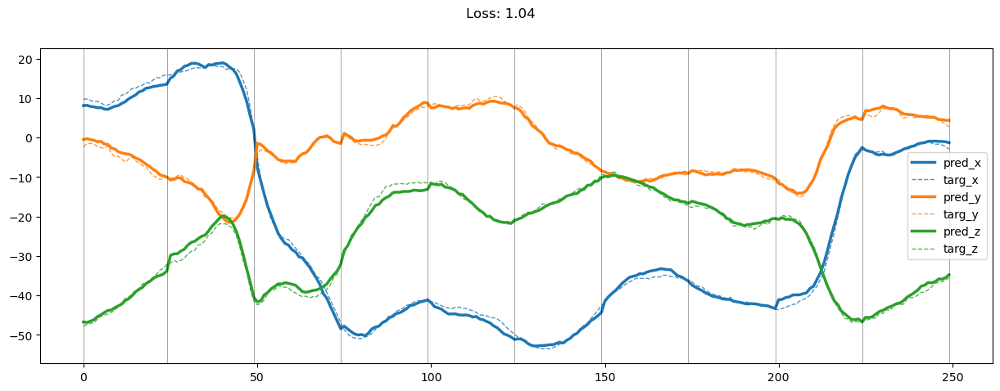

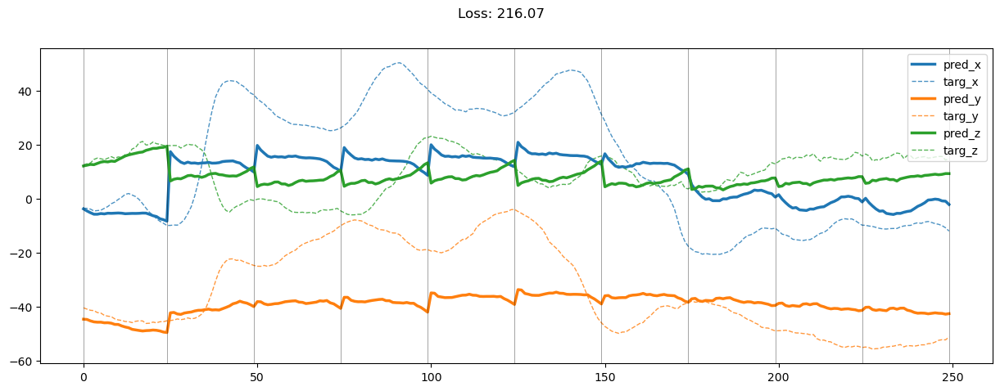

01849: train total loss:  0.940, pred loss:  0.940, valid total loss:  131.577, pred loss:  131.577


100%|██████████| 6/6 [00:00<00:00, 20.50it/s]


01850: train total loss:  0.950, pred loss:  0.950, valid total loss:  130.132, pred loss:  130.132


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01851: train total loss:  0.952, pred loss:  0.952, valid total loss:  130.830, pred loss:  130.830


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01852: train total loss:  0.928, pred loss:  0.928, valid total loss:  134.980, pred loss:  134.980


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01853: train total loss:  0.940, pred loss:  0.940, valid total loss:  132.160, pred loss:  132.160


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01854: train total loss:  0.933, pred loss:  0.933, valid total loss:  131.457, pred loss:  131.457


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01855: train total loss:  0.908, pred loss:  0.908, valid total loss:  131.841, pred loss:  131.841


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01856: train total loss:  0.918, pred loss:  0.918, valid total loss:  129.204, pred loss:  129.204


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01857: train total loss:  0.930, pred loss:  0.930, valid total loss:  129.775, pred loss:  129.775


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01858: train total loss:  0.918, pred loss:  0.918, valid total loss:  131.905, pred loss:  131.905


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01859: train total loss:  0.914, pred loss:  0.914, valid total loss:  130.892, pred loss:  130.892


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01860: train total loss:  0.915, pred loss:  0.915, valid total loss:  132.185, pred loss:  132.185


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01861: train total loss:  0.927, pred loss:  0.927, valid total loss:  132.522, pred loss:  132.522


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01862: train total loss:  0.965, pred loss:  0.965, valid total loss:  131.415, pred loss:  131.415


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


01863: train total loss:  0.907, pred loss:  0.907, valid total loss:  130.424, pred loss:  130.424


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01864: train total loss:  0.926, pred loss:  0.926, valid total loss:  131.724, pred loss:  131.724


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01865: train total loss:  0.924, pred loss:  0.924, valid total loss:  132.703, pred loss:  132.703


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01866: train total loss:  0.932, pred loss:  0.932, valid total loss:  133.492, pred loss:  133.492


100%|██████████| 6/6 [00:00<00:00, 17.86it/s]


01867: train total loss:  0.935, pred loss:  0.935, valid total loss:  133.358, pred loss:  133.358


100%|██████████| 6/6 [00:00<00:00, 18.10it/s]


01868: train total loss:  0.936, pred loss:  0.936, valid total loss:  135.015, pred loss:  135.015


100%|██████████| 6/6 [00:00<00:00, 17.75it/s]


01869: train total loss:  0.944, pred loss:  0.944, valid total loss:  132.174, pred loss:  132.174


100%|██████████| 6/6 [00:00<00:00, 18.19it/s]


01870: train total loss:  0.908, pred loss:  0.908, valid total loss:  132.778, pred loss:  132.778


100%|██████████| 6/6 [00:00<00:00, 18.50it/s]


01871: train total loss:  0.915, pred loss:  0.915, valid total loss:  134.316, pred loss:  134.316


100%|██████████| 6/6 [00:00<00:00, 18.60it/s]


01872: train total loss:  0.922, pred loss:  0.922, valid total loss:  132.330, pred loss:  132.330


100%|██████████| 6/6 [00:00<00:00, 18.80it/s]


01873: train total loss:  0.906, pred loss:  0.906, valid total loss:  132.131, pred loss:  132.131


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01874: train total loss:  0.925, pred loss:  0.925, valid total loss:  132.697, pred loss:  132.697


100%|██████████| 6/6 [00:00<00:00, 20.25it/s]


01875: train total loss:  0.913, pred loss:  0.913, valid total loss:  131.665, pred loss:  131.665


100%|██████████| 6/6 [00:00<00:00, 20.12it/s]


01876: train total loss:  0.907, pred loss:  0.907, valid total loss:  132.975, pred loss:  132.975


100%|██████████| 6/6 [00:00<00:00, 19.60it/s]


01877: train total loss:  0.905, pred loss:  0.905, valid total loss:  133.467, pred loss:  133.467


100%|██████████| 6/6 [00:00<00:00, 20.42it/s]


01878: train total loss:  0.922, pred loss:  0.922, valid total loss:  132.698, pred loss:  132.698


100%|██████████| 6/6 [00:00<00:00, 20.31it/s]


01879: train total loss:  0.898, pred loss:  0.898, valid total loss:  131.050, pred loss:  131.050


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01880: train total loss:  0.895, pred loss:  0.895, valid total loss:  131.092, pred loss:  131.092


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01881: train total loss:  0.929, pred loss:  0.929, valid total loss:  131.764, pred loss:  131.764


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01882: train total loss:  0.919, pred loss:  0.919, valid total loss:  131.025, pred loss:  131.025


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01883: train total loss:  0.906, pred loss:  0.906, valid total loss:  131.136, pred loss:  131.136


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01884: train total loss:  0.922, pred loss:  0.922, valid total loss:  133.381, pred loss:  133.381


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01885: train total loss:  0.907, pred loss:  0.907, valid total loss:  131.578, pred loss:  131.578


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01886: train total loss:  0.919, pred loss:  0.919, valid total loss:  131.096, pred loss:  131.096


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01887: train total loss:  0.900, pred loss:  0.900, valid total loss:  133.503, pred loss:  133.503


100%|██████████| 6/6 [00:00<00:00, 20.16it/s]


01888: train total loss:  0.924, pred loss:  0.924, valid total loss:  133.420, pred loss:  133.420


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01889: train total loss:  0.928, pred loss:  0.928, valid total loss:  133.997, pred loss:  133.997


100%|██████████| 6/6 [00:00<00:00, 20.36it/s]


01890: train total loss:  0.921, pred loss:  0.921, valid total loss:  131.666, pred loss:  131.666


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01891: train total loss:  0.917, pred loss:  0.917, valid total loss:  128.521, pred loss:  128.521


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01892: train total loss:  0.909, pred loss:  0.909, valid total loss:  131.646, pred loss:  131.646


100%|██████████| 6/6 [00:00<00:00, 20.51it/s]


01893: train total loss:  0.928, pred loss:  0.928, valid total loss:  130.233, pred loss:  130.233


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01894: train total loss:  0.928, pred loss:  0.928, valid total loss:  128.620, pred loss:  128.620


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01895: train total loss:  0.917, pred loss:  0.917, valid total loss:  132.200, pred loss:  132.200


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01896: train total loss:  0.924, pred loss:  0.924, valid total loss:  129.357, pred loss:  129.357


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01897: train total loss:  0.934, pred loss:  0.934, valid total loss:  129.477, pred loss:  129.477


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01898: train total loss:  0.929, pred loss:  0.929, valid total loss:  129.653, pred loss:  129.653


100%|██████████| 6/6 [00:00<00:00, 20.50it/s]


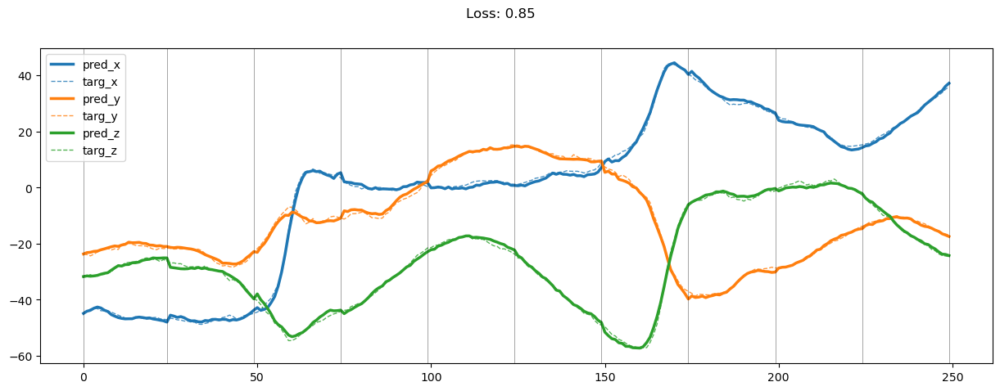

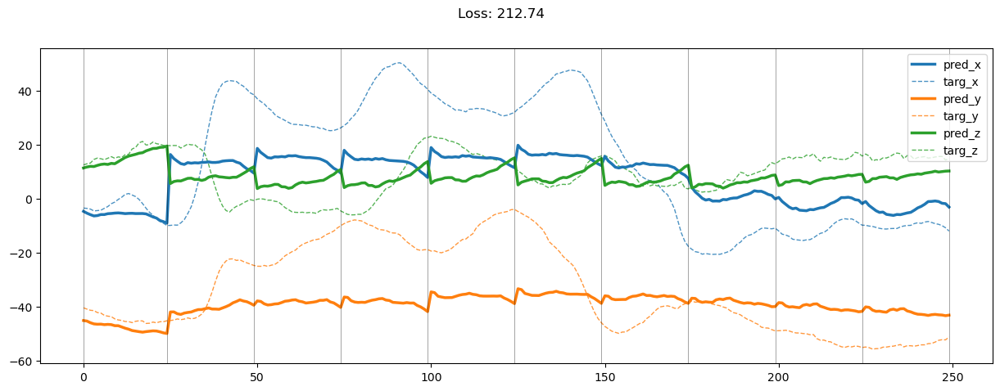

01899: train total loss:  0.919, pred loss:  0.919, valid total loss:  129.179, pred loss:  129.179


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


01900: train total loss:  0.925, pred loss:  0.925, valid total loss:  129.861, pred loss:  129.861


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


01901: train total loss:  0.886, pred loss:  0.886, valid total loss:  128.690, pred loss:  128.690


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


01902: train total loss:  0.906, pred loss:  0.906, valid total loss:  130.185, pred loss:  130.185


100%|██████████| 6/6 [00:00<00:00, 20.58it/s]


01903: train total loss:  0.895, pred loss:  0.895, valid total loss:  129.130, pred loss:  129.130


100%|██████████| 6/6 [00:00<00:00, 20.51it/s]


01904: train total loss:  0.912, pred loss:  0.912, valid total loss:  130.048, pred loss:  130.048


100%|██████████| 6/6 [00:00<00:00, 20.55it/s]


01905: train total loss:  0.893, pred loss:  0.893, valid total loss:  132.039, pred loss:  132.039


100%|██████████| 6/6 [00:00<00:00, 20.41it/s]


01906: train total loss:  0.876, pred loss:  0.876, valid total loss:  135.194, pred loss:  135.194


100%|██████████| 6/6 [00:00<00:00, 18.88it/s]


01907: train total loss:  0.883, pred loss:  0.883, valid total loss:  133.490, pred loss:  133.490


100%|██████████| 6/6 [00:00<00:00, 18.87it/s]


01908: train total loss:  0.888, pred loss:  0.888, valid total loss:  132.307, pred loss:  132.307


100%|██████████| 6/6 [00:00<00:00, 18.68it/s]


01909: train total loss:  0.928, pred loss:  0.928, valid total loss:  131.402, pred loss:  131.402


100%|██████████| 6/6 [00:00<00:00, 18.93it/s]


01910: train total loss:  0.875, pred loss:  0.875, valid total loss:  130.462, pred loss:  130.462


100%|██████████| 6/6 [00:00<00:00, 18.85it/s]


01911: train total loss:  0.917, pred loss:  0.917, valid total loss:  130.904, pred loss:  130.904


100%|██████████| 6/6 [00:00<00:00, 19.14it/s]


01912: train total loss:  0.914, pred loss:  0.914, valid total loss:  130.086, pred loss:  130.086


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01913: train total loss:  0.886, pred loss:  0.886, valid total loss:  131.813, pred loss:  131.813


100%|██████████| 6/6 [00:00<00:00, 20.58it/s]


01914: train total loss:  0.880, pred loss:  0.880, valid total loss:  132.135, pred loss:  132.135


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01915: train total loss:  0.885, pred loss:  0.885, valid total loss:  134.206, pred loss:  134.206


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01916: train total loss:  0.874, pred loss:  0.874, valid total loss:  131.868, pred loss:  131.868


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01917: train total loss:  0.882, pred loss:  0.882, valid total loss:  132.846, pred loss:  132.846


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01918: train total loss:  0.875, pred loss:  0.875, valid total loss:  132.868, pred loss:  132.868


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


01919: train total loss:  0.878, pred loss:  0.878, valid total loss:  132.461, pred loss:  132.461


100%|██████████| 6/6 [00:00<00:00, 20.33it/s]


01920: train total loss:  0.872, pred loss:  0.872, valid total loss:  134.311, pred loss:  134.311


100%|██████████| 6/6 [00:00<00:00, 20.45it/s]


01921: train total loss:  0.879, pred loss:  0.879, valid total loss:  132.504, pred loss:  132.504


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01922: train total loss:  0.890, pred loss:  0.890, valid total loss:  130.220, pred loss:  130.220


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01923: train total loss:  0.855, pred loss:  0.855, valid total loss:  129.472, pred loss:  129.472


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01924: train total loss:  0.878, pred loss:  0.878, valid total loss:  131.260, pred loss:  131.260


100%|██████████| 6/6 [00:00<00:00, 20.42it/s]


01925: train total loss:  0.832, pred loss:  0.832, valid total loss:  130.954, pred loss:  130.954


100%|██████████| 6/6 [00:00<00:00, 20.50it/s]


01926: train total loss:  0.873, pred loss:  0.873, valid total loss:  130.997, pred loss:  130.997


100%|██████████| 6/6 [00:00<00:00, 20.48it/s]


01927: train total loss:  0.874, pred loss:  0.874, valid total loss:  130.774, pred loss:  130.774


100%|██████████| 6/6 [00:00<00:00, 20.55it/s]


01928: train total loss:  0.868, pred loss:  0.868, valid total loss:  131.885, pred loss:  131.885


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


01929: train total loss:  0.897, pred loss:  0.897, valid total loss:  132.919, pred loss:  132.919


100%|██████████| 6/6 [00:00<00:00, 20.49it/s]


01930: train total loss:  0.868, pred loss:  0.868, valid total loss:  134.444, pred loss:  134.444


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


01931: train total loss:  0.865, pred loss:  0.865, valid total loss:  135.770, pred loss:  135.770


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


01932: train total loss:  0.892, pred loss:  0.892, valid total loss:  132.940, pred loss:  132.940


100%|██████████| 6/6 [00:00<00:00, 19.29it/s]


01933: train total loss:  0.866, pred loss:  0.866, valid total loss:  131.876, pred loss:  131.876


100%|██████████| 6/6 [00:00<00:00, 19.45it/s]


01934: train total loss:  0.864, pred loss:  0.864, valid total loss:  133.276, pred loss:  133.276


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


01935: train total loss:  0.864, pred loss:  0.864, valid total loss:  134.642, pred loss:  134.642


100%|██████████| 6/6 [00:00<00:00, 20.50it/s]


01936: train total loss:  0.871, pred loss:  0.871, valid total loss:  134.224, pred loss:  134.224


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01937: train total loss:  0.907, pred loss:  0.907, valid total loss:  136.239, pred loss:  136.239


100%|██████████| 6/6 [00:00<00:00, 19.91it/s]


01938: train total loss:  0.927, pred loss:  0.927, valid total loss:  135.539, pred loss:  135.539


100%|██████████| 6/6 [00:00<00:00, 20.25it/s]


01939: train total loss:  0.926, pred loss:  0.926, valid total loss:  134.339, pred loss:  134.339


100%|██████████| 6/6 [00:00<00:00, 20.13it/s]


01940: train total loss:  0.910, pred loss:  0.910, valid total loss:  132.633, pred loss:  132.633


100%|██████████| 6/6 [00:00<00:00, 20.54it/s]


01941: train total loss:  0.925, pred loss:  0.925, valid total loss:  135.870, pred loss:  135.870


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01942: train total loss:  0.876, pred loss:  0.876, valid total loss:  133.587, pred loss:  133.587


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01943: train total loss:  0.884, pred loss:  0.884, valid total loss:  131.226, pred loss:  131.226


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01944: train total loss:  0.872, pred loss:  0.872, valid total loss:  133.670, pred loss:  133.670


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01945: train total loss:  0.895, pred loss:  0.895, valid total loss:  135.055, pred loss:  135.055


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01946: train total loss:  0.882, pred loss:  0.882, valid total loss:  133.814, pred loss:  133.814


100%|██████████| 6/6 [00:00<00:00, 20.39it/s]


01947: train total loss:  0.881, pred loss:  0.881, valid total loss:  132.588, pred loss:  132.588


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01948: train total loss:  0.865, pred loss:  0.865, valid total loss:  134.186, pred loss:  134.186


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


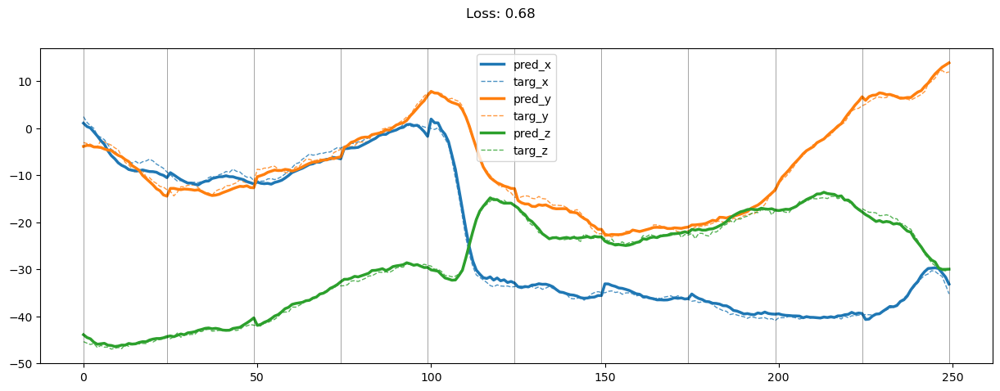

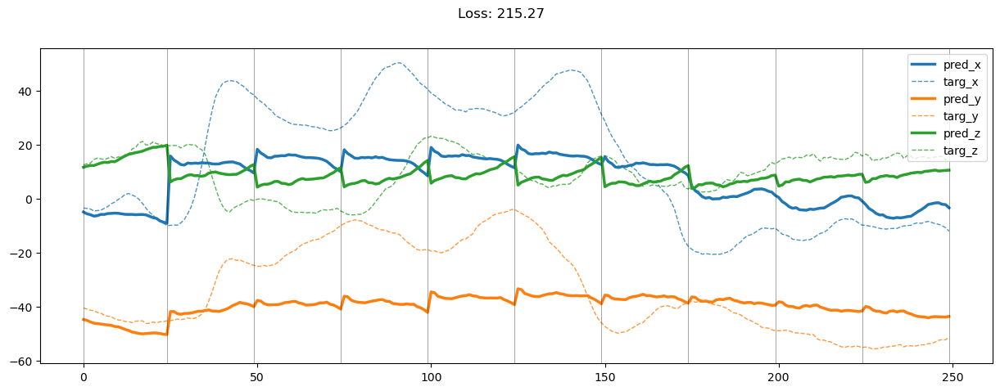

01949: train total loss:  0.845, pred loss:  0.845, valid total loss:  133.464, pred loss:  133.464


100%|██████████| 6/6 [00:00<00:00, 18.07it/s]


01950: train total loss:  0.840, pred loss:  0.840, valid total loss:  135.342, pred loss:  135.342


100%|██████████| 6/6 [00:00<00:00, 20.56it/s]


01951: train total loss:  0.848, pred loss:  0.848, valid total loss:  133.883, pred loss:  133.883


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01952: train total loss:  0.836, pred loss:  0.836, valid total loss:  133.731, pred loss:  133.731


100%|██████████| 6/6 [00:00<00:00, 19.59it/s]


01953: train total loss:  0.852, pred loss:  0.852, valid total loss:  134.378, pred loss:  134.378


100%|██████████| 6/6 [00:00<00:00, 20.42it/s]


01954: train total loss:  0.857, pred loss:  0.857, valid total loss:  131.336, pred loss:  131.336


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


01955: train total loss:  0.876, pred loss:  0.876, valid total loss:  134.151, pred loss:  134.151


100%|██████████| 6/6 [00:00<00:00, 19.36it/s]


01956: train total loss:  0.871, pred loss:  0.871, valid total loss:  134.449, pred loss:  134.449


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01957: train total loss:  0.853, pred loss:  0.853, valid total loss:  134.233, pred loss:  134.233


100%|██████████| 6/6 [00:00<00:00, 19.26it/s]


01958: train total loss:  0.855, pred loss:  0.855, valid total loss:  134.602, pred loss:  134.602


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


01959: train total loss:  0.889, pred loss:  0.889, valid total loss:  132.679, pred loss:  132.679


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01960: train total loss:  0.857, pred loss:  0.857, valid total loss:  133.409, pred loss:  133.409


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


01961: train total loss:  0.851, pred loss:  0.851, valid total loss:  133.874, pred loss:  133.874


100%|██████████| 6/6 [00:00<00:00, 19.16it/s]


01962: train total loss:  0.851, pred loss:  0.851, valid total loss:  135.286, pred loss:  135.286


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01963: train total loss:  0.876, pred loss:  0.876, valid total loss:  134.395, pred loss:  134.395


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01964: train total loss:  0.854, pred loss:  0.854, valid total loss:  134.957, pred loss:  134.957


100%|██████████| 6/6 [00:00<00:00, 20.58it/s]


01965: train total loss:  0.877, pred loss:  0.877, valid total loss:  132.751, pred loss:  132.751


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01966: train total loss:  0.878, pred loss:  0.878, valid total loss:  131.577, pred loss:  131.577


100%|██████████| 6/6 [00:00<00:00, 20.53it/s]


01967: train total loss:  0.889, pred loss:  0.889, valid total loss:  132.348, pred loss:  132.348


100%|██████████| 6/6 [00:00<00:00, 20.47it/s]


01968: train total loss:  0.890, pred loss:  0.890, valid total loss:  132.266, pred loss:  132.266


100%|██████████| 6/6 [00:00<00:00, 20.51it/s]


01969: train total loss:  0.890, pred loss:  0.890, valid total loss:  132.734, pred loss:  132.734


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01970: train total loss:  0.876, pred loss:  0.876, valid total loss:  129.619, pred loss:  129.619


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01971: train total loss:  0.885, pred loss:  0.885, valid total loss:  130.608, pred loss:  130.608


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


01972: train total loss:  0.920, pred loss:  0.920, valid total loss:  131.647, pred loss:  131.647


100%|██████████| 6/6 [00:00<00:00, 20.49it/s]


01973: train total loss:  0.885, pred loss:  0.885, valid total loss:  129.669, pred loss:  129.669


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01974: train total loss:  0.885, pred loss:  0.885, valid total loss:  131.285, pred loss:  131.285


100%|██████████| 6/6 [00:00<00:00, 20.37it/s]


01975: train total loss:  0.881, pred loss:  0.881, valid total loss:  132.533, pred loss:  132.533


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01976: train total loss:  0.886, pred loss:  0.886, valid total loss:  132.075, pred loss:  132.075


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01977: train total loss:  0.874, pred loss:  0.874, valid total loss:  132.905, pred loss:  132.905


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01978: train total loss:  0.858, pred loss:  0.858, valid total loss:  130.331, pred loss:  130.331


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01979: train total loss:  0.863, pred loss:  0.863, valid total loss:  133.231, pred loss:  133.231


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01980: train total loss:  0.842, pred loss:  0.842, valid total loss:  134.079, pred loss:  134.079


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01981: train total loss:  0.852, pred loss:  0.852, valid total loss:  131.305, pred loss:  131.305


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


01982: train total loss:  0.837, pred loss:  0.837, valid total loss:  128.396, pred loss:  128.396


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


01983: train total loss:  0.828, pred loss:  0.828, valid total loss:  130.108, pred loss:  130.108


100%|██████████| 6/6 [00:00<00:00, 20.50it/s]


01984: train total loss:  0.818, pred loss:  0.818, valid total loss:  132.927, pred loss:  132.927


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


01985: train total loss:  0.835, pred loss:  0.835, valid total loss:  133.489, pred loss:  133.489


100%|██████████| 6/6 [00:00<00:00, 20.02it/s]


01986: train total loss:  0.835, pred loss:  0.835, valid total loss:  132.024, pred loss:  132.024


100%|██████████| 6/6 [00:00<00:00, 20.16it/s]


01987: train total loss:  0.852, pred loss:  0.852, valid total loss:  132.847, pred loss:  132.847


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01988: train total loss:  0.853, pred loss:  0.853, valid total loss:  133.186, pred loss:  133.186


100%|██████████| 6/6 [00:00<00:00, 20.43it/s]


01989: train total loss:  0.869, pred loss:  0.869, valid total loss:  131.780, pred loss:  131.780


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01990: train total loss:  0.852, pred loss:  0.852, valid total loss:  133.014, pred loss:  133.014


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01991: train total loss:  0.833, pred loss:  0.833, valid total loss:  132.794, pred loss:  132.794


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01992: train total loss:  0.884, pred loss:  0.884, valid total loss:  131.234, pred loss:  131.234


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01993: train total loss:  0.862, pred loss:  0.862, valid total loss:  130.610, pred loss:  130.610


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01994: train total loss:  0.864, pred loss:  0.864, valid total loss:  130.965, pred loss:  130.965


100%|██████████| 6/6 [00:00<00:00, 20.49it/s]


01995: train total loss:  0.861, pred loss:  0.861, valid total loss:  129.664, pred loss:  129.664


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01996: train total loss:  0.839, pred loss:  0.839, valid total loss:  134.031, pred loss:  134.031


100%|██████████| 6/6 [00:00<00:00, 20.15it/s]


01997: train total loss:  0.888, pred loss:  0.888, valid total loss:  133.709, pred loss:  133.709


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01998: train total loss:  0.848, pred loss:  0.848, valid total loss:  133.175, pred loss:  133.175


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


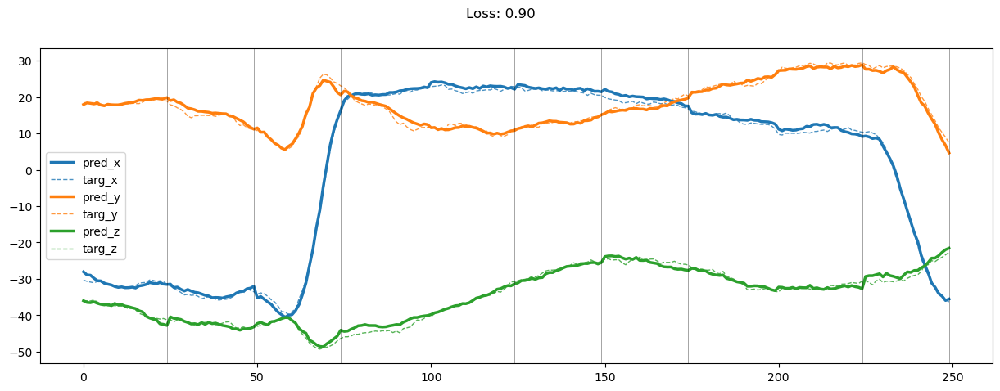

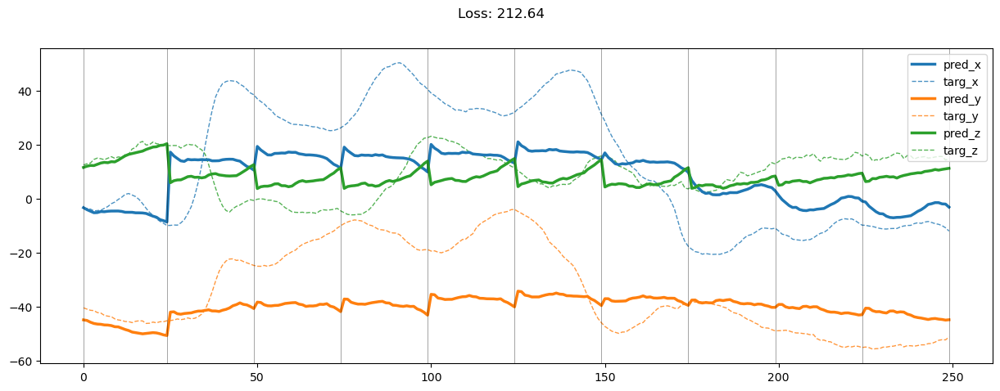

01999: train total loss:  0.835, pred loss:  0.835, valid total loss:  131.865, pred loss:  131.865


In [25]:
draw = True

for epoch in range(EPOCH):
    #####
    # 1. 用上半部訓練50epoch
    # 2. 隨機用上或下半部訓練Model
    # 3. 印出trajectory結果
    #####
    
    if (epoch + 1) % 50 == 0:
        draw = True
    
    train_loss, train_pred_loss = train(model, train_loader, optimizer, draw)
    valid_loss, valid_pred_loss = evalute(model, valid_loader, draw)
    
    draw = False
    
    ep = str(epoch).zfill(5)
    print(f'{ep}: train total loss: {train_loss: 2.3f}, pred loss: {train_pred_loss: 2.3f}, valid total loss: {valid_loss: 2.3f}, pred loss: {valid_pred_loss: 2.3f}')

In [26]:
def output_eval(model, dataloader):
    model.eval()
    
    results = []
    
    with torch.no_grad():
        for source_data, source_label, target_data, target_label in dataloader:
            source_data = source_data.to(device)
            target_data = target_data.to(device)

            #############
            # generator #
            #############
            predict_mag = model(source_data[:, :, :, 9:12])

            predict_loss = mse_loss(predict_mag, target_data[:, :, :, 9:12])
            
            results.extend(zip(predict_mag.detach().cpu().numpy(), target_data[:, :, :, 9:12].cpu().numpy()))
            
            break
    
    return np.array(results)

In [44]:
def plot_result(result):
    pred_mag = result[0].reshape(-1, 3)
    targ_mag = result[1].reshape(-1, 3)
    x = np.arange(len(pred_mag))
    
    loss = mse_loss(torch.tensor(pred_mag), torch.tensor(targ_mag)).item()
    
    fig = plt.figure(figsize=(15, 5))
    
    for pm, tm, caxis, color in zip(pred_mag.T, targ_mag.T, ['x', 'y', 'z'], ['tab:blue', 'tab:orange', 'tab:green']):
        plt.plot(x, pm, label=f'pred_{caxis}', color=color, linewidth=2.5, zorder=2)
        plt.plot(x, tm, '--', label=f'targ_{caxis}', color=color, linewidth=1, alpha=0.8, zorder=1)
    
    for i in range(0, chunk_size+1):
        plt.axvline(x=int(i * seq_len - 0.5), linewidth=0.5, linestyle='-', color='k', alpha=0.5)
    
    plt.suptitle(f'Loss: {loss:.2f}')
    plt.legend()
    plt.show()

(32, 2, 10, 25, 3)


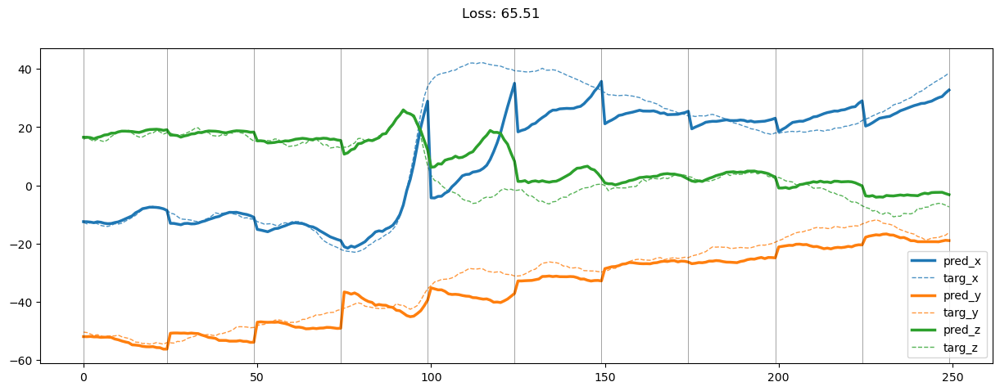

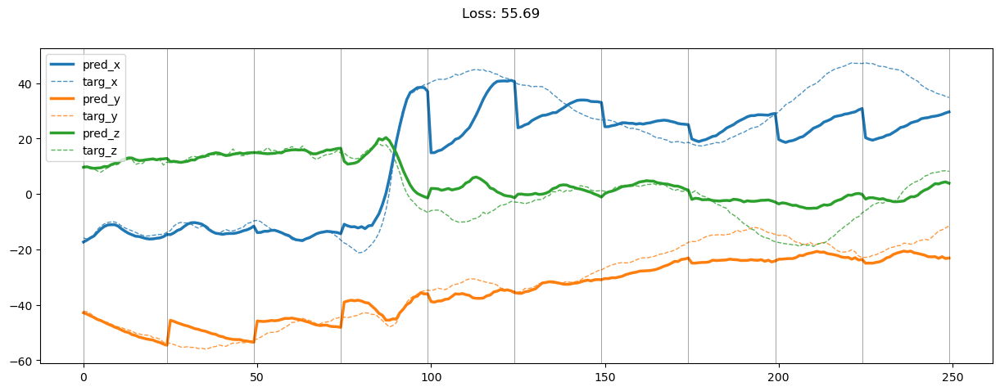

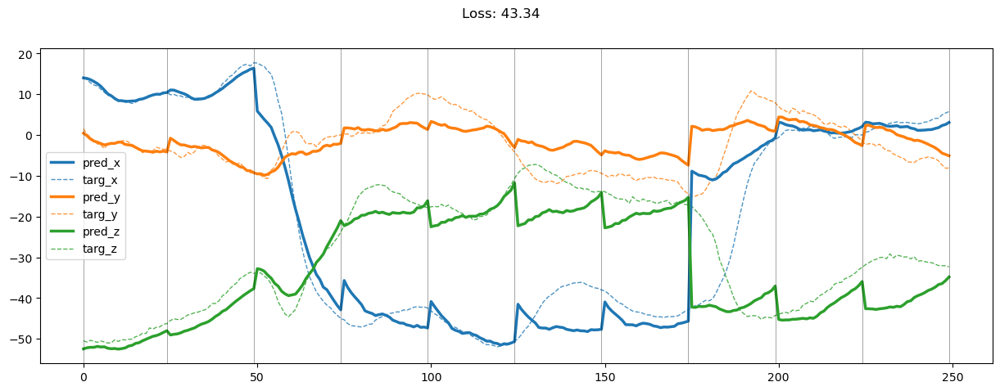

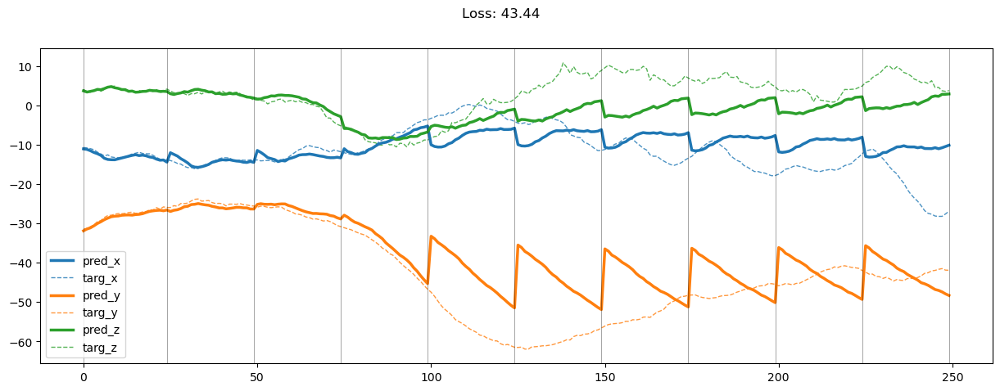

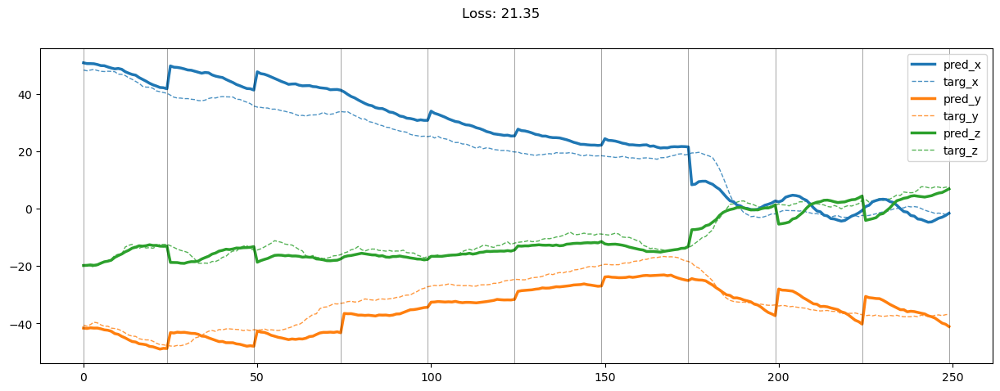

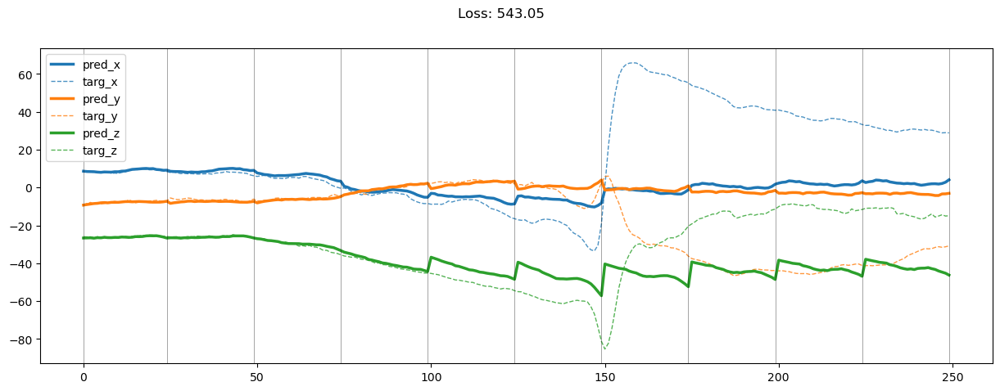

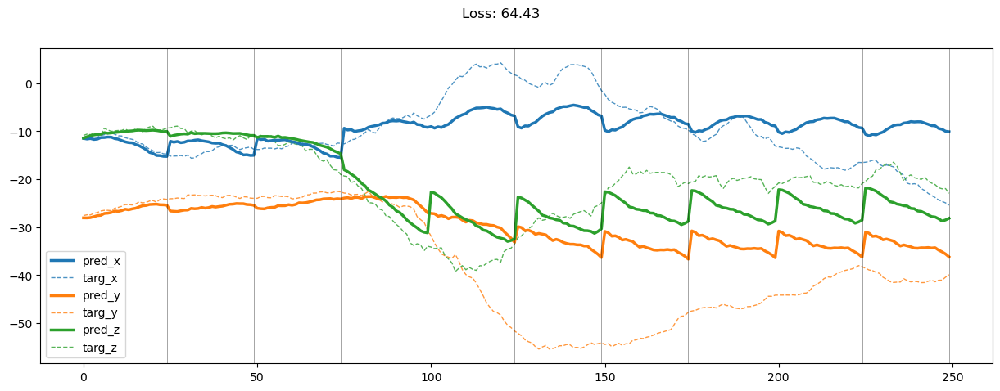

In [45]:
results = output_eval(model, train_loader)

print(results.shape)

for rs in results[::5]:
    plot_result(rs)

(32, 2, 10, 25, 3)


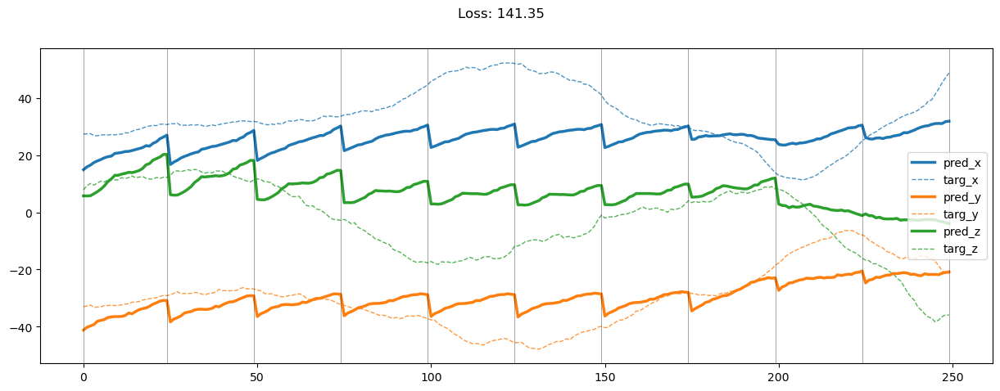

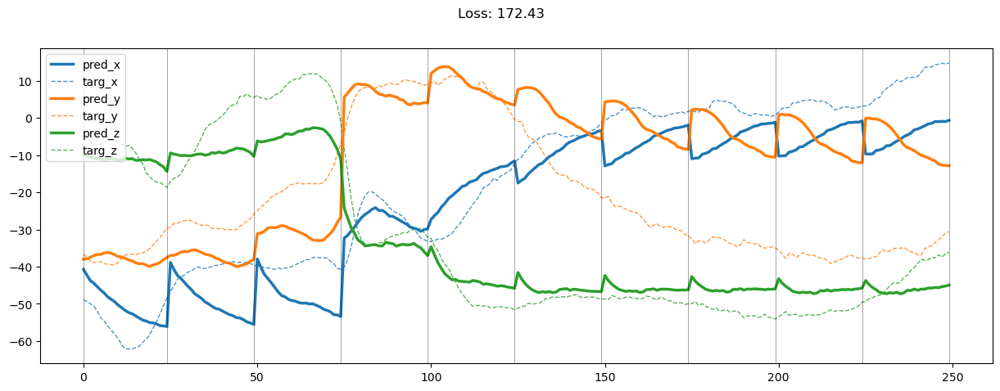

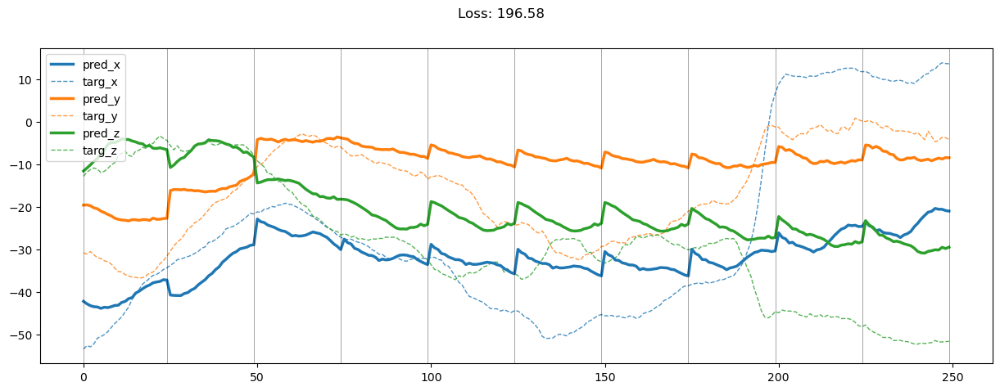

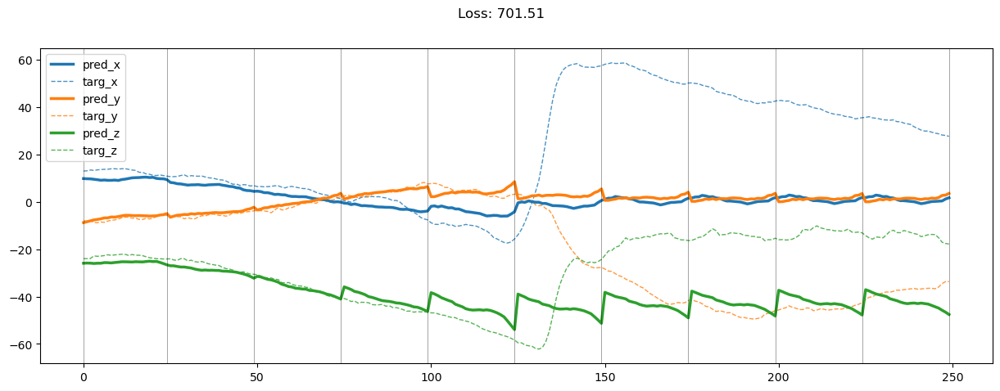

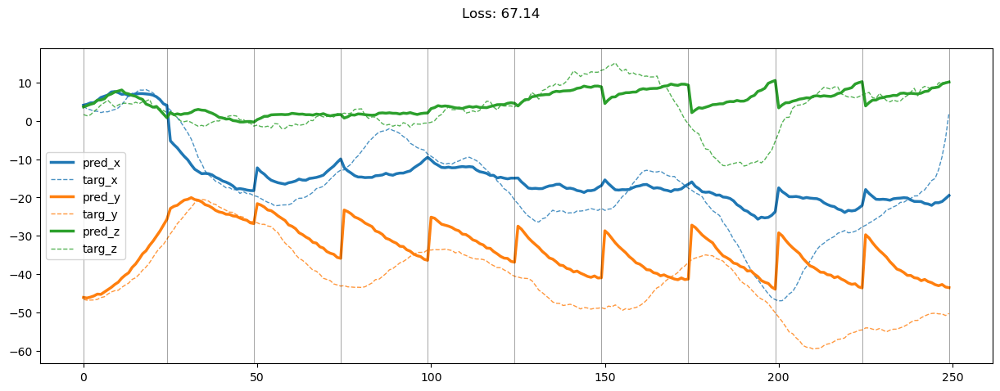

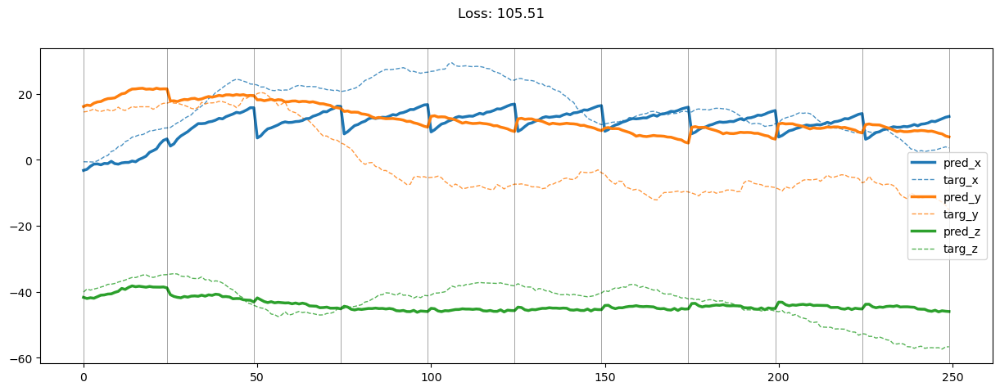

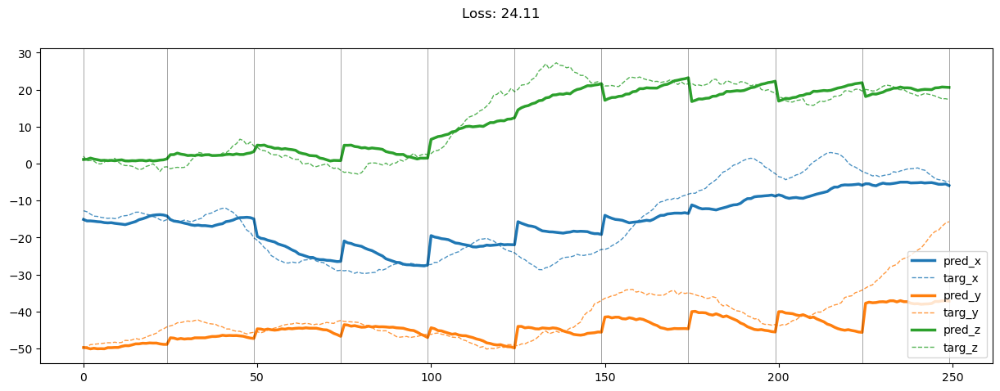

In [46]:
results = output_eval(model, valid_loader)

print(results.shape)

for rs in results[::5]:
    plot_result(rs)